In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats as stats
from numpy import linalg
import matplotlib as mpl
from keras.models import load_model

Using TensorFlow backend.


In [3]:
import geopandas as gpd

In [4]:
import seaborn as sns
sns.set(style="whitegrid")

In [5]:
u = gpd.read_file("uk_covid.geojson").set_index("code")
d = pd.read_csv('uk_demographics.csv').set_index('code').loc[:,['0-29','30-59','60-89']]
uk = u.join(d)

In [6]:
london = uk[uk.index.str.contains("E09")]

In [7]:
def geoplot(df, variable, title=None, cmap='YlGn', log=False, vmin=None, vmax=None, save=None):
    umax = df[variable].max()
    umin = df[variable].min()

    if vmin is not None:
        umin = vmin
    if vmax is not None:
        umax = vmax

    tmp = df.copy()
    tmp['Y'] = tmp[variable].clip(lower=umin, upper=umax)
    
    if log:
        wmin = np.log(umin)
        wmax = np.log(umax)
    else:
        wmin = umin
        wmax = umax

    print(umin, wmin)
    print(umax, wmax)

    fig, ax = plt.subplots(1, figsize=(8, 6), dpi=150)
    if not log:
        tmp.plot(column=variable, cmap=cmap, vmin=wmin, vmax=wmax, ax=ax, linewidth=0.125, edgecolor='0.0')
    else:
        tmp['logY'] = df[variable].map(np.log)
        tmp.plot(column='logY', cmap=cmap, vmin=wmin, vmax=wmax, ax=ax, linewidth=0.125, edgecolor='0.0')
    ax.axis('off')

    if log:
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=mpl.colors.LogNorm(vmin=umin, vmax=umax))
    else:
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=umin, vmax=umax))

    sm._A = []
    cbar = fig.colorbar(sm)
    
    if title is not None:
        plt.title(title)

    if save is not None:
        plt.savefig(save, figsize=(8,6), dpi=300, bbox_inches="tight")
    else:
        plt.show()

0.0 0.0
104.31597388119127 104.31597388119127


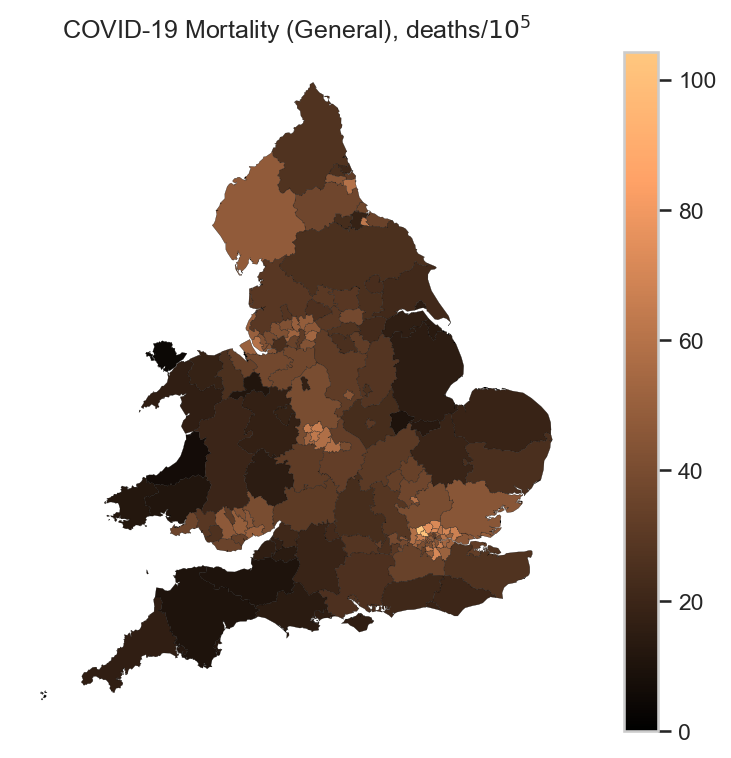

In [8]:
geoplot(uk, 'd_general', title="COVID-19 Mortality (General), deaths/$10^5$", cmap="copper", save="uk-mortality-general.jpg")

0 0
110 110


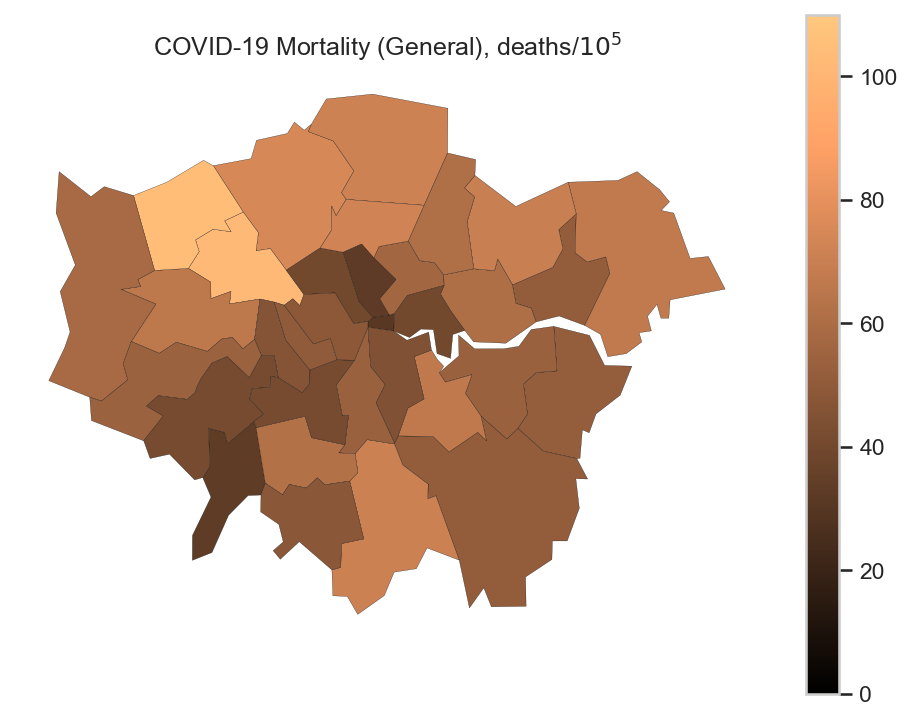

In [9]:
geoplot(london, 'd_general', title="COVID-19 Mortality (General), deaths/$10^5$", cmap="copper", vmin=0, vmax=110,save='London-mortality-general.jpg')


25000.0 10.126631103850338
1581555.0 14.273919098233469


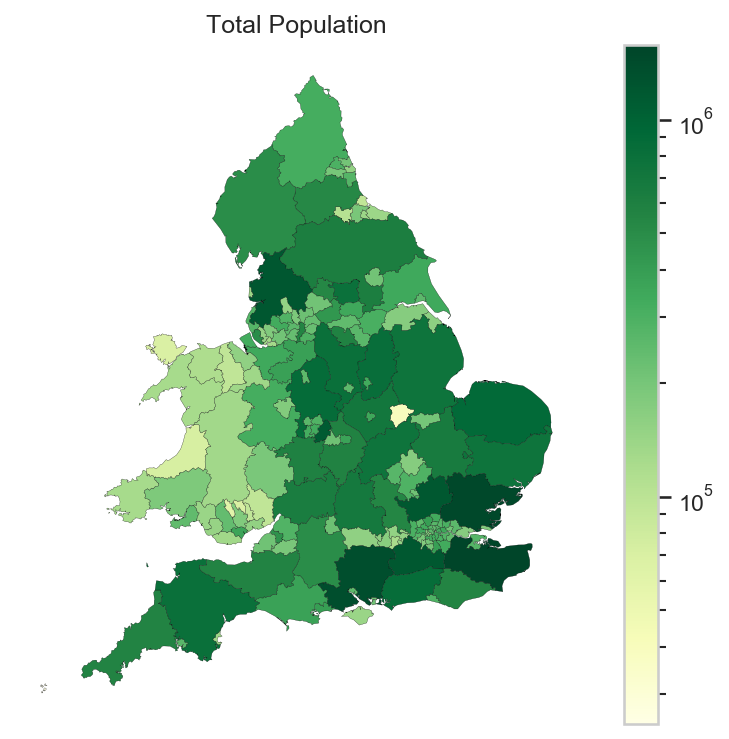

In [10]:
geoplot(uk, 'population', title='Total Population',log=True, vmin=2.5E4, save="uk-demographics-population-total.jpg")

9721.0 9721.0
395869.0 395869.0


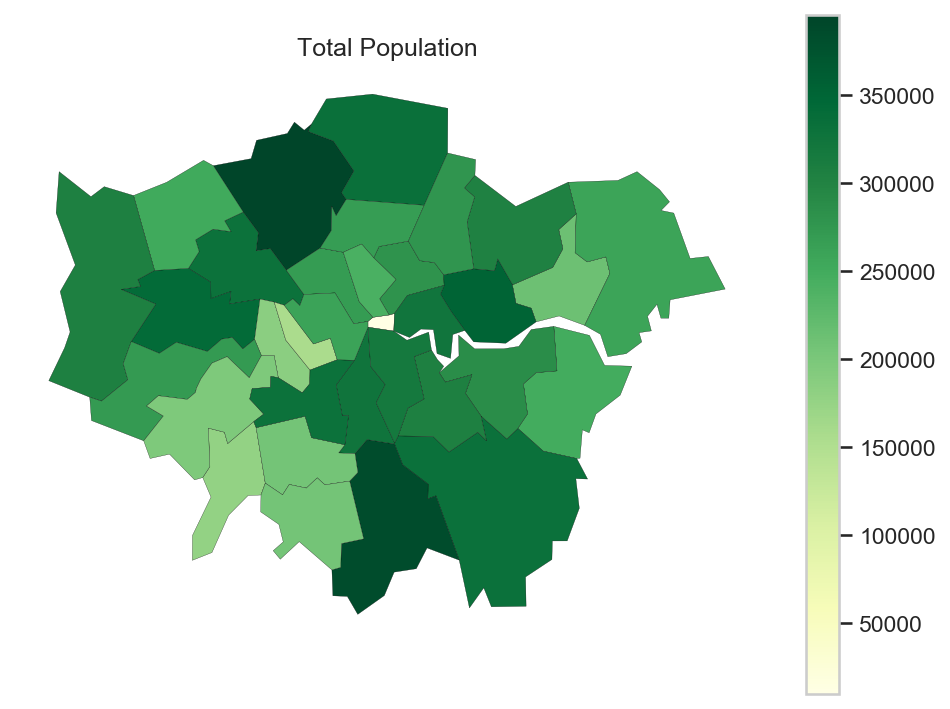

In [11]:
geoplot(london, 'population', title='Total Population',save='London-total-population.jpg')

25.474662651251325 3.237684336675723
16613.57091512826 9.71797516536081


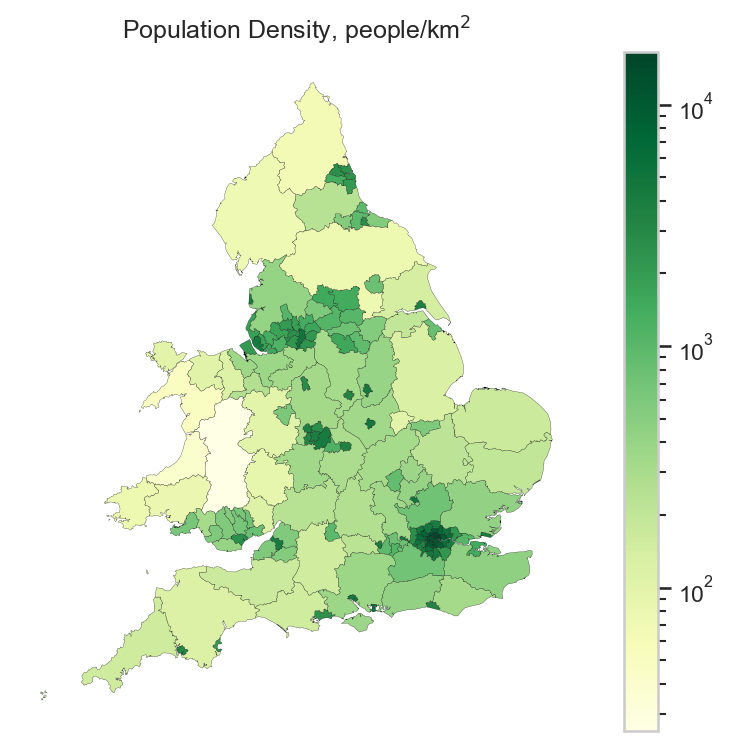

In [12]:
geoplot(uk, "dPOP", title="Population Density, people/km$^2$", log=True,save="uk-population-density.jpg")

2212.6503292600887 2212.6503292600887
16613.57091512826 16613.57091512826


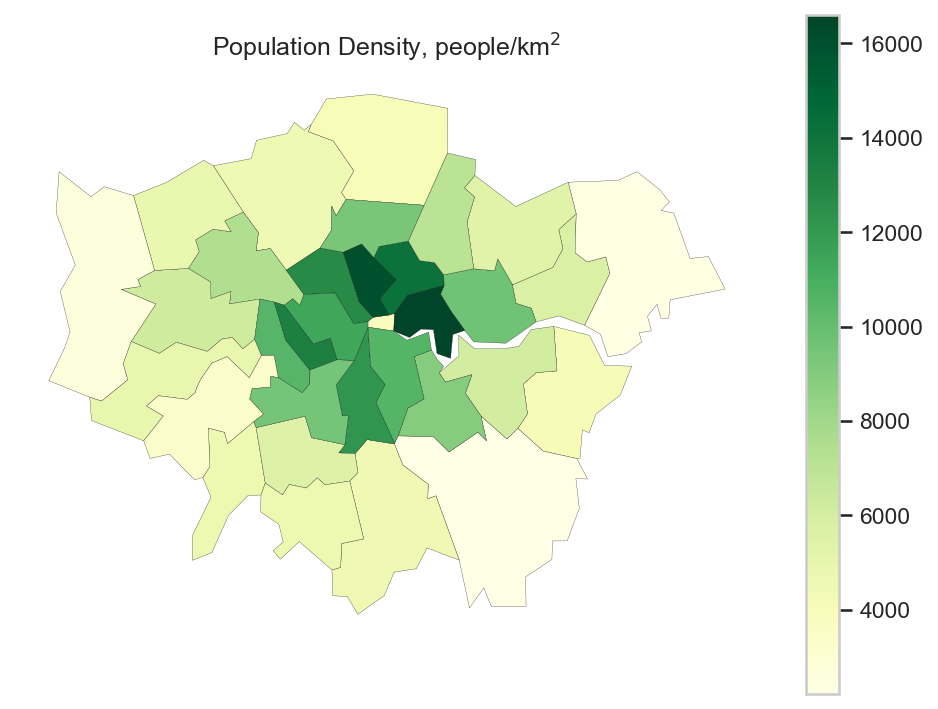

In [13]:
geoplot(london, 'dPOP', title='Population Density, people/km$^2$',save='London-population-density.jpg')

1.9879927676479576 1.9879927676479576
3.478501561284095 3.478501561284095


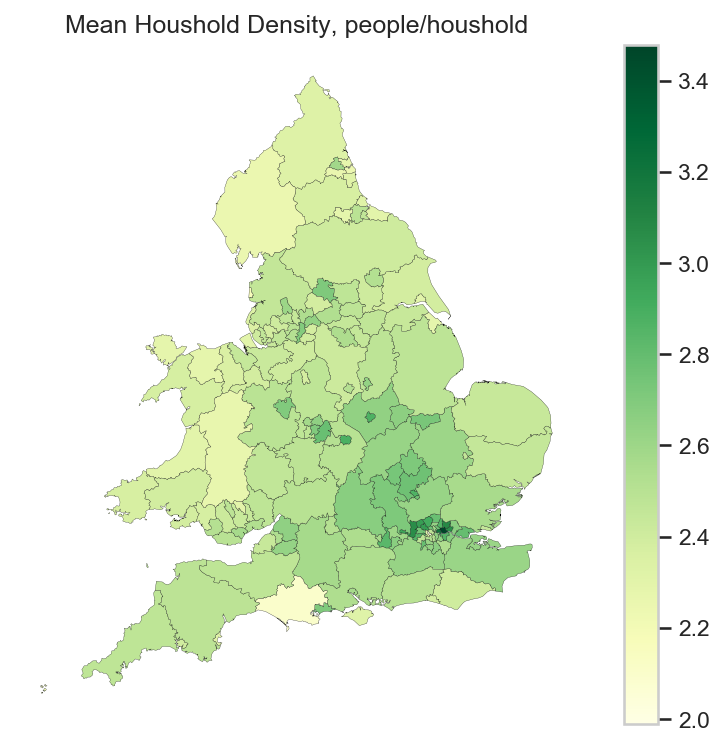

In [14]:
geoplot(uk, "dHHS", title="Mean Houshold Density, people/houshold", save="uk-household-size.jpg")

0.2796762589928057 0.2796762589928057
0.5062150796034846 0.5062150796034846


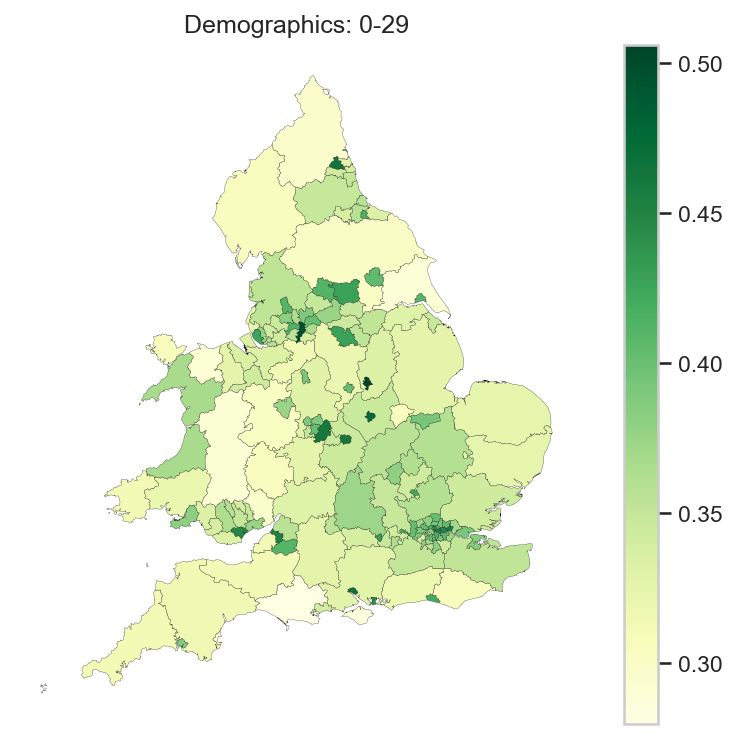

In [15]:
geoplot(uk, '0-29', title='Demographics: 0-29', save="uk-demographics-0-29.jpg")

0.3087282481601211 0.3087282481601211
0.4784006829823563 0.4784006829823563


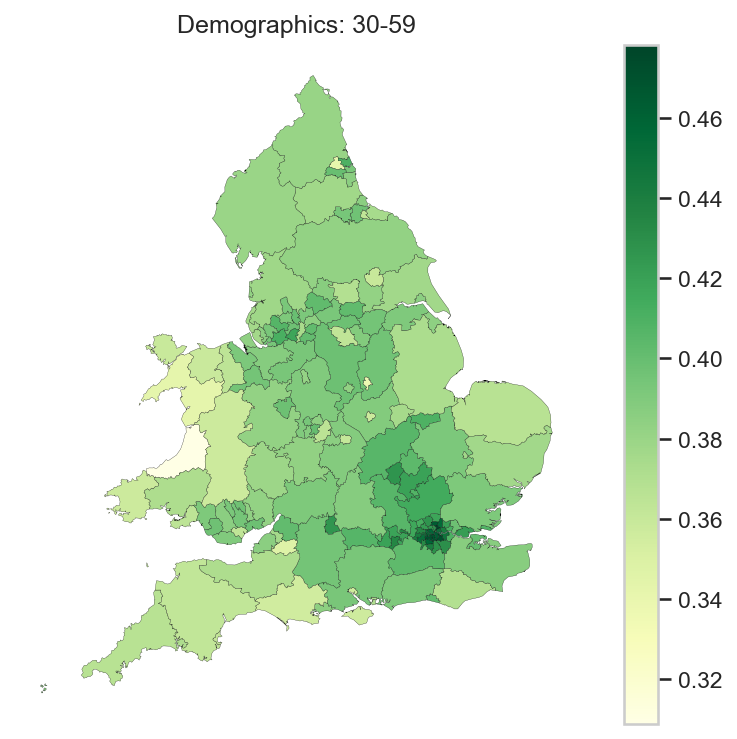

In [16]:
geoplot(uk, '30-59', title='Demographics: 30-59', save="uk-demographics-30-59.jpg")

0.09038476342976798 0.09038476342976798
0.3482885434389762 0.3482885434389762


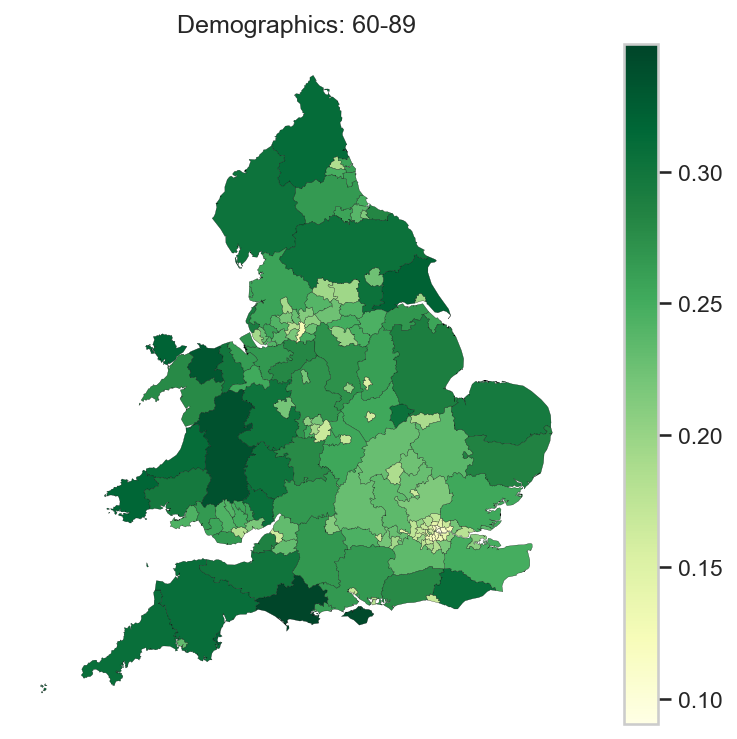

In [17]:
geoplot(uk, '60-89', title='Demographics: 60-89', save="uk-demographics-60-89.jpg")

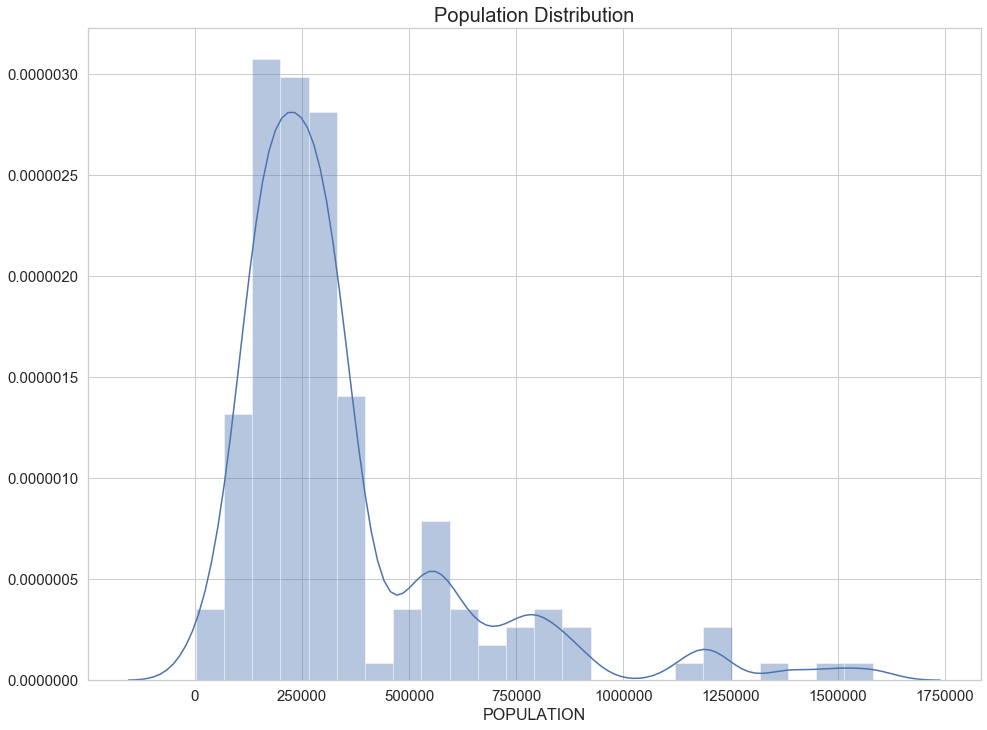

In [18]:

plt.figure(figsize=(16,12))
ax = sns.distplot(uk['population'])
ax.tick_params(labelsize=15)
plt.xlabel('POPULATION',fontsize=16)
ax.set_title("Population Distribution",fontsize=20)
plt.savefig('Population Distribution.jpg',figsize=(16,12), dpi=300)

In [19]:
def corrplot(data, x, y, xlim=None, ylim=None, xlabel=None, ylabel=None, save=None, quantiles=False):
    df = data.copy()
    if quantiles:
        df[x] = df[x].rank(method="average", pct=True)
        df[y] = df[y].rank(method="average", pct=True)
        
    if xlim is None:
        xmin = df[x].min()
        xmax = df[x].max()
        xlim = (xmin,xmax)
    
    if ylim is None:
        ymin = df[y].min()
        ymax = df[y].max()
        ylim = (ymin,ymax)
    
    g = sns.jointplot(x, y, data=df,
                      kind="reg", truncate=False,
                      xlim=xlim, ylim=ylim,
                      height=7, space=1)
    
    if xlabel is not None:
        plt.xlabel(xlabel)
        
    if ylabel is not None:
        plt.ylabel(ylabel)
        
    r, p = stats.pearsonr(data[x],data[y])
    p_str = f'= {p:.5f}' if p >= 1E-5 else "< 0.00001"
    plt.title(f"$r^2 = {r**2:.5f}$, $p {p_str}$", y=1.3, fontsize = 16)
        
    if save is not None:
        plt.savefig(save, figsize=(8,8), dpi=300, bbox_inches="tight")
    else:
        plt.show()

In [20]:
def corrfit(data, X, Y, xlabel=None, ylabel=None, log=(False, False), xlim=None, ylim=None, size=None, save=None):
    df = data.loc[:,[X,Y]]

    if log[0]:
        U = f"log({X})"
        xlabel = f"log: {xlabel}"
        df[U] = df[X].map(np.log)
    else:
        U = X

    if log[1]:
        V = f"log({Y})"
        ylabel = f"log: {ylabel}"
        df[V] = df[Y].map(np.log)
    else:
        V = Y

    r = stats.linregress(df[U], df[V])
    df['fit'] = (r.intercept + r.slope*df[U])
    df['residuals'] = df[V]  - df.fit
    df['scaled_residuals'] = df.residuals/df.fit

    dfBULK = df[df.scaled_residuals.abs() <= 2*df.scaled_residuals.std()]
    dfOUT = df[df.scaled_residuals.abs() > 2*df.scaled_residuals.std()]

    if xlim is None:
        xmin = df[U].min()
        xmax = df[U].max()
        xwidth = xmax - xmin
        xmax = xmax + 0.05*xwidth
        xmin = xmin - 0.05*xwidth
        xlim = (xmin,xmax)

    if ylim is None:
        ymin = df[V].min()
        ymax = df[V].max()
        ywidth = ymax - ymin
        ymax = ymax + 0.05*ywidth
        ymin = ymin - 0.05*ywidth
        ylim = (ymin,ymax)

    #print(size, data.columns)
    if size is not None:
        if size not in df.columns:
            if size not in data.columns:
                size = None
            else:
                df[size] = data[size]
    #print('Size:', size, df[size].min(), df[size].max())
        
    df['Outlier'] = df.scaled_residuals.abs() > 2*df.scaled_residuals.std()

    g0 = sns.jointplot(U, V, data=dfBULK,
                      kind="reg", 
                      marker="o",
                      xlim=xlim, ylim=ylim,
                      scatter=False,
                      height=7)    
    g1 = sns.scatterplot(U, V, data=df, hue="Outlier",
                         size=size, sizes=(25,200),
                         alpha=0.75, 
                         marker="o", edgecolor="k",
                         ax=g0.ax_joint)
    #g2 = sns.scatterplot(U, V, data=dfOUT, size="dPOP",
    #                    color="orange", marker="o", edgecolor="k",
    #                    ax=g0.ax_joint)

    if xlabel is not None:
        plt.xlabel(xlabel)

    if ylabel is not None:
        plt.ylabel(ylabel)

    r, p = stats.pearsonr(dfBULK[U],dfBULK[V])
    p_str = f'= {p:.5f}' if p >= 1E-5 else "< 0.00001"
    plt.title(f"$r^2 = {r**2:.5f}$, $p {p_str}$", pad=-5, fontsize = 12)
    if save is not None:
        plt.savefig(save, figsize=(8,8), dpi=300, bbox_inches="tight")
        plt.show()
    else:
        plt.show()
    
    return stats.linregress(dfBULK[U], dfBULK[V])

In [21]:
u = gpd.read_file("uk_covid.geojson").set_index("code")
d = pd.read_csv('uk_demographics.csv').set_index('code').loc[:,['0-29','30-59','60-89']]
uk = u.join(d)

In [22]:
eth_df = pd.read_csv('ethnic-population.csv').rename(columns={
        'local authority: county / unitary (prior to April 2015)': 'name',
        'Ethnicity': 'ethnicity',
        'Value': 'value',
        'Ethnicity_type': 'level'
    }).drop(columns=['Measure','Value_type','Source','Time','Geography'])
v = uk.reset_index().set_index('name').code.to_frame()
eth_df = v.join(eth_df.set_index('name')).dropna().reset_index().set_index(['code']).sort_index()

In [23]:
indian_eth = eth_df[eth_df['ethnicity'] == 'Asian/Asian British: Indian']
pakistani_eth = eth_df[eth_df['ethnicity'] == 'Asian/Asian British: Pakistani']
Bangladeshi_eth = eth_df[eth_df['ethnicity'] == 'Asian/Asian British: Bangladeshi']

In [24]:
ethnicity_df = pd.DataFrame()
ethnicity_df['Indian'] = indian_eth['value']
ethnicity_df['Pakistani'] = pakistani_eth['value']
ethnicity_df['Bangladeshi'] = Bangladeshi_eth['value']

In [25]:
uk = uk.join(ethnicity_df).fillna(0)

0.0 0.0
28.3 28.3


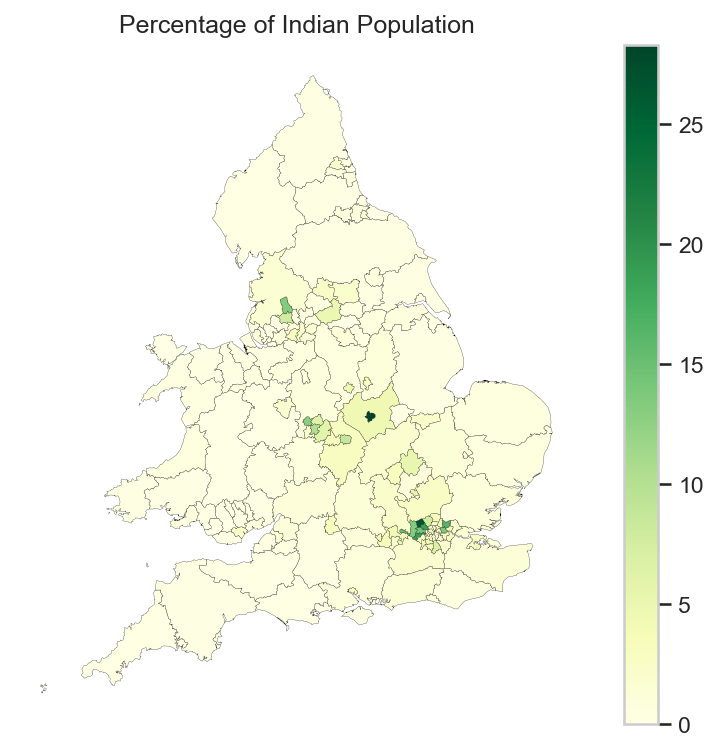

In [26]:
geoplot(uk, 'Indian', title='Percentage of Indian Population',save='Indian-population.jpg')

0.0 0.0
20.4 20.4


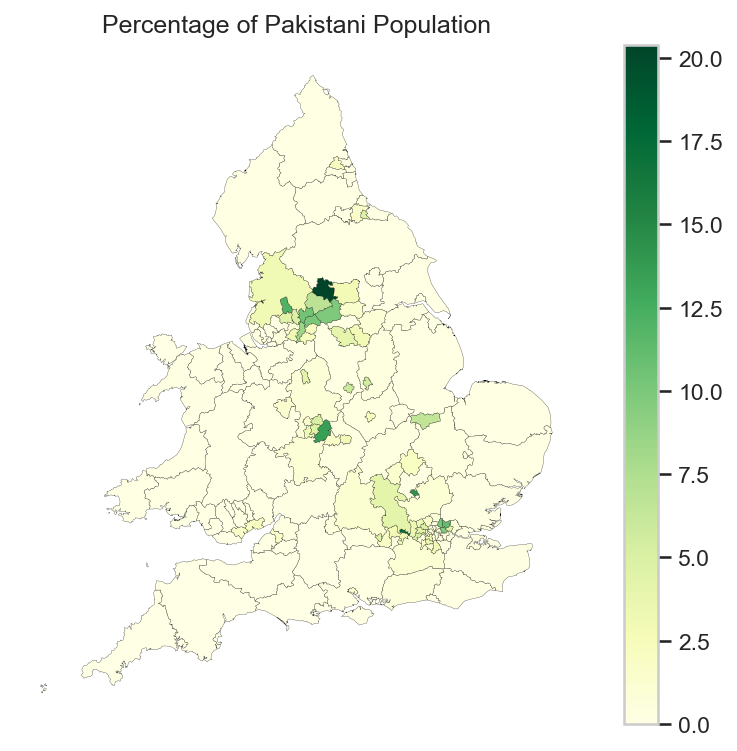

In [27]:
geoplot(uk, 'Pakistani', title='Percentage of Pakistani Population',save='Pakistani-population.jpg')

0.0 0.0
32.0 32.0


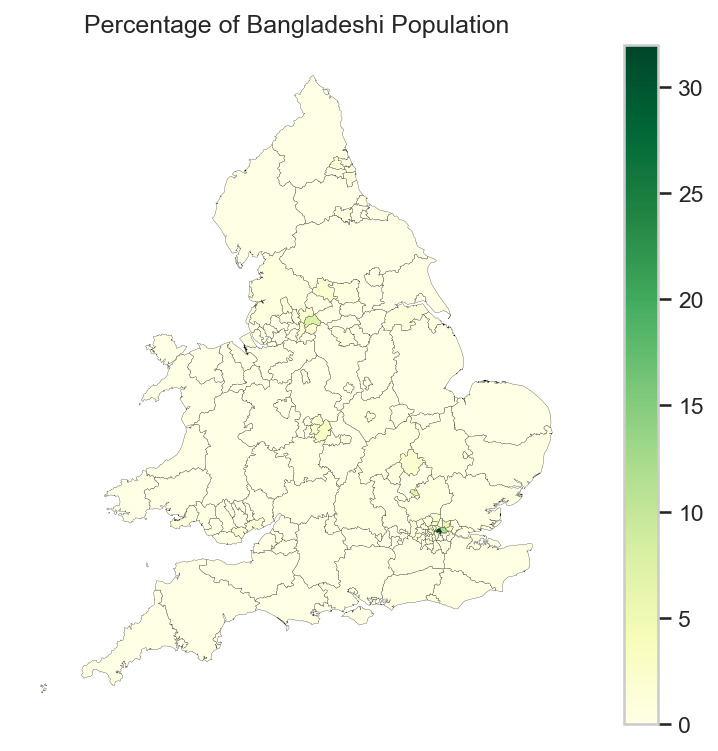

In [28]:
geoplot(uk, 'Bangladeshi', title='Percentage of Bangladeshi Population',save='Bangladeshi-population.jpg')

In [29]:
def scale(X):
    return (X - X.mean())/X.std()

In [35]:
df = uk.loc[:,['population','dPOP','dHHS','1','2','3','4','5','6','7','8','households',"d_general", "0-29", "30-59", "60-89","Indian","Pakistani","Bangladeshi"]].copy()
df['logPOP'] = scale(df['population'].map(np.log))
df['dPOP'] = scale((df['dPOP']).map(np.log))
df['dHHS'] = scale(df['dHHS'])
df['0-29'] = scale(df['0-29'])
df['30-59'] = scale(df['30-59'])
df['60-89'] = scale(df['60-89'])
df['d1'] = scale((df['1']/df['households']))
df['d2'] = scale((df['2']/df['households']))
df['d3'] = scale((df['3']/df['households']))
df['d4'] = scale((df['4']/df['households']))
df['d5'] = scale((df['5']/df['households']))
df['d6'] = scale((df['6']/df['households']))
df['d7'] = scale((df['7']/df['households']))
df['d8'] = scale((df['8']/df['households']))
df['Indian'] = scale((df['Indian']+1E-5).map(np.log))
df['Pakistani'] = scale((df['Pakistani']+1E-5).map(np.log))
df['Bangladeshi'] = scale((df['Bangladeshi']+1E-5).map(np.log))
df4 = df.loc[:,['logPOP','dPOP','dHHS','d1','d2','d3','d4','d5','d6','d7','d8',"0-29", "30-59", "60-89",'Indian',"Pakistani","Bangladeshi"]]

In [36]:
corr1 = df4.corr()
corr1.to_csv('Heatmap_of_input_Features_with_and_eth.csv')

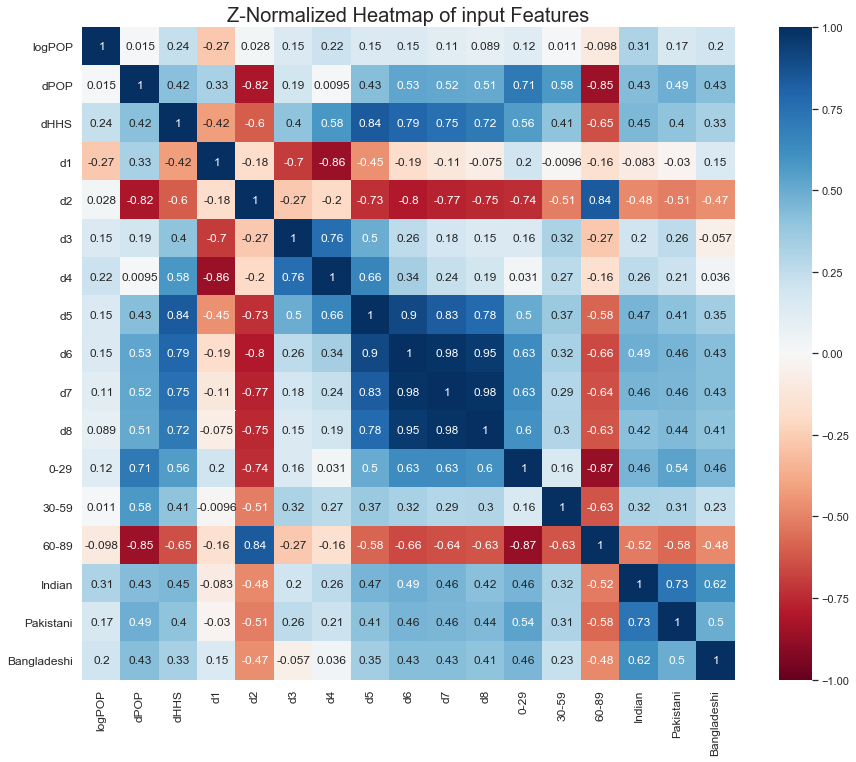

In [37]:
corr1 = df4.corr()
plt.figure(figsize=(16,12))
ax_relative = sns.heatmap(corr1, cmap="RdBu", annot=True, annot_kws={'size': 12},square=True,vmin=-1, vmax=1)
ax_relative.tick_params(labelsize=12)
ax_relative.set_title("Z-Normalized Heatmap of input Features",fontsize=20)
plt.savefig('Heatmap_of_input_Features_with_d4-5_and_eth.png',figsize=(16,12), dpi=300)

In [38]:
df = uk.loc[:,['population','dPOP','dHHS','1','2','3','4','5','6','7','8','households',"d_general", "0-29", "30-59", "60-89","Indian","Pakistani","Bangladeshi"]].copy()
df['6+'] = df['6']+df['7']+df['8']
df['logPOP'] = scale(df['population'].map(np.log))
df['dPOP'] = scale((df['dPOP']).map(np.log))
df['dHHS'] = scale(df['dHHS'])
df['0-29'] = scale(df['0-29'])
df['30-59'] = scale(df['30-59'])
df['60-89'] = scale(df['60-89'])
df['d1'] = scale((df['1']/df['households']))
df['d2'] = scale((df['2']/df['households']))
df['d3'] = scale((df['3']/df['households']))
df['d4-d5'] = scale((df['4']+df['5']/df['households']))
# df['d5'] = scale((df['5']/df['households']))
df['d6+'] = scale((df['6+']/df['households']))
df['Indian'] = scale((df['Indian']+1E-5).map(np.log))
df['Pakistani'] = scale((df['Pakistani']+1E-5).map(np.log))
df['Bangladeshi'] = scale((df['Bangladeshi']+1E-5).map(np.log))
df4 = df.loc[:,['logPOP','dPOP','dHHS','d1','d2','d3','d4-d5','d6+',"0-29", "30-59", "60-89","Indian","Pakistani","Bangladeshi"]]

In [39]:
corr1 = df4.corr()
corr1.to_csv('Heatmap_of_input_Features_with_H6+_and_d4-5_and_eth2.csv')

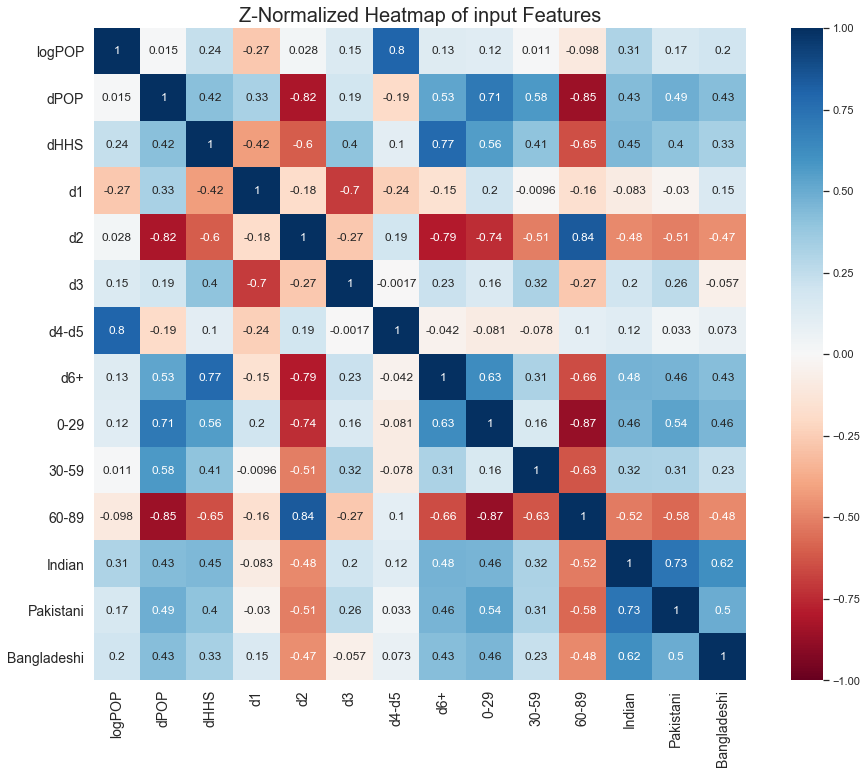

In [43]:
corr1 = df4.corr()
plt.figure(figsize=(16,12))
ax = sns.heatmap(corr1, cmap="RdBu", annot=True, annot_kws={'size': 12},square=True,vmin=-1, vmax=1)
ax.tick_params(axis='x',labelrotation=90)
ax.tick_params(axis='y',labelrotation=0)
ax.tick_params(labelsize=14)
ax.set_title("Z-Normalized Heatmap of input Features",fontsize=20)
plt.savefig('Heatmap_of_input_Features_with_H6+and_d4-5_and_log(eth).png',figsize=(16,12), dpi=300)

Eigenvalues [6.39036401e+00 2.62715154e+00 1.36512691e+00 9.33054402e-01
 7.58275511e-01 6.59709524e-01 4.07856168e-01 2.97261395e-01
 2.24828494e-01 8.45341940e-02 1.18298182e-01 1.33367836e-01
 1.71837482e-04 1.48493059e-16]
PCA0:  0.41743602695849763 8.090132269485414e-22


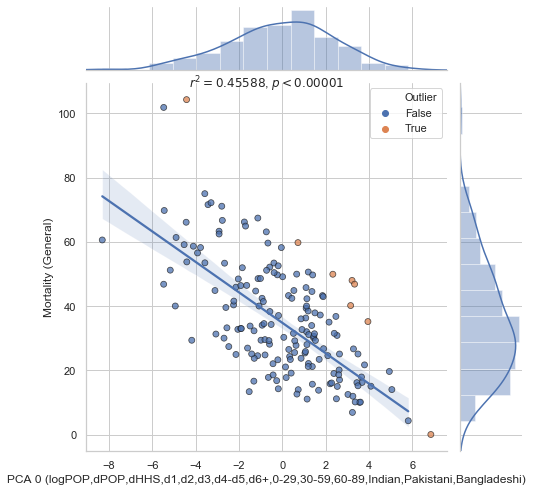

PCA1:  0.0037336415903382303 0.424515627741285
PCA2:  0.037982409130419115 0.010184801426122013


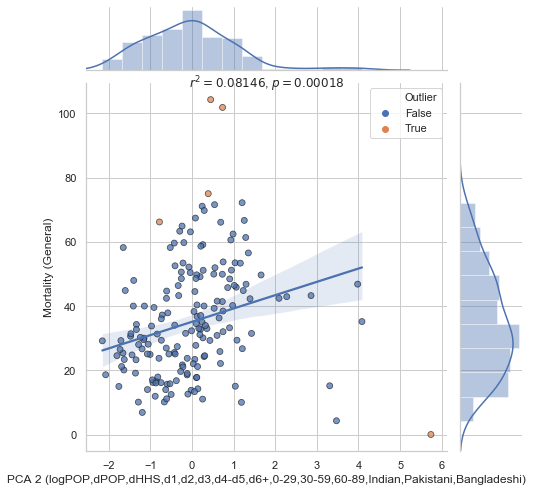

PCA3:  0.030290993520986468 0.022016085091228172


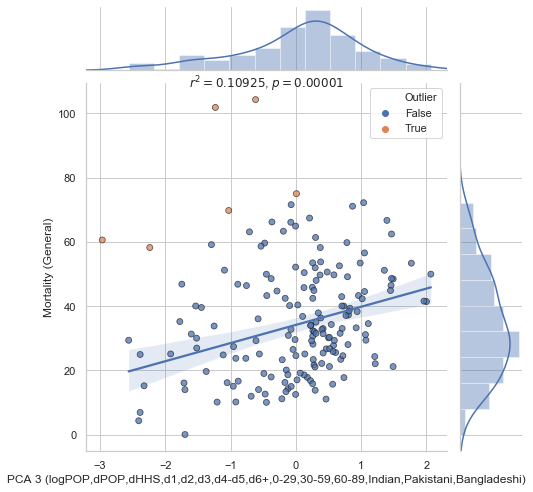

PCA4:  0.0019016523942163232 0.5688907941040797
PCA5:  0.00048208469160162317 0.7743170230458957
PCA6:  0.000329666884852515 0.8125770739378247
PCA7:  0.14691373797936286 1.9392898270426224e-07


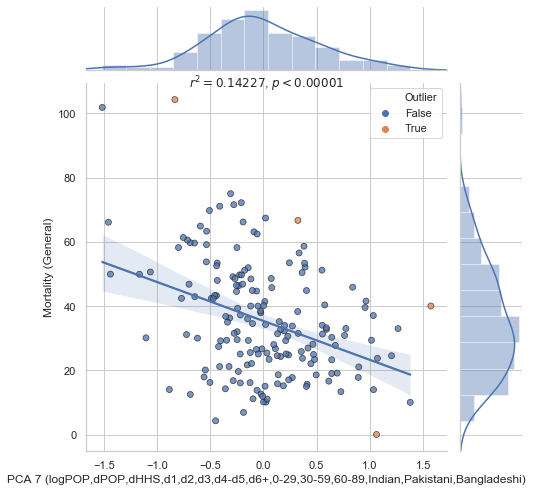

PCA8:  0.0020059149273326405 0.5584738113460274
PCA9:  0.013439930012404379 0.12878711888302688
PCA10:  0.002078340276314565 0.5514491459058062
PCA11:  0.007658618446549825 0.25224470341894245
PCA12:  0.0002959719445070187 0.8222458780420561
PCA13:  0.0011439563603801038 0.6586586256444726
['PCA0', 'PCA2', 'PCA3', 'PCA7']


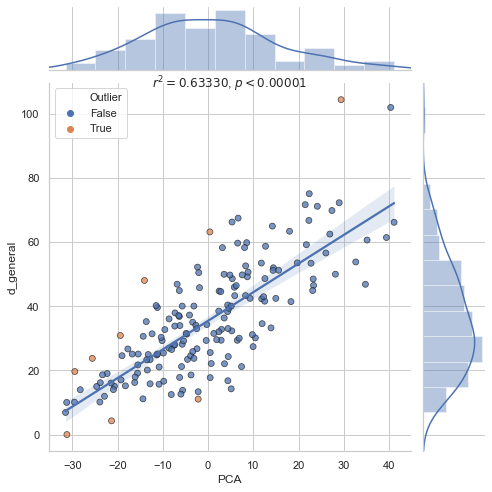

LinregressResult(slope=0.8912569006894129, intercept=35.435177549236116, rvalue=0.7958004754979153, pvalue=4.013519843918294e-37, stderr=0.05328409675341501)


logPOP         0.947676
dPOP           5.507787
dHHS          -5.391249
d1             1.962897
d2            -7.721228
d3             4.854579
d4-d5          2.393303
d6+            4.036661
0-29          -4.713383
30-59          4.138175
60-89          1.797216
Indian         1.684878
Pakistani      1.381218
Bangladeshi   -1.432694
dtype: float64

In [44]:
df = uk.loc[:,['population','dPOP','dHHS','1','2','3','4','5','6','7','8','households',"d_general", "0-29", "30-59", "60-89","Indian","Pakistani","Bangladeshi"]].copy()
df['6+'] = df['6']+df['7']+df['8']
df['logPOP'] = scale(df['population'].map(np.log))
df['dPOP'] = scale(df['dPOP'].map(np.log))
df['dHHS'] = scale(df['dHHS'])
df['0-29'] = scale(df['0-29'])
df['30-59'] = scale(df['30-59'])
df['60-89'] = scale(df['60-89'])
df['d1'] = scale((df['1']/df['households']))
df['d2'] = scale((df['2']/df['households']))
df['d3'] = scale((df['3']/df['households']))
df['d4-d5'] = scale(((df['4']+df['5'])/df['households']))
# df['d5'] = scale((df['5']/df['households']))
df['d6+'] = scale((df['6+']/df['households']))
df['Indian'] = scale((df['Indian']+1E-5).map(np.log))
df['Pakistani'] = scale((df['Pakistani']+1E-5).map(np.log))
df['Bangladeshi'] = scale((df['Bangladeshi']+1E-5).map(np.log))

factors = ['logPOP','dPOP','dHHS','d1','d2','d3','d4-d5','d6+',"0-29", "30-59", "60-89","Indian","Pakistani","Bangladeshi"]
C = df.loc[:,factors].corr().to_numpy()
e, v = linalg.eig(C)

print("Eigenvalues", e)
results = {}
results['components'] = factors
results['eigenvalues'] = e

components = []
p_values=[]
r_values=[]
for i in range(len(e)):
    df[f'PCA{i}'] = (df.loc[:,factors]*v[:,i]).sum(axis=1)    
    r, p = stats.pearsonr(df[f'PCA{i}'],df["d_general"])
    p_values.append(p)
    r_values.append(np.square(np.abs(r)))
    print(f"PCA{i}: ", np.square(np.abs(r)), p)
    if p < 0.1 or np.square(np.abs(r)) > 0.1:    
        regress = corrfit(df, X=f'PCA{i}', Y="d_general", 
                        xlabel=f"PCA {i} ({','.join(factors)})", ylabel="Mortality (General)", 
                        log=(False, False), save=f"Mortality(General)_vs_PCA{i}_corr_plot_with_d4-5_log(eth).jpg")
        results[f'PCA{i}'] = {
            'eigenvector': v[:,i],
            'fit': regress
        }
        components.append(f'PCA{i}')

print(components)
df['PCA'] = 0
weights = np.zeros_like(results['PCA0']['eigenvector'])
for pca in components:
    df['PCA'] += results[pca]['fit'].slope*df[pca]
    weights += results[pca]['fit'].slope*results[pca]['eigenvector']
r = corrfit(df,'PCA','d_general')
df["PCR"] = r.intercept + r.slope*df["PCA"]
print(r)
data = df.copy()
pd.Series(weights, index=results['components'])

In [45]:
components

['PCA0', 'PCA2', 'PCA3', 'PCA7']

In [46]:
#checking
x=0
for i in range(0,11):
    x=0
    for j in v[i]:
        x=x+np.square(j)
    print(x)

1.0000000000000009
0.9999999999999934
0.9999999999999969
1.000000000000004
0.9999999999999978
1.0000000000000038
1.0000000000000004
1.000000000000006
0.9999999999999982
0.9999999999999993
0.9999999999999984


In [47]:
vector_df = pd.DataFrame(v)

In [48]:
vector_df.to_csv('Heatmap_PCA_coefficients_with_d4-5_and_log(eth).csv')

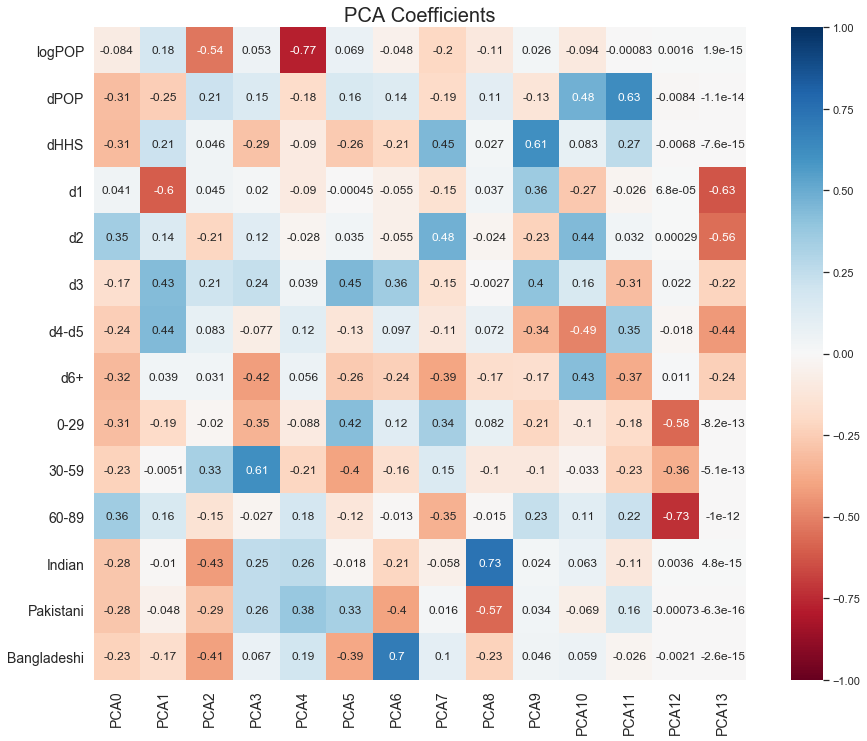

In [49]:
plt.figure(figsize=(16,12))
ax = sns.heatmap(vector_df, cmap="RdBu",yticklabels=['logPOP','dPOP','dHHS','d1','d2','d3','d4-d5','d6+',"0-29", "30-59", "60-89","Indian","Pakistani","Bangladeshi"],xticklabels=['PCA0','PCA1','PCA2','PCA3','PCA4','PCA5','PCA6','PCA7','PCA8','PCA9','PCA10','PCA11','PCA12','PCA13'] ,annot=True, annot_kws={'size': 12},square=True,vmin=-1, vmax=1)
ax.tick_params(axis='x',labelrotation=90)
ax.tick_params(axis='y',labelrotation=0)
ax.tick_params(labelsize=14)
ax.set_title("PCA Coefficients",fontsize=20)
plt.savefig('Vector_with_d4-5_and_log(eth).png',figsize=(16,12), dpi=300)

In [50]:
p_values

[8.090132269485414e-22,
 0.424515627741285,
 0.010184801426122013,
 0.022016085091228172,
 0.5688907941040797,
 0.7743170230458957,
 0.8125770739378247,
 1.9392898270426224e-07,
 0.5584738113460274,
 0.12878711888302688,
 0.5514491459058062,
 0.25224470341894245,
 0.8222458780420561,
 0.6586586256444726]

In [51]:
r_values

[0.41743602695849763,
 0.0037336415903382303,
 0.037982409130419115,
 0.030290993520986468,
 0.0019016523942163232,
 0.00048208469160162317,
 0.000329666884852515,
 0.14691373797936286,
 0.0020059149273326405,
 0.013439930012404379,
 0.002078340276314565,
 0.007658618446549825,
 0.0002959719445070187,
 0.0011439563603801038]

In [52]:
p_plot = pd.DataFrame(p_values)
p_plot['Principle Components'] = ['PCA0','PCA1','PCA2','PCA3','PCA4','PCA5','PCA6','PCA7', 'PCA8', 'PCA9', 'PCA10', 'PCA11', 'PCA12', 'PCA13']
p_plot = p_plot.rename(columns={0:'p_value'})

In [53]:
p_plot.to_csv("p_values_with_d4-5_and_log(eth).csv")

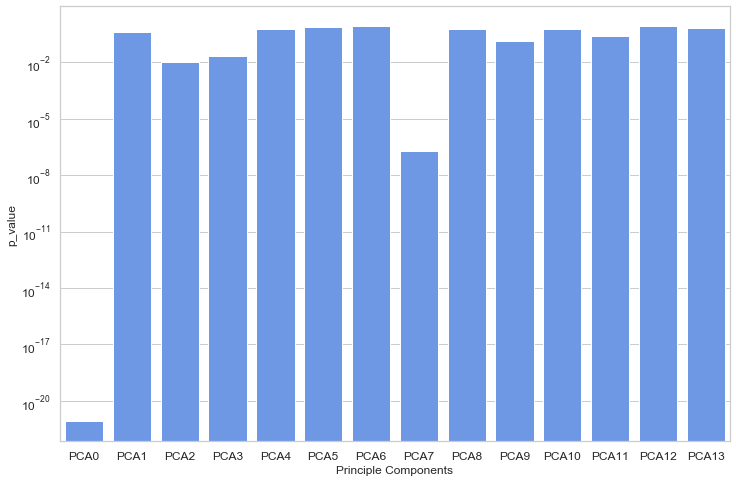

In [54]:
sns.set(style="whitegrid")
plt.figure(figsize=(12,8))
ax=sns.barplot(x='Principle Components',y='p_value',color="cornflowerblue",saturation=.85, data=p_plot, dodge=False)
ax.tick_params(labelsize=12)
plt.yscale("log")
plt.savefig('p_values_with_d4-5_and_log(eth).jpg')

In [55]:
r2_plot = pd.DataFrame(r_values)
r2_plot['Principle Components'] = ['PCA0','PCA1','PCA2','PCA3','PCA4','PCA5','PCA6','PCA7', 'PCA8', 'PCA9', 'PCA10', 'PCA11','PCA12','PCA13']
r2_plot= r2_plot.rename(columns={0:'r2_value'})

In [56]:
r2_plot.to_csv("r2_values_with_d4-5_and_log(eth).csv")

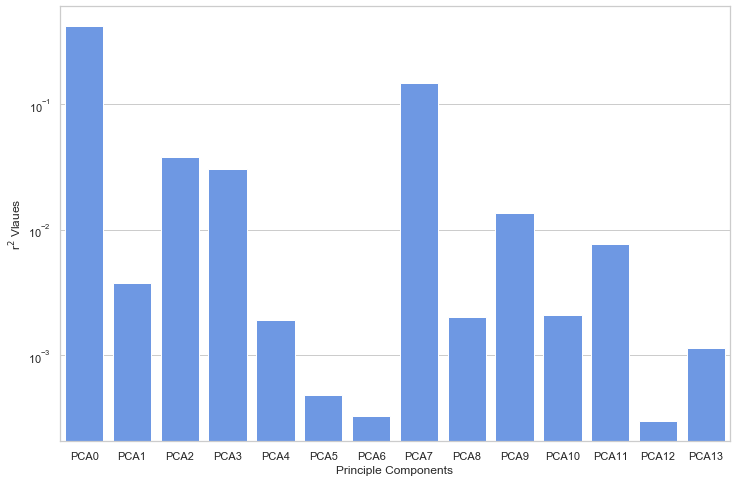

In [57]:
sns.set(style="whitegrid")
plt.figure(figsize=(12,8))
sns.barplot(x='Principle Components',y='r2_value',color="cornflowerblue",saturation=.85, data=r2_plot, dodge=False)
plt.yscale("log")
plt.ylabel('r$^2$ Vlaues')
# plt.ylable(f"$r^2 values")
plt.savefig('r2_values_with_d4-5_and_log(eth).jpg')

In [58]:
components

['PCA0', 'PCA2', 'PCA3', 'PCA7']

In [59]:
df = data
df["error"] = (df["d_general"] - df["PCR"])
df["perror"] = (df["error"]/df["PCR"]).round(3)*100
df.loc[:,["population","PCA","PCR","d_general","error","perror"]].sort_values("perror")

,population,PCA,PCR,d_general,error,perror
code,,,,,,
E06000053,2224.0,-31.207244,7.621506,0.000000,-7.621506,-100.0
W06000001,70043.0,-21.341476,16.414440,4.283083,-12.131357,-73.9
W06000006,135957.0,-2.188216,33.484915,11.032900,-22.452015,-67.1
E06000010,259778.0,5.111672,39.990991,14.242931,-25.748060,-64.4
E06000031,202259.0,-2.188558,33.484610,13.349221,-20.135390,-60.1
...,...,...,...,...,...,...
E09000001,9721.0,-19.389534,18.154121,30.861023,12.706901,70.0
E06000002,140980.0,0.405453,35.796540,63.129522,27.332982,76.4
E06000014,210618.0,-25.592483,12.625700,23.739661,11.113961,88.0


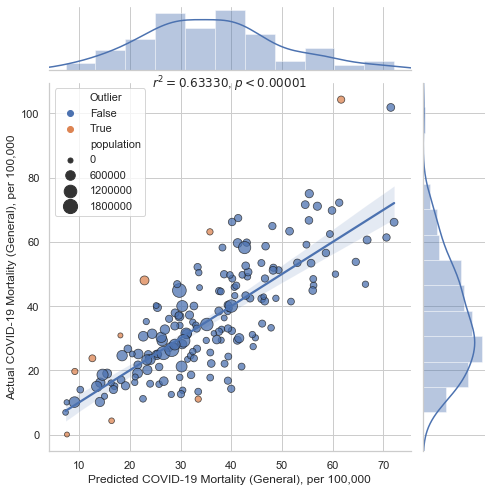

LinregressResult(slope=0.9999999999999984, intercept=6.394884621840902e-14, rvalue=0.7958004754979143, pvalue=4.0135198439197255e-37, stderr=0.05978533990839042)

In [60]:
corrfit(df, X="PCR", Y="d_general",
        xlabel="Predicted COVID-19 Mortality (General), per 100,000",
        ylabel="Actual COVID-19 Mortality (General), per 100,000",
        log=(False,False), size="population", save="PCR_with_d4-5_and_log(eth).jpg")

In [61]:
df.to_csv("PrincipleComponentAanlysis_with_d4-5_and_log(eth).csv")

In [62]:
pca_geo_plot_df = uk.join(df.loc[:,components])

In [63]:
pca_geo_plot_df.to_csv('PCA_geoplot_with_d4-5_and_log(eth).csv')

-8.314403138217939 -8.314403138217939
6.8610509048974615 6.8610509048974615


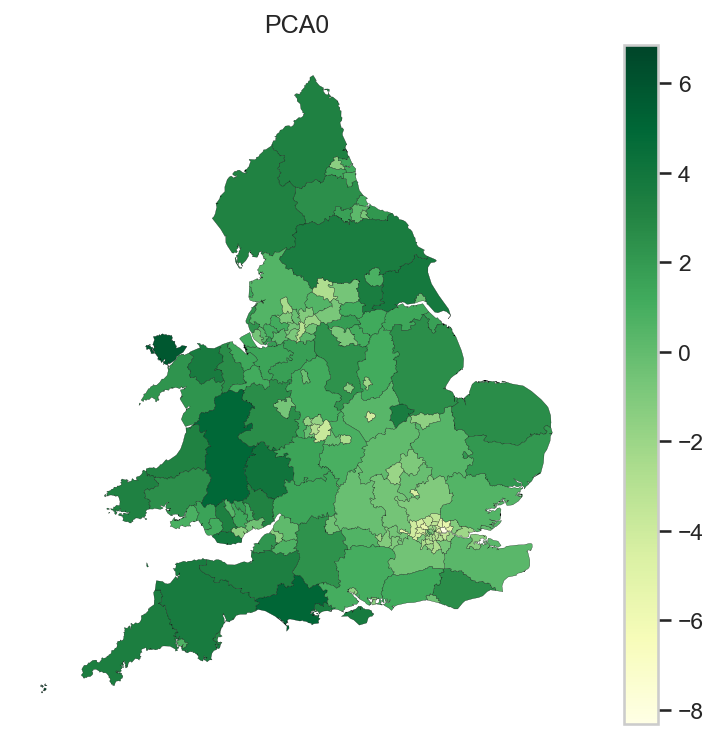

In [64]:
geoplot(pca_geo_plot_df, 'PCA0', title='PCA0', save="PCA0_geoplot_with_d4-5_and_log(eth).jpg")

-2.1499974912479756 -2.1499974912479756
5.738805474553429 5.738805474553429


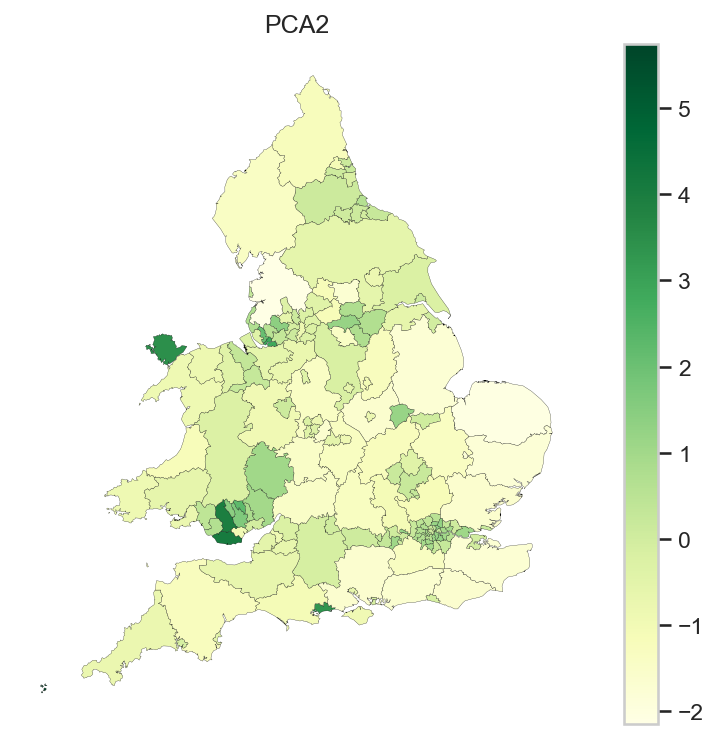

In [65]:
geoplot(pca_geo_plot_df, 'PCA2', title='PCA2', save="PCA2_geoplot_with_d4-5_and_log(eth).jpg")

-2.963936769548997 -2.963936769548997
2.066620557994641 2.066620557994641


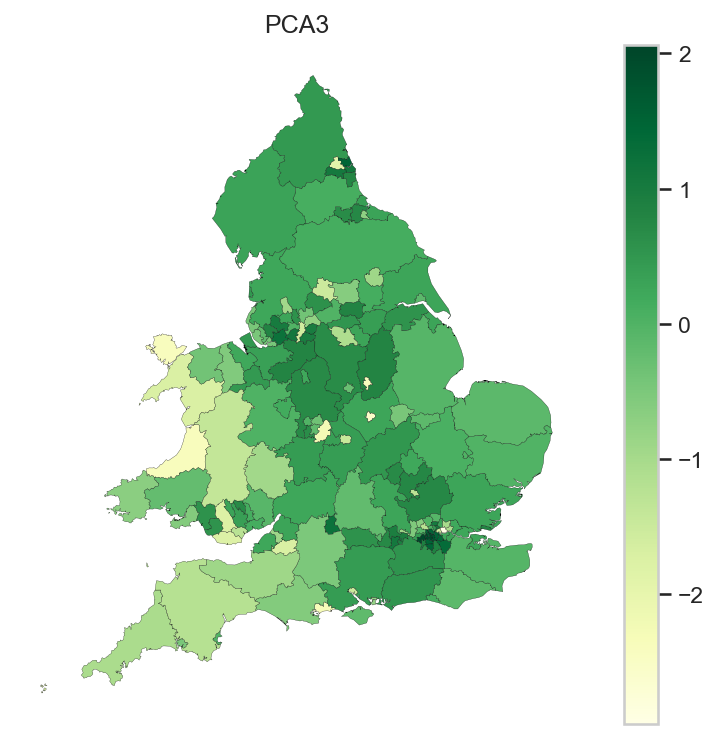

In [77]:
geoplot(pca_geo_plot_df, 'PCA3', title='PCA3', save="PCA3_geoplot_with_d4-5_and_log(eth).jpg")

-1.513736067488629 -1.513736067488629
1.5740242502007336 1.5740242502007336


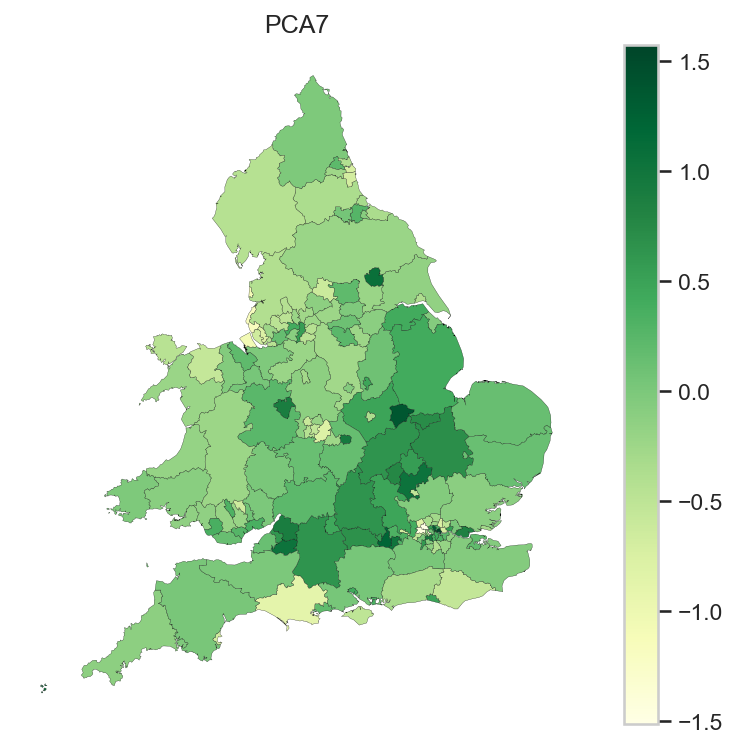

In [67]:
geoplot(pca_geo_plot_df, 'PCA7', title='PCA7', save="PCA7_geoplot_with_d4-5_and_log(eth).jpg")

In [68]:
# geoplot(pca_geo_plot_df, 'PCA8', title='PCA8', save="PCA8_geoplot_with_d4-5_and_eth.jpg")

In [69]:
from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LinearRegression
from sklearn import metrics

In [70]:
X = df.loc[:,components]
X_train = X.to_numpy()
y = df['d_general']

In [71]:
regressor = LinearRegression()  
regressor.fit(X_train, y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [72]:
y_pred = regressor.predict(X_train)

In [73]:
pred_plot = pd.DataFrame({'Actual': y, 'Predicted': y_pred})
pred_plot

,Actual,Predicted
code,,
E06000001,36.300353,38.145559
E06000002,63.129522,38.037022
E06000003,34.998177,32.015175
E06000004,17.735168,34.391818
E06000005,23.407582,29.889687
...,...,...
W06000020,45.763668,32.887426
W06000021,40.173380,24.052730
W06000022,50.427991,33.381533


In [74]:
pred_plot1 = df.join(pred_plot)

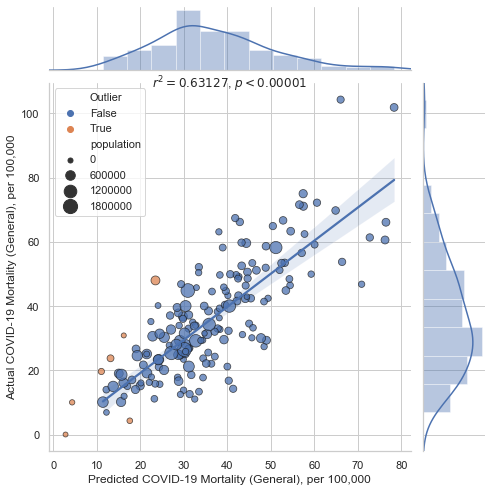

LinregressResult(slope=1.030795804058078, intercept=-1.4266102552153654, rvalue=0.7945222498623769, pvalue=2.3054415773448527e-37, stderr=0.06151789675823705)

In [75]:
corrfit(pred_plot1, X="Predicted", Y="Actual",
        xlabel="Predicted COVID-19 Mortality (General), per 100,000",
        ylabel="Actual COVID-19 Mortality (General), per 100,000",
        log=(False,False), size="population" ,save= 'Linear_Regression_5PCA_with_d4-5_and_log(eth).jpg')

In [76]:
pred_plot1.to_csv('MLR_with_PCA_with_d4-5_and_log(eth).csv')

In [80]:
mlr_w = pd.DataFrame(regressor.coef_)
mlr_w['PCs'] = components
mlr_w = mlr_w.rename(columns={0:'weights'})
mlr_w['std_err'] = [1.145,2.478,2.998, 5.311]
mlr_w

,weights,PCs,std_err
0,-4.579256,PCA0,1.145
1,2.988598,PCA2,2.478
2,3.228242,PCA3,2.998
3,-12.595771,PCA7,5.311


In [81]:
mlr_w.to_csv("MLR_weights_with_d4-5_and_log(eth).csv")

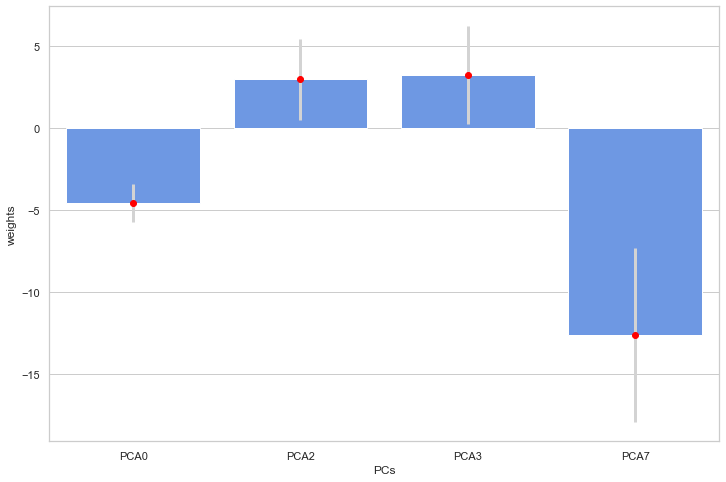

In [82]:
sns.set(style="whitegrid")
coef=regressor.coef_
# std_err = [1.110,2.532,3.695,5.412,6.633] #error for d6+ with eth
# std_err = [1.153,2.574,3.708,5.436,7.263]  #error for d6+ abd d4-d5 and with eth
std_err = [1.145,2.478,2.998, 5.311] # error with d6+ abd d4-d5 and with log(eth)
ax=plt.figure(figsize=(12,8))
ax=plt.errorbar(components, coef, yerr=std_err, fmt='o', color='red',
             ecolor='lightgray', elinewidth=3, capsize=0);
ax=sns.barplot(x='PCs',y='weights',color="cornflowerblue",saturation=.85, data=mlr_w, dodge=False)
plt.savefig('mlr_error_weights_new_with_d4-5_and_log(eth).jpg')

In [83]:
import statsmodels.api as sm

mod = sm.OLS(y,X_train)

fii = mod.fit()
print(fii.summary())
p_values = fii.summary2().tables[1]['P>|t|']

                                 OLS Regression Results                                
Dep. Variable:              d_general   R-squared (uncentered):                   0.125
Model:                            OLS   Adj. R-squared (uncentered):              0.105
Method:                 Least Squares   F-statistic:                              6.055
Date:                Mon, 07 Sep 2020   Prob (F-statistic):                    0.000141
Time:                        17:20:32   Log-Likelihood:                         -872.65
No. Observations:                 173   AIC:                                      1753.
Df Residuals:                     169   BIC:                                      1766.
Df Model:                           4                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [89]:
regressor.coef_[3] + np.square(std_err[3])

15.610950120175264

In [90]:
inv_vector = np.linalg.inv(v)
sq_inv_vector = np.square(inv_vector)
# weights = [4.43614596,0,-4.19504834,0,0,4.42212085,0,-9.96935917,-6.71656578,0,0,0,0,0,0]
# err_weights = [5.6682,0,2.216024,0,0,18.075125,0,19.320344,37.280089000000004,0,0,0,0,0,0]
# weights = [4.60895056,0,4.29624345,0,0,-4.34803667,0,-10.09904127,-8.3735874,0,0,0,0,0] #for d6+ abd d4-d5 and with eth
# err_weights = [5.938359561403175,0,10.921719453419922,0,0,9.401227326006456,0,19.45105472980198,44.37758159764239,0,0,0,0,0] #for d6+ abd d4-d5 and with eth
weights = [-4.57925649,0,2.98859829,3.22824197,0,0,0,-12.59577088,0,0,0,0,0,0]
err_weights = [-3.2682314860019375,0,9.129082294063652,12.216245970930142,0,0,0,15.610950120175264,0,0,0,0,0,0]
err_coefficients  = np.matmul(sq_inv_vector, err_weights)
coefficients = np.matmul(inv_vector, weights)
error = np.sqrt(err_coefficients)
reconstructed_df = pd.DataFrame()
reconstructed_df['weights'] = coefficients
reconstructed_df['features'] = factors
reconstructed_df['err_weights'] = err_weights
reconstructed_df['err_coefficients'] = err_coefficients
reconstructed_df['error'] = error

D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in sqrt
  # This is added back by InteractiveShellApp.init_path()


In [91]:
reconstructed_df.to_csv('Feature_and_weights_mapped_with_d4-5_and_log(eth).csv')

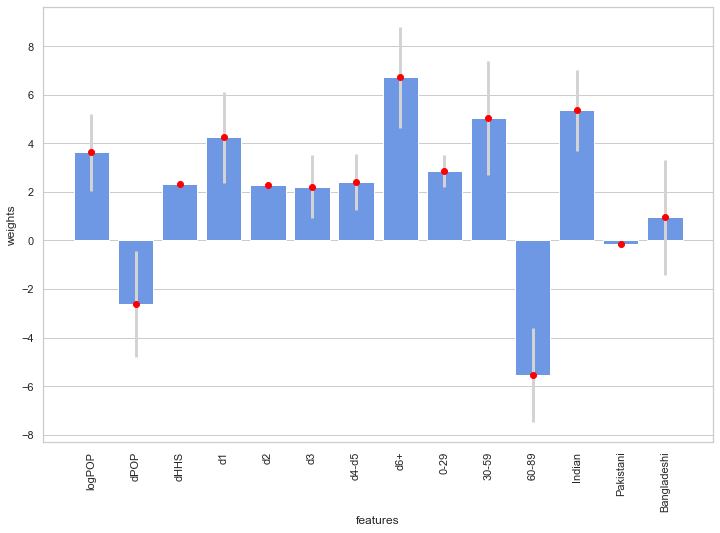

In [92]:
# sns.set(style="whitegrid")
ax = plt.figure(figsize=(12,8))
ax=sns.barplot(x='features',y='weights',color="cornflowerblue",saturation=.85, data=reconstructed_df, dodge=False)
ax=plt.errorbar(reconstructed_df['features'],reconstructed_df['weights'], yerr=error, fmt='o', color='red',
             ecolor='lightgray', elinewidth=3, capsize=0)
# plt.yscale("log")
plt.xticks(rotation=90)
# ax.tick_params(axis='x',labelrotation=90)
# ax.tick_params(labelsize=10)
plt.savefig('Feature_Weights_with _error_with_d4-5_and_log(eth).jpg')

In [198]:
from keras.models import Sequential
from keras.layers import Dense
from keras import regularizers

In [199]:
# X = df.loc[:,'PCA0':'PCA13']
# X = df.loc[:,components_restricted]
X = df.loc[:,components]
# X = df.loc[:,['PCA0', 'PCA2', 'PCA5', 'PCA6', 'PCA7', 'PCA8', 'PCA12']]

In [200]:
y = df['d_general']
# y = uk['d_restricted']

In [201]:
X_train = X.to_numpy()

In [202]:
X_train.shape

(173, 4)

In [264]:
model = Sequential()
model.add(Dense(4,activation='sigmoid',kernel_regularizer=regularizers.l2(l=0.025)))
model.add(Dense(3,kernel_regularizer=regularizers.l2(l=0.025)))
model.add(Dense(1))
model.compile(optimizer='adam',loss='mse')
model.fit(x=X_train,y=y.values,epochs=100000)

Epoch 1/100000
173/173 [==============================] - 0s 684us/step - loss: 1647.1577
Epoch 2/100000
173/173 [==============================] - 0s 46us/step - loss: 1644.1332
Epoch 3/100000
173/173 [==============================] - 0s 46us/step - loss: 1641.2003
Epoch 4/100000
173/173 [==============================] - 0s 46us/step - loss: 1638.2171
Epoch 5/100000
173/173 [==============================] - 0s 46us/step - loss: 1635.2087
Epoch 6/100000
173/173 [==============================] - 0s 63us/step - loss: 1632.1763
Epoch 7/100000
173/173 [==============================] - 0s 46us/step - loss: 1629.1327
Epoch 8/100000
173/173 [==============================] - 0s 46us/step - loss: 1626.1828
Epoch 9/100000
173/173 [==============================] - 0s 52us/step - loss: 1623.0843
Epoch 10/100000
173/173 [==============================] - 0s 40us/step - loss: 1620.1385
Epoch 11/100000
173/173 [==============================] - 0s 40us/step - loss: 1617.0361
Epoch 12/100000
17

173/173 [==============================] - 0s 58us/step - loss: 1066.6294
Epoch 93/100000
173/173 [==============================] - 0s 46us/step - loss: 1055.7696
Epoch 94/100000
173/173 [==============================] - 0s 46us/step - loss: 1045.0491
Epoch 95/100000
173/173 [==============================] - 0s 58us/step - loss: 1033.8105
Epoch 96/100000
173/173 [==============================] - 0s 58us/step - loss: 1022.7236
Epoch 97/100000
173/173 [==============================] - 0s 46us/step - loss: 1011.1941
Epoch 98/100000
173/173 [==============================] - 0s 40us/step - loss: 999.9404
Epoch 99/100000
173/173 [==============================] - 0s 63us/step - loss: 988.5830
Epoch 100/100000
173/173 [==============================] - 0s 58us/step - loss: 977.2500
Epoch 101/100000
173/173 [==============================] - 0s 58us/step - loss: 966.2170
Epoch 102/100000
173/173 [==============================] - 0s 52us/step - loss: 954.9827
Epoch 103/100000
173/173 [==

Epoch 183/100000
173/173 [==============================] - 0s 58us/step - loss: 290.0128
Epoch 184/100000
173/173 [==============================] - 0s 46us/step - loss: 286.6277
Epoch 185/100000
173/173 [==============================] - 0s 69us/step - loss: 282.9245
Epoch 186/100000
173/173 [==============================] - 0s 46us/step - loss: 279.3379
Epoch 187/100000
173/173 [==============================] - 0s 46us/step - loss: 276.2005
Epoch 188/100000
173/173 [==============================] - 0s 58us/step - loss: 272.8952
Epoch 189/100000
173/173 [==============================] - 0s 52us/step - loss: 269.6255
Epoch 190/100000
173/173 [==============================] - 0s 58us/step - loss: 266.5123
Epoch 191/100000
173/173 [==============================] - 0s 52us/step - loss: 263.4770
Epoch 192/100000
173/173 [==============================] - 0s 63us/step - loss: 260.4071
Epoch 193/100000
173/173 [==============================] - 0s 46us/step - loss: 257.4178
Epoch 194/

173/173 [==============================] - 0s 46us/step - loss: 169.9034
Epoch 275/100000
173/173 [==============================] - 0s 46us/step - loss: 169.5440
Epoch 276/100000
173/173 [==============================] - 0s 58us/step - loss: 169.2777
Epoch 277/100000
173/173 [==============================] - 0s 46us/step - loss: 168.9682
Epoch 278/100000
173/173 [==============================] - 0s 46us/step - loss: 168.6320
Epoch 279/100000
173/173 [==============================] - 0s 46us/step - loss: 168.3283
Epoch 280/100000
173/173 [==============================] - 0s 58us/step - loss: 168.0928
Epoch 281/100000
173/173 [==============================] - 0s 46us/step - loss: 167.7619
Epoch 282/100000
173/173 [==============================] - 0s 52us/step - loss: 167.5218
Epoch 283/100000
173/173 [==============================] - 0s 46us/step - loss: 167.2534
Epoch 284/100000
173/173 [==============================] - 0s 46us/step - loss: 166.9653
Epoch 285/100000
173/173 [=

Epoch 365/100000
173/173 [==============================] - 0s 52us/step - loss: 150.5712
Epoch 366/100000
173/173 [==============================] - 0s 52us/step - loss: 150.4296
Epoch 367/100000
173/173 [==============================] - 0s 46us/step - loss: 150.2521
Epoch 368/100000
173/173 [==============================] - 0s 58us/step - loss: 150.0846
Epoch 369/100000
173/173 [==============================] - 0s 46us/step - loss: 149.9193
Epoch 370/100000
173/173 [==============================] - 0s 52us/step - loss: 149.7911
Epoch 371/100000
173/173 [==============================] - 0s 46us/step - loss: 149.6104
Epoch 372/100000
173/173 [==============================] - 0s 46us/step - loss: 149.4744
Epoch 373/100000
173/173 [==============================] - 0s 40us/step - loss: 149.3001
Epoch 374/100000
173/173 [==============================] - 0s 58us/step - loss: 149.1566
Epoch 375/100000
173/173 [==============================] - 0s 58us/step - loss: 149.0121
Epoch 376/

173/173 [==============================] - 0s 46us/step - loss: 130.1334
Epoch 547/100000
173/173 [==============================] - 0s 52us/step - loss: 130.0635
Epoch 548/100000
173/173 [==============================] - 0s 46us/step - loss: 129.9789
Epoch 549/100000
173/173 [==============================] - 0s 52us/step - loss: 129.8933
Epoch 550/100000
173/173 [==============================] - 0s 58us/step - loss: 129.8027
Epoch 551/100000
173/173 [==============================] - 0s 46us/step - loss: 129.7123
Epoch 552/100000
173/173 [==============================] - 0s 63us/step - loss: 129.6412
Epoch 553/100000
173/173 [==============================] - 0s 52us/step - loss: 129.5735
Epoch 554/100000
173/173 [==============================] - 0s 58us/step - loss: 129.4903
Epoch 555/100000
173/173 [==============================] - 0s 46us/step - loss: 129.3937
Epoch 556/100000
173/173 [==============================] - 0s 52us/step - loss: 129.3223
Epoch 557/100000
173/173 [=

173/173 [==============================] - 0s 46us/step - loss: 119.3523
Epoch 729/100000
173/173 [==============================] - 0s 58us/step - loss: 119.3370
Epoch 730/100000
173/173 [==============================] - 0s 46us/step - loss: 119.2708
Epoch 731/100000
173/173 [==============================] - 0s 52us/step - loss: 119.2234
Epoch 732/100000
173/173 [==============================] - 0s 52us/step - loss: 119.1929
Epoch 733/100000
173/173 [==============================] - 0s 63us/step - loss: 119.1545
Epoch 734/100000
173/173 [==============================] - 0s 52us/step - loss: 119.1332
Epoch 735/100000
173/173 [==============================] - 0s 63us/step - loss: 119.0644
Epoch 736/100000
173/173 [==============================] - 0s 46us/step - loss: 119.0491
Epoch 737/100000
173/173 [==============================] - 0s 46us/step - loss: 119.0109
Epoch 738/100000
173/173 [==============================] - 0s 58us/step - loss: 118.9653
Epoch 739/100000
173/173 [=

173/173 [==============================] - 0s 46us/step - loss: 114.7189
Epoch 911/100000
173/173 [==============================] - 0s 52us/step - loss: 114.6979
Epoch 912/100000
173/173 [==============================] - 0s 52us/step - loss: 114.6711
Epoch 913/100000
173/173 [==============================] - 0s 52us/step - loss: 114.6520
Epoch 914/100000
173/173 [==============================] - 0s 46us/step - loss: 114.6514
Epoch 915/100000
173/173 [==============================] - 0s 63us/step - loss: 114.6318
Epoch 916/100000
173/173 [==============================] - 0s 52us/step - loss: 114.6150
Epoch 917/100000
173/173 [==============================] - 0s 63us/step - loss: 114.6149
Epoch 918/100000
173/173 [==============================] - 0s 46us/step - loss: 114.6415
Epoch 919/100000
173/173 [==============================] - 0s 52us/step - loss: 114.6221
Epoch 920/100000
173/173 [==============================] - 0s 52us/step - loss: 114.5831
Epoch 921/100000
173/173 [=

173/173 [==============================] - 0s 52us/step - loss: 112.7537
Epoch 1092/100000
173/173 [==============================] - 0s 52us/step - loss: 112.7408
Epoch 1093/100000
173/173 [==============================] - 0s 58us/step - loss: 112.7470
Epoch 1094/100000
173/173 [==============================] - 0s 46us/step - loss: 112.7293
Epoch 1095/100000
173/173 [==============================] - 0s 46us/step - loss: 112.7211
Epoch 1096/100000
173/173 [==============================] - 0s 52us/step - loss: 112.7297
Epoch 1097/100000
173/173 [==============================] - 0s 58us/step - loss: 112.7167
Epoch 1098/100000
173/173 [==============================] - 0s 40us/step - loss: 112.7052
Epoch 1099/100000
173/173 [==============================] - 0s 46us/step - loss: 112.6892
Epoch 1100/100000
173/173 [==============================] - 0s 52us/step - loss: 112.6805
Epoch 1101/100000
173/173 [==============================] - 0s 46us/step - loss: 112.6843
Epoch 1102/100000

173/173 [==============================] - 0s 52us/step - loss: 111.6699
Epoch 1272/100000
173/173 [==============================] - 0s 63us/step - loss: 111.6590
Epoch 1273/100000
173/173 [==============================] - 0s 58us/step - loss: 111.7083
Epoch 1274/100000
173/173 [==============================] - 0s 46us/step - loss: 111.6663
Epoch 1275/100000
173/173 [==============================] - 0s 46us/step - loss: 111.6756
Epoch 1276/100000
173/173 [==============================] - 0s 52us/step - loss: 111.6602
Epoch 1277/100000
173/173 [==============================] - 0s 46us/step - loss: 111.6715
Epoch 1278/100000
173/173 [==============================] - 0s 52us/step - loss: 111.6725
Epoch 1279/100000
173/173 [==============================] - 0s 46us/step - loss: 111.6286
Epoch 1280/100000
173/173 [==============================] - 0s 58us/step - loss: 111.6162
Epoch 1281/100000
173/173 [==============================] - 0s 52us/step - loss: 111.7235
Epoch 1282/100000

Epoch 1451/100000
173/173 [==============================] - 0s 52us/step - loss: 110.8819
Epoch 1452/100000
173/173 [==============================] - 0s 52us/step - loss: 110.8447
Epoch 1453/100000
173/173 [==============================] - 0s 46us/step - loss: 110.8546
Epoch 1454/100000
173/173 [==============================] - 0s 46us/step - loss: 110.8491
Epoch 1455/100000
173/173 [==============================] - 0s 52us/step - loss: 110.8487
Epoch 1456/100000
173/173 [==============================] - 0s 46us/step - loss: 110.8635
Epoch 1457/100000
173/173 [==============================] - 0s 63us/step - loss: 110.8593
Epoch 1458/100000
173/173 [==============================] - 0s 46us/step - loss: 110.8193
Epoch 1459/100000
173/173 [==============================] - 0s 58us/step - loss: 110.8152
Epoch 1460/100000
173/173 [==============================] - 0s 52us/step - loss: 110.8186
Epoch 1461/100000
173/173 [==============================] - 0s 46us/step - loss: 110.8271

173/173 [==============================] - 0s 58us/step - loss: 110.1889
Epoch 1631/100000
173/173 [==============================] - 0s 46us/step - loss: 110.2056
Epoch 1632/100000
173/173 [==============================] - 0s 52us/step - loss: 110.1981
Epoch 1633/100000
173/173 [==============================] - 0s 63us/step - loss: 110.1939
Epoch 1634/100000
173/173 [==============================] - 0s 58us/step - loss: 110.1750
Epoch 1635/100000
173/173 [==============================] - 0s 52us/step - loss: 110.1722
Epoch 1636/100000
173/173 [==============================] - 0s 52us/step - loss: 110.1657
Epoch 1637/100000
173/173 [==============================] - 0s 63us/step - loss: 110.1869
Epoch 1638/100000
173/173 [==============================] - 0s 46us/step - loss: 110.1786
Epoch 1639/100000
173/173 [==============================] - 0s 69us/step - loss: 110.1689
Epoch 1640/100000
173/173 [==============================] - 0s 58us/step - loss: 110.1816
Epoch 1641/100000

173/173 [==============================] - 0s 46us/step - loss: 109.6798
Epoch 1810/100000
173/173 [==============================] - 0s 40us/step - loss: 109.6693
Epoch 1811/100000
173/173 [==============================] - 0s 46us/step - loss: 109.6841
Epoch 1812/100000
173/173 [==============================] - 0s 46us/step - loss: 109.7030
Epoch 1813/100000
173/173 [==============================] - 0s 40us/step - loss: 109.6596
Epoch 1814/100000
173/173 [==============================] - 0s 46us/step - loss: 109.6612
Epoch 1815/100000
173/173 [==============================] - 0s 40us/step - loss: 109.6954
Epoch 1816/100000
173/173 [==============================] - 0s 46us/step - loss: 109.6481
Epoch 1817/100000
173/173 [==============================] - 0s 40us/step - loss: 109.6551
Epoch 1818/100000
173/173 [==============================] - 0s 46us/step - loss: 109.6628
Epoch 1819/100000
173/173 [==============================] - 0s 40us/step - loss: 109.6584
Epoch 1820/100000

Epoch 1899/100000
173/173 [==============================] - 0s 40us/step - loss: 109.4751
Epoch 1900/100000
173/173 [==============================] - 0s 52us/step - loss: 109.4543
Epoch 1901/100000
173/173 [==============================] - 0s 40us/step - loss: 109.4600
Epoch 1902/100000
173/173 [==============================] - 0s 46us/step - loss: 109.4686
Epoch 1903/100000
173/173 [==============================] - 0s 40us/step - loss: 109.4424
Epoch 1904/100000
173/173 [==============================] - 0s 46us/step - loss: 109.4579
Epoch 1905/100000
173/173 [==============================] - 0s 40us/step - loss: 109.4715
Epoch 1906/100000
173/173 [==============================] - 0s 46us/step - loss: 109.4617
Epoch 1907/100000
173/173 [==============================] - 0s 40us/step - loss: 109.4656
Epoch 1908/100000
173/173 [==============================] - 0s 40us/step - loss: 109.4658
Epoch 1909/100000
173/173 [==============================] - 0s 46us/step - loss: 109.4603

173/173 [==============================] - 0s 63us/step - loss: 109.0484
Epoch 2079/100000
173/173 [==============================] - 0s 58us/step - loss: 109.0649
Epoch 2080/100000
173/173 [==============================] - 0s 52us/step - loss: 109.0789
Epoch 2081/100000
173/173 [==============================] - 0s 58us/step - loss: 109.0849
Epoch 2082/100000
173/173 [==============================] - 0s 52us/step - loss: 109.0651
Epoch 2083/100000
173/173 [==============================] - 0s 40us/step - loss: 109.0655
Epoch 2084/100000
173/173 [==============================] - 0s 46us/step - loss: 109.0803
Epoch 2085/100000
173/173 [==============================] - 0s 40us/step - loss: 109.0977
Epoch 2086/100000
173/173 [==============================] - 0s 58us/step - loss: 109.0604
Epoch 2087/100000
173/173 [==============================] - 0s 40us/step - loss: 109.0466
Epoch 2088/100000
173/173 [==============================] - 0s 40us/step - loss: 109.0550
Epoch 2089/100000

Epoch 2168/100000
173/173 [==============================] - 0s 58us/step - loss: 108.9169
Epoch 2169/100000
173/173 [==============================] - 0s 63us/step - loss: 108.9201
Epoch 2170/100000
173/173 [==============================] - 0s 52us/step - loss: 108.9173
Epoch 2171/100000
173/173 [==============================] - 0s 63us/step - loss: 108.9120
Epoch 2172/100000
173/173 [==============================] - 0s 63us/step - loss: 108.9138
Epoch 2173/100000
173/173 [==============================] - 0s 52us/step - loss: 108.9241
Epoch 2174/100000
173/173 [==============================] - 0s 58us/step - loss: 108.9101
Epoch 2175/100000
173/173 [==============================] - 0s 52us/step - loss: 108.9275
Epoch 2176/100000
173/173 [==============================] - 0s 58us/step - loss: 108.9290
Epoch 2177/100000
173/173 [==============================] - 0s 46us/step - loss: 108.9273
Epoch 2178/100000
173/173 [==============================] - 0s 52us/step - loss: 108.8980

173/173 [==============================] - 0s 40us/step - loss: 108.7899
Epoch 2259/100000
173/173 [==============================] - 0s 46us/step - loss: 108.7853
Epoch 2260/100000
173/173 [==============================] - 0s 40us/step - loss: 108.7854
Epoch 2261/100000
173/173 [==============================] - 0s 46us/step - loss: 108.7922
Epoch 2262/100000
173/173 [==============================] - 0s 46us/step - loss: 108.7565
Epoch 2263/100000
173/173 [==============================] - 0s 46us/step - loss: 108.7951
Epoch 2264/100000
173/173 [==============================] - 0s 46us/step - loss: 108.7730
Epoch 2265/100000
173/173 [==============================] - 0s 40us/step - loss: 108.8710
Epoch 2266/100000
173/173 [==============================] - 0s 46us/step - loss: 108.7418
Epoch 2267/100000
173/173 [==============================] - 0s 40us/step - loss: 108.7603
Epoch 2268/100000
173/173 [==============================] - 0s 46us/step - loss: 108.7504
Epoch 2269/100000

173/173 [==============================] - 0s 40us/step - loss: 108.4992
Epoch 2439/100000
173/173 [==============================] - 0s 46us/step - loss: 108.5492
Epoch 2440/100000
173/173 [==============================] - 0s 40us/step - loss: 108.4972
Epoch 2441/100000
173/173 [==============================] - 0s 40us/step - loss: 108.5304
Epoch 2442/100000
173/173 [==============================] - 0s 40us/step - loss: 108.4967
Epoch 2443/100000
173/173 [==============================] - 0s 46us/step - loss: 108.4910
Epoch 2444/100000
173/173 [==============================] - 0s 46us/step - loss: 108.5196
Epoch 2445/100000
173/173 [==============================] - 0s 40us/step - loss: 108.5213
Epoch 2446/100000
173/173 [==============================] - 0s 52us/step - loss: 108.4964
Epoch 2447/100000
173/173 [==============================] - 0s 40us/step - loss: 108.4966
Epoch 2448/100000
173/173 [==============================] - 0s 46us/step - loss: 108.4879
Epoch 2449/100000

173/173 [==============================] - 0s 40us/step - loss: 108.2684
Epoch 2619/100000
173/173 [==============================] - 0s 46us/step - loss: 108.2648
Epoch 2620/100000
173/173 [==============================] - 0s 40us/step - loss: 108.2666
Epoch 2621/100000
173/173 [==============================] - 0s 40us/step - loss: 108.2579
Epoch 2622/100000
173/173 [==============================] - 0s 40us/step - loss: 108.2669
Epoch 2623/100000
173/173 [==============================] - 0s 40us/step - loss: 108.2567
Epoch 2624/100000
173/173 [==============================] - 0s 46us/step - loss: 108.2392
Epoch 2625/100000
173/173 [==============================] - 0s 40us/step - loss: 108.2417
Epoch 2626/100000
173/173 [==============================] - 0s 52us/step - loss: 108.2387
Epoch 2627/100000
173/173 [==============================] - 0s 40us/step - loss: 108.2467
Epoch 2628/100000
173/173 [==============================] - 0s 46us/step - loss: 108.2689
Epoch 2629/100000

Epoch 2708/100000
173/173 [==============================] - 0s 40us/step - loss: 108.1439
Epoch 2709/100000
173/173 [==============================] - 0s 46us/step - loss: 108.1273
Epoch 2710/100000
173/173 [==============================] - 0s 40us/step - loss: 108.1493
Epoch 2711/100000
173/173 [==============================] - 0s 46us/step - loss: 108.1351
Epoch 2712/100000
173/173 [==============================] - 0s 46us/step - loss: 108.1176
Epoch 2713/100000
173/173 [==============================] - 0s 40us/step - loss: 108.1227
Epoch 2714/100000
173/173 [==============================] - 0s 46us/step - loss: 108.1561
Epoch 2715/100000
173/173 [==============================] - ETA: 0s - loss: 110.719 - 0s 40us/step - loss: 108.1491
Epoch 2716/100000
173/173 [==============================] - 0s 46us/step - loss: 108.1586
Epoch 2717/100000
173/173 [==============================] - 0s 46us/step - loss: 108.1377
Epoch 2718/100000
173/173 [==============================] - 0s 

Epoch 2887/100000
173/173 [==============================] - 0s 40us/step - loss: 107.9469
Epoch 2888/100000
173/173 [==============================] - 0s 40us/step - loss: 107.9413
Epoch 2889/100000
173/173 [==============================] - 0s 40us/step - loss: 108.0113
Epoch 2890/100000
173/173 [==============================] - 0s 46us/step - loss: 107.9312
Epoch 2891/100000
173/173 [==============================] - 0s 40us/step - loss: 107.9605
Epoch 2892/100000
173/173 [==============================] - 0s 46us/step - loss: 107.9332
Epoch 2893/100000
173/173 [==============================] - 0s 40us/step - loss: 107.9956
Epoch 2894/100000
173/173 [==============================] - 0s 46us/step - loss: 107.9514
Epoch 2895/100000
173/173 [==============================] - 0s 46us/step - loss: 107.9327
Epoch 2896/100000
173/173 [==============================] - 0s 40us/step - loss: 107.9419
Epoch 2897/100000
173/173 [==============================] - 0s 46us/step - loss: 107.9331

173/173 [==============================] - 0s 40us/step - loss: 107.8936
Epoch 2978/100000
173/173 [==============================] - 0s 46us/step - loss: 107.8875
Epoch 2979/100000
173/173 [==============================] - 0s 40us/step - loss: 107.8539
Epoch 2980/100000
173/173 [==============================] - 0s 46us/step - loss: 107.8425
Epoch 2981/100000
173/173 [==============================] - 0s 40us/step - loss: 107.8327
Epoch 2982/100000
173/173 [==============================] - 0s 46us/step - loss: 107.8417
Epoch 2983/100000
173/173 [==============================] - 0s 52us/step - loss: 107.8710
Epoch 2984/100000
173/173 [==============================] - 0s 40us/step - loss: 107.8422
Epoch 2985/100000
173/173 [==============================] - 0s 46us/step - loss: 107.8518
Epoch 2986/100000
173/173 [==============================] - 0s 40us/step - loss: 107.8508
Epoch 2987/100000
173/173 [==============================] - 0s 46us/step - loss: 107.8271
Epoch 2988/100000

Epoch 3067/100000
173/173 [==============================] - 0s 46us/step - loss: 107.7880
Epoch 3068/100000
173/173 [==============================] - 0s 40us/step - loss: 107.7764
Epoch 3069/100000
173/173 [==============================] - 0s 46us/step - loss: 107.7586
Epoch 3070/100000
173/173 [==============================] - 0s 40us/step - loss: 107.7546
Epoch 3071/100000
173/173 [==============================] - 0s 46us/step - loss: 107.7523
Epoch 3072/100000
173/173 [==============================] - 0s 46us/step - loss: 107.7580
Epoch 3073/100000
173/173 [==============================] - 0s 40us/step - loss: 107.7708
Epoch 3074/100000
173/173 [==============================] - 0s 46us/step - loss: 107.7574
Epoch 3075/100000
173/173 [==============================] - 0s 46us/step - loss: 107.7640
Epoch 3076/100000
173/173 [==============================] - 0s 40us/step - loss: 107.7280
Epoch 3077/100000
173/173 [==============================] - 0s 40us/step - loss: 107.7308

173/173 [==============================] - 0s 40us/step - loss: 107.5770
Epoch 3247/100000
173/173 [==============================] - 0s 46us/step - loss: 107.6005
Epoch 3248/100000
173/173 [==============================] - 0s 40us/step - loss: 107.6490
Epoch 3249/100000
173/173 [==============================] - 0s 46us/step - loss: 107.5655
Epoch 3250/100000
173/173 [==============================] - 0s 46us/step - loss: 107.5976
Epoch 3251/100000
173/173 [==============================] - 0s 40us/step - loss: 107.5796
Epoch 3252/100000
173/173 [==============================] - 0s 40us/step - loss: 107.5937
Epoch 3253/100000
173/173 [==============================] - 0s 46us/step - loss: 107.6068
Epoch 3254/100000
173/173 [==============================] - 0s 40us/step - loss: 107.5593
Epoch 3255/100000
173/173 [==============================] - 0s 46us/step - loss: 107.5783
Epoch 3256/100000
173/173 [==============================] - 0s 40us/step - loss: 107.5582
Epoch 3257/100000

Epoch 3336/100000
173/173 [==============================] - 0s 46us/step - loss: 107.4836
Epoch 3337/100000
173/173 [==============================] - 0s 40us/step - loss: 107.4882
Epoch 3338/100000
173/173 [==============================] - 0s 46us/step - loss: 107.4882
Epoch 3339/100000
173/173 [==============================] - 0s 40us/step - loss: 107.4855
Epoch 3340/100000
173/173 [==============================] - 0s 46us/step - loss: 107.4720
Epoch 3341/100000
173/173 [==============================] - 0s 40us/step - loss: 107.4900
Epoch 3342/100000
173/173 [==============================] - 0s 46us/step - loss: 107.4974
Epoch 3343/100000
173/173 [==============================] - 0s 52us/step - loss: 107.4932
Epoch 3344/100000
173/173 [==============================] - 0s 40us/step - loss: 107.4923
Epoch 3345/100000
173/173 [==============================] - 0s 46us/step - loss: 107.4740
Epoch 3346/100000
173/173 [==============================] - 0s 40us/step - loss: 107.4992

173/173 [==============================] - 0s 58us/step - loss: 107.4100
Epoch 3427/100000
173/173 [==============================] - 0s 58us/step - loss: 107.4523
Epoch 3428/100000
173/173 [==============================] - 0s 52us/step - loss: 107.4045
Epoch 3429/100000
173/173 [==============================] - 0s 52us/step - loss: 107.3938
Epoch 3430/100000
173/173 [==============================] - 0s 52us/step - loss: 107.3979
Epoch 3431/100000
173/173 [==============================] - 0s 46us/step - loss: 107.4040
Epoch 3432/100000
173/173 [==============================] - 0s 58us/step - loss: 107.4014
Epoch 3433/100000
173/173 [==============================] - 0s 52us/step - loss: 107.4245
Epoch 3434/100000
173/173 [==============================] - 0s 58us/step - loss: 107.3727
Epoch 3435/100000
173/173 [==============================] - 0s 46us/step - loss: 107.3794
Epoch 3436/100000
173/173 [==============================] - 0s 46us/step - loss: 107.4222
Epoch 3437/100000

Epoch 3516/100000
173/173 [==============================] - 0s 46us/step - loss: 107.3177
Epoch 3517/100000
173/173 [==============================] - 0s 40us/step - loss: 107.3211
Epoch 3518/100000
173/173 [==============================] - 0s 46us/step - loss: 107.3258
Epoch 3519/100000
173/173 [==============================] - 0s 46us/step - loss: 107.3005
Epoch 3520/100000
173/173 [==============================] - 0s 46us/step - loss: 107.2947
Epoch 3521/100000
173/173 [==============================] - 0s 40us/step - loss: 107.2965
Epoch 3522/100000
173/173 [==============================] - 0s 46us/step - loss: 107.2897
Epoch 3523/100000
173/173 [==============================] - 0s 46us/step - loss: 107.3262
Epoch 3524/100000
173/173 [==============================] - 0s 46us/step - loss: 107.2957
Epoch 3525/100000
173/173 [==============================] - 0s 46us/step - loss: 107.2795
Epoch 3526/100000
173/173 [==============================] - 0s 46us/step - loss: 107.2891

Epoch 3695/100000
173/173 [==============================] - 0s 40us/step - loss: 107.1294
Epoch 3696/100000
173/173 [==============================] - 0s 40us/step - loss: 107.1480
Epoch 3697/100000
173/173 [==============================] - 0s 46us/step - loss: 107.1722
Epoch 3698/100000
173/173 [==============================] - 0s 40us/step - loss: 107.1130
Epoch 3699/100000
173/173 [==============================] - 0s 46us/step - loss: 107.1275
Epoch 3700/100000
173/173 [==============================] - 0s 40us/step - loss: 107.1313
Epoch 3701/100000
173/173 [==============================] - 0s 46us/step - loss: 107.1281
Epoch 3702/100000
173/173 [==============================] - 0s 40us/step - loss: 107.1317
Epoch 3703/100000
173/173 [==============================] - 0s 46us/step - loss: 107.1225
Epoch 3704/100000
173/173 [==============================] - 0s 46us/step - loss: 107.1352
Epoch 3705/100000
173/173 [==============================] - 0s 40us/step - loss: 107.1255

Epoch 3874/100000
173/173 [==============================] - 0s 40us/step - loss: 106.9314
Epoch 3875/100000
173/173 [==============================] - 0s 46us/step - loss: 106.9427
Epoch 3876/100000
173/173 [==============================] - 0s 46us/step - loss: 106.9450
Epoch 3877/100000
173/173 [==============================] - 0s 46us/step - loss: 106.9688
Epoch 3878/100000
173/173 [==============================] - 0s 40us/step - loss: 106.9517
Epoch 3879/100000
173/173 [==============================] - 0s 46us/step - loss: 106.9550
Epoch 3880/100000
173/173 [==============================] - 0s 46us/step - loss: 106.9467
Epoch 3881/100000
173/173 [==============================] - 0s 40us/step - loss: 106.9466
Epoch 3882/100000
173/173 [==============================] - 0s 40us/step - loss: 106.9173
Epoch 3883/100000
173/173 [==============================] - 0s 40us/step - loss: 106.9271
Epoch 3884/100000
173/173 [==============================] - 0s 46us/step - loss: 106.9161

173/173 [==============================] - 0s 46us/step - loss: 106.8228
Epoch 3965/100000
173/173 [==============================] - 0s 46us/step - loss: 106.8243
Epoch 3966/100000
173/173 [==============================] - 0s 52us/step - loss: 106.8286
Epoch 3967/100000
173/173 [==============================] - 0s 58us/step - loss: 106.8147
Epoch 3968/100000
173/173 [==============================] - 0s 40us/step - loss: 106.8388
Epoch 3969/100000
173/173 [==============================] - 0s 46us/step - loss: 106.8284
Epoch 3970/100000
173/173 [==============================] - 0s 40us/step - loss: 106.8283
Epoch 3971/100000
173/173 [==============================] - 0s 46us/step - loss: 106.8274
Epoch 3972/100000
173/173 [==============================] - 0s 40us/step - loss: 106.8087
Epoch 3973/100000
173/173 [==============================] - 0s 40us/step - loss: 106.8044
Epoch 3974/100000
173/173 [==============================] - 0s 46us/step - loss: 106.8388
Epoch 3975/100000

Epoch 4144/100000
173/173 [==============================] - 0s 46us/step - loss: 106.6303
Epoch 4145/100000
173/173 [==============================] - 0s 40us/step - loss: 106.6258
Epoch 4146/100000
173/173 [==============================] - 0s 46us/step - loss: 106.5988
Epoch 4147/100000
173/173 [==============================] - 0s 46us/step - loss: 106.5880
Epoch 4148/100000
173/173 [==============================] - 0s 46us/step - loss: 106.5923
Epoch 4149/100000
173/173 [==============================] - 0s 46us/step - loss: 106.6005
Epoch 4150/100000
173/173 [==============================] - 0s 46us/step - loss: 106.6420
Epoch 4151/100000
173/173 [==============================] - 0s 46us/step - loss: 106.5897
Epoch 4152/100000
173/173 [==============================] - 0s 40us/step - loss: 106.6147
Epoch 4153/100000
173/173 [==============================] - 0s 40us/step - loss: 106.6474
Epoch 4154/100000
173/173 [==============================] - 0s 40us/step - loss: 106.5926

173/173 [==============================] - 0s 40us/step - loss: 106.5299
Epoch 4235/100000
173/173 [==============================] - 0s 46us/step - loss: 106.5087
Epoch 4236/100000
173/173 [==============================] - 0s 46us/step - loss: 106.5026
Epoch 4237/100000
173/173 [==============================] - 0s 46us/step - loss: 106.5106
Epoch 4238/100000
173/173 [==============================] - 0s 69us/step - loss: 106.4913
Epoch 4239/100000
173/173 [==============================] - 0s 58us/step - loss: 106.4797
Epoch 4240/100000
173/173 [==============================] - 0s 58us/step - loss: 106.4759
Epoch 4241/100000
173/173 [==============================] - 0s 63us/step - loss: 106.4836
Epoch 4242/100000
173/173 [==============================] - 0s 58us/step - loss: 106.4858
Epoch 4243/100000
173/173 [==============================] - 0s 46us/step - loss: 106.5012
Epoch 4244/100000
173/173 [==============================] - 0s 52us/step - loss: 106.4858
Epoch 4245/100000

Epoch 4324/100000
173/173 [==============================] - 0s 40us/step - loss: 106.3850
Epoch 4325/100000
173/173 [==============================] - 0s 46us/step - loss: 106.3798
Epoch 4326/100000
173/173 [==============================] - 0s 40us/step - loss: 106.3822
Epoch 4327/100000
173/173 [==============================] - 0s 46us/step - loss: 106.3640
Epoch 4328/100000
173/173 [==============================] - 0s 40us/step - loss: 106.3596
Epoch 4329/100000
173/173 [==============================] - 0s 46us/step - loss: 106.3769
Epoch 4330/100000
173/173 [==============================] - 0s 46us/step - loss: 106.3725
Epoch 4331/100000
173/173 [==============================] - 0s 40us/step - loss: 106.4910
Epoch 4332/100000
173/173 [==============================] - 0s 52us/step - loss: 106.3789
Epoch 4333/100000
173/173 [==============================] - 0s 40us/step - loss: 106.4063
Epoch 4334/100000
173/173 [==============================] - 0s 46us/step - loss: 106.3651

173/173 [==============================] - 0s 40us/step - loss: 106.2941
Epoch 4415/100000
173/173 [==============================] - 0s 40us/step - loss: 106.2830
Epoch 4416/100000
173/173 [==============================] - 0s 40us/step - loss: 106.2794
Epoch 4417/100000
173/173 [==============================] - 0s 46us/step - loss: 106.2810
Epoch 4418/100000
173/173 [==============================] - 0s 46us/step - loss: 106.2684
Epoch 4419/100000
173/173 [==============================] - 0s 46us/step - loss: 106.2919
Epoch 4420/100000
173/173 [==============================] - 0s 40us/step - loss: 106.2822
Epoch 4421/100000
173/173 [==============================] - 0s 40us/step - loss: 106.2579
Epoch 4422/100000
173/173 [==============================] - 0s 46us/step - loss: 106.2913
Epoch 4423/100000
173/173 [==============================] - 0s 46us/step - loss: 106.2586
Epoch 4424/100000
173/173 [==============================] - 0s 40us/step - loss: 106.2394
Epoch 4425/100000

Epoch 4504/100000
173/173 [==============================] - 0s 40us/step - loss: 106.1288
Epoch 4505/100000
173/173 [==============================] - 0s 40us/step - loss: 106.1652
Epoch 4506/100000
173/173 [==============================] - 0s 46us/step - loss: 106.1479
Epoch 4507/100000
173/173 [==============================] - 0s 40us/step - loss: 106.1751
Epoch 4508/100000
173/173 [==============================] - 0s 46us/step - loss: 106.1460
Epoch 4509/100000
173/173 [==============================] - 0s 40us/step - loss: 106.1164
Epoch 4510/100000
173/173 [==============================] - 0s 40us/step - loss: 106.1216
Epoch 4511/100000
173/173 [==============================] - 0s 46us/step - loss: 106.1127
Epoch 4512/100000
173/173 [==============================] - 0s 40us/step - loss: 106.1906
Epoch 4513/100000
173/173 [==============================] - 0s 40us/step - loss: 106.1024
Epoch 4514/100000
173/173 [==============================] - 0s 40us/step - loss: 106.1052

173/173 [==============================] - 0s 52us/step - loss: 105.8968
Epoch 4684/100000
173/173 [==============================] - 0s 40us/step - loss: 105.9289
Epoch 4685/100000
173/173 [==============================] - 0s 40us/step - loss: 105.8967
Epoch 4686/100000
173/173 [==============================] - 0s 46us/step - loss: 105.9391
Epoch 4687/100000
173/173 [==============================] - 0s 46us/step - loss: 105.8841
Epoch 4688/100000
173/173 [==============================] - 0s 58us/step - loss: 105.9228
Epoch 4689/100000
173/173 [==============================] - 0s 58us/step - loss: 105.9085
Epoch 4690/100000
173/173 [==============================] - 0s 46us/step - loss: 105.8989
Epoch 4691/100000
173/173 [==============================] - 0s 40us/step - loss: 105.9060
Epoch 4692/100000
173/173 [==============================] - 0s 46us/step - loss: 105.9030
Epoch 4693/100000
173/173 [==============================] - 0s 52us/step - loss: 105.8948
Epoch 4694/100000

Epoch 4773/100000
173/173 [==============================] - 0s 40us/step - loss: 105.7922
Epoch 4774/100000
173/173 [==============================] - 0s 46us/step - loss: 105.7895
Epoch 4775/100000
173/173 [==============================] - 0s 40us/step - loss: 105.7606
Epoch 4776/100000
173/173 [==============================] - 0s 46us/step - loss: 105.7701
Epoch 4777/100000
173/173 [==============================] - 0s 46us/step - loss: 105.7608
Epoch 4778/100000
173/173 [==============================] - 0s 40us/step - loss: 105.7752
Epoch 4779/100000
173/173 [==============================] - 0s 46us/step - loss: 105.7793
Epoch 4780/100000
173/173 [==============================] - 0s 40us/step - loss: 105.8106
Epoch 4781/100000
173/173 [==============================] - 0s 40us/step - loss: 105.7375
Epoch 4782/100000
173/173 [==============================] - 0s 40us/step - loss: 105.7746
Epoch 4783/100000
173/173 [==============================] - 0s 46us/step - loss: 105.7790

173/173 [==============================] - 0s 40us/step - loss: 105.6627
Epoch 4864/100000
173/173 [==============================] - 0s 40us/step - loss: 105.6579
Epoch 4865/100000
173/173 [==============================] - 0s 46us/step - loss: 105.6431
Epoch 4866/100000
173/173 [==============================] - 0s 46us/step - loss: 105.6356
Epoch 4867/100000
173/173 [==============================] - 0s 46us/step - loss: 105.6664
Epoch 4868/100000
173/173 [==============================] - 0s 40us/step - loss: 105.6276
Epoch 4869/100000
173/173 [==============================] - 0s 40us/step - loss: 105.6793
Epoch 4870/100000
173/173 [==============================] - 0s 46us/step - loss: 105.6566
Epoch 4871/100000
173/173 [==============================] - 0s 40us/step - loss: 105.6504
Epoch 4872/100000
173/173 [==============================] - 0s 52us/step - loss: 105.6385
Epoch 4873/100000
173/173 [==============================] - 0s 46us/step - loss: 105.6553
Epoch 4874/100000

Epoch 5043/100000
173/173 [==============================] - 0s 40us/step - loss: 105.4446
Epoch 5044/100000
173/173 [==============================] - 0s 40us/step - loss: 105.3963
Epoch 5045/100000
173/173 [==============================] - 0s 40us/step - loss: 105.4065
Epoch 5046/100000
173/173 [==============================] - 0s 40us/step - loss: 105.4050
Epoch 5047/100000
173/173 [==============================] - 0s 40us/step - loss: 105.4183
Epoch 5048/100000
173/173 [==============================] - 0s 40us/step - loss: 105.4169
Epoch 5049/100000
173/173 [==============================] - 0s 46us/step - loss: 105.3922
Epoch 5050/100000
173/173 [==============================] - 0s 40us/step - loss: 105.4054
Epoch 5051/100000
173/173 [==============================] - 0s 46us/step - loss: 105.4141
Epoch 5052/100000
173/173 [==============================] - 0s 40us/step - loss: 105.4015
Epoch 5053/100000
173/173 [==============================] - 0s 40us/step - loss: 105.4218

173/173 [==============================] - 0s 46us/step - loss: 105.3112
Epoch 5134/100000
173/173 [==============================] - 0s 46us/step - loss: 105.3255
Epoch 5135/100000
173/173 [==============================] - 0s 40us/step - loss: 105.3136
Epoch 5136/100000
173/173 [==============================] - 0s 46us/step - loss: 105.2869
Epoch 5137/100000
173/173 [==============================] - 0s 40us/step - loss: 105.3041
Epoch 5138/100000
173/173 [==============================] - 0s 46us/step - loss: 105.2785
Epoch 5139/100000
173/173 [==============================] - 0s 52us/step - loss: 105.3094
Epoch 5140/100000
173/173 [==============================] - 0s 58us/step - loss: 105.3176
Epoch 5141/100000
173/173 [==============================] - 0s 40us/step - loss: 105.2785
Epoch 5142/100000
173/173 [==============================] - 0s 46us/step - loss: 105.2534
Epoch 5143/100000
173/173 [==============================] - 0s 40us/step - loss: 105.3590
Epoch 5144/100000

Epoch 5313/100000
173/173 [==============================] - 0s 46us/step - loss: 105.0697
Epoch 5314/100000
173/173 [==============================] - 0s 46us/step - loss: 105.0539
Epoch 5315/100000
173/173 [==============================] - 0s 40us/step - loss: 105.0415
Epoch 5316/100000
173/173 [==============================] - 0s 40us/step - loss: 105.0460
Epoch 5317/100000
173/173 [==============================] - 0s 40us/step - loss: 105.0440
Epoch 5318/100000
173/173 [==============================] - 0s 46us/step - loss: 105.0450
Epoch 5319/100000
173/173 [==============================] - 0s 40us/step - loss: 105.0465
Epoch 5320/100000
173/173 [==============================] - 0s 46us/step - loss: 105.0477
Epoch 5321/100000
173/173 [==============================] - 0s 40us/step - loss: 105.0411
Epoch 5322/100000
173/173 [==============================] - 0s 46us/step - loss: 105.0343
Epoch 5323/100000
173/173 [==============================] - 0s 46us/step - loss: 105.0426

173/173 [==============================] - 0s 46us/step - loss: 104.7872
Epoch 5493/100000
173/173 [==============================] - 0s 52us/step - loss: 104.8136
Epoch 5494/100000
173/173 [==============================] - 0s 46us/step - loss: 104.7736
Epoch 5495/100000
173/173 [==============================] - 0s 46us/step - loss: 104.7805
Epoch 5496/100000
173/173 [==============================] - 0s 46us/step - loss: 104.8045
Epoch 5497/100000
173/173 [==============================] - 0s 46us/step - loss: 104.7732
Epoch 5498/100000
173/173 [==============================] - 0s 46us/step - loss: 104.7897
Epoch 5499/100000
173/173 [==============================] - 0s 52us/step - loss: 104.7903
Epoch 5500/100000
173/173 [==============================] - 0s 40us/step - loss: 104.8358
Epoch 5501/100000
173/173 [==============================] - 0s 46us/step - loss: 104.7622
Epoch 5502/100000
173/173 [==============================] - 0s 46us/step - loss: 104.7886
Epoch 5503/100000

173/173 [==============================] - 0s 40us/step - loss: 104.5096
Epoch 5673/100000
173/173 [==============================] - 0s 46us/step - loss: 104.5125
Epoch 5674/100000
173/173 [==============================] - 0s 40us/step - loss: 104.5435
Epoch 5675/100000
173/173 [==============================] - 0s 46us/step - loss: 104.5235
Epoch 5676/100000
173/173 [==============================] - 0s 46us/step - loss: 104.5075
Epoch 5677/100000
173/173 [==============================] - 0s 46us/step - loss: 104.5779
Epoch 5678/100000
173/173 [==============================] - 0s 46us/step - loss: 104.5238
Epoch 5679/100000
173/173 [==============================] - 0s 40us/step - loss: 104.5149
Epoch 5680/100000
173/173 [==============================] - 0s 40us/step - loss: 104.5560
Epoch 5681/100000
173/173 [==============================] - 0s 40us/step - loss: 104.4986
Epoch 5682/100000
173/173 [==============================] - 0s 46us/step - loss: 104.5087
Epoch 5683/100000

Epoch 5852/100000
173/173 [==============================] - 0s 40us/step - loss: 104.2172
Epoch 5853/100000
173/173 [==============================] - 0s 46us/step - loss: 104.2207
Epoch 5854/100000
173/173 [==============================] - 0s 40us/step - loss: 104.1906
Epoch 5855/100000
173/173 [==============================] - 0s 40us/step - loss: 104.2030
Epoch 5856/100000
173/173 [==============================] - 0s 40us/step - loss: 104.1836
Epoch 5857/100000
173/173 [==============================] - 0s 40us/step - loss: 104.1851
Epoch 5858/100000
173/173 [==============================] - 0s 40us/step - loss: 104.1829
Epoch 5859/100000
173/173 [==============================] - 0s 46us/step - loss: 104.1723
Epoch 5860/100000
173/173 [==============================] - 0s 40us/step - loss: 104.1901
Epoch 5861/100000
173/173 [==============================] - 0s 46us/step - loss: 104.1761
Epoch 5862/100000
173/173 [==============================] - 0s 46us/step - loss: 104.1988

Epoch 6031/100000
173/173 [==============================] - 0s 40us/step - loss: 103.8339
Epoch 6032/100000
173/173 [==============================] - 0s 46us/step - loss: 103.8470
Epoch 6033/100000
173/173 [==============================] - 0s 46us/step - loss: 103.8544
Epoch 6034/100000
173/173 [==============================] - 0s 40us/step - loss: 103.8499
Epoch 6035/100000
173/173 [==============================] - 0s 46us/step - loss: 103.8419
Epoch 6036/100000
173/173 [==============================] - 0s 40us/step - loss: 103.9048
Epoch 6037/100000
173/173 [==============================] - 0s 46us/step - loss: 103.8389
Epoch 6038/100000
173/173 [==============================] - 0s 40us/step - loss: 103.8526
Epoch 6039/100000
173/173 [==============================] - 0s 46us/step - loss: 103.8541
Epoch 6040/100000
173/173 [==============================] - 0s 40us/step - loss: 103.8696
Epoch 6041/100000
173/173 [==============================] - 0s 40us/step - loss: 103.8459

173/173 [==============================] - 0s 40us/step - loss: 103.6846
Epoch 6122/100000
173/173 [==============================] - 0s 46us/step - loss: 103.6712
Epoch 6123/100000
173/173 [==============================] - 0s 46us/step - loss: 103.6901
Epoch 6124/100000
173/173 [==============================] - 0s 46us/step - loss: 103.6965
Epoch 6125/100000
173/173 [==============================] - 0s 40us/step - loss: 103.6843
Epoch 6126/100000
173/173 [==============================] - 0s 46us/step - loss: 103.6687
Epoch 6127/100000
173/173 [==============================] - 0s 46us/step - loss: 103.7094
Epoch 6128/100000
173/173 [==============================] - 0s 40us/step - loss: 103.6689
Epoch 6129/100000
173/173 [==============================] - 0s 40us/step - loss: 103.7131
Epoch 6130/100000
173/173 [==============================] - 0s 46us/step - loss: 103.6868
Epoch 6131/100000
173/173 [==============================] - 0s 40us/step - loss: 103.6797
Epoch 6132/100000

Epoch 6301/100000
173/173 [==============================] - 0s 46us/step - loss: 103.3172
Epoch 6302/100000
173/173 [==============================] - 0s 40us/step - loss: 103.3121
Epoch 6303/100000
173/173 [==============================] - 0s 46us/step - loss: 103.2989
Epoch 6304/100000
173/173 [==============================] - 0s 40us/step - loss: 103.3229
Epoch 6305/100000
173/173 [==============================] - 0s 46us/step - loss: 103.2942
Epoch 6306/100000
173/173 [==============================] - 0s 46us/step - loss: 103.2948
Epoch 6307/100000
173/173 [==============================] - 0s 40us/step - loss: 103.3071
Epoch 6308/100000
173/173 [==============================] - 0s 40us/step - loss: 103.3321
Epoch 6309/100000
173/173 [==============================] - 0s 46us/step - loss: 103.3135
Epoch 6310/100000
173/173 [==============================] - 0s 40us/step - loss: 103.3016
Epoch 6311/100000
173/173 [==============================] - 0s 40us/step - loss: 103.3264

Epoch 6480/100000
173/173 [==============================] - 0s 52us/step - loss: 102.9457
Epoch 6481/100000
173/173 [==============================] - 0s 52us/step - loss: 102.9502
Epoch 6482/100000
173/173 [==============================] - 0s 52us/step - loss: 102.9543
Epoch 6483/100000
173/173 [==============================] - 0s 40us/step - loss: 102.9445
Epoch 6484/100000
173/173 [==============================] - 0s 40us/step - loss: 102.9484
Epoch 6485/100000
173/173 [==============================] - 0s 46us/step - loss: 102.9329
Epoch 6486/100000
173/173 [==============================] - 0s 46us/step - loss: 102.9394
Epoch 6487/100000
173/173 [==============================] - 0s 46us/step - loss: 102.9602
Epoch 6488/100000
173/173 [==============================] - 0s 46us/step - loss: 102.9480
Epoch 6489/100000
173/173 [==============================] - ETA: 0s - loss: 52.37 - 0s 40us/step - loss: 102.9668
Epoch 6490/100000
173/173 [==============================] - 0s 40

173/173 [==============================] - 0s 46us/step - loss: 102.7891
Epoch 6570/100000
173/173 [==============================] - 0s 40us/step - loss: 102.8135
Epoch 6571/100000
173/173 [==============================] - 0s 46us/step - loss: 102.8094
Epoch 6572/100000
173/173 [==============================] - 0s 46us/step - loss: 102.7892
Epoch 6573/100000
173/173 [==============================] - 0s 40us/step - loss: 102.7865
Epoch 6574/100000
173/173 [==============================] - 0s 40us/step - loss: 102.7892
Epoch 6575/100000
173/173 [==============================] - 0s 40us/step - loss: 102.8047
Epoch 6576/100000
173/173 [==============================] - 0s 46us/step - loss: 102.7719
Epoch 6577/100000
173/173 [==============================] - 0s 40us/step - loss: 102.7920
Epoch 6578/100000
173/173 [==============================] - 0s 40us/step - loss: 102.7678
Epoch 6579/100000
173/173 [==============================] - 0s 40us/step - loss: 102.7854
Epoch 6580/100000

173/173 [==============================] - 0s 46us/step - loss: 102.4879
Epoch 6749/100000
173/173 [==============================] - 0s 46us/step - loss: 102.5566
Epoch 6750/100000
173/173 [==============================] - 0s 46us/step - loss: 102.5130
Epoch 6751/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4671
Epoch 6752/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4903
Epoch 6753/100000
173/173 [==============================] - 0s 46us/step - loss: 102.5162
Epoch 6754/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4926
Epoch 6755/100000
173/173 [==============================] - 0s 46us/step - loss: 102.4711
Epoch 6756/100000
173/173 [==============================] - 0s 75us/step - loss: 102.4881
Epoch 6757/100000
173/173 [==============================] - 0s 58us/step - loss: 102.4830
Epoch 6758/100000
173/173 [==============================] - 0s 40us/step - loss: 102.4798
Epoch 6759/100000

Epoch 6838/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3131
Epoch 6839/100000
173/173 [==============================] - 0s 40us/step - loss: 102.3206
Epoch 6840/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3289
Epoch 6841/100000
173/173 [==============================] - 0s 40us/step - loss: 102.3214
Epoch 6842/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3068
Epoch 6843/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3117
Epoch 6844/100000
173/173 [==============================] - 0s 40us/step - loss: 102.3027
Epoch 6845/100000
173/173 [==============================] - 0s 52us/step - loss: 102.3038
Epoch 6846/100000
173/173 [==============================] - 0s 40us/step - loss: 102.3116
Epoch 6847/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3140
Epoch 6848/100000
173/173 [==============================] - 0s 52us/step - loss: 102.3115

173/173 [==============================] - 0s 40us/step - loss: 102.2231
Epoch 6929/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2017
Epoch 6930/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1894
Epoch 6931/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1830
Epoch 6932/100000
173/173 [==============================] - 0s 40us/step - loss: 102.2246
Epoch 6933/100000
173/173 [==============================] - 0s 40us/step - loss: 102.1818
Epoch 6934/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1897
Epoch 6935/100000
173/173 [==============================] - 0s 40us/step - loss: 102.1956
Epoch 6936/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1724
Epoch 6937/100000
173/173 [==============================] - 0s 40us/step - loss: 102.2187
Epoch 6938/100000
173/173 [==============================] - 0s 46us/step - loss: 102.2498
Epoch 6939/100000

173/173 [==============================] - 0s 40us/step - loss: 101.9443
Epoch 7109/100000
173/173 [==============================] - 0s 40us/step - loss: 101.9432
Epoch 7110/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9875
Epoch 7111/100000
173/173 [==============================] - 0s 40us/step - loss: 101.9280
Epoch 7112/100000
173/173 [==============================] - 0s 40us/step - loss: 101.9277
Epoch 7113/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9384
Epoch 7114/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9488
Epoch 7115/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9301
Epoch 7116/100000
173/173 [==============================] - 0s 40us/step - loss: 101.9417
Epoch 7117/100000
173/173 [==============================] - 0s 40us/step - loss: 101.9684
Epoch 7118/100000
173/173 [==============================] - 0s 46us/step - loss: 101.9228
Epoch 7119/100000

173/173 [==============================] - 0s 58us/step - loss: 101.7332
Epoch 7289/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7180
Epoch 7290/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7378
Epoch 7291/100000
173/173 [==============================] - 0s 58us/step - loss: 101.7102
Epoch 7292/100000
173/173 [==============================] - 0s 40us/step - loss: 101.7248
Epoch 7293/100000
173/173 [==============================] - ETA: 0s - loss: 91.35 - 0s 46us/step - loss: 101.7355
Epoch 7294/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7301
Epoch 7295/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7033
Epoch 7296/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7762
Epoch 7297/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7287
Epoch 7298/100000
173/173 [==============================] - 0s 52us/step - loss: 10

Epoch 7378/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5937
Epoch 7379/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6136
Epoch 7380/100000
173/173 [==============================] - 0s 40us/step - loss: 101.6303
Epoch 7381/100000
173/173 [==============================] - 0s 40us/step - loss: 101.5917
Epoch 7382/100000
173/173 [==============================] - 0s 46us/step - loss: 101.6254
Epoch 7383/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5856
Epoch 7384/100000
173/173 [==============================] - 0s 40us/step - loss: 101.5850
Epoch 7385/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5853
Epoch 7386/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5911
Epoch 7387/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5908
Epoch 7388/100000
173/173 [==============================] - 0s 40us/step - loss: 101.6042

173/173 [==============================] - 0s 46us/step - loss: 101.5059
Epoch 7469/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5021
Epoch 7470/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4967
Epoch 7471/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5051
Epoch 7472/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4862
Epoch 7473/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5113
Epoch 7474/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4811
Epoch 7475/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4782
Epoch 7476/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4990
Epoch 7477/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4635
Epoch 7478/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4964
Epoch 7479/100000

Epoch 7558/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3900
Epoch 7559/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3869
Epoch 7560/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4191
Epoch 7561/100000
173/173 [==============================] - 0s 40us/step - loss: 101.3978
Epoch 7562/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3901
Epoch 7563/100000
173/173 [==============================] - 0s 40us/step - loss: 101.3780
Epoch 7564/100000
173/173 [==============================] - 0s 40us/step - loss: 101.3980
Epoch 7565/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3907
Epoch 7566/100000
173/173 [==============================] - 0s 40us/step - loss: 101.4267
Epoch 7567/100000
173/173 [==============================] - 0s 40us/step - loss: 101.3956
Epoch 7568/100000
173/173 [==============================] - 0s 46us/step - loss: 101.3991

Epoch 7737/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2639
Epoch 7738/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1725
Epoch 7739/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2391
Epoch 7740/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2542
Epoch 7741/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1943
Epoch 7742/100000
173/173 [==============================] - 0s 52us/step - loss: 101.3164
Epoch 7743/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2115
Epoch 7744/100000
173/173 [==============================] - 0s 52us/step - loss: 101.2078
Epoch 7745/100000
173/173 [==============================] - 0s 40us/step - loss: 101.2122
Epoch 7746/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1838
Epoch 7747/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1691

173/173 [==============================] - 0s 40us/step - loss: 101.1364
Epoch 7828/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1435
Epoch 7829/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1233
Epoch 7830/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1098
Epoch 7831/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1068
Epoch 7832/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1028
Epoch 7833/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1092
Epoch 7834/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1080
Epoch 7835/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1323
Epoch 7836/100000
173/173 [==============================] - 0s 40us/step - loss: 101.1059
Epoch 7837/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1119
Epoch 7838/100000

173/173 [==============================] - 0s 40us/step - loss: 101.0191
Epoch 8008/100000
173/173 [==============================] - 0s 40us/step - loss: 100.9786
Epoch 8009/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9496
Epoch 8010/100000
173/173 [==============================] - 0s 40us/step - loss: 100.9444
Epoch 8011/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9749
Epoch 8012/100000
173/173 [==============================] - 0s 40us/step - loss: 100.9719
Epoch 8013/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0110
Epoch 8014/100000
173/173 [==============================] - 0s 58us/step - loss: 101.0045
Epoch 8015/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9583
Epoch 8016/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9789
Epoch 8017/100000
173/173 [==============================] - 0s 40us/step - loss: 101.0194
Epoch 8018/100000

173/173 [==============================] - 0s 40us/step - loss: 100.8545
Epoch 8187/100000
173/173 [==============================] - 0s 40us/step - loss: 100.8177
Epoch 8188/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8185
Epoch 8189/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8547
Epoch 8190/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8360
Epoch 8191/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8405
Epoch 8192/100000
173/173 [==============================] - ETA: 0s - loss: 81.67 - 0s 40us/step - loss: 100.8260
Epoch 8193/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8538
Epoch 8194/100000
173/173 [==============================] - 0s 40us/step - loss: 100.8146
Epoch 8195/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8878
Epoch 8196/100000
173/173 [==============================] - 0s 40us/step - loss: 10

173/173 [==============================] - 0s 40us/step - loss: 100.7137
Epoch 8366/100000
173/173 [==============================] - 0s 40us/step - loss: 100.7317
Epoch 8367/100000
173/173 [==============================] - 0s 40us/step - loss: 100.7078
Epoch 8368/100000
173/173 [==============================] - 0s 40us/step - loss: 100.7180
Epoch 8369/100000
173/173 [==============================] - 0s 46us/step - loss: 100.7085
Epoch 8370/100000
173/173 [==============================] - 0s 46us/step - loss: 100.7184
Epoch 8371/100000
173/173 [==============================] - 0s 46us/step - loss: 100.6758
Epoch 8372/100000
173/173 [==============================] - 0s 40us/step - loss: 100.6877
Epoch 8373/100000
173/173 [==============================] - 0s 40us/step - loss: 100.7212
Epoch 8374/100000
173/173 [==============================] - 0s 46us/step - loss: 100.7170
Epoch 8375/100000
173/173 [==============================] - 0s 46us/step - loss: 100.6528
Epoch 8376/100000

Epoch 8455/100000
173/173 [==============================] - 0s 46us/step - loss: 100.6352
Epoch 8456/100000
173/173 [==============================] - 0s 46us/step - loss: 100.6439
Epoch 8457/100000
173/173 [==============================] - 0s 52us/step - loss: 100.6435
Epoch 8458/100000
173/173 [==============================] - ETA: 0s - loss: 117.932 - 0s 52us/step - loss: 100.6433
Epoch 8459/100000
173/173 [==============================] - 0s 46us/step - loss: 100.6459
Epoch 8460/100000
173/173 [==============================] - 0s 40us/step - loss: 100.6573
Epoch 8461/100000
173/173 [==============================] - 0s 46us/step - loss: 100.6568
Epoch 8462/100000
173/173 [==============================] - 0s 52us/step - loss: 100.6476
Epoch 8463/100000
173/173 [==============================] - 0s 58us/step - loss: 100.6781
Epoch 8464/100000
173/173 [==============================] - 0s 52us/step - loss: 100.6259
Epoch 8465/100000
173/173 [==============================] - 0s 

173/173 [==============================] - 0s 40us/step - loss: 100.5290
Epoch 8635/100000
173/173 [==============================] - 0s 40us/step - loss: 100.5398
Epoch 8636/100000
173/173 [==============================] - 0s 40us/step - loss: 100.5067
Epoch 8637/100000
173/173 [==============================] - 0s 35us/step - loss: 100.5419
Epoch 8638/100000
173/173 [==============================] - 0s 35us/step - loss: 100.5237
Epoch 8639/100000
173/173 [==============================] - 0s 35us/step - loss: 100.5224
Epoch 8640/100000
173/173 [==============================] - 0s 40us/step - loss: 100.5316
Epoch 8641/100000
173/173 [==============================] - 0s 35us/step - loss: 100.5182
Epoch 8642/100000
173/173 [==============================] - 0s 40us/step - loss: 100.5667
Epoch 8643/100000
173/173 [==============================] - 0s 35us/step - loss: 100.5230
Epoch 8644/100000
173/173 [==============================] - 0s 35us/step - loss: 100.5670
Epoch 8645/100000

173/173 [==============================] - 0s 46us/step - loss: 100.4230
Epoch 8815/100000
173/173 [==============================] - 0s 40us/step - loss: 100.4206
Epoch 8816/100000
173/173 [==============================] - 0s 40us/step - loss: 100.4658
Epoch 8817/100000
173/173 [==============================] - 0s 40us/step - loss: 100.4191
Epoch 8818/100000
173/173 [==============================] - 0s 46us/step - loss: 100.4468
Epoch 8819/100000
173/173 [==============================] - 0s 40us/step - loss: 100.4517
Epoch 8820/100000
173/173 [==============================] - 0s 40us/step - loss: 100.4197
Epoch 8821/100000
173/173 [==============================] - 0s 46us/step - loss: 100.4225
Epoch 8822/100000
173/173 [==============================] - 0s 46us/step - loss: 100.4268
Epoch 8823/100000
173/173 [==============================] - 0s 40us/step - loss: 100.4586
Epoch 8824/100000
173/173 [==============================] - 0s 40us/step - loss: 100.4771
Epoch 8825/100000

173/173 [==============================] - 0s 46us/step - loss: 100.3443
Epoch 8995/100000
173/173 [==============================] - 0s 52us/step - loss: 100.3337
Epoch 8996/100000
173/173 [==============================] - 0s 46us/step - loss: 100.3368
Epoch 8997/100000
173/173 [==============================] - 0s 46us/step - loss: 100.3345
Epoch 8998/100000
173/173 [==============================] - 0s 40us/step - loss: 100.3356
Epoch 8999/100000
173/173 [==============================] - 0s 46us/step - loss: 100.3253
Epoch 9000/100000
173/173 [==============================] - 0s 46us/step - loss: 100.3318
Epoch 9001/100000
173/173 [==============================] - 0s 46us/step - loss: 100.3150
Epoch 9002/100000
173/173 [==============================] - 0s 40us/step - loss: 100.3461
Epoch 9003/100000
173/173 [==============================] - 0s 40us/step - loss: 100.3139
Epoch 9004/100000
173/173 [==============================] - 0s 46us/step - loss: 100.3133
Epoch 9005/100000

Epoch 9084/100000
173/173 [==============================] - 0s 46us/step - loss: 100.2691
Epoch 9085/100000
173/173 [==============================] - 0s 46us/step - loss: 100.2755
Epoch 9086/100000
173/173 [==============================] - 0s 46us/step - loss: 100.2729
Epoch 9087/100000
173/173 [==============================] - 0s 46us/step - loss: 100.2908
Epoch 9088/100000
173/173 [==============================] - 0s 46us/step - loss: 100.2952
Epoch 9089/100000
173/173 [==============================] - 0s 40us/step - loss: 100.2854
Epoch 9090/100000
173/173 [==============================] - 0s 46us/step - loss: 100.2932
Epoch 9091/100000
173/173 [==============================] - 0s 46us/step - loss: 100.3193
Epoch 9092/100000
173/173 [==============================] - 0s 40us/step - loss: 100.2857
Epoch 9093/100000
173/173 [==============================] - 0s 40us/step - loss: 100.2859
Epoch 9094/100000
173/173 [==============================] - 0s 46us/step - loss: 100.2873

173/173 [==============================] - 0s 46us/step - loss: 100.2364
Epoch 9175/100000
173/173 [==============================] - 0s 46us/step - loss: 100.2344
Epoch 9176/100000
173/173 [==============================] - 0s 46us/step - loss: 100.2369
Epoch 9177/100000
173/173 [==============================] - 0s 40us/step - loss: 100.2399
Epoch 9178/100000
173/173 [==============================] - 0s 46us/step - loss: 100.2314
Epoch 9179/100000
173/173 [==============================] - 0s 52us/step - loss: 100.2251
Epoch 9180/100000
173/173 [==============================] - 0s 46us/step - loss: 100.2340
Epoch 9181/100000
173/173 [==============================] - 0s 52us/step - loss: 100.2602
Epoch 9182/100000
173/173 [==============================] - 0s 46us/step - loss: 100.2320
Epoch 9183/100000
173/173 [==============================] - 0s 40us/step - loss: 100.2748
Epoch 9184/100000
173/173 [==============================] - 0s 46us/step - loss: 100.2305
Epoch 9185/100000

173/173 [==============================] - 0s 58us/step - loss: 100.1937
Epoch 9355/100000
173/173 [==============================] - 0s 46us/step - loss: 100.1702
Epoch 9356/100000
173/173 [==============================] - 0s 40us/step - loss: 100.2129
Epoch 9357/100000
173/173 [==============================] - 0s 46us/step - loss: 100.1658
Epoch 9358/100000
173/173 [==============================] - 0s 46us/step - loss: 100.1881
Epoch 9359/100000
173/173 [==============================] - 0s 40us/step - loss: 100.1748
Epoch 9360/100000
173/173 [==============================] - 0s 46us/step - loss: 100.1764
Epoch 9361/100000
173/173 [==============================] - 0s 46us/step - loss: 100.1581
Epoch 9362/100000
173/173 [==============================] - 0s 40us/step - loss: 100.1565
Epoch 9363/100000
173/173 [==============================] - 0s 46us/step - loss: 100.1678
Epoch 9364/100000
173/173 [==============================] - 0s 52us/step - loss: 100.1632
Epoch 9365/100000

173/173 [==============================] - 0s 52us/step - loss: 100.0887
Epoch 9535/100000
173/173 [==============================] - 0s 46us/step - loss: 100.0921
Epoch 9536/100000
173/173 [==============================] - 0s 63us/step - loss: 100.0738
Epoch 9537/100000
173/173 [==============================] - 0s 58us/step - loss: 100.2498
Epoch 9538/100000
173/173 [==============================] - 0s 52us/step - loss: 100.0534
Epoch 9539/100000
173/173 [==============================] - 0s 46us/step - loss: 100.0934
Epoch 9540/100000
173/173 [==============================] - 0s 58us/step - loss: 100.0926
Epoch 9541/100000
173/173 [==============================] - 0s 52us/step - loss: 100.1165
Epoch 9542/100000
173/173 [==============================] - 0s 46us/step - loss: 100.0808
Epoch 9543/100000
173/173 [==============================] - 0s 52us/step - loss: 100.0790
Epoch 9544/100000
173/173 [==============================] - 0s 46us/step - loss: 100.0861
Epoch 9545/100000

Epoch 9714/100000
173/173 [==============================] - 0s 40us/step - loss: 100.0281
Epoch 9715/100000
173/173 [==============================] - 0s 46us/step - loss: 100.0272
Epoch 9716/100000
173/173 [==============================] - 0s 40us/step - loss: 100.0298
Epoch 9717/100000
173/173 [==============================] - 0s 46us/step - loss: 100.0399
Epoch 9718/100000
173/173 [==============================] - 0s 40us/step - loss: 100.0650
Epoch 9719/100000
173/173 [==============================] - 0s 46us/step - loss: 100.0234
Epoch 9720/100000
173/173 [==============================] - 0s 52us/step - loss: 100.0111
Epoch 9721/100000
173/173 [==============================] - 0s 46us/step - loss: 100.0432
Epoch 9722/100000
173/173 [==============================] - 0s 46us/step - loss: 100.0502
Epoch 9723/100000
173/173 [==============================] - 0s 58us/step - loss: 100.0355
Epoch 9724/100000
173/173 [==============================] - 0s 46us/step - loss: 100.0383

173/173 [==============================] - 0s 46us/step - loss: 99.9754
Epoch 9805/100000
173/173 [==============================] - 0s 46us/step - loss: 99.9863
Epoch 9806/100000
173/173 [==============================] - 0s 52us/step - loss: 99.9800
Epoch 9807/100000
173/173 [==============================] - 0s 46us/step - loss: 100.0077
Epoch 9808/100000
173/173 [==============================] - 0s 46us/step - loss: 99.9953
Epoch 9809/100000
173/173 [==============================] - 0s 52us/step - loss: 99.9749
Epoch 9810/100000
173/173 [==============================] - 0s 46us/step - loss: 99.9817
Epoch 9811/100000
173/173 [==============================] - 0s 52us/step - loss: 100.0078
Epoch 9812/100000
173/173 [==============================] - 0s 52us/step - loss: 99.9712
Epoch 9813/100000
173/173 [==============================] - 0s 46us/step - loss: 99.9747
Epoch 9814/100000
173/173 [==============================] - 0s 52us/step - loss: 99.9894
Epoch 9815/100000
173/173 

173/173 [==============================] - 0s 46us/step - loss: 99.9114
Epoch 9985/100000
173/173 [==============================] - 0s 46us/step - loss: 99.9528
Epoch 9986/100000
173/173 [==============================] - 0s 40us/step - loss: 99.9325
Epoch 9987/100000
173/173 [==============================] - 0s 40us/step - loss: 99.9366
Epoch 9988/100000
173/173 [==============================] - 0s 40us/step - loss: 99.9526
Epoch 9989/100000
173/173 [==============================] - 0s 46us/step - loss: 99.9680
Epoch 9990/100000
173/173 [==============================] - 0s 40us/step - loss: 99.9436
Epoch 9991/100000
173/173 [==============================] - 0s 46us/step - loss: 99.9484
Epoch 9992/100000
173/173 [==============================] - 0s 40us/step - loss: 99.9688
Epoch 9993/100000
173/173 [==============================] - 0s 46us/step - loss: 99.9468
Epoch 9994/100000
173/173 [==============================] - 0s 46us/step - loss: 99.9302
Epoch 9995/100000
173/173 [=

173/173 [==============================] - 0s 46us/step - loss: 99.9399
Epoch 10165/100000
173/173 [==============================] - 0s 46us/step - loss: 99.8803
Epoch 10166/100000
173/173 [==============================] - 0s 40us/step - loss: 99.8799
Epoch 10167/100000
173/173 [==============================] - 0s 40us/step - loss: 99.8841
Epoch 10168/100000
173/173 [==============================] - 0s 40us/step - loss: 99.9081
Epoch 10169/100000
173/173 [==============================] - 0s 40us/step - loss: 99.8761
Epoch 10170/100000
173/173 [==============================] - 0s 35us/step - loss: 99.9301
Epoch 10171/100000
173/173 [==============================] - 0s 52us/step - loss: 99.9115
Epoch 10172/100000
173/173 [==============================] - 0s 46us/step - loss: 99.9666
Epoch 10173/100000
173/173 [==============================] - 0s 46us/step - loss: 99.8868
Epoch 10174/100000
173/173 [==============================] - 0s 46us/step - loss: 99.8767
Epoch 10175/100000

Epoch 10343/100000
173/173 [==============================] - 0s 46us/step - loss: 99.8154
Epoch 10344/100000
173/173 [==============================] - 0s 52us/step - loss: 99.8225
Epoch 10345/100000
173/173 [==============================] - 0s 46us/step - loss: 99.8285
Epoch 10346/100000
173/173 [==============================] - 0s 46us/step - loss: 99.8529
Epoch 10347/100000
173/173 [==============================] - 0s 46us/step - loss: 99.8091
Epoch 10348/100000
173/173 [==============================] - 0s 46us/step - loss: 99.8161
Epoch 10349/100000
173/173 [==============================] - 0s 52us/step - loss: 99.8406
Epoch 10350/100000
173/173 [==============================] - 0s 46us/step - loss: 99.8040
Epoch 10351/100000
173/173 [==============================] - 0s 40us/step - loss: 99.8158
Epoch 10352/100000
173/173 [==============================] - 0s 52us/step - loss: 99.7925
Epoch 10353/100000
173/173 [==============================] - 0s 40us/step - loss: 99.8375

173/173 [==============================] - 0s 40us/step - loss: 99.7831
Epoch 10434/100000
173/173 [==============================] - 0s 46us/step - loss: 99.8049
Epoch 10435/100000
173/173 [==============================] - 0s 40us/step - loss: 99.7893
Epoch 10436/100000
173/173 [==============================] - 0s 46us/step - loss: 99.7680
Epoch 10437/100000
173/173 [==============================] - 0s 40us/step - loss: 99.7849
Epoch 10438/100000
173/173 [==============================] - 0s 40us/step - loss: 99.7744
Epoch 10439/100000
173/173 [==============================] - 0s 46us/step - loss: 99.7899
Epoch 10440/100000
173/173 [==============================] - 0s 40us/step - loss: 99.8145
Epoch 10441/100000
173/173 [==============================] - 0s 46us/step - loss: 99.8374
Epoch 10442/100000
173/173 [==============================] - 0s 40us/step - loss: 99.7836
Epoch 10443/100000
173/173 [==============================] - 0s 40us/step - loss: 99.8032
Epoch 10444/100000

Epoch 10523/100000
173/173 [==============================] - 0s 46us/step - loss: 99.8083
Epoch 10524/100000
173/173 [==============================] - 0s 40us/step - loss: 99.7575
Epoch 10525/100000
173/173 [==============================] - 0s 46us/step - loss: 99.7891
Epoch 10526/100000
173/173 [==============================] - 0s 40us/step - loss: 99.7438
Epoch 10527/100000
173/173 [==============================] - 0s 46us/step - loss: 99.7633
Epoch 10528/100000
173/173 [==============================] - 0s 58us/step - loss: 99.7432
Epoch 10529/100000
173/173 [==============================] - 0s 46us/step - loss: 99.7385
Epoch 10530/100000
173/173 [==============================] - 0s 52us/step - loss: 99.7673
Epoch 10531/100000
173/173 [==============================] - 0s 40us/step - loss: 99.8043
Epoch 10532/100000
173/173 [==============================] - 0s 46us/step - loss: 99.7573
Epoch 10533/100000
173/173 [==============================] - 0s 40us/step - loss: 99.7586

173/173 [==============================] - 0s 52us/step - loss: 99.7457
Epoch 10614/100000
173/173 [==============================] - 0s 46us/step - loss: 99.7190
Epoch 10615/100000
173/173 [==============================] - 0s 40us/step - loss: 99.7434
Epoch 10616/100000
173/173 [==============================] - 0s 46us/step - loss: 99.7275
Epoch 10617/100000
173/173 [==============================] - 0s 46us/step - loss: 99.7675
Epoch 10618/100000
173/173 [==============================] - 0s 40us/step - loss: 99.7307
Epoch 10619/100000
173/173 [==============================] - 0s 40us/step - loss: 99.7495
Epoch 10620/100000
173/173 [==============================] - 0s 40us/step - loss: 99.7448
Epoch 10621/100000
173/173 [==============================] - 0s 40us/step - loss: 99.7217
Epoch 10622/100000
173/173 [==============================] - 0s 40us/step - loss: 99.7124
Epoch 10623/100000
173/173 [==============================] - 0s 46us/step - loss: 99.7369
Epoch 10624/100000

173/173 [==============================] - 0s 46us/step - loss: 99.7022
Epoch 10794/100000
173/173 [==============================] - 0s 46us/step - loss: 99.6926
Epoch 10795/100000
173/173 [==============================] - 0s 40us/step - loss: 99.6917
Epoch 10796/100000
173/173 [==============================] - 0s 46us/step - loss: 99.7264
Epoch 10797/100000
173/173 [==============================] - 0s 40us/step - loss: 99.6924
Epoch 10798/100000
173/173 [==============================] - 0s 40us/step - loss: 99.7080
Epoch 10799/100000
173/173 [==============================] - 0s 46us/step - loss: 99.6877
Epoch 10800/100000
173/173 [==============================] - 0s 46us/step - loss: 99.7189
Epoch 10801/100000
173/173 [==============================] - 0s 40us/step - loss: 99.6896
Epoch 10802/100000
173/173 [==============================] - 0s 40us/step - loss: 99.7124
Epoch 10803/100000
173/173 [==============================] - 0s 40us/step - loss: 99.6917
Epoch 10804/100000

173/173 [==============================] - 0s 46us/step - loss: 99.6313
Epoch 10974/100000
173/173 [==============================] - 0s 40us/step - loss: 99.6359
Epoch 10975/100000
173/173 [==============================] - 0s 46us/step - loss: 99.6458
Epoch 10976/100000
173/173 [==============================] - 0s 40us/step - loss: 99.6316
Epoch 10977/100000
173/173 [==============================] - 0s 46us/step - loss: 99.6373
Epoch 10978/100000
173/173 [==============================] - 0s 40us/step - loss: 99.6285
Epoch 10979/100000
173/173 [==============================] - 0s 46us/step - loss: 99.6437
Epoch 10980/100000
173/173 [==============================] - 0s 40us/step - loss: 99.6220
Epoch 10981/100000
173/173 [==============================] - 0s 40us/step - loss: 99.6531
Epoch 10982/100000
173/173 [==============================] - 0s 46us/step - loss: 99.6501
Epoch 10983/100000
173/173 [==============================] - 0s 40us/step - loss: 99.6197
Epoch 10984/100000

Epoch 11063/100000
173/173 [==============================] - 0s 52us/step - loss: 99.6296
Epoch 11064/100000
173/173 [==============================] - ETA: 0s - loss: 57.02 - 0s 40us/step - loss: 99.6152
Epoch 11065/100000
173/173 [==============================] - 0s 46us/step - loss: 99.6158
Epoch 11066/100000
173/173 [==============================] - 0s 40us/step - loss: 99.6635
Epoch 11067/100000
173/173 [==============================] - 0s 46us/step - loss: 99.6228
Epoch 11068/100000
173/173 [==============================] - 0s 40us/step - loss: 99.6303
Epoch 11069/100000
173/173 [==============================] - 0s 46us/step - loss: 99.6119
Epoch 11070/100000
173/173 [==============================] - 0s 40us/step - loss: 99.6036
Epoch 11071/100000
173/173 [==============================] - 0s 40us/step - loss: 99.6150
Epoch 11072/100000
173/173 [==============================] - 0s 40us/step - loss: 99.6058
Epoch 11073/100000
173/173 [==============================] - 0s 4

173/173 [==============================] - 0s 40us/step - loss: 99.5834
Epoch 11153/100000
173/173 [==============================] - 0s 46us/step - loss: 99.5827
Epoch 11154/100000
173/173 [==============================] - 0s 40us/step - loss: 99.6297
Epoch 11155/100000
173/173 [==============================] - 0s 46us/step - loss: 99.6137
Epoch 11156/100000
173/173 [==============================] - 0s 40us/step - loss: 99.5995
Epoch 11157/100000
173/173 [==============================] - 0s 40us/step - loss: 99.5704
Epoch 11158/100000
173/173 [==============================] - 0s 46us/step - loss: 99.5856
Epoch 11159/100000
173/173 [==============================] - 0s 46us/step - loss: 99.5761
Epoch 11160/100000
173/173 [==============================] - 0s 46us/step - loss: 99.5895
Epoch 11161/100000
173/173 [==============================] - 0s 40us/step - loss: 99.5624
Epoch 11162/100000
173/173 [==============================] - 0s 46us/step - loss: 99.5736
Epoch 11163/100000

173/173 [==============================] - 0s 46us/step - loss: 99.5397
Epoch 11333/100000
173/173 [==============================] - 0s 46us/step - loss: 99.5099
Epoch 11334/100000
173/173 [==============================] - 0s 40us/step - loss: 99.7130
Epoch 11335/100000
173/173 [==============================] - 0s 46us/step - loss: 99.5575
Epoch 11336/100000
173/173 [==============================] - ETA: 0s - loss: 130.432 - 0s 40us/step - loss: 99.5358
Epoch 11337/100000
173/173 [==============================] - 0s 40us/step - loss: 99.5292
Epoch 11338/100000
173/173 [==============================] - 0s 40us/step - loss: 99.5719
Epoch 11339/100000
173/173 [==============================] - 0s 40us/step - loss: 99.5264
Epoch 11340/100000
173/173 [==============================] - 0s 46us/step - loss: 99.5450
Epoch 11341/100000
173/173 [==============================] - 0s 46us/step - loss: 99.5332
Epoch 11342/100000
173/173 [==============================] - 0s 40us/step - loss: 

Epoch 11422/100000
173/173 [==============================] - 0s 46us/step - loss: 99.5007
Epoch 11423/100000
173/173 [==============================] - 0s 40us/step - loss: 99.5361
Epoch 11424/100000
173/173 [==============================] - 0s 40us/step - loss: 99.5801
Epoch 11425/100000
173/173 [==============================] - 0s 40us/step - loss: 99.5848
Epoch 11426/100000
173/173 [==============================] - 0s 40us/step - loss: 99.6056
Epoch 11427/100000
173/173 [==============================] - 0s 46us/step - loss: 99.6031
Epoch 11428/100000
173/173 [==============================] - 0s 40us/step - loss: 99.5637
Epoch 11429/100000
173/173 [==============================] - 0s 46us/step - loss: 99.5531
Epoch 11430/100000
173/173 [==============================] - 0s 46us/step - loss: 99.5682
Epoch 11431/100000
173/173 [==============================] - 0s 40us/step - loss: 99.5489
Epoch 11432/100000
173/173 [==============================] - 0s 40us/step - loss: 99.5580

173/173 [==============================] - 0s 52us/step - loss: 99.4815
Epoch 11513/100000
173/173 [==============================] - 0s 40us/step - loss: 99.4678
Epoch 11514/100000
173/173 [==============================] - 0s 40us/step - loss: 99.4736
Epoch 11515/100000
173/173 [==============================] - 0s 46us/step - loss: 99.4778
Epoch 11516/100000
173/173 [==============================] - 0s 46us/step - loss: 99.4688
Epoch 11517/100000
173/173 [==============================] - 0s 46us/step - loss: 99.4873
Epoch 11518/100000
173/173 [==============================] - 0s 46us/step - loss: 99.4840
Epoch 11519/100000
173/173 [==============================] - 0s 40us/step - loss: 99.4713
Epoch 11520/100000
173/173 [==============================] - 0s 40us/step - loss: 99.4837
Epoch 11521/100000
173/173 [==============================] - 0s 35us/step - loss: 99.4662
Epoch 11522/100000
173/173 [==============================] - 0s 46us/step - loss: 99.4687
Epoch 11523/100000

173/173 [==============================] - 0s 40us/step - loss: 99.4076
Epoch 11693/100000
173/173 [==============================] - 0s 46us/step - loss: 99.4373
Epoch 11694/100000
173/173 [==============================] - 0s 46us/step - loss: 99.4361
Epoch 11695/100000
173/173 [==============================] - 0s 40us/step - loss: 99.4487
Epoch 11696/100000
173/173 [==============================] - 0s 40us/step - loss: 99.4468
Epoch 11697/100000
173/173 [==============================] - 0s 46us/step - loss: 99.4445
Epoch 11698/100000
173/173 [==============================] - 0s 46us/step - loss: 99.4391
Epoch 11699/100000
173/173 [==============================] - 0s 40us/step - loss: 99.4282
Epoch 11700/100000
173/173 [==============================] - 0s 46us/step - loss: 99.4395
Epoch 11701/100000
173/173 [==============================] - 0s 46us/step - loss: 99.4331
Epoch 11702/100000
173/173 [==============================] - 0s 46us/step - loss: 99.4396
Epoch 11703/100000

173/173 [==============================] - 0s 40us/step - loss: 99.3875
Epoch 11872/100000
173/173 [==============================] - 0s 46us/step - loss: 99.3898
Epoch 11873/100000
173/173 [==============================] - 0s 40us/step - loss: 99.4037
Epoch 11874/100000
173/173 [==============================] - 0s 46us/step - loss: 99.4033
Epoch 11875/100000
173/173 [==============================] - 0s 40us/step - loss: 99.3797
Epoch 11876/100000
173/173 [==============================] - 0s 46us/step - loss: 99.4073
Epoch 11877/100000
173/173 [==============================] - 0s 46us/step - loss: 99.3845
Epoch 11878/100000
173/173 [==============================] - 0s 46us/step - loss: 99.4413
Epoch 11879/100000
173/173 [==============================] - 0s 40us/step - loss: 99.4003
Epoch 11880/100000
173/173 [==============================] - 0s 40us/step - loss: 99.3671
Epoch 11881/100000
173/173 [==============================] - 0s 46us/step - loss: 99.3949
Epoch 11882/100000

Epoch 12051/100000
173/173 [==============================] - 0s 46us/step - loss: 99.3895
Epoch 12052/100000
173/173 [==============================] - 0s 40us/step - loss: 99.3359
Epoch 12053/100000
173/173 [==============================] - 0s 46us/step - loss: 99.4300
Epoch 12054/100000
173/173 [==============================] - 0s 46us/step - loss: 99.3766
Epoch 12055/100000
173/173 [==============================] - 0s 40us/step - loss: 99.3721
Epoch 12056/100000
173/173 [==============================] - 0s 46us/step - loss: 99.3348
Epoch 12057/100000
173/173 [==============================] - 0s 40us/step - loss: 99.3971
Epoch 12058/100000
173/173 [==============================] - 0s 46us/step - loss: 99.3532
Epoch 12059/100000
173/173 [==============================] - 0s 40us/step - loss: 99.3765
Epoch 12060/100000
173/173 [==============================] - 0s 46us/step - loss: 99.3523
Epoch 12061/100000
173/173 [==============================] - 0s 46us/step - loss: 99.3411

173/173 [==============================] - 0s 52us/step - loss: 99.3343
Epoch 12142/100000
173/173 [==============================] - 0s 52us/step - loss: 99.3168
Epoch 12143/100000
173/173 [==============================] - 0s 46us/step - loss: 99.3504
Epoch 12144/100000
173/173 [==============================] - 0s 46us/step - loss: 99.3474
Epoch 12145/100000
173/173 [==============================] - 0s 46us/step - loss: 99.3559
Epoch 12146/100000
173/173 [==============================] - 0s 46us/step - loss: 99.3112
Epoch 12147/100000
173/173 [==============================] - 0s 52us/step - loss: 99.3171
Epoch 12148/100000
173/173 [==============================] - 0s 46us/step - loss: 99.3186
Epoch 12149/100000
173/173 [==============================] - 0s 46us/step - loss: 99.3152
Epoch 12150/100000
173/173 [==============================] - 0s 46us/step - loss: 99.3112
Epoch 12151/100000
173/173 [==============================] - 0s 52us/step - loss: 99.3105
Epoch 12152/100000

Epoch 12320/100000
173/173 [==============================] - 0s 40us/step - loss: 99.2564
Epoch 12321/100000
173/173 [==============================] - 0s 40us/step - loss: 99.2978
Epoch 12322/100000
173/173 [==============================] - 0s 40us/step - loss: 99.2875
Epoch 12323/100000
173/173 [==============================] - 0s 46us/step - loss: 99.3381
Epoch 12324/100000
173/173 [==============================] - 0s 40us/step - loss: 99.2854
Epoch 12325/100000
173/173 [==============================] - 0s 46us/step - loss: 99.3007
Epoch 12326/100000
173/173 [==============================] - 0s 40us/step - loss: 99.2856
Epoch 12327/100000
173/173 [==============================] - 0s 40us/step - loss: 99.2974
Epoch 12328/100000
173/173 [==============================] - 0s 40us/step - loss: 99.2953
Epoch 12329/100000
173/173 [==============================] - 0s 40us/step - loss: 99.3019
Epoch 12330/100000
173/173 [==============================] - 0s 40us/step - loss: 99.2935

Epoch 12499/100000
173/173 [==============================] - 0s 46us/step - loss: 99.2425
Epoch 12500/100000
173/173 [==============================] - 0s 40us/step - loss: 99.2427
Epoch 12501/100000
173/173 [==============================] - 0s 40us/step - loss: 99.2354
Epoch 12502/100000
173/173 [==============================] - 0s 40us/step - loss: 99.2357
Epoch 12503/100000
173/173 [==============================] - 0s 40us/step - loss: 99.2358
Epoch 12504/100000
173/173 [==============================] - 0s 46us/step - loss: 99.2450
Epoch 12505/100000
173/173 [==============================] - 0s 40us/step - loss: 99.2385
Epoch 12506/100000
173/173 [==============================] - 0s 40us/step - loss: 99.2599
Epoch 12507/100000
173/173 [==============================] - 0s 46us/step - loss: 99.2884
Epoch 12508/100000
173/173 [==============================] - 0s 40us/step - loss: 99.2639
Epoch 12509/100000
173/173 [==============================] - 0s 46us/step - loss: 99.2866

173/173 [==============================] - 0s 46us/step - loss: 99.2480
Epoch 12590/100000
173/173 [==============================] - 0s 40us/step - loss: 99.2448
Epoch 12591/100000
173/173 [==============================] - 0s 40us/step - loss: 99.2759
Epoch 12592/100000
173/173 [==============================] - 0s 40us/step - loss: 99.2441
Epoch 12593/100000
173/173 [==============================] - 0s 46us/step - loss: 99.2079
Epoch 12594/100000
173/173 [==============================] - 0s 40us/step - loss: 99.2115
Epoch 12595/100000
173/173 [==============================] - 0s 46us/step - loss: 99.2089
Epoch 12596/100000
173/173 [==============================] - 0s 40us/step - loss: 99.2293
Epoch 12597/100000
173/173 [==============================] - 0s 46us/step - loss: 99.2033
Epoch 12598/100000
173/173 [==============================] - 0s 40us/step - loss: 99.2509
Epoch 12599/100000
173/173 [==============================] - 0s 40us/step - loss: 99.2713
Epoch 12600/100000

173/173 [==============================] - 0s 46us/step - loss: 99.1615
Epoch 12770/100000
173/173 [==============================] - 0s 46us/step - loss: 99.2085
Epoch 12771/100000
173/173 [==============================] - 0s 46us/step - loss: 99.2111
Epoch 12772/100000
173/173 [==============================] - 0s 46us/step - loss: 99.1972
Epoch 12773/100000
173/173 [==============================] - 0s 46us/step - loss: 99.1930
Epoch 12774/100000
173/173 [==============================] - 0s 40us/step - loss: 99.2144
Epoch 12775/100000
173/173 [==============================] - 0s 46us/step - loss: 99.1832
Epoch 12776/100000
173/173 [==============================] - 0s 46us/step - loss: 99.1935
Epoch 12777/100000
173/173 [==============================] - 0s 52us/step - loss: 99.2026
Epoch 12778/100000
173/173 [==============================] - 0s 52us/step - loss: 99.1756
Epoch 12779/100000
173/173 [==============================] - 0s 46us/step - loss: 99.1883
Epoch 12780/100000

173/173 [==============================] - 0s 40us/step - loss: 99.1975
Epoch 12950/100000
173/173 [==============================] - 0s 40us/step - loss: 99.1676
Epoch 12951/100000
173/173 [==============================] - 0s 46us/step - loss: 99.1456
Epoch 12952/100000
173/173 [==============================] - 0s 40us/step - loss: 99.1423
Epoch 12953/100000
173/173 [==============================] - 0s 40us/step - loss: 99.1514
Epoch 12954/100000
173/173 [==============================] - 0s 40us/step - loss: 99.1649
Epoch 12955/100000
173/173 [==============================] - 0s 46us/step - loss: 99.2006
Epoch 12956/100000
173/173 [==============================] - 0s 40us/step - loss: 99.1417
Epoch 12957/100000
173/173 [==============================] - 0s 52us/step - loss: 99.1530
Epoch 12958/100000
173/173 [==============================] - 0s 52us/step - loss: 99.1348
Epoch 12959/100000
173/173 [==============================] - 0s 58us/step - loss: 99.1268
Epoch 12960/100000

Epoch 13039/100000
173/173 [==============================] - 0s 52us/step - loss: 99.1314
Epoch 13040/100000
173/173 [==============================] - 0s 52us/step - loss: 99.1161
Epoch 13041/100000
173/173 [==============================] - 0s 46us/step - loss: 99.1146
Epoch 13042/100000
173/173 [==============================] - 0s 40us/step - loss: 99.1092
Epoch 13043/100000
173/173 [==============================] - 0s 46us/step - loss: 99.1040
Epoch 13044/100000
173/173 [==============================] - 0s 40us/step - loss: 99.1168
Epoch 13045/100000
173/173 [==============================] - 0s 46us/step - loss: 99.1154
Epoch 13046/100000
173/173 [==============================] - 0s 46us/step - loss: 99.1832
Epoch 13047/100000
173/173 [==============================] - 0s 40us/step - loss: 99.1028
Epoch 13048/100000
173/173 [==============================] - 0s 46us/step - loss: 99.1049
Epoch 13049/100000
173/173 [==============================] - 0s 52us/step - loss: 99.1231

173/173 [==============================] - 0s 40us/step - loss: 99.0991
Epoch 13219/100000
173/173 [==============================] - 0s 46us/step - loss: 99.0842
Epoch 13220/100000
173/173 [==============================] - 0s 40us/step - loss: 99.1121
Epoch 13221/100000
173/173 [==============================] - 0s 46us/step - loss: 99.0876
Epoch 13222/100000
173/173 [==============================] - 0s 40us/step - loss: 99.0898
Epoch 13223/100000
173/173 [==============================] - 0s 40us/step - loss: 99.0940
Epoch 13224/100000
173/173 [==============================] - 0s 40us/step - loss: 99.1256
Epoch 13225/100000
173/173 [==============================] - 0s 58us/step - loss: 99.0929
Epoch 13226/100000
173/173 [==============================] - 0s 40us/step - loss: 99.0708
Epoch 13227/100000
173/173 [==============================] - 0s 63us/step - loss: 99.0840
Epoch 13228/100000
173/173 [==============================] - 0s 81us/step - loss: 99.0709
Epoch 13229/100000

Epoch 13398/100000
173/173 [==============================] - 0s 46us/step - loss: 99.0510
Epoch 13399/100000
173/173 [==============================] - 0s 40us/step - loss: 99.0431
Epoch 13400/100000
173/173 [==============================] - 0s 46us/step - loss: 99.0308
Epoch 13401/100000
173/173 [==============================] - 0s 40us/step - loss: 99.0621
Epoch 13402/100000
173/173 [==============================] - 0s 46us/step - loss: 99.0288
Epoch 13403/100000
173/173 [==============================] - 0s 40us/step - loss: 99.0435
Epoch 13404/100000
173/173 [==============================] - 0s 40us/step - loss: 99.0423
Epoch 13405/100000
173/173 [==============================] - 0s 40us/step - loss: 99.0288
Epoch 13406/100000
173/173 [==============================] - 0s 46us/step - loss: 99.0375
Epoch 13407/100000
173/173 [==============================] - 0s 40us/step - loss: 99.0272
Epoch 13408/100000
173/173 [==============================] - 0s 40us/step - loss: 99.0426

173/173 [==============================] - 0s 40us/step - loss: 99.0372
Epoch 13489/100000
173/173 [==============================] - 0s 46us/step - loss: 99.0286
Epoch 13490/100000
173/173 [==============================] - 0s 46us/step - loss: 99.0213
Epoch 13491/100000
173/173 [==============================] - 0s 40us/step - loss: 99.0162
Epoch 13492/100000
173/173 [==============================] - 0s 46us/step - loss: 99.0330
Epoch 13493/100000
173/173 [==============================] - 0s 40us/step - loss: 99.0143
Epoch 13494/100000
173/173 [==============================] - 0s 46us/step - loss: 99.0075
Epoch 13495/100000
173/173 [==============================] - 0s 40us/step - loss: 99.0104
Epoch 13496/100000
173/173 [==============================] - 0s 46us/step - loss: 99.0118
Epoch 13497/100000
173/173 [==============================] - 0s 40us/step - loss: 99.0371
Epoch 13498/100000
173/173 [==============================] - 0s 46us/step - loss: 99.0631
Epoch 13499/100000

Epoch 13578/100000
173/173 [==============================] - 0s 46us/step - loss: 98.9851
Epoch 13579/100000
173/173 [==============================] - 0s 46us/step - loss: 98.9843
Epoch 13580/100000
173/173 [==============================] - 0s 40us/step - loss: 99.0039
Epoch 13581/100000
173/173 [==============================] - 0s 46us/step - loss: 99.0391
Epoch 13582/100000
173/173 [==============================] - 0s 40us/step - loss: 99.0395
Epoch 13583/100000
173/173 [==============================] - 0s 46us/step - loss: 99.0404
Epoch 13584/100000
173/173 [==============================] - 0s 40us/step - loss: 99.0584
Epoch 13585/100000
173/173 [==============================] - 0s 40us/step - loss: 99.0338
Epoch 13586/100000
173/173 [==============================] - 0s 46us/step - loss: 99.0762
Epoch 13587/100000
173/173 [==============================] - 0s 40us/step - loss: 99.0332
Epoch 13588/100000
173/173 [==============================] - 0s 46us/step - loss: 99.0073

173/173 [==============================] - 0s 40us/step - loss: 98.9987
Epoch 13669/100000
173/173 [==============================] - 0s 46us/step - loss: 99.0127
Epoch 13670/100000
173/173 [==============================] - 0s 46us/step - loss: 99.0941
Epoch 13671/100000
173/173 [==============================] - 0s 40us/step - loss: 99.0611
Epoch 13672/100000
173/173 [==============================] - 0s 40us/step - loss: 98.9945
Epoch 13673/100000
173/173 [==============================] - 0s 40us/step - loss: 98.9836
Epoch 13674/100000
173/173 [==============================] - 0s 46us/step - loss: 98.9872
Epoch 13675/100000
173/173 [==============================] - 0s 40us/step - loss: 98.9671
Epoch 13676/100000
173/173 [==============================] - 0s 46us/step - loss: 98.9836
Epoch 13677/100000
173/173 [==============================] - 0s 40us/step - loss: 98.9939
Epoch 13678/100000
173/173 [==============================] - 0s 46us/step - loss: 98.9626
Epoch 13679/100000

Epoch 13848/100000
173/173 [==============================] - 0s 98us/step - loss: 99.0092
Epoch 13849/100000
173/173 [==============================] - 0s 58us/step - loss: 98.9444
Epoch 13850/100000
173/173 [==============================] - 0s 58us/step - loss: 98.9632
Epoch 13851/100000
173/173 [==============================] - 0s 69us/step - loss: 98.9493
Epoch 13852/100000
173/173 [==============================] - 0s 58us/step - loss: 98.9343
Epoch 13853/100000
173/173 [==============================] - 0s 52us/step - loss: 98.9653
Epoch 13854/100000
173/173 [==============================] - 0s 58us/step - loss: 98.9474
Epoch 13855/100000
173/173 [==============================] - 0s 52us/step - loss: 98.9481
Epoch 13856/100000
173/173 [==============================] - 0s 52us/step - loss: 98.9338
Epoch 13857/100000
173/173 [==============================] - 0s 46us/step - loss: 98.9510
Epoch 13858/100000
173/173 [==============================] - 0s 46us/step - loss: 98.9451

173/173 [==============================] - 0s 46us/step - loss: 98.9267
Epoch 13939/100000
173/173 [==============================] - 0s 46us/step - loss: 98.9343
Epoch 13940/100000
173/173 [==============================] - 0s 46us/step - loss: 98.9868
Epoch 13941/100000
173/173 [==============================] - 0s 46us/step - loss: 98.9102
Epoch 13942/100000
173/173 [==============================] - 0s 46us/step - loss: 98.9273
Epoch 13943/100000
173/173 [==============================] - 0s 46us/step - loss: 98.9423
Epoch 13944/100000
173/173 [==============================] - 0s 46us/step - loss: 98.9284
Epoch 13945/100000
173/173 [==============================] - 0s 46us/step - loss: 98.9171
Epoch 13946/100000
173/173 [==============================] - 0s 52us/step - loss: 98.9329
Epoch 13947/100000
173/173 [==============================] - 0s 52us/step - loss: 98.9261
Epoch 13948/100000
173/173 [==============================] - 0s 46us/step - loss: 98.9298
Epoch 13949/100000

Epoch 14118/100000
173/173 [==============================] - 0s 52us/step - loss: 98.9295
Epoch 14119/100000
173/173 [==============================] - 0s 52us/step - loss: 98.8883
Epoch 14120/100000
173/173 [==============================] - 0s 52us/step - loss: 98.8910
Epoch 14121/100000
173/173 [==============================] - 0s 46us/step - loss: 98.8837
Epoch 14122/100000
173/173 [==============================] - 0s 58us/step - loss: 98.8702
Epoch 14123/100000
173/173 [==============================] - 0s 46us/step - loss: 98.8690
Epoch 14124/100000
173/173 [==============================] - 0s 52us/step - loss: 98.8945
Epoch 14125/100000
173/173 [==============================] - 0s 58us/step - loss: 98.9155
Epoch 14126/100000
173/173 [==============================] - 0s 52us/step - loss: 98.8943
Epoch 14127/100000
173/173 [==============================] - 0s 52us/step - loss: 98.9090
Epoch 14128/100000
173/173 [==============================] - 0s 58us/step - loss: 98.9097

173/173 [==============================] - 0s 63us/step - loss: 98.8496
Epoch 14298/100000
173/173 [==============================] - 0s 40us/step - loss: 98.8481
Epoch 14299/100000
173/173 [==============================] - 0s 46us/step - loss: 98.8577
Epoch 14300/100000
173/173 [==============================] - 0s 46us/step - loss: 98.8602
Epoch 14301/100000
173/173 [==============================] - 0s 52us/step - loss: 98.8466
Epoch 14302/100000
173/173 [==============================] - 0s 52us/step - loss: 98.9186
Epoch 14303/100000
173/173 [==============================] - 0s 58us/step - loss: 98.8475
Epoch 14304/100000
173/173 [==============================] - 0s 52us/step - loss: 98.8416
Epoch 14305/100000
173/173 [==============================] - 0s 46us/step - loss: 98.8454
Epoch 14306/100000
173/173 [==============================] - 0s 40us/step - loss: 98.8719
Epoch 14307/100000
173/173 [==============================] - 0s 52us/step - loss: 98.8585
Epoch 14308/100000

173/173 [==============================] - 0s 52us/step - loss: 98.8384
Epoch 14478/100000
173/173 [==============================] - 0s 46us/step - loss: 98.8460
Epoch 14479/100000
173/173 [==============================] - 0s 46us/step - loss: 98.8330
Epoch 14480/100000
173/173 [==============================] - 0s 46us/step - loss: 98.7999
Epoch 14481/100000
173/173 [==============================] - 0s 46us/step - loss: 98.8023
Epoch 14482/100000
173/173 [==============================] - 0s 40us/step - loss: 98.8786
Epoch 14483/100000
173/173 [==============================] - 0s 46us/step - loss: 98.8608
Epoch 14484/100000
173/173 [==============================] - 0s 46us/step - loss: 98.8371
Epoch 14485/100000
173/173 [==============================] - 0s 40us/step - loss: 98.8441
Epoch 14486/100000
173/173 [==============================] - 0s 46us/step - loss: 98.8421
Epoch 14487/100000
173/173 [==============================] - 0s 40us/step - loss: 98.8788
Epoch 14488/100000

173/173 [==============================] - 0s 46us/step - loss: 98.7862
Epoch 14658/100000
173/173 [==============================] - 0s 46us/step - loss: 98.7922
Epoch 14659/100000
173/173 [==============================] - 0s 58us/step - loss: 98.7985
Epoch 14660/100000
173/173 [==============================] - 0s 52us/step - loss: 98.8009
Epoch 14661/100000
173/173 [==============================] - 0s 46us/step - loss: 98.9322
Epoch 14662/100000
173/173 [==============================] - 0s 46us/step - loss: 98.7863
Epoch 14663/100000
173/173 [==============================] - 0s 46us/step - loss: 98.7912
Epoch 14664/100000
173/173 [==============================] - 0s 40us/step - loss: 98.7766
Epoch 14665/100000
173/173 [==============================] - 0s 40us/step - loss: 98.8335
Epoch 14666/100000
173/173 [==============================] - 0s 40us/step - loss: 98.8399
Epoch 14667/100000
173/173 [==============================] - 0s 46us/step - loss: 98.8011
Epoch 14668/100000

Epoch 14836/100000
173/173 [==============================] - 0s 46us/step - loss: 98.7580
Epoch 14837/100000
173/173 [==============================] - 0s 46us/step - loss: 98.7674
Epoch 14838/100000
173/173 [==============================] - 0s 46us/step - loss: 98.7419
Epoch 14839/100000
173/173 [==============================] - 0s 46us/step - loss: 98.7887
Epoch 14840/100000
173/173 [==============================] - 0s 52us/step - loss: 98.7875
Epoch 14841/100000
173/173 [==============================] - 0s 52us/step - loss: 98.7578
Epoch 14842/100000
173/173 [==============================] - 0s 58us/step - loss: 98.7791
Epoch 14843/100000
173/173 [==============================] - 0s 40us/step - loss: 98.7834
Epoch 14844/100000
173/173 [==============================] - 0s 40us/step - loss: 98.7686
Epoch 14845/100000
173/173 [==============================] - 0s 40us/step - loss: 98.7590
Epoch 14846/100000
173/173 [==============================] - 0s 40us/step - loss: 98.7839

173/173 [==============================] - 0s 63us/step - loss: 98.7339
Epoch 14927/100000
173/173 [==============================] - 0s 63us/step - loss: 98.7551
Epoch 14928/100000
173/173 [==============================] - 0s 63us/step - loss: 98.7830
Epoch 14929/100000
173/173 [==============================] - 0s 52us/step - loss: 98.7550
Epoch 14930/100000
173/173 [==============================] - 0s 52us/step - loss: 98.7382
Epoch 14931/100000
173/173 [==============================] - 0s 52us/step - loss: 98.7441
Epoch 14932/100000
173/173 [==============================] - 0s 58us/step - loss: 98.7444
Epoch 14933/100000
173/173 [==============================] - 0s 69us/step - loss: 98.7787
Epoch 14934/100000
173/173 [==============================] - 0s 58us/step - loss: 98.7315
Epoch 14935/100000
173/173 [==============================] - 0s 58us/step - loss: 98.7467
Epoch 14936/100000
173/173 [==============================] - 0s 52us/step - loss: 98.7173
Epoch 14937/100000

Epoch 15016/100000
173/173 [==============================] - 0s 52us/step - loss: 98.7405
Epoch 15017/100000
173/173 [==============================] - 0s 52us/step - loss: 98.7209
Epoch 15018/100000
173/173 [==============================] - 0s 46us/step - loss: 98.7346
Epoch 15019/100000
173/173 [==============================] - 0s 46us/step - loss: 98.7301
Epoch 15020/100000
173/173 [==============================] - 0s 46us/step - loss: 98.7403
Epoch 15021/100000
173/173 [==============================] - 0s 46us/step - loss: 98.7231
Epoch 15022/100000
173/173 [==============================] - 0s 46us/step - loss: 98.7147
Epoch 15023/100000
173/173 [==============================] - 0s 46us/step - loss: 98.7189
Epoch 15024/100000
173/173 [==============================] - 0s 40us/step - loss: 98.7037
Epoch 15025/100000
173/173 [==============================] - 0s 52us/step - loss: 98.7372
Epoch 15026/100000
173/173 [==============================] - 0s 46us/step - loss: 98.7489

173/173 [==============================] - 0s 58us/step - loss: 98.6967
Epoch 15196/100000
173/173 [==============================] - 0s 52us/step - loss: 98.6864
Epoch 15197/100000
173/173 [==============================] - 0s 52us/step - loss: 98.6933
Epoch 15198/100000
173/173 [==============================] - 0s 52us/step - loss: 98.7122
Epoch 15199/100000
173/173 [==============================] - 0s 52us/step - loss: 98.6941
Epoch 15200/100000
173/173 [==============================] - 0s 46us/step - loss: 98.7004
Epoch 15201/100000
173/173 [==============================] - 0s 52us/step - loss: 98.7143
Epoch 15202/100000
173/173 [==============================] - 0s 46us/step - loss: 98.6913
Epoch 15203/100000
173/173 [==============================] - 0s 46us/step - loss: 98.7072
Epoch 15204/100000
173/173 [==============================] - 0s 63us/step - loss: 98.7399
Epoch 15205/100000
173/173 [==============================] - 0s 58us/step - loss: 98.7235
Epoch 15206/100000

173/173 [==============================] - 0s 46us/step - loss: 98.6763
Epoch 15375/100000
173/173 [==============================] - 0s 52us/step - loss: 98.6595
Epoch 15376/100000
173/173 [==============================] - 0s 46us/step - loss: 98.6728
Epoch 15377/100000
173/173 [==============================] - 0s 46us/step - loss: 98.6793
Epoch 15378/100000
173/173 [==============================] - 0s 46us/step - loss: 98.6780
Epoch 15379/100000
173/173 [==============================] - 0s 52us/step - loss: 98.6615
Epoch 15380/100000
173/173 [==============================] - 0s 46us/step - loss: 98.6820
Epoch 15381/100000
173/173 [==============================] - 0s 52us/step - loss: 98.7006
Epoch 15382/100000
173/173 [==============================] - 0s 40us/step - loss: 98.6514
Epoch 15383/100000
173/173 [==============================] - 0s 58us/step - loss: 98.6759
Epoch 15384/100000
173/173 [==============================] - 0s 52us/step - loss: 98.7160
Epoch 15385/100000

Epoch 15464/100000
173/173 [==============================] - 0s 40us/step - loss: 98.7090
Epoch 15465/100000
173/173 [==============================] - 0s 46us/step - loss: 98.6442
Epoch 15466/100000
173/173 [==============================] - 0s 40us/step - loss: 98.7006
Epoch 15467/100000
173/173 [==============================] - 0s 46us/step - loss: 98.6466
Epoch 15468/100000
173/173 [==============================] - 0s 40us/step - loss: 98.6591
Epoch 15469/100000
173/173 [==============================] - 0s 40us/step - loss: 98.6541
Epoch 15470/100000
173/173 [==============================] - 0s 46us/step - loss: 98.6584
Epoch 15471/100000
173/173 [==============================] - 0s 46us/step - loss: 98.6741
Epoch 15472/100000
173/173 [==============================] - 0s 40us/step - loss: 98.7468
Epoch 15473/100000
173/173 [==============================] - 0s 46us/step - loss: 98.6497
Epoch 15474/100000
173/173 [==============================] - 0s 46us/step - loss: 98.6929

173/173 [==============================] - 0s 40us/step - loss: 98.6392
Epoch 15555/100000
173/173 [==============================] - 0s 46us/step - loss: 98.6349
Epoch 15556/100000
173/173 [==============================] - 0s 46us/step - loss: 98.6415
Epoch 15557/100000
173/173 [==============================] - 0s 40us/step - loss: 98.6446
Epoch 15558/100000
173/173 [==============================] - 0s 40us/step - loss: 98.6210
Epoch 15559/100000
173/173 [==============================] - 0s 40us/step - loss: 98.6789
Epoch 15560/100000
173/173 [==============================] - 0s 46us/step - loss: 98.7148
Epoch 15561/100000
173/173 [==============================] - 0s 58us/step - loss: 98.6748
Epoch 15562/100000
173/173 [==============================] - 0s 52us/step - loss: 98.6788
Epoch 15563/100000
173/173 [==============================] - 0s 40us/step - loss: 98.7272
Epoch 15564/100000
173/173 [==============================] - 0s 40us/step - loss: 98.6618
Epoch 15565/100000

Epoch 15644/100000
173/173 [==============================] - 0s 46us/step - loss: 98.6416
Epoch 15645/100000
173/173 [==============================] - 0s 40us/step - loss: 98.6567
Epoch 15646/100000
173/173 [==============================] - 0s 46us/step - loss: 98.6181
Epoch 15647/100000
173/173 [==============================] - 0s 40us/step - loss: 98.6203
Epoch 15648/100000
173/173 [==============================] - 0s 46us/step - loss: 98.6181
Epoch 15649/100000
173/173 [==============================] - 0s 46us/step - loss: 98.6485
Epoch 15650/100000
173/173 [==============================] - 0s 40us/step - loss: 98.6270
Epoch 15651/100000
173/173 [==============================] - 0s 40us/step - loss: 98.6166
Epoch 15652/100000
173/173 [==============================] - 0s 40us/step - loss: 98.6391
Epoch 15653/100000
173/173 [==============================] - 0s 40us/step - loss: 98.6757
Epoch 15654/100000
173/173 [==============================] - 0s 40us/step - loss: 98.6148

173/173 [==============================] - 0s 52us/step - loss: 98.5968
Epoch 15824/100000
173/173 [==============================] - 0s 58us/step - loss: 98.6109
Epoch 15825/100000
173/173 [==============================] - 0s 52us/step - loss: 98.5900
Epoch 15826/100000
173/173 [==============================] - 0s 52us/step - loss: 98.5792
Epoch 15827/100000
173/173 [==============================] - 0s 52us/step - loss: 98.6203
Epoch 15828/100000
173/173 [==============================] - 0s 58us/step - loss: 98.6077
Epoch 15829/100000
173/173 [==============================] - 0s 52us/step - loss: 98.6110
Epoch 15830/100000
173/173 [==============================] - 0s 52us/step - loss: 98.6412
Epoch 15831/100000
173/173 [==============================] - 0s 46us/step - loss: 98.6102
Epoch 15832/100000
173/173 [==============================] - 0s 46us/step - loss: 98.6244
Epoch 15833/100000
173/173 [==============================] - 0s 46us/step - loss: 98.6047
Epoch 15834/100000

Epoch 16003/100000
173/173 [==============================] - 0s 46us/step - loss: 98.5939
Epoch 16004/100000
173/173 [==============================] - 0s 40us/step - loss: 98.5883
Epoch 16005/100000
173/173 [==============================] - 0s 46us/step - loss: 98.6013
Epoch 16006/100000
173/173 [==============================] - 0s 52us/step - loss: 98.6146
Epoch 16007/100000
173/173 [==============================] - 0s 40us/step - loss: 98.5978
Epoch 16008/100000
173/173 [==============================] - 0s 46us/step - loss: 98.5902
Epoch 16009/100000
173/173 [==============================] - 0s 40us/step - loss: 98.5826
Epoch 16010/100000
173/173 [==============================] - 0s 46us/step - loss: 98.5982
Epoch 16011/100000
173/173 [==============================] - 0s 40us/step - loss: 98.5708
Epoch 16012/100000
173/173 [==============================] - 0s 46us/step - loss: 98.5750
Epoch 16013/100000
173/173 [==============================] - 0s 40us/step - loss: 98.6106

173/173 [==============================] - 0s 40us/step - loss: 98.5916
Epoch 16183/100000
173/173 [==============================] - 0s 46us/step - loss: 98.5542
Epoch 16184/100000
173/173 [==============================] - 0s 40us/step - loss: 98.5652
Epoch 16185/100000
173/173 [==============================] - 0s 46us/step - loss: 98.5551
Epoch 16186/100000
173/173 [==============================] - 0s 40us/step - loss: 98.5630
Epoch 16187/100000
173/173 [==============================] - 0s 46us/step - loss: 98.5577
Epoch 16188/100000
173/173 [==============================] - 0s 46us/step - loss: 98.5834
Epoch 16189/100000
173/173 [==============================] - 0s 40us/step - loss: 98.5851
Epoch 16190/100000
173/173 [==============================] - 0s 46us/step - loss: 98.5538
Epoch 16191/100000
173/173 [==============================] - 0s 40us/step - loss: 98.5456
Epoch 16192/100000
173/173 [==============================] - 0s 40us/step - loss: 98.5624
Epoch 16193/100000

173/173 [==============================] - 0s 46us/step - loss: 98.5543
Epoch 16363/100000
173/173 [==============================] - 0s 46us/step - loss: 98.5440
Epoch 16364/100000
173/173 [==============================] - 0s 46us/step - loss: 98.5408
Epoch 16365/100000
173/173 [==============================] - 0s 46us/step - loss: 98.5312
Epoch 16366/100000
173/173 [==============================] - 0s 46us/step - loss: 98.6121
Epoch 16367/100000
173/173 [==============================] - 0s 40us/step - loss: 98.5502
Epoch 16368/100000
173/173 [==============================] - 0s 46us/step - loss: 98.5433
Epoch 16369/100000
173/173 [==============================] - 0s 40us/step - loss: 98.5414
Epoch 16370/100000
173/173 [==============================] - 0s 46us/step - loss: 98.5218
Epoch 16371/100000
173/173 [==============================] - 0s 46us/step - loss: 98.5846
Epoch 16372/100000
173/173 [==============================] - 0s 46us/step - loss: 98.5346
Epoch 16373/100000

173/173 [==============================] - 0s 46us/step - loss: 98.5004
Epoch 16542/100000
173/173 [==============================] - 0s 46us/step - loss: 98.4953
Epoch 16543/100000
173/173 [==============================] - 0s 46us/step - loss: 98.5766
Epoch 16544/100000
173/173 [==============================] - 0s 46us/step - loss: 98.5053
Epoch 16545/100000
173/173 [==============================] - 0s 46us/step - loss: 98.5041
Epoch 16546/100000
173/173 [==============================] - 0s 40us/step - loss: 98.4960
Epoch 16547/100000
173/173 [==============================] - 0s 46us/step - loss: 98.5239
Epoch 16548/100000
173/173 [==============================] - 0s 40us/step - loss: 98.5012
Epoch 16549/100000
173/173 [==============================] - 0s 46us/step - loss: 98.5352
Epoch 16550/100000
173/173 [==============================] - 0s 40us/step - loss: 98.5134
Epoch 16551/100000
173/173 [==============================] - 0s 46us/step - loss: 98.5147
Epoch 16552/100000

173/173 [==============================] - 0s 46us/step - loss: 98.5139
Epoch 16722/100000
173/173 [==============================] - 0s 52us/step - loss: 98.5075
Epoch 16723/100000
173/173 [==============================] - 0s 46us/step - loss: 98.5411
Epoch 16724/100000
173/173 [==============================] - 0s 46us/step - loss: 98.5362
Epoch 16725/100000
173/173 [==============================] - 0s 52us/step - loss: 98.5584
Epoch 16726/100000
173/173 [==============================] - 0s 52us/step - loss: 98.5320
Epoch 16727/100000
173/173 [==============================] - 0s 46us/step - loss: 98.5389
Epoch 16728/100000
173/173 [==============================] - 0s 58us/step - loss: 98.5129
Epoch 16729/100000
173/173 [==============================] - 0s 40us/step - loss: 98.4978
Epoch 16730/100000
173/173 [==============================] - 0s 52us/step - loss: 98.4859
Epoch 16731/100000
173/173 [==============================] - 0s 46us/step - loss: 98.4816
Epoch 16732/100000

Epoch 16811/100000
173/173 [==============================] - 0s 52us/step - loss: 98.4689
Epoch 16812/100000
173/173 [==============================] - 0s 40us/step - loss: 98.4774
Epoch 16813/100000
173/173 [==============================] - 0s 52us/step - loss: 98.4758
Epoch 16814/100000
173/173 [==============================] - 0s 46us/step - loss: 98.4847
Epoch 16815/100000
173/173 [==============================] - 0s 46us/step - loss: 98.5230
Epoch 16816/100000
173/173 [==============================] - 0s 46us/step - loss: 98.4647
Epoch 16817/100000
173/173 [==============================] - 0s 40us/step - loss: 98.4963
Epoch 16818/100000
173/173 [==============================] - 0s 46us/step - loss: 98.4808
Epoch 16819/100000
173/173 [==============================] - 0s 46us/step - loss: 98.4979
Epoch 16820/100000
173/173 [==============================] - 0s 40us/step - loss: 98.4604
Epoch 16821/100000
173/173 [==============================] - 0s 46us/step - loss: 98.5341

173/173 [==============================] - 0s 46us/step - loss: 98.4483
Epoch 16991/100000
173/173 [==============================] - 0s 46us/step - loss: 98.4760
Epoch 16992/100000
173/173 [==============================] - 0s 52us/step - loss: 98.5007
Epoch 16993/100000
173/173 [==============================] - 0s 46us/step - loss: 98.5182
Epoch 16994/100000
173/173 [==============================] - 0s 40us/step - loss: 98.5479
Epoch 16995/100000
173/173 [==============================] - 0s 40us/step - loss: 98.4897
Epoch 16996/100000
173/173 [==============================] - 0s 46us/step - loss: 98.4837
Epoch 16997/100000
173/173 [==============================] - 0s 40us/step - loss: 98.4921
Epoch 16998/100000
173/173 [==============================] - 0s 46us/step - loss: 98.4724
Epoch 16999/100000
173/173 [==============================] - 0s 46us/step - loss: 98.5170
Epoch 17000/100000
173/173 [==============================] - 0s 63us/step - loss: 98.4794
Epoch 17001/100000

Epoch 17170/100000
173/173 [==============================] - 0s 52us/step - loss: 98.4779
Epoch 17171/100000
173/173 [==============================] - 0s 58us/step - loss: 98.4622
Epoch 17172/100000
173/173 [==============================] - 0s 52us/step - loss: 98.4404
Epoch 17173/100000
173/173 [==============================] - 0s 52us/step - loss: 98.4704
Epoch 17174/100000
173/173 [==============================] - 0s 52us/step - loss: 98.4363
Epoch 17175/100000
173/173 [==============================] - 0s 46us/step - loss: 98.4042
Epoch 17176/100000
173/173 [==============================] - 0s 52us/step - loss: 98.4251
Epoch 17177/100000
173/173 [==============================] - 0s 52us/step - loss: 98.4532
Epoch 17178/100000
173/173 [==============================] - 0s 46us/step - loss: 98.4379
Epoch 17179/100000
173/173 [==============================] - 0s 46us/step - loss: 98.4682
Epoch 17180/100000
173/173 [==============================] - 0s 46us/step - loss: 98.4287

173/173 [==============================] - 0s 46us/step - loss: 98.4615
Epoch 17261/100000
173/173 [==============================] - 0s 46us/step - loss: 98.4504
Epoch 17262/100000
173/173 [==============================] - 0s 52us/step - loss: 98.4775
Epoch 17263/100000
173/173 [==============================] - 0s 46us/step - loss: 98.4389
Epoch 17264/100000
173/173 [==============================] - 0s 52us/step - loss: 98.4574
Epoch 17265/100000
173/173 [==============================] - 0s 46us/step - loss: 98.3967
Epoch 17266/100000
173/173 [==============================] - 0s 46us/step - loss: 98.4549
Epoch 17267/100000
173/173 [==============================] - 0s 46us/step - loss: 98.5137
Epoch 17268/100000
173/173 [==============================] - 0s 46us/step - loss: 98.4670
Epoch 17269/100000
173/173 [==============================] - 0s 52us/step - loss: 98.4710
Epoch 17270/100000
173/173 [==============================] - 0s 52us/step - loss: 98.4354
Epoch 17271/100000

173/173 [==============================] - 0s 52us/step - loss: 98.3882
Epoch 17440/100000
173/173 [==============================] - 0s 46us/step - loss: 98.4104
Epoch 17441/100000
173/173 [==============================] - 0s 46us/step - loss: 98.4087
Epoch 17442/100000
173/173 [==============================] - 0s 46us/step - loss: 98.3998
Epoch 17443/100000
173/173 [==============================] - 0s 46us/step - loss: 98.4998
Epoch 17444/100000
173/173 [==============================] - 0s 46us/step - loss: 98.4084
Epoch 17445/100000
173/173 [==============================] - 0s 52us/step - loss: 98.4360
Epoch 17446/100000
173/173 [==============================] - 0s 46us/step - loss: 98.4737
Epoch 17447/100000
173/173 [==============================] - 0s 46us/step - loss: 98.4330
Epoch 17448/100000
173/173 [==============================] - 0s 46us/step - loss: 98.4125
Epoch 17449/100000
173/173 [==============================] - 0s 46us/step - loss: 98.4245
Epoch 17450/100000

Epoch 17619/100000
173/173 [==============================] - 0s 46us/step - loss: 98.4910
Epoch 17620/100000
173/173 [==============================] - 0s 52us/step - loss: 98.4742
Epoch 17621/100000
173/173 [==============================] - 0s 40us/step - loss: 98.3546
Epoch 17622/100000
173/173 [==============================] - 0s 46us/step - loss: 98.3790
Epoch 17623/100000
173/173 [==============================] - 0s 40us/step - loss: 98.4382
Epoch 17624/100000
173/173 [==============================] - 0s 46us/step - loss: 98.4346
Epoch 17625/100000
173/173 [==============================] - 0s 46us/step - loss: 98.4091
Epoch 17626/100000
173/173 [==============================] - 0s 46us/step - loss: 98.4042
Epoch 17627/100000
173/173 [==============================] - 0s 52us/step - loss: 98.3973
Epoch 17628/100000
173/173 [==============================] - 0s 40us/step - loss: 98.3309
Epoch 17629/100000
173/173 [==============================] - 0s 46us/step - loss: 98.3493

173/173 [==============================] - 0s 40us/step - loss: 98.3871
Epoch 17710/100000
173/173 [==============================] - 0s 52us/step - loss: 98.3871
Epoch 17711/100000
173/173 [==============================] - 0s 40us/step - loss: 98.3810
Epoch 17712/100000
173/173 [==============================] - 0s 46us/step - loss: 98.3888
Epoch 17713/100000
173/173 [==============================] - 0s 46us/step - loss: 98.3865
Epoch 17714/100000
173/173 [==============================] - 0s 40us/step - loss: 98.3733
Epoch 17715/100000
173/173 [==============================] - 0s 40us/step - loss: 98.3791
Epoch 17716/100000
173/173 [==============================] - 0s 40us/step - loss: 98.3898
Epoch 17717/100000
173/173 [==============================] - 0s 46us/step - loss: 98.3726
Epoch 17718/100000
173/173 [==============================] - 0s 40us/step - loss: 98.3908
Epoch 17719/100000
173/173 [==============================] - 0s 46us/step - loss: 98.3807
Epoch 17720/100000

173/173 [==============================] - 0s 40us/step - loss: 98.3973
Epoch 17890/100000
173/173 [==============================] - 0s 46us/step - loss: 98.3718
Epoch 17891/100000
173/173 [==============================] - 0s 40us/step - loss: 98.4657
Epoch 17892/100000
173/173 [==============================] - 0s 46us/step - loss: 98.3999
Epoch 17893/100000
173/173 [==============================] - 0s 46us/step - loss: 98.3635
Epoch 17894/100000
173/173 [==============================] - 0s 46us/step - loss: 98.4102
Epoch 17895/100000
173/173 [==============================] - 0s 46us/step - loss: 98.3667
Epoch 17896/100000
173/173 [==============================] - 0s 40us/step - loss: 98.3679
Epoch 17897/100000
173/173 [==============================] - 0s 52us/step - loss: 98.3691
Epoch 17898/100000
173/173 [==============================] - 0s 40us/step - loss: 98.3534
Epoch 17899/100000
173/173 [==============================] - 0s 52us/step - loss: 98.3500
Epoch 17900/100000

173/173 [==============================] - 0s 40us/step - loss: 98.4223
Epoch 18070/100000
173/173 [==============================] - 0s 46us/step - loss: 98.3720
Epoch 18071/100000
173/173 [==============================] - 0s 40us/step - loss: 98.3664
Epoch 18072/100000
173/173 [==============================] - 0s 40us/step - loss: 98.4128
Epoch 18073/100000
173/173 [==============================] - 0s 46us/step - loss: 98.3622
Epoch 18074/100000
173/173 [==============================] - 0s 40us/step - loss: 98.3847
Epoch 18075/100000
173/173 [==============================] - 0s 46us/step - loss: 98.3544
Epoch 18076/100000
173/173 [==============================] - 0s 46us/step - loss: 98.3555
Epoch 18077/100000
173/173 [==============================] - 0s 58us/step - loss: 98.3491
Epoch 18078/100000
173/173 [==============================] - 0s 46us/step - loss: 98.3585
Epoch 18079/100000
173/173 [==============================] - 0s 46us/step - loss: 98.3421
Epoch 18080/100000

173/173 [==============================] - 0s 40us/step - loss: 98.3620
Epoch 18250/100000
173/173 [==============================] - 0s 46us/step - loss: 98.3613
Epoch 18251/100000
173/173 [==============================] - 0s 46us/step - loss: 98.3480
Epoch 18252/100000
173/173 [==============================] - 0s 52us/step - loss: 98.3598
Epoch 18253/100000
173/173 [==============================] - 0s 46us/step - loss: 98.3918
Epoch 18254/100000
173/173 [==============================] - 0s 46us/step - loss: 98.3566
Epoch 18255/100000
173/173 [==============================] - 0s 52us/step - loss: 98.3871
Epoch 18256/100000
173/173 [==============================] - 0s 52us/step - loss: 98.3851
Epoch 18257/100000
173/173 [==============================] - 0s 46us/step - loss: 98.3511
Epoch 18258/100000
173/173 [==============================] - 0s 46us/step - loss: 98.3120
Epoch 18259/100000
173/173 [==============================] - 0s 46us/step - loss: 98.3356
Epoch 18260/100000

Epoch 18429/100000
173/173 [==============================] - 0s 52us/step - loss: 98.3249
Epoch 18430/100000
173/173 [==============================] - 0s 52us/step - loss: 98.3354
Epoch 18431/100000
173/173 [==============================] - 0s 46us/step - loss: 98.3523
Epoch 18432/100000
173/173 [==============================] - 0s 52us/step - loss: 98.3094
Epoch 18433/100000
173/173 [==============================] - 0s 46us/step - loss: 98.3134
Epoch 18434/100000
173/173 [==============================] - 0s 52us/step - loss: 98.3163
Epoch 18435/100000
173/173 [==============================] - 0s 40us/step - loss: 98.3081
Epoch 18436/100000
173/173 [==============================] - 0s 46us/step - loss: 98.3366
Epoch 18437/100000
173/173 [==============================] - 0s 46us/step - loss: 98.3281
Epoch 18438/100000
173/173 [==============================] - 0s 46us/step - loss: 98.3201
Epoch 18439/100000
173/173 [==============================] - 0s 46us/step - loss: 98.3189

173/173 [==============================] - 0s 46us/step - loss: 98.3208
Epoch 18609/100000
173/173 [==============================] - 0s 40us/step - loss: 98.3105
Epoch 18610/100000
173/173 [==============================] - 0s 46us/step - loss: 98.3246
Epoch 18611/100000
173/173 [==============================] - 0s 40us/step - loss: 98.3073
Epoch 18612/100000
173/173 [==============================] - 0s 52us/step - loss: 98.3088
Epoch 18613/100000
173/173 [==============================] - 0s 40us/step - loss: 98.3103
Epoch 18614/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2963
Epoch 18615/100000
173/173 [==============================] - 0s 46us/step - loss: 98.3370
Epoch 18616/100000
173/173 [==============================] - 0s 40us/step - loss: 98.3509
Epoch 18617/100000
173/173 [==============================] - 0s 46us/step - loss: 98.3350
Epoch 18618/100000
173/173 [==============================] - 0s 40us/step - loss: 98.3123
Epoch 18619/100000

Epoch 18788/100000
173/173 [==============================] - 0s 40us/step - loss: 98.3145
Epoch 18789/100000
173/173 [==============================] - 0s 40us/step - loss: 98.2787
Epoch 18790/100000
173/173 [==============================] - 0s 40us/step - loss: 98.2879
Epoch 18791/100000
173/173 [==============================] - 0s 40us/step - loss: 98.2877
Epoch 18792/100000
173/173 [==============================] - 0s 40us/step - loss: 98.2878
Epoch 18793/100000
173/173 [==============================] - 0s 46us/step - loss: 98.3053
Epoch 18794/100000
173/173 [==============================] - 0s 46us/step - loss: 98.3003
Epoch 18795/100000
173/173 [==============================] - 0s 52us/step - loss: 98.3054
Epoch 18796/100000
173/173 [==============================] - 0s 52us/step - loss: 98.3102
Epoch 18797/100000
173/173 [==============================] - 0s 63us/step - loss: 98.2788
Epoch 18798/100000
173/173 [==============================] - 0s 40us/step - loss: 98.2996

173/173 [==============================] - 0s 40us/step - loss: 98.2932
Epoch 18968/100000
173/173 [==============================] - 0s 46us/step - loss: 98.3216
Epoch 18969/100000
173/173 [==============================] - 0s 40us/step - loss: 98.2996
Epoch 18970/100000
173/173 [==============================] - 0s 40us/step - loss: 98.2991
Epoch 18971/100000
173/173 [==============================] - 0s 40us/step - loss: 98.2489
Epoch 18972/100000
173/173 [==============================] - 0s 40us/step - loss: 98.2735
Epoch 18973/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2679
Epoch 18974/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2914
Epoch 18975/100000
173/173 [==============================] - 0s 40us/step - loss: 98.2831
Epoch 18976/100000
173/173 [==============================] - 0s 46us/step - loss: 98.3069
Epoch 18977/100000
173/173 [==============================] - 0s 52us/step - loss: 98.3340
Epoch 18978/100000

173/173 [==============================] - 0s 40us/step - loss: 98.2836
Epoch 19148/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2590
Epoch 19149/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2784
Epoch 19150/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2626
Epoch 19151/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2694
Epoch 19152/100000
173/173 [==============================] - 0s 40us/step - loss: 98.2713
Epoch 19153/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2620
Epoch 19154/100000
173/173 [==============================] - 0s 40us/step - loss: 98.2838
Epoch 19155/100000
173/173 [==============================] - 0s 40us/step - loss: 98.2940
Epoch 19156/100000
173/173 [==============================] - 0s 40us/step - loss: 98.2661
Epoch 19157/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2588
Epoch 19158/100000

Epoch 19327/100000
173/173 [==============================] - 0s 58us/step - loss: 98.2503
Epoch 19328/100000
173/173 [==============================] - 0s 69us/step - loss: 98.2433
Epoch 19329/100000
173/173 [==============================] - 0s 52us/step - loss: 98.2524
Epoch 19330/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2460
Epoch 19331/100000
173/173 [==============================] - 0s 40us/step - loss: 98.2617
Epoch 19332/100000
173/173 [==============================] - 0s 52us/step - loss: 98.2563
Epoch 19333/100000
173/173 [==============================] - 0s 40us/step - loss: 98.2314
Epoch 19334/100000
173/173 [==============================] - 0s 40us/step - loss: 98.2685
Epoch 19335/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2489
Epoch 19336/100000
173/173 [==============================] - 0s 40us/step - loss: 98.2651
Epoch 19337/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2528

173/173 [==============================] - 0s 46us/step - loss: 98.2197
Epoch 19507/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2809
Epoch 19508/100000
173/173 [==============================] - 0s 58us/step - loss: 98.2589
Epoch 19509/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2455
Epoch 19510/100000
173/173 [==============================] - 0s 52us/step - loss: 98.2305
Epoch 19511/100000
173/173 [==============================] - 0s 52us/step - loss: 98.2483
Epoch 19512/100000
173/173 [==============================] - 0s 40us/step - loss: 98.2458
Epoch 19513/100000
173/173 [==============================] - 0s 52us/step - loss: 98.2573
Epoch 19514/100000
173/173 [==============================] - 0s 58us/step - loss: 98.2481
Epoch 19515/100000
173/173 [==============================] - 0s 52us/step - loss: 98.2679
Epoch 19516/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2169
Epoch 19517/100000

Epoch 19686/100000
173/173 [==============================] - 0s 52us/step - loss: 98.2190
Epoch 19687/100000
173/173 [==============================] - 0s 52us/step - loss: 98.2142
Epoch 19688/100000
173/173 [==============================] - 0s 40us/step - loss: 98.2314
Epoch 19689/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2450
Epoch 19690/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2586
Epoch 19691/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2645
Epoch 19692/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2309
Epoch 19693/100000
173/173 [==============================] - 0s 52us/step - loss: 98.2001
Epoch 19694/100000
173/173 [==============================] - 0s 52us/step - loss: 98.2270
Epoch 19695/100000
173/173 [==============================] - 0s 40us/step - loss: 98.2171
Epoch 19696/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2344

173/173 [==============================] - 0s 52us/step - loss: 98.2148
Epoch 19777/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2178
Epoch 19778/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1904
Epoch 19779/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2060
Epoch 19780/100000
173/173 [==============================] - 0s 52us/step - loss: 98.2192
Epoch 19781/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2084
Epoch 19782/100000
173/173 [==============================] - 0s 52us/step - loss: 98.2174
Epoch 19783/100000
173/173 [==============================] - 0s 52us/step - loss: 98.2286
Epoch 19784/100000
173/173 [==============================] - 0s 52us/step - loss: 98.2700
Epoch 19785/100000
173/173 [==============================] - 0s 52us/step - loss: 98.2784
Epoch 19786/100000
173/173 [==============================] - 0s 52us/step - loss: 98.2239
Epoch 19787/100000

Epoch 19956/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2070
Epoch 19957/100000
173/173 [==============================] - 0s 52us/step - loss: 98.1935
Epoch 19958/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2030
Epoch 19959/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1984
Epoch 19960/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2416
Epoch 19961/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2407
Epoch 19962/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1903
Epoch 19963/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2006
Epoch 19964/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2154
Epoch 19965/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2177
Epoch 19966/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2272

173/173 [==============================] - 0s 58us/step - loss: 98.1751
Epoch 20136/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1602
Epoch 20137/100000
173/173 [==============================] - 0s 52us/step - loss: 98.1526
Epoch 20138/100000
173/173 [==============================] - 0s 52us/step - loss: 98.1816
Epoch 20139/100000
173/173 [==============================] - 0s 52us/step - loss: 98.1971
Epoch 20140/100000
173/173 [==============================] - 0s 52us/step - loss: 98.2114
Epoch 20141/100000
173/173 [==============================] - 0s 52us/step - loss: 98.2011
Epoch 20142/100000
173/173 [==============================] - 0s 52us/step - loss: 98.2643
Epoch 20143/100000
173/173 [==============================] - 0s 52us/step - loss: 98.2466
Epoch 20144/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2682
Epoch 20145/100000
173/173 [==============================] - 0s 52us/step - loss: 98.2930
Epoch 20146/100000

Epoch 20315/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1891
Epoch 20316/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1801
Epoch 20317/100000
173/173 [==============================] - 0s 52us/step - loss: 98.2090
Epoch 20318/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1690
Epoch 20319/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1648
Epoch 20320/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1691
Epoch 20321/100000
173/173 [==============================] - 0s 40us/step - loss: 98.2086
Epoch 20322/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2035
Epoch 20323/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1797
Epoch 20324/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1771
Epoch 20325/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1840

173/173 [==============================] - 0s 46us/step - loss: 98.1825
Epoch 20406/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1949
Epoch 20407/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1549
Epoch 20408/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1832
Epoch 20409/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1664
Epoch 20410/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1541
Epoch 20411/100000
173/173 [==============================] - 0s 40us/step - loss: 98.2362
Epoch 20412/100000
173/173 [==============================] - ETA: 0s - loss: 127.456 - 0s 46us/step - loss: 98.1977
Epoch 20413/100000
173/173 [==============================] - 0s 52us/step - loss: 98.1686
Epoch 20414/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1664
Epoch 20415/100000
173/173 [==============================] - 0s 46us/step - loss: 

Epoch 20495/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1578
Epoch 20496/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1872
Epoch 20497/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1669
Epoch 20498/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1898
Epoch 20499/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2079
Epoch 20500/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1879
Epoch 20501/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2283
Epoch 20502/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1919
Epoch 20503/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1815
Epoch 20504/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2484
Epoch 20505/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1607

173/173 [==============================] - 0s 40us/step - loss: 98.2376
Epoch 20586/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1977
Epoch 20587/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2254
Epoch 20588/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1590
Epoch 20589/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2031
Epoch 20590/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1897
Epoch 20591/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1641
Epoch 20592/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1717
Epoch 20593/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2516
Epoch 20594/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1702
Epoch 20595/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1467
Epoch 20596/100000

Epoch 20765/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1349
Epoch 20766/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1856
Epoch 20767/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1437
Epoch 20768/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1342
Epoch 20769/100000
173/173 [==============================] - 0s 52us/step - loss: 98.2038
Epoch 20770/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1762
Epoch 20771/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1720
Epoch 20772/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1723
Epoch 20773/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1785
Epoch 20774/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1852
Epoch 20775/100000
173/173 [==============================] - 0s 52us/step - loss: 98.1500

173/173 [==============================] - 0s 40us/step - loss: 98.1573
Epoch 20856/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1387
Epoch 20857/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1333
Epoch 20858/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1488
Epoch 20859/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1395
Epoch 20860/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1683
Epoch 20861/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1511
Epoch 20862/100000
173/173 [==============================] - 0s 52us/step - loss: 98.1732
Epoch 20863/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1568
Epoch 20864/100000
173/173 [==============================] - ETA: 0s - loss: 92.89 - 0s 40us/step - loss: 98.1886
Epoch 20865/100000
173/173 [==============================] - 0s 46us/step - loss: 98

Epoch 21034/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1313
Epoch 21035/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1796
Epoch 21036/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1192
Epoch 21037/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1376
Epoch 21038/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1611
Epoch 21039/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1576
Epoch 21040/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1620
Epoch 21041/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1295
Epoch 21042/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1588
Epoch 21043/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1322
Epoch 21044/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1660

173/173 [==============================] - 0s 40us/step - loss: 98.1242
Epoch 21125/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1511
Epoch 21126/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1318
Epoch 21127/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1351
Epoch 21128/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1433
Epoch 21129/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1228
Epoch 21130/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1653
Epoch 21131/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1246
Epoch 21132/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1414
Epoch 21133/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1344
Epoch 21134/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1659
Epoch 21135/100000

173/173 [==============================] - 0s 46us/step - loss: 98.1245
Epoch 21304/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1474
Epoch 21305/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1416
Epoch 21306/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1704
Epoch 21307/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1371
Epoch 21308/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1502
Epoch 21309/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1615
Epoch 21310/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1385
Epoch 21311/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1401
Epoch 21312/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1239
Epoch 21313/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1149
Epoch 21314/100000

173/173 [==============================] - 0s 46us/step - loss: 98.0749
Epoch 21484/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1086
Epoch 21485/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1317
Epoch 21486/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1189
Epoch 21487/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1354
Epoch 21488/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1222
Epoch 21489/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1403
Epoch 21490/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1151
Epoch 21491/100000
173/173 [==============================] - 0s 52us/step - loss: 98.1250
Epoch 21492/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1303
Epoch 21493/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1173
Epoch 21494/100000

173/173 [==============================] - 0s 46us/step - loss: 98.0688
Epoch 21664/100000
173/173 [==============================] - 0s 40us/step - loss: 98.0791
Epoch 21665/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0988
Epoch 21666/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1116
Epoch 21667/100000
173/173 [==============================] - 0s 40us/step - loss: 98.0949
Epoch 21668/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0783
Epoch 21669/100000
173/173 [==============================] - 0s 40us/step - loss: 98.0873
Epoch 21670/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0835
Epoch 21671/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1016
Epoch 21672/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0854
Epoch 21673/100000
173/173 [==============================] - 0s 40us/step - loss: 98.0719
Epoch 21674/100000

Epoch 21753/100000
173/173 [==============================] - 0s 69us/step - loss: 98.0646
Epoch 21754/100000
173/173 [==============================] - 0s 58us/step - loss: 98.0789
Epoch 21755/100000
173/173 [==============================] - 0s 58us/step - loss: 98.1151
Epoch 21756/100000
173/173 [==============================] - 0s 63us/step - loss: 98.1063
Epoch 21757/100000
173/173 [==============================] - 0s 58us/step - loss: 98.1606
Epoch 21758/100000
173/173 [==============================] - 0s 52us/step - loss: 98.1199
Epoch 21759/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0945
Epoch 21760/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1165
Epoch 21761/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1327
Epoch 21762/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1199
Epoch 21763/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1010

173/173 [==============================] - 0s 40us/step - loss: 98.1267
Epoch 21844/100000
173/173 [==============================] - 0s 52us/step - loss: 98.1130
Epoch 21845/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1103
Epoch 21846/100000
173/173 [==============================] - 0s 52us/step - loss: 98.1358
Epoch 21847/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1338
Epoch 21848/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1023
Epoch 21849/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0813
Epoch 21850/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0958
Epoch 21851/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1481
Epoch 21852/100000
173/173 [==============================] - 0s 52us/step - loss: 98.1087
Epoch 21853/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1021
Epoch 21854/100000

173/173 [==============================] - 0s 46us/step - loss: 98.0643
Epoch 22024/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1251
Epoch 22025/100000
173/173 [==============================] - 0s 52us/step - loss: 98.1223
Epoch 22026/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1169
Epoch 22027/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0954
Epoch 22028/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0690
Epoch 22029/100000
173/173 [==============================] - 0s 40us/step - loss: 98.1785
Epoch 22030/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0708
Epoch 22031/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0690
Epoch 22032/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0827
Epoch 22033/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0797
Epoch 22034/100000

Epoch 22203/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0835
Epoch 22204/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0785
Epoch 22205/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0885
Epoch 22206/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0722
Epoch 22207/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0732
Epoch 22208/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0980
Epoch 22209/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1208
Epoch 22210/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0575
Epoch 22211/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0691
Epoch 22212/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0522
Epoch 22213/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0609

173/173 [==============================] - 0s 46us/step - loss: 98.0210
Epoch 22294/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0213
Epoch 22295/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0447
Epoch 22296/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0975
Epoch 22297/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0726
Epoch 22298/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0658
Epoch 22299/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0582
Epoch 22300/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0531
Epoch 22301/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0346
Epoch 22302/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0826
Epoch 22303/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0989
Epoch 22304/100000

173/173 [==============================] - 0s 46us/step - loss: 98.0591
Epoch 22474/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1536
Epoch 22475/100000
173/173 [==============================] - 0s 52us/step - loss: 98.1053
Epoch 22476/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0584
Epoch 22477/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0919
Epoch 22478/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0612
Epoch 22479/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0329
Epoch 22480/100000
173/173 [==============================] - 0s 46us/step - loss: 98.1670
Epoch 22481/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0900
Epoch 22482/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0776
Epoch 22483/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0751
Epoch 22484/100000

Epoch 22653/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0537
Epoch 22654/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0741
Epoch 22655/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0368
Epoch 22656/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0450
Epoch 22657/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0647
Epoch 22658/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0462
Epoch 22659/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0500
Epoch 22660/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0462
Epoch 22661/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0534
Epoch 22662/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0372
Epoch 22663/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0762

173/173 [==============================] - 0s 52us/step - loss: 98.0173
Epoch 22744/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0238
Epoch 22745/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0313
Epoch 22746/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0539
Epoch 22747/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0575
Epoch 22748/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0571
Epoch 22749/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0369
Epoch 22750/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0336
Epoch 22751/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0540
Epoch 22752/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0571
Epoch 22753/100000
173/173 [==============================] - 0s 52us/step - loss: 98.1082
Epoch 22754/100000

Epoch 22923/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0689
Epoch 22924/100000
173/173 [==============================] - 0s 58us/step - loss: 98.0320
Epoch 22925/100000
173/173 [==============================] - 0s 58us/step - loss: 98.0226
Epoch 22926/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0420
Epoch 22927/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0538
Epoch 22928/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0508
Epoch 22929/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0232
Epoch 22930/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0466
Epoch 22931/100000
173/173 [==============================] - 0s 58us/step - loss: 98.0977
Epoch 22932/100000
173/173 [==============================] - 0s 58us/step - loss: 98.0856
Epoch 22933/100000
173/173 [==============================] - 0s 58us/step - loss: 98.0087

173/173 [==============================] - 0s 52us/step - loss: 98.0454
Epoch 23014/100000
173/173 [==============================] - 0s 58us/step - loss: 98.0178
Epoch 23015/100000
173/173 [==============================] - 0s 58us/step - loss: 98.0311
Epoch 23016/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0139
Epoch 23017/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0102
Epoch 23018/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0182
Epoch 23019/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0459
Epoch 23020/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0156
Epoch 23021/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0262
Epoch 23022/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0146
Epoch 23023/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0651
Epoch 23024/100000

Epoch 23103/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0028
Epoch 23104/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9932
Epoch 23105/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0001
Epoch 23106/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0075
Epoch 23107/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0309
Epoch 23108/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0598
Epoch 23109/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0266
Epoch 23110/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0355
Epoch 23111/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0319
Epoch 23112/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0166
Epoch 23113/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0346

173/173 [==============================] - 0s 46us/step - loss: 98.0130
Epoch 23194/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0122
Epoch 23195/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0141
Epoch 23196/100000
173/173 [==============================] - 0s 58us/step - loss: 98.1039
Epoch 23197/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0424
Epoch 23198/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0714
Epoch 23199/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0184
Epoch 23200/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9780
Epoch 23201/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0146
Epoch 23202/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0810
Epoch 23203/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0855
Epoch 23204/100000

173/173 [==============================] - 0s 46us/step - loss: 98.0373
Epoch 23374/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9866
Epoch 23375/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9893
Epoch 23376/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0004
Epoch 23377/100000
173/173 [==============================] - 0s 40us/step - loss: 98.0092
Epoch 23378/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0152
Epoch 23379/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0058
Epoch 23380/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0397
Epoch 23381/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0073
Epoch 23382/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0043
Epoch 23383/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9915
Epoch 23384/100000

Epoch 23463/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9970
Epoch 23464/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9873
Epoch 23465/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0517
Epoch 23466/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9950
Epoch 23467/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0180
Epoch 23468/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0320
Epoch 23469/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0044
Epoch 23470/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0239
Epoch 23471/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9863
Epoch 23472/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0299
Epoch 23473/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9781

173/173 [==============================] - 0s 69us/step - loss: 98.0140
Epoch 23643/100000
173/173 [==============================] - 0s 58us/step - loss: 98.0057
Epoch 23644/100000
173/173 [==============================] - 0s 75us/step - loss: 98.0226
Epoch 23645/100000
173/173 [==============================] - 0s 58us/step - loss: 98.0171
Epoch 23646/100000
173/173 [==============================] - 0s 58us/step - loss: 97.9907
Epoch 23647/100000
173/173 [==============================] - 0s 58us/step - loss: 97.9805
Epoch 23648/100000
173/173 [==============================] - 0s 58us/step - loss: 97.9896
Epoch 23649/100000
173/173 [==============================] - 0s 58us/step - loss: 98.0199
Epoch 23650/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0262
Epoch 23651/100000
173/173 [==============================] - 0s 69us/step - loss: 98.0554
Epoch 23652/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9945
Epoch 23653/100000

Epoch 23732/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0103
Epoch 23733/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0001
Epoch 23734/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9921
Epoch 23735/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9912
Epoch 23736/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0040
Epoch 23737/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0005
Epoch 23738/100000
173/173 [==============================] - 0s 58us/step - loss: 98.0181
Epoch 23739/100000
173/173 [==============================] - 0s 58us/step - loss: 98.0308
Epoch 23740/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0807
Epoch 23741/100000
173/173 [==============================] - 0s 52us/step - loss: 98.2155
Epoch 23742/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0404

173/173 [==============================] - 0s 52us/step - loss: 97.9734
Epoch 23823/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0764
Epoch 23824/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0086
Epoch 23825/100000
173/173 [==============================] - 0s 58us/step - loss: 98.0018
Epoch 23826/100000
173/173 [==============================] - 0s 63us/step - loss: 98.0225
Epoch 23827/100000
173/173 [==============================] - 0s 63us/step - loss: 98.0488
Epoch 23828/100000
173/173 [==============================] - 0s 63us/step - loss: 97.9441
Epoch 23829/100000
173/173 [==============================] - 0s 58us/step - loss: 98.0607
Epoch 23830/100000
173/173 [==============================] - 0s 58us/step - loss: 97.9879
Epoch 23831/100000
173/173 [==============================] - 0s 63us/step - loss: 98.0057
Epoch 23832/100000
173/173 [==============================] - 0s 75us/step - loss: 98.0001
Epoch 23833/100000

173/173 [==============================] - 0s 52us/step - loss: 98.0652
Epoch 24003/100000
173/173 [==============================] - 0s 58us/step - loss: 97.9786
Epoch 24004/100000
173/173 [==============================] - 0s 58us/step - loss: 98.0012
Epoch 24005/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9653
Epoch 24006/100000
173/173 [==============================] - 0s 58us/step - loss: 97.9834
Epoch 24007/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9708
Epoch 24008/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0347
Epoch 24009/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9947
Epoch 24010/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9626
Epoch 24011/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9731
Epoch 24012/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9741
Epoch 24013/100000

173/173 [==============================] - 0s 46us/step - loss: 97.9670
Epoch 24183/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9571
Epoch 24184/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9872
Epoch 24185/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9662
Epoch 24186/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9787
Epoch 24187/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0511
Epoch 24188/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9793
Epoch 24189/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9902
Epoch 24190/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9626
Epoch 24191/100000
173/173 [==============================] - 0s 86us/step - loss: 97.9701
Epoch 24192/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9359
Epoch 24193/100000

Epoch 24272/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9763
Epoch 24273/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9508
Epoch 24274/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9694
Epoch 24275/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9953
Epoch 24276/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0255
Epoch 24277/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9564
Epoch 24278/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9589
Epoch 24279/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9840
Epoch 24280/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0159
Epoch 24281/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9871
Epoch 24282/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9878

173/173 [==============================] - 0s 46us/step - loss: 97.9557
Epoch 24363/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0394
Epoch 24364/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9596
Epoch 24365/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0063
Epoch 24366/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9904
Epoch 24367/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9746
Epoch 24368/100000
173/173 [==============================] - 0s 40us/step - loss: 98.0236
Epoch 24369/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9828
Epoch 24370/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9450
Epoch 24371/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9432
Epoch 24372/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9796
Epoch 24373/100000

173/173 [==============================] - 0s 40us/step - loss: 97.9636
Epoch 24543/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9598
Epoch 24544/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9505
Epoch 24545/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9663
Epoch 24546/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0098
Epoch 24547/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9538
Epoch 24548/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9617
Epoch 24549/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9526
Epoch 24550/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9339
Epoch 24551/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9389
Epoch 24552/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9506
Epoch 24553/100000

173/173 [==============================] - 0s 52us/step - loss: 97.9447
Epoch 24722/100000
173/173 [==============================] - 0s 40us/step - loss: 97.9471
Epoch 24723/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0139
Epoch 24724/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9496
Epoch 24725/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9385
Epoch 24726/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9514
Epoch 24727/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9466
Epoch 24728/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9347
Epoch 24729/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9361
Epoch 24730/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9387
Epoch 24731/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9324
Epoch 24732/100000

173/173 [==============================] - 0s 46us/step - loss: 97.9381
Epoch 24902/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9489
Epoch 24903/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9675
Epoch 24904/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9347
Epoch 24905/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9483
Epoch 24906/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9711
Epoch 24907/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9309
Epoch 24908/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9533
Epoch 24909/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9625
Epoch 24910/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9411
Epoch 24911/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9383
Epoch 24912/100000

173/173 [==============================] - 0s 46us/step - loss: 97.9328
Epoch 25082/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9763
Epoch 25083/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9241
Epoch 25084/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9661
Epoch 25085/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0990
Epoch 25086/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9178
Epoch 25087/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9267
Epoch 25088/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9252
Epoch 25089/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9320
Epoch 25090/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9251
Epoch 25091/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9541
Epoch 25092/100000

173/173 [==============================] - 0s 52us/step - loss: 97.9263
Epoch 25262/100000
173/173 [==============================] - 0s 63us/step - loss: 97.9104
Epoch 25263/100000
173/173 [==============================] - 0s 58us/step - loss: 97.9639
Epoch 25264/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9296
Epoch 25265/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9638
Epoch 25266/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9756
Epoch 25267/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9358
Epoch 25268/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0069
Epoch 25269/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9420
Epoch 25270/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9238
Epoch 25271/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9231
Epoch 25272/100000

173/173 [==============================] - 0s 46us/step - loss: 97.9023
Epoch 25441/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9172
Epoch 25442/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9371
Epoch 25443/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9512
Epoch 25444/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0220
Epoch 25445/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9584
Epoch 25446/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9830
Epoch 25447/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9642
Epoch 25448/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9599
Epoch 25449/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9480
Epoch 25450/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9176
Epoch 25451/100000

173/173 [==============================] - 0s 52us/step - loss: 97.9534
Epoch 25621/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8938
Epoch 25622/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9115
Epoch 25623/100000
173/173 [==============================] - 0s 40us/step - loss: 97.9206
Epoch 25624/100000
173/173 [==============================] - 0s 40us/step - loss: 97.9083
Epoch 25625/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9099
Epoch 25626/100000
173/173 [==============================] - 0s 40us/step - loss: 97.8995
Epoch 25627/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8962
Epoch 25628/100000
173/173 [==============================] - 0s 40us/step - loss: 97.9283
Epoch 25629/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8949
Epoch 25630/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9188
Epoch 25631/100000

173/173 [==============================] - 0s 46us/step - loss: 97.9105
Epoch 25801/100000
173/173 [==============================] - 0s 40us/step - loss: 97.8788
Epoch 25802/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9259
Epoch 25803/100000
173/173 [==============================] - 0s 40us/step - loss: 97.9208
Epoch 25804/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8941
Epoch 25805/100000
173/173 [==============================] - 0s 40us/step - loss: 97.8913
Epoch 25806/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9066
Epoch 25807/100000
173/173 [==============================] - 0s 40us/step - loss: 97.9323
Epoch 25808/100000
173/173 [==============================] - 0s 40us/step - loss: 97.9632
Epoch 25809/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9169
Epoch 25810/100000
173/173 [==============================] - 0s 40us/step - loss: 97.9215
Epoch 25811/100000

173/173 [==============================] - 0s 46us/step - loss: 97.9345
Epoch 25981/100000
173/173 [==============================] - 0s 40us/step - loss: 97.9201
Epoch 25982/100000
173/173 [==============================] - 0s 40us/step - loss: 97.9421
Epoch 25983/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8882
Epoch 25984/100000
173/173 [==============================] - 0s 40us/step - loss: 97.8997
Epoch 25985/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9151
Epoch 25986/100000
173/173 [==============================] - 0s 40us/step - loss: 97.8871
Epoch 25987/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9110
Epoch 25988/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9104
Epoch 25989/100000
173/173 [==============================] - 0s 40us/step - loss: 97.8872
Epoch 25990/100000
173/173 [==============================] - 0s 40us/step - loss: 97.9294
Epoch 25991/100000

Epoch 26070/100000
173/173 [==============================] - 0s 40us/step - loss: 97.9222
Epoch 26071/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8958
Epoch 26072/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9043
Epoch 26073/100000
173/173 [==============================] - 0s 40us/step - loss: 97.8779
Epoch 26074/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9038
Epoch 26075/100000
173/173 [==============================] - 0s 40us/step - loss: 97.9007
Epoch 26076/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9014
Epoch 26077/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9084
Epoch 26078/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8869
Epoch 26079/100000
173/173 [==============================] - 0s 40us/step - loss: 97.8880
Epoch 26080/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9191

Epoch 26249/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8849
Epoch 26250/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8990
Epoch 26251/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9404
Epoch 26252/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8972
Epoch 26253/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8699
Epoch 26254/100000
173/173 [==============================] - 0s 58us/step - loss: 97.9058
Epoch 26255/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8750
Epoch 26256/100000
173/173 [==============================] - 0s 52us/step - loss: 98.0042
Epoch 26257/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8705
Epoch 26258/100000
173/173 [==============================] - 0s 58us/step - loss: 97.8898
Epoch 26259/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9511

Epoch 26428/100000
173/173 [==============================] - 0s 69us/step - loss: 97.8861
Epoch 26429/100000
173/173 [==============================] - 0s 110us/step - loss: 97.8724
Epoch 26430/100000
173/173 [==============================] - 0s 92us/step - loss: 97.9099
Epoch 26431/100000
173/173 [==============================] - 0s 58us/step - loss: 97.9133
Epoch 26432/100000
173/173 [==============================] - 0s 63us/step - loss: 97.8762
Epoch 26433/100000
173/173 [==============================] - 0s 75us/step - loss: 97.8734
Epoch 26434/100000
173/173 [==============================] - 0s 75us/step - loss: 97.8886
Epoch 26435/100000
173/173 [==============================] - 0s 81us/step - loss: 97.8990
Epoch 26436/100000
173/173 [==============================] - 0s 104us/step - loss: 97.9247
Epoch 26437/100000
173/173 [==============================] - 0s 81us/step - loss: 97.8954
Epoch 26438/100000
173/173 [==============================] - 0s 63us/step - loss: 97.87

173/173 [==============================] - 0s 75us/step - loss: 97.8669
Epoch 26607/100000
173/173 [==============================] - 0s 86us/step - loss: 97.8681
Epoch 26608/100000
173/173 [==============================] - 0s 69us/step - loss: 97.8968
Epoch 26609/100000
173/173 [==============================] - 0s 69us/step - loss: 97.8632
Epoch 26610/100000
173/173 [==============================] - 0s 110us/step - loss: 97.8585
Epoch 26611/100000
173/173 [==============================] - 0s 75us/step - loss: 97.8497
Epoch 26612/100000
173/173 [==============================] - 0s 63us/step - loss: 97.9458
Epoch 26613/100000
173/173 [==============================] - 0s 58us/step - loss: 97.8537
Epoch 26614/100000
173/173 [==============================] - 0s 75us/step - loss: 97.8692
Epoch 26615/100000
173/173 [==============================] - 0s 58us/step - loss: 97.8862
Epoch 26616/100000
173/173 [==============================] - 0s 69us/step - loss: 97.9000
Epoch 26617/10000

Epoch 26786/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9163
Epoch 26787/100000
173/173 [==============================] - 0s 40us/step - loss: 97.8646
Epoch 26788/100000
173/173 [==============================] - 0s 40us/step - loss: 97.9494
Epoch 26789/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7959
Epoch 26790/100000
173/173 [==============================] - 0s 40us/step - loss: 97.8333
Epoch 26791/100000
173/173 [==============================] - 0s 40us/step - loss: 97.8869
Epoch 26792/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9017
Epoch 26793/100000
173/173 [==============================] - 0s 58us/step - loss: 97.9663
Epoch 26794/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9559
Epoch 26795/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9996
Epoch 26796/100000
173/173 [==============================] - 0s 58us/step - loss: 97.9640

173/173 [==============================] - 0s 63us/step - loss: 97.8790
Epoch 26966/100000
173/173 [==============================] - 0s 58us/step - loss: 97.9031
Epoch 26967/100000
173/173 [==============================] - 0s 63us/step - loss: 97.8581
Epoch 26968/100000
173/173 [==============================] - 0s 75us/step - loss: 97.8658
Epoch 26969/100000
173/173 [==============================] - 0s 63us/step - loss: 97.8664
Epoch 26970/100000
173/173 [==============================] - 0s 58us/step - loss: 97.8702
Epoch 26971/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9643
Epoch 26972/100000
173/173 [==============================] - 0s 63us/step - loss: 97.8658
Epoch 26973/100000
173/173 [==============================] - 0s 58us/step - loss: 97.8789
Epoch 26974/100000
173/173 [==============================] - 0s 58us/step - loss: 97.8779
Epoch 26975/100000
173/173 [==============================] - 0s 63us/step - loss: 97.8641
Epoch 26976/100000

173/173 [==============================] - 0s 63us/step - loss: 97.8784
Epoch 27146/100000
173/173 [==============================] - 0s 63us/step - loss: 97.8952
Epoch 27147/100000
173/173 [==============================] - 0s 75us/step - loss: 97.8855
Epoch 27148/100000
173/173 [==============================] - 0s 69us/step - loss: 97.9167
Epoch 27149/100000
173/173 [==============================] - 0s 63us/step - loss: 97.8818
Epoch 27150/100000
173/173 [==============================] - 0s 75us/step - loss: 97.8712
Epoch 27151/100000
173/173 [==============================] - 0s 58us/step - loss: 97.8805
Epoch 27152/100000
173/173 [==============================] - 0s 58us/step - loss: 97.8810
Epoch 27153/100000
173/173 [==============================] - 0s 58us/step - loss: 97.8711
Epoch 27154/100000
173/173 [==============================] - 0s 63us/step - loss: 97.8808
Epoch 27155/100000
173/173 [==============================] - 0s 63us/step - loss: 97.8453
Epoch 27156/100000

Epoch 27324/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8618
Epoch 27325/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8912
Epoch 27326/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8631
Epoch 27327/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8639
Epoch 27328/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8341
Epoch 27329/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8876
Epoch 27330/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9117
Epoch 27331/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8828
Epoch 27332/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9090
Epoch 27333/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8757
Epoch 27334/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8470

Epoch 27414/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9116
Epoch 27415/100000
173/173 [==============================] - 0s 40us/step - loss: 97.8585
Epoch 27416/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8946
Epoch 27417/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9126
Epoch 27418/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8598
Epoch 27419/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8930
Epoch 27420/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8327
Epoch 27421/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8404
Epoch 27422/100000
173/173 [==============================] - 0s 40us/step - loss: 97.8814
Epoch 27423/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8536
Epoch 27424/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9431

Epoch 27593/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8649
Epoch 27594/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8864
Epoch 27595/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9282
Epoch 27596/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9486
Epoch 27597/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8296
Epoch 27598/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8493
Epoch 27599/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8553
Epoch 27600/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8603
Epoch 27601/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9059
Epoch 27602/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8647
Epoch 27603/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8683

173/173 [==============================] - 0s 58us/step - loss: 97.8412
Epoch 27684/100000
173/173 [==============================] - 0s 58us/step - loss: 97.8506
Epoch 27685/100000
173/173 [==============================] - 0s 63us/step - loss: 97.8297
Epoch 27686/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8485
Epoch 27687/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8978
Epoch 27688/100000
173/173 [==============================] - 0s 58us/step - loss: 97.8393
Epoch 27689/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8509
Epoch 27690/100000
173/173 [==============================] - 0s 63us/step - loss: 97.8389
Epoch 27691/100000
173/173 [==============================] - 0s 58us/step - loss: 97.8513
Epoch 27692/100000
173/173 [==============================] - 0s 81us/step - loss: 97.8342
Epoch 27693/100000
173/173 [==============================] - 0s 75us/step - loss: 97.8643
Epoch 27694/100000

Epoch 27773/100000
173/173 [==============================] - 0s 58us/step - loss: 97.8268
Epoch 27774/100000
173/173 [==============================] - 0s 63us/step - loss: 97.8317
Epoch 27775/100000
173/173 [==============================] - 0s 63us/step - loss: 97.8622
Epoch 27776/100000
173/173 [==============================] - 0s 63us/step - loss: 97.8197
Epoch 27777/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8142
Epoch 27778/100000
173/173 [==============================] - 0s 63us/step - loss: 97.8314
Epoch 27779/100000
173/173 [==============================] - 0s 69us/step - loss: 97.8558
Epoch 27780/100000
173/173 [==============================] - 0s 58us/step - loss: 97.8377
Epoch 27781/100000
173/173 [==============================] - 0s 58us/step - loss: 97.8389
Epoch 27782/100000
173/173 [==============================] - 0s 69us/step - loss: 97.8355
Epoch 27783/100000
173/173 [==============================] - 0s 63us/step - loss: 97.8341

173/173 [==============================] - 0s 52us/step - loss: 97.8303
Epoch 27954/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8095
Epoch 27955/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8841
Epoch 27956/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8185
Epoch 27957/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8448
Epoch 27958/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8474
Epoch 27959/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8487
Epoch 27960/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9676
Epoch 27961/100000
173/173 [==============================] - 0s 64us/step - loss: 97.8208
Epoch 27962/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8346
Epoch 27963/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8300
Epoch 27964/100000

Epoch 28133/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8134
Epoch 28134/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7978
Epoch 28135/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8632
Epoch 28136/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8351
Epoch 28137/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8796
Epoch 28138/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8155
Epoch 28139/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8068
Epoch 28140/100000
173/173 [==============================] - 0s 58us/step - loss: 97.8093
Epoch 28141/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8360
Epoch 28142/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8429
Epoch 28143/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8597

173/173 [==============================] - 0s 46us/step - loss: 97.8231
Epoch 28313/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8409
Epoch 28314/100000
173/173 [==============================] - 0s 58us/step - loss: 97.8364
Epoch 28315/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8326
Epoch 28316/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8319
Epoch 28317/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8178
Epoch 28318/100000
173/173 [==============================] - ETA: 0s - loss: 119.553 - 0s 46us/step - loss: 97.8337
Epoch 28319/100000
173/173 [==============================] - 0s 58us/step - loss: 97.8210
Epoch 28320/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8133
Epoch 28321/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8186
Epoch 28322/100000
173/173 [==============================] - 0s 52us/step - loss: 

Epoch 28402/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8253
Epoch 28403/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8098
Epoch 28404/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8236
Epoch 28405/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7999
Epoch 28406/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8596
Epoch 28407/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8164
Epoch 28408/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8496
Epoch 28409/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8203
Epoch 28410/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8060
Epoch 28411/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8192
Epoch 28412/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8040

173/173 [==============================] - 0s 46us/step - loss: 97.8135
Epoch 28582/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8827
Epoch 28583/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8476
Epoch 28584/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8137
Epoch 28585/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8088
Epoch 28586/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8080
Epoch 28587/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8243
Epoch 28588/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8318
Epoch 28589/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9143
Epoch 28590/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7940
Epoch 28591/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8039
Epoch 28592/100000

173/173 [==============================] - 0s 46us/step - loss: 97.8826
Epoch 28762/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7951
Epoch 28763/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8424
Epoch 28764/100000
173/173 [==============================] - 0s 52us/step - loss: 97.9082
Epoch 28765/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8108
Epoch 28766/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8140
Epoch 28767/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8080
Epoch 28768/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8605
Epoch 28769/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8041
Epoch 28770/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8268
Epoch 28771/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7923
Epoch 28772/100000

Epoch 28941/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7829
Epoch 28942/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7660
Epoch 28943/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8372
Epoch 28944/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7995
Epoch 28945/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8556
Epoch 28946/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8089
Epoch 28947/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8713
Epoch 28948/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7974
Epoch 28949/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8294
Epoch 28950/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8344
Epoch 28951/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8399

173/173 [==============================] - 0s 46us/step - loss: 97.8106
Epoch 29032/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7785
Epoch 29033/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8323
Epoch 29034/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8014
Epoch 29035/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8170
Epoch 29036/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8133
Epoch 29037/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8245
Epoch 29038/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8097
Epoch 29039/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8074
Epoch 29040/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7950
Epoch 29041/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8044
Epoch 29042/100000

173/173 [==============================] - 0s 46us/step - loss: 97.8026
Epoch 29212/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8568
Epoch 29213/100000
173/173 [==============================] - 0s 63us/step - loss: 97.8262
Epoch 29214/100000
173/173 [==============================] - 0s 63us/step - loss: 97.8003
Epoch 29215/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8005
Epoch 29216/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8601
Epoch 29217/100000
173/173 [==============================] - 0s 63us/step - loss: 97.8630
Epoch 29218/100000
173/173 [==============================] - 0s 58us/step - loss: 97.7752
Epoch 29219/100000
173/173 [==============================] - 0s 58us/step - loss: 97.8409
Epoch 29220/100000
173/173 [==============================] - 0s 58us/step - loss: 97.8185
Epoch 29221/100000
173/173 [==============================] - 0s 58us/step - loss: 97.8643
Epoch 29222/100000

Epoch 29301/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7612
Epoch 29302/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8183
Epoch 29303/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8296
Epoch 29304/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8182
Epoch 29305/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8248
Epoch 29306/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7610
Epoch 29307/100000
173/173 [==============================] - 0s 63us/step - loss: 97.7500
Epoch 29308/100000
173/173 [==============================] - 0s 58us/step - loss: 97.7558
Epoch 29309/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7949
Epoch 29310/100000
173/173 [==============================] - 0s 58us/step - loss: 97.7887
Epoch 29311/100000
173/173 [==============================] - 0s 69us/step - loss: 97.8025

173/173 [==============================] - 0s 52us/step - loss: 97.7577
Epoch 29481/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7850
Epoch 29482/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7785
Epoch 29483/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7636
Epoch 29484/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8098
Epoch 29485/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8038
Epoch 29486/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7894
Epoch 29487/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7745
Epoch 29488/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8033
Epoch 29489/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7657
Epoch 29490/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8061
Epoch 29491/100000

173/173 [==============================] - 0s 52us/step - loss: 97.7824
Epoch 29660/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7859
Epoch 29661/100000
173/173 [==============================] - 0s 58us/step - loss: 97.7879
Epoch 29662/100000
173/173 [==============================] - 0s 58us/step - loss: 97.7624
Epoch 29663/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7678
Epoch 29664/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8028
Epoch 29665/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8523
Epoch 29666/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7842
Epoch 29667/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9166
Epoch 29668/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7831
Epoch 29669/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7871
Epoch 29670/100000

Epoch 29749/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7620
Epoch 29750/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7969
Epoch 29751/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8334
Epoch 29752/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7655
Epoch 29753/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7640
Epoch 29754/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7318
Epoch 29755/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7617
Epoch 29756/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7697
Epoch 29757/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7626
Epoch 29758/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8321
Epoch 29759/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8244

173/173 [==============================] - 0s 46us/step - loss: 97.7635
Epoch 29840/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7655
Epoch 29841/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7672
Epoch 29842/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7726
Epoch 29843/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7664
Epoch 29844/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7829
Epoch 29845/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7399
Epoch 29846/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7606
Epoch 29847/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7546
Epoch 29848/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7969
Epoch 29849/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7617
Epoch 29850/100000

173/173 [==============================] - 0s 46us/step - loss: 97.7599
Epoch 30020/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7484
Epoch 30021/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7842
Epoch 30022/100000
173/173 [==============================] - 0s 58us/step - loss: 97.7923
Epoch 30023/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7682
Epoch 30024/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7383
Epoch 30025/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7756
Epoch 30026/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7709
Epoch 30027/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7595
Epoch 30028/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7784
Epoch 30029/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7729
Epoch 30030/100000

173/173 [==============================] - 0s 63us/step - loss: 97.7575
Epoch 30200/100000
173/173 [==============================] - 0s 63us/step - loss: 97.7995
Epoch 30201/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7470
Epoch 30202/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7502
Epoch 30203/100000
173/173 [==============================] - 0s 58us/step - loss: 97.7666
Epoch 30204/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7733
Epoch 30205/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7614
Epoch 30206/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7557
Epoch 30207/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7552
Epoch 30208/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8092
Epoch 30209/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7616
Epoch 30210/100000

Epoch 30289/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7705
Epoch 30290/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7614
Epoch 30291/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7971
Epoch 30292/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7576
Epoch 30293/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7708
Epoch 30294/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7743
Epoch 30295/100000
173/173 [==============================] - 0s 63us/step - loss: 97.7830
Epoch 30296/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7757
Epoch 30297/100000
173/173 [==============================] - 0s 58us/step - loss: 97.7504
Epoch 30298/100000
173/173 [==============================] - 0s 63us/step - loss: 97.7726
Epoch 30299/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7555

173/173 [==============================] - 0s 52us/step - loss: 97.7668
Epoch 30380/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7540
Epoch 30381/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7606
Epoch 30382/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7375
Epoch 30383/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8001
Epoch 30384/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7575
Epoch 30385/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7521
Epoch 30386/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7617
Epoch 30387/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7542
Epoch 30388/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7665
Epoch 30389/100000
173/173 [==============================] - 0s 46us/step - loss: 97.9027
Epoch 30390/100000

173/173 [==============================] - 0s 52us/step - loss: 97.7289
Epoch 30560/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7202
Epoch 30561/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7769
Epoch 30562/100000
173/173 [==============================] - 0s 58us/step - loss: 97.7321
Epoch 30563/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7677
Epoch 30564/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7571
Epoch 30565/100000
173/173 [==============================] - 0s 58us/step - loss: 97.7377
Epoch 30566/100000
173/173 [==============================] - 0s 58us/step - loss: 97.7466
Epoch 30567/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7433
Epoch 30568/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7344
Epoch 30569/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7760
Epoch 30570/100000

Epoch 30739/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7880
Epoch 30740/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7394
Epoch 30741/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7905
Epoch 30742/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7520
Epoch 30743/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7478
Epoch 30744/100000
173/173 [==============================] - 0s 58us/step - loss: 97.6951
Epoch 30745/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7218
Epoch 30746/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7447
Epoch 30747/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7401
Epoch 30748/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7329
Epoch 30749/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8547

173/173 [==============================] - 0s 46us/step - loss: 97.7328
Epoch 30830/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7397
Epoch 30831/100000
173/173 [==============================] - ETA: 0s - loss: 84.36 - 0s 46us/step - loss: 97.7571
Epoch 30832/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7336
Epoch 30833/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7597
Epoch 30834/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7401
Epoch 30835/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7357
Epoch 30836/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7416
Epoch 30837/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7310
Epoch 30838/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7361
Epoch 30839/100000
173/173 [==============================] - 0s 46us/step - loss: 97

Epoch 30919/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7731
Epoch 30920/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7207
Epoch 30921/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8024
Epoch 30922/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7491
Epoch 30923/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7322
Epoch 30924/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7260
Epoch 30925/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7193
Epoch 30926/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7156
Epoch 30927/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7356
Epoch 30928/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7302
Epoch 30929/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7558

Epoch 31098/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7508
Epoch 31099/100000
173/173 [==============================] - 0s 58us/step - loss: 97.7415
Epoch 31100/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7267
Epoch 31101/100000
173/173 [==============================] - 0s 58us/step - loss: 97.7543
Epoch 31102/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7231
Epoch 31103/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7546
Epoch 31104/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7380
Epoch 31105/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7465
Epoch 31106/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7570
Epoch 31107/100000
173/173 [==============================] - 0s 58us/step - loss: 97.7505
Epoch 31108/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7264

173/173 [==============================] - 0s 52us/step - loss: 97.7300
Epoch 31278/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7391
Epoch 31279/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7058
Epoch 31280/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7309
Epoch 31281/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7508
Epoch 31282/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7403
Epoch 31283/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7149
Epoch 31284/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7249
Epoch 31285/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7490
Epoch 31286/100000
173/173 [==============================] - 0s 58us/step - loss: 97.7224
Epoch 31287/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7176
Epoch 31288/100000

Epoch 31367/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7443
Epoch 31368/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7779
Epoch 31369/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7345
Epoch 31370/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7313
Epoch 31371/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8194
Epoch 31372/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7589
Epoch 31373/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7242
Epoch 31374/100000
173/173 [==============================] - 0s 58us/step - loss: 97.7303
Epoch 31375/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7329
Epoch 31376/100000
173/173 [==============================] - 0s 58us/step - loss: 97.7219
Epoch 31377/100000
173/173 [==============================] - 0s 40us/step - loss: 97.7085

173/173 [==============================] - 0s 46us/step - loss: 97.7225
Epoch 31458/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7322
Epoch 31459/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7284
Epoch 31460/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7072
Epoch 31461/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7742
Epoch 31462/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7129
Epoch 31463/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7422
Epoch 31464/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7077
Epoch 31465/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7421
Epoch 31466/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7592
Epoch 31467/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8078
Epoch 31468/100000

173/173 [==============================] - 0s 52us/step - loss: 97.8024
Epoch 31638/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7384
Epoch 31639/100000
173/173 [==============================] - 0s 40us/step - loss: 97.7379
Epoch 31640/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7636
Epoch 31641/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7350
Epoch 31642/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7443
Epoch 31643/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7345
Epoch 31644/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7311
Epoch 31645/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7794
Epoch 31646/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7038
Epoch 31647/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7090
Epoch 31648/100000

173/173 [==============================] - 0s 46us/step - loss: 97.8236
Epoch 31818/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7400
Epoch 31819/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7385
Epoch 31820/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7024
Epoch 31821/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7312
Epoch 31822/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7099
Epoch 31823/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6917
Epoch 31824/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8116
Epoch 31825/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7312
Epoch 31826/100000
173/173 [==============================] - 0s 52us/step - loss: 97.8143
Epoch 31827/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7377
Epoch 31828/100000

173/173 [==============================] - 0s 46us/step - loss: 97.7149
Epoch 31998/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6953
Epoch 31999/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7034
Epoch 32000/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6874
Epoch 32001/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6855
Epoch 32002/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6903
Epoch 32003/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7406
Epoch 32004/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7331
Epoch 32005/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7455
Epoch 32006/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7062
Epoch 32007/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7062
Epoch 32008/100000

Epoch 32087/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7457
Epoch 32088/100000
173/173 [==============================] - 0s 58us/step - loss: 97.7042
Epoch 32089/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7201
Epoch 32090/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7150
Epoch 32091/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7224
Epoch 32092/100000
173/173 [==============================] - 0s 58us/step - loss: 97.7329
Epoch 32093/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6881
Epoch 32094/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7203
Epoch 32095/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7085
Epoch 32096/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6810
Epoch 32097/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7259

173/173 [==============================] - 0s 58us/step - loss: 97.7461
Epoch 32178/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7105
Epoch 32179/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7523
Epoch 32180/100000
173/173 [==============================] - 0s 58us/step - loss: 97.7167
Epoch 32181/100000
173/173 [==============================] - 0s 63us/step - loss: 97.7253
Epoch 32182/100000
173/173 [==============================] - 0s 58us/step - loss: 97.7092
Epoch 32183/100000
173/173 [==============================] - 0s 63us/step - loss: 97.7572
Epoch 32184/100000
173/173 [==============================] - 0s 58us/step - loss: 97.7383
Epoch 32185/100000
173/173 [==============================] - 0s 58us/step - loss: 97.7122
Epoch 32186/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7249
Epoch 32187/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7165
Epoch 32188/100000

173/173 [==============================] - 0s 58us/step - loss: 97.6928
Epoch 32358/100000
173/173 [==============================] - 0s 58us/step - loss: 97.7263
Epoch 32359/100000
173/173 [==============================] - 0s 58us/step - loss: 97.7616
Epoch 32360/100000
173/173 [==============================] - 0s 58us/step - loss: 97.7236
Epoch 32361/100000
173/173 [==============================] - 0s 63us/step - loss: 97.7330
Epoch 32362/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7385
Epoch 32363/100000
173/173 [==============================] - 0s 63us/step - loss: 97.7787
Epoch 32364/100000
173/173 [==============================] - 0s 58us/step - loss: 97.7594
Epoch 32365/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6944
Epoch 32366/100000
173/173 [==============================] - 0s 63us/step - loss: 97.7780
Epoch 32367/100000
173/173 [==============================] - 0s 58us/step - loss: 97.6964
Epoch 32368/100000

173/173 [==============================] - 0s 58us/step - loss: 97.6820
Epoch 32537/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6931
Epoch 32538/100000
173/173 [==============================] - 0s 63us/step - loss: 97.6939
Epoch 32539/100000
173/173 [==============================] - 0s 58us/step - loss: 97.6671
Epoch 32540/100000
173/173 [==============================] - 0s 58us/step - loss: 97.7096
Epoch 32541/100000
173/173 [==============================] - 0s 63us/step - loss: 97.6932
Epoch 32542/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7024
Epoch 32543/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7132
Epoch 32544/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6911
Epoch 32545/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7118
Epoch 32546/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6938
Epoch 32547/100000

173/173 [==============================] - 0s 46us/step - loss: 97.6856
Epoch 32717/100000
173/173 [==============================] - 0s 40us/step - loss: 97.7078
Epoch 32718/100000
173/173 [==============================] - 0s 40us/step - loss: 97.6765
Epoch 32719/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6686
Epoch 32720/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7290
Epoch 32721/100000
173/173 [==============================] - 0s 58us/step - loss: 97.7142
Epoch 32722/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7040
Epoch 32723/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6944
Epoch 32724/100000
173/173 [==============================] - 0s 63us/step - loss: 97.7087
Epoch 32725/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6896
Epoch 32726/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7185
Epoch 32727/100000

Epoch 32896/100000
173/173 [==============================] - 0s 58us/step - loss: 97.7131
Epoch 32897/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6705
Epoch 32898/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6750
Epoch 32899/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6726
Epoch 32900/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7096
Epoch 32901/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7378
Epoch 32902/100000
173/173 [==============================] - 0s 58us/step - loss: 97.7057
Epoch 32903/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6791
Epoch 32904/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6760
Epoch 32905/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6901
Epoch 32906/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6823

173/173 [==============================] - 0s 58us/step - loss: 97.6666
Epoch 33076/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6851
Epoch 33077/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6686
Epoch 33078/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6972
Epoch 33079/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6663
Epoch 33080/100000
173/173 [==============================] - 0s 63us/step - loss: 97.7222
Epoch 33081/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6944
Epoch 33082/100000
173/173 [==============================] - 0s 58us/step - loss: 97.6542
Epoch 33083/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6717
Epoch 33084/100000
173/173 [==============================] - 0s 58us/step - loss: 97.7520
Epoch 33085/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7089
Epoch 33086/100000

173/173 [==============================] - 0s 58us/step - loss: 97.7270
Epoch 33256/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6730
Epoch 33257/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6695
Epoch 33258/100000
173/173 [==============================] - 0s 58us/step - loss: 97.6965
Epoch 33259/100000
173/173 [==============================] - 0s 58us/step - loss: 97.6579
Epoch 33260/100000
173/173 [==============================] - 0s 58us/step - loss: 97.6763
Epoch 33261/100000
173/173 [==============================] - 0s 58us/step - loss: 97.7035
Epoch 33262/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7053
Epoch 33263/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8491
Epoch 33264/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7433
Epoch 33265/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7146
Epoch 33266/100000

173/173 [==============================] - 0s 52us/step - loss: 97.6704
Epoch 33435/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7621
Epoch 33436/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6808
Epoch 33437/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6799
Epoch 33438/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6471
Epoch 33439/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7224
Epoch 33440/100000
173/173 [==============================] - 0s 58us/step - loss: 97.7228
Epoch 33441/100000
173/173 [==============================] - 0s 58us/step - loss: 97.6894
Epoch 33442/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6790
Epoch 33443/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6995
Epoch 33444/100000
173/173 [==============================] - 0s 58us/step - loss: 97.6829
Epoch 33445/100000

Epoch 33524/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6665
Epoch 33525/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6839
Epoch 33526/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6730
Epoch 33527/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6463
Epoch 33528/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6505
Epoch 33529/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6579
Epoch 33530/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6942
Epoch 33531/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6809
Epoch 33532/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6955
Epoch 33533/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6894
Epoch 33534/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6625

173/173 [==============================] - 0s 46us/step - loss: 97.6835
Epoch 33615/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6780
Epoch 33616/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6984
Epoch 33617/100000
173/173 [==============================] - 0s 58us/step - loss: 97.6768
Epoch 33618/100000
173/173 [==============================] - 0s 58us/step - loss: 97.6846
Epoch 33619/100000
173/173 [==============================] - 0s 58us/step - loss: 97.6722
Epoch 33620/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6722
Epoch 33621/100000
173/173 [==============================] - 0s 58us/step - loss: 97.6755
Epoch 33622/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6667
Epoch 33623/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6838
Epoch 33624/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6679
Epoch 33625/100000

173/173 [==============================] - 0s 46us/step - loss: 97.6686
Epoch 33795/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6594
Epoch 33796/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6417
Epoch 33797/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6615
Epoch 33798/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6674
Epoch 33799/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6647
Epoch 33800/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7010
Epoch 33801/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6784
Epoch 33802/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6644
Epoch 33803/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6576
Epoch 33804/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7436
Epoch 33805/100000

Epoch 33884/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6464
Epoch 33885/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6479
Epoch 33886/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6697
Epoch 33887/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6691
Epoch 33888/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6956
Epoch 33889/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6756
Epoch 33890/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6421
Epoch 33891/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6512
Epoch 33892/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6690
Epoch 33893/100000
173/173 [==============================] - 0s 58us/step - loss: 97.6961
Epoch 33894/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7358

173/173 [==============================] - 0s 46us/step - loss: 97.6349
Epoch 33975/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6404
Epoch 33976/100000
173/173 [==============================] - 0s 40us/step - loss: 97.6914
Epoch 33977/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7029
Epoch 33978/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6865
Epoch 33979/100000
173/173 [==============================] - 0s 58us/step - loss: 97.7433
Epoch 33980/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6665
Epoch 33981/100000
173/173 [==============================] - 0s 58us/step - loss: 97.6817
Epoch 33982/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6514
Epoch 33983/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6658
Epoch 33984/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6644
Epoch 33985/100000

Epoch 34064/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6835
Epoch 34065/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7171
Epoch 34066/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6604
Epoch 34067/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6643
Epoch 34068/100000
173/173 [==============================] - 0s 63us/step - loss: 97.6723
Epoch 34069/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7076
Epoch 34070/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6612
Epoch 34071/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7083
Epoch 34072/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6492
Epoch 34073/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6547
Epoch 34074/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6682

173/173 [==============================] - 0s 52us/step - loss: 97.6364
Epoch 34155/100000
173/173 [==============================] - 0s 58us/step - loss: 97.6561
Epoch 34156/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6402
Epoch 34157/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6513
Epoch 34158/100000
173/173 [==============================] - 0s 58us/step - loss: 97.6978
Epoch 34159/100000
173/173 [==============================] - 0s 58us/step - loss: 97.6926
Epoch 34160/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6705
Epoch 34161/100000
173/173 [==============================] - 0s 63us/step - loss: 97.6577
Epoch 34162/100000
173/173 [==============================] - 0s 58us/step - loss: 97.6868
Epoch 34163/100000
173/173 [==============================] - 0s 58us/step - loss: 97.6831
Epoch 34164/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6596
Epoch 34165/100000

Epoch 34334/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6792
Epoch 34335/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6807
Epoch 34336/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6531
Epoch 34337/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6664
Epoch 34338/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6525
Epoch 34339/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6539
Epoch 34340/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6250
Epoch 34341/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6209
Epoch 34342/100000
173/173 [==============================] - ETA: 0s - loss: 138.071 - 0s 52us/step - loss: 97.6326
Epoch 34343/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6690
Epoch 34344/100000
173/173 [==============================] - 0s

173/173 [==============================] - 0s 52us/step - loss: 97.6353
Epoch 34514/100000
173/173 [==============================] - 0s 58us/step - loss: 97.6547
Epoch 34515/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6750
Epoch 34516/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6673
Epoch 34517/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6573
Epoch 34518/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6338
Epoch 34519/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6686
Epoch 34520/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6431
Epoch 34521/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6401
Epoch 34522/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6554
Epoch 34523/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6602
Epoch 34524/100000

Epoch 34693/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6353
Epoch 34694/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6745
Epoch 34695/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6903
Epoch 34696/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6472
Epoch 34697/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6785
Epoch 34698/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6519
Epoch 34699/100000
173/173 [==============================] - 0s 58us/step - loss: 97.6323
Epoch 34700/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6855
Epoch 34701/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7004
Epoch 34702/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7091
Epoch 34703/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6338

173/173 [==============================] - 0s 52us/step - loss: 97.6382
Epoch 34784/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6169
Epoch 34785/100000
173/173 [==============================] - 0s 58us/step - loss: 97.6617
Epoch 34786/100000
173/173 [==============================] - 0s 58us/step - loss: 97.6394
Epoch 34787/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6115
Epoch 34788/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6311
Epoch 34789/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6316
Epoch 34790/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6294
Epoch 34791/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6470
Epoch 34792/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6823
Epoch 34793/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6796
Epoch 34794/100000

Epoch 34963/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6529
Epoch 34964/100000
173/173 [==============================] - 0s 58us/step - loss: 97.6821
Epoch 34965/100000
173/173 [==============================] - 0s 58us/step - loss: 97.7051
Epoch 34966/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7217
Epoch 34967/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6569
Epoch 34968/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6341
Epoch 34969/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6363
Epoch 34970/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6505
Epoch 34971/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6557
Epoch 34972/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6622
Epoch 34973/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6722

173/173 [==============================] - 0s 58us/step - loss: 97.7234
Epoch 35054/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7330
Epoch 35055/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7355
Epoch 35056/100000
173/173 [==============================] - 0s 58us/step - loss: 97.7329
Epoch 35057/100000
173/173 [==============================] - 0s 40us/step - loss: 97.7059
Epoch 35058/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7580
Epoch 35059/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6614
Epoch 35060/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6344
Epoch 35061/100000
173/173 [==============================] - 0s 58us/step - loss: 97.6606
Epoch 35062/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6179
Epoch 35063/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6311
Epoch 35064/100000

173/173 [==============================] - 0s 52us/step - loss: 97.6090
Epoch 35234/100000
173/173 [==============================] - 0s 40us/step - loss: 97.6665
Epoch 35235/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6458
Epoch 35236/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6130
Epoch 35237/100000
173/173 [==============================] - 0s 63us/step - loss: 97.6932
Epoch 35238/100000
173/173 [==============================] - 0s 58us/step - loss: 97.6315
Epoch 35239/100000
173/173 [==============================] - 0s 58us/step - loss: 97.6575
Epoch 35240/100000
173/173 [==============================] - 0s 92us/step - loss: 97.6145
Epoch 35241/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5993
Epoch 35242/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6155
Epoch 35243/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7235
Epoch 35244/100000

173/173 [==============================] - 0s 46us/step - loss: 97.6406
Epoch 35414/100000
173/173 [==============================] - 0s 40us/step - loss: 97.6394
Epoch 35415/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6703
Epoch 35416/100000
173/173 [==============================] - 0s 40us/step - loss: 97.6271
Epoch 35417/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6108
Epoch 35418/100000
173/173 [==============================] - 0s 40us/step - loss: 97.6345
Epoch 35419/100000
173/173 [==============================] - 0s 58us/step - loss: 97.6617
Epoch 35420/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6756
Epoch 35421/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6159
Epoch 35422/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6072
Epoch 35423/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6326
Epoch 35424/100000

173/173 [==============================] - 0s 46us/step - loss: 97.6106
Epoch 35594/100000
173/173 [==============================] - 0s 52us/step - loss: 97.7359
Epoch 35595/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6361
Epoch 35596/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6010
Epoch 35597/100000
173/173 [==============================] - 0s 58us/step - loss: 97.6040
Epoch 35598/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6288
Epoch 35599/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6114
Epoch 35600/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6270
Epoch 35601/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6560
Epoch 35602/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6783
Epoch 35603/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6152
Epoch 35604/100000

Epoch 35773/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6502
Epoch 35774/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6248
Epoch 35775/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6693
Epoch 35776/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6532
Epoch 35777/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6387
Epoch 35778/100000
173/173 [==============================] - 0s 63us/step - loss: 97.6852
Epoch 35779/100000
173/173 [==============================] - 0s 58us/step - loss: 97.6430
Epoch 35780/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6166
Epoch 35781/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6641
Epoch 35782/100000
173/173 [==============================] - 0s 58us/step - loss: 97.6125
Epoch 35783/100000
173/173 [==============================] - 0s 63us/step - loss: 97.6107

173/173 [==============================] - 0s 46us/step - loss: 97.6020
Epoch 35864/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6352
Epoch 35865/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6453
Epoch 35866/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6743
Epoch 35867/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6179
Epoch 35868/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5829
Epoch 35869/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6748
Epoch 35870/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6578
Epoch 35871/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6138
Epoch 35872/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6164
Epoch 35873/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6118
Epoch 35874/100000

173/173 [==============================] - 0s 46us/step - loss: 97.6213
Epoch 36044/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6124
Epoch 36045/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6427
Epoch 36046/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6130
Epoch 36047/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5980
Epoch 36048/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6162
Epoch 36049/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6174
Epoch 36050/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6492
Epoch 36051/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5969
Epoch 36052/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5916
Epoch 36053/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6104
Epoch 36054/100000

173/173 [==============================] - 0s 52us/step - loss: 97.6142
Epoch 36224/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6744
Epoch 36225/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6311
Epoch 36226/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6210
Epoch 36227/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5968
Epoch 36228/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6380
Epoch 36229/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5908
Epoch 36230/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6026
Epoch 36231/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5947
Epoch 36232/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5837
Epoch 36233/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5849
Epoch 36234/100000

173/173 [==============================] - 0s 46us/step - loss: 97.6173
Epoch 36404/100000
173/173 [==============================] - 0s 40us/step - loss: 97.6263
Epoch 36405/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6233
Epoch 36406/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6129
Epoch 36407/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6102
Epoch 36408/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6065
Epoch 36409/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6028
Epoch 36410/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5925
Epoch 36411/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5923
Epoch 36412/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5971
Epoch 36413/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5936
Epoch 36414/100000

Epoch 36493/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6259
Epoch 36494/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5911
Epoch 36495/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5841
Epoch 36496/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6397
Epoch 36497/100000
173/173 [==============================] - 0s 63us/step - loss: 97.6089
Epoch 36498/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6042
Epoch 36499/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6042
Epoch 36500/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5896
Epoch 36501/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6105
Epoch 36502/100000
173/173 [==============================] - 0s 58us/step - loss: 97.6062
Epoch 36503/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5960

173/173 [==============================] - 0s 46us/step - loss: 97.5725
Epoch 36673/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6147
Epoch 36674/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5922
Epoch 36675/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6211
Epoch 36676/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6894
Epoch 36677/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6015
Epoch 36678/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5765
Epoch 36679/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5744
Epoch 36680/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5327
Epoch 36681/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6963
Epoch 36682/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6661
Epoch 36683/100000

Epoch 36852/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5994
Epoch 36853/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5958
Epoch 36854/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5647
Epoch 36855/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7381
Epoch 36856/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5886
Epoch 36857/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5862
Epoch 36858/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6236
Epoch 36859/100000
173/173 [==============================] - 0s 40us/step - loss: 97.6100
Epoch 36860/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6008
Epoch 36861/100000
173/173 [==============================] - 0s 40us/step - loss: 97.6217
Epoch 36862/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5908

173/173 [==============================] - 0s 46us/step - loss: 97.5705
Epoch 37032/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6116
Epoch 37033/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6176
Epoch 37034/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6104
Epoch 37035/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5732
Epoch 37036/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5714
Epoch 37037/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5822
Epoch 37038/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5936
Epoch 37039/100000
173/173 [==============================] - 0s 40us/step - loss: 97.6088
Epoch 37040/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6278
Epoch 37041/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6036
Epoch 37042/100000

Epoch 37211/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5897
Epoch 37212/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6291
Epoch 37213/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5814
Epoch 37214/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6033
Epoch 37215/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6250
Epoch 37216/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6019
Epoch 37217/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6157
Epoch 37218/100000
173/173 [==============================] - 0s 40us/step - loss: 97.6202
Epoch 37219/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5916
Epoch 37220/100000
173/173 [==============================] - 0s 40us/step - loss: 97.6885
Epoch 37221/100000
173/173 [==============================] - 0s 40us/step - loss: 97.6061

173/173 [==============================] - 0s 46us/step - loss: 97.5812
Epoch 37391/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5855
Epoch 37392/100000
173/173 [==============================] - 0s 40us/step - loss: 97.6253
Epoch 37393/100000
173/173 [==============================] - 0s 40us/step - loss: 97.6115
Epoch 37394/100000
173/173 [==============================] - 0s 40us/step - loss: 97.6244
Epoch 37395/100000
173/173 [==============================] - 0s 40us/step - loss: 97.6433
Epoch 37396/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6312
Epoch 37397/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6216
Epoch 37398/100000
173/173 [==============================] - 0s 40us/step - loss: 97.6001
Epoch 37399/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6402
Epoch 37400/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6232
Epoch 37401/100000

Epoch 37480/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5624
Epoch 37481/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5678
Epoch 37482/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5722
Epoch 37483/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5902
Epoch 37484/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5911
Epoch 37485/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5987
Epoch 37486/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6019
Epoch 37487/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5978
Epoch 37488/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5893
Epoch 37489/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6038
Epoch 37490/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6125

173/173 [==============================] - 0s 40us/step - loss: 97.6131
Epoch 37571/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5800
Epoch 37572/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5869
Epoch 37573/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5773
Epoch 37574/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5725
Epoch 37575/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5731
Epoch 37576/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6562
Epoch 37577/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5838
Epoch 37578/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5597
Epoch 37579/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5587
Epoch 37580/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5658
Epoch 37581/100000

Epoch 37750/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5730
Epoch 37751/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5641
Epoch 37752/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5772
Epoch 37753/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5566
Epoch 37754/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5472
Epoch 37755/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5857
Epoch 37756/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5416
Epoch 37757/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5720
Epoch 37758/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5484
Epoch 37759/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5620
Epoch 37760/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5962

173/173 [==============================] - 0s 52us/step - loss: 97.5846
Epoch 37841/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5619
Epoch 37842/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5767
Epoch 37843/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5850
Epoch 37844/100000
173/173 [==============================] - 0s 63us/step - loss: 97.5981
Epoch 37845/100000
173/173 [==============================] - 0s 75us/step - loss: 97.5609
Epoch 37846/100000
173/173 [==============================] - 0s 69us/step - loss: 97.6738
Epoch 37847/100000
173/173 [==============================] - 0s 92us/step - loss: 97.6147
Epoch 37848/100000
173/173 [==============================] - 0s 63us/step - loss: 97.5714
Epoch 37849/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5478
Epoch 37850/100000
173/173 [==============================] - 0s 58us/step - loss: 97.6181
Epoch 37851/100000

173/173 [==============================] - 0s 58us/step - loss: 97.6362
Epoch 38020/100000
173/173 [==============================] - 0s 58us/step - loss: 97.7035
Epoch 38021/100000
173/173 [==============================] - 0s 58us/step - loss: 97.6939
Epoch 38022/100000
173/173 [==============================] - 0s 63us/step - loss: 97.5896
Epoch 38023/100000
173/173 [==============================] - 0s 63us/step - loss: 97.7087
Epoch 38024/100000
173/173 [==============================] - 0s 69us/step - loss: 97.5564
Epoch 38025/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6145
Epoch 38026/100000
173/173 [==============================] - 0s 58us/step - loss: 97.5664
Epoch 38027/100000
173/173 [==============================] - 0s 63us/step - loss: 97.5759
Epoch 38028/100000
173/173 [==============================] - 0s 63us/step - loss: 97.5585
Epoch 38029/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5570
Epoch 38030/100000

173/173 [==============================] - 0s 52us/step - loss: 97.5475
Epoch 38200/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5639
Epoch 38201/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5832
Epoch 38202/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5440
Epoch 38203/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5316
Epoch 38204/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5637
Epoch 38205/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5611
Epoch 38206/100000
173/173 [==============================] - 0s 63us/step - loss: 97.5519
Epoch 38207/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5413
Epoch 38208/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5687
Epoch 38209/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5803
Epoch 38210/100000

Epoch 38378/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5589
Epoch 38379/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5562
Epoch 38380/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5645
Epoch 38381/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5562
Epoch 38382/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5587
Epoch 38383/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5643
Epoch 38384/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5634
Epoch 38385/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5855
Epoch 38386/100000
173/173 [==============================] - ETA: 0s - loss: 133.090 - 0s 46us/step - loss: 97.6050
Epoch 38387/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5632
Epoch 38388/100000
173/173 [==============================] - 0s

Epoch 38557/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5402
Epoch 38558/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5805
Epoch 38559/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5439
Epoch 38560/100000
173/173 [==============================] - 0s 58us/step - loss: 97.5381
Epoch 38561/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5294
Epoch 38562/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5470
Epoch 38563/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5410
Epoch 38564/100000
173/173 [==============================] - 0s 58us/step - loss: 97.5699
Epoch 38565/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5555
Epoch 38566/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5858
Epoch 38567/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5576

Epoch 38736/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5237
Epoch 38737/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5470
Epoch 38738/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5476
Epoch 38739/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5391
Epoch 38740/100000
173/173 [==============================] - 0s 58us/step - loss: 97.5862
Epoch 38741/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5875
Epoch 38742/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5809
Epoch 38743/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5483
Epoch 38744/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5064
Epoch 38745/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4857
Epoch 38746/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5382

173/173 [==============================] - 0s 52us/step - loss: 97.5874
Epoch 38827/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5405
Epoch 38828/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5373
Epoch 38829/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5898
Epoch 38830/100000
173/173 [==============================] - 0s 58us/step - loss: 97.5329
Epoch 38831/100000
173/173 [==============================] - 0s 58us/step - loss: 97.5344
Epoch 38832/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5567
Epoch 38833/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5852
Epoch 38834/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5341
Epoch 38835/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5524
Epoch 38836/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5384
Epoch 38837/100000

Epoch 38916/100000
173/173 [==============================] - 0s 58us/step - loss: 97.6044
Epoch 38917/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5763
Epoch 38918/100000
173/173 [==============================] - 0s 63us/step - loss: 97.5618
Epoch 38919/100000
173/173 [==============================] - 0s 63us/step - loss: 97.5498
Epoch 38920/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5791
Epoch 38921/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5445
Epoch 38922/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5793
Epoch 38923/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5377
Epoch 38924/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5639
Epoch 38925/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5529
Epoch 38926/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5416

173/173 [==============================] - 0s 46us/step - loss: 97.5683
Epoch 39096/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5505
Epoch 39097/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5323
Epoch 39098/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5425
Epoch 39099/100000
173/173 [==============================] - 0s 58us/step - loss: 97.5491
Epoch 39100/100000
173/173 [==============================] - 0s 58us/step - loss: 97.5407
Epoch 39101/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5619
Epoch 39102/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5518
Epoch 39103/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5433
Epoch 39104/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5378
Epoch 39105/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5453
Epoch 39106/100000

Epoch 39185/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5278
Epoch 39186/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5270
Epoch 39187/100000
173/173 [==============================] - 0s 58us/step - loss: 97.5440
Epoch 39188/100000
173/173 [==============================] - 0s 63us/step - loss: 97.5321
Epoch 39189/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5541
Epoch 39190/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5527
Epoch 39191/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5275
Epoch 39192/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5366
Epoch 39193/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5091
Epoch 39194/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5446
Epoch 39195/100000
173/173 [==============================] - 0s 45us/step - loss: 97.5552

173/173 [==============================] - 0s 40us/step - loss: 97.5665
Epoch 39365/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6298
Epoch 39366/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5860
Epoch 39367/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5877
Epoch 39368/100000
173/173 [==============================] - 0s 40us/step - loss: 97.6426
Epoch 39369/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5572
Epoch 39370/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5427
Epoch 39371/100000
173/173 [==============================] - 0s 40us/step - loss: 97.4957
Epoch 39372/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5553
Epoch 39373/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5385
Epoch 39374/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5289
Epoch 39375/100000

173/173 [==============================] - 0s 52us/step - loss: 97.5672
Epoch 39544/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5101
Epoch 39545/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5227
Epoch 39546/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5780
Epoch 39547/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5851
Epoch 39548/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5505
Epoch 39549/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5603
Epoch 39550/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6295
Epoch 39551/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5017
Epoch 39552/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5639
Epoch 39553/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5230
Epoch 39554/100000

Epoch 39723/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7142
Epoch 39724/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5516
Epoch 39725/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5429
Epoch 39726/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5551
Epoch 39727/100000
173/173 [==============================] - 0s 58us/step - loss: 97.5617
Epoch 39728/100000
173/173 [==============================] - 0s 58us/step - loss: 97.5446
Epoch 39729/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5295
Epoch 39730/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5708
Epoch 39731/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5617
Epoch 39732/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5568
Epoch 39733/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5485

173/173 [==============================] - 0s 40us/step - loss: 97.5089
Epoch 39903/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5101
Epoch 39904/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5134
Epoch 39905/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5426
Epoch 39906/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5556
Epoch 39907/100000
173/173 [==============================] - 0s 40us/step - loss: 97.4944
Epoch 39908/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5247
Epoch 39909/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5129
Epoch 39910/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5396
Epoch 39911/100000
173/173 [==============================] - 0s 35us/step - loss: 97.5366
Epoch 39912/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5129
Epoch 39913/100000

173/173 [==============================] - 0s 40us/step - loss: 97.5614
Epoch 40082/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5527
Epoch 40083/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5372
Epoch 40084/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5501
Epoch 40085/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5413
Epoch 40086/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5243
Epoch 40087/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5314
Epoch 40088/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5278
Epoch 40089/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5597
Epoch 40090/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5809
Epoch 40091/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5684
Epoch 40092/100000

173/173 [==============================] - 0s 46us/step - loss: 97.5143
Epoch 40262/100000
173/173 [==============================] - 0s 40us/step - loss: 97.4995
Epoch 40263/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5398
Epoch 40264/100000
173/173 [==============================] - 0s 40us/step - loss: 97.6108
Epoch 40265/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5516
Epoch 40266/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5128
Epoch 40267/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5424
Epoch 40268/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5158
Epoch 40269/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5429
Epoch 40270/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5214
Epoch 40271/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5161
Epoch 40272/100000

Epoch 40441/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5758
Epoch 40442/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5920
Epoch 40443/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5798
Epoch 40444/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5210
Epoch 40445/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5498
Epoch 40446/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5619
Epoch 40447/100000
173/173 [==============================] - 0s 63us/step - loss: 97.5163
Epoch 40448/100000
173/173 [==============================] - 0s 86us/step - loss: 97.5430
Epoch 40449/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5484
Epoch 40450/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5325
Epoch 40451/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4868

173/173 [==============================] - 0s 46us/step - loss: 97.5385
Epoch 40532/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5149
Epoch 40533/100000
173/173 [==============================] - 0s 58us/step - loss: 97.5298
Epoch 40534/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5112
Epoch 40535/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5130
Epoch 40536/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4982
Epoch 40537/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5260
Epoch 40538/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5019
Epoch 40539/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4909
Epoch 40540/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5215
Epoch 40541/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4882
Epoch 40542/100000

173/173 [==============================] - 0s 46us/step - loss: 97.5160
Epoch 40712/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5324
Epoch 40713/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5414
Epoch 40714/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5390
Epoch 40715/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5191
Epoch 40716/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5136
Epoch 40717/100000
173/173 [==============================] - 0s 58us/step - loss: 97.5332
Epoch 40718/100000
173/173 [==============================] - 0s 58us/step - loss: 97.4771
Epoch 40719/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5432
Epoch 40720/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5079
Epoch 40721/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5056
Epoch 40722/100000

Epoch 40801/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4970
Epoch 40802/100000
173/173 [==============================] - 0s 58us/step - loss: 97.5884
Epoch 40803/100000
173/173 [==============================] - ETA: 0s - loss: 72.40 - 0s 58us/step - loss: 97.5159
Epoch 40804/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5514
Epoch 40805/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5048
Epoch 40806/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5280
Epoch 40807/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4993
Epoch 40808/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6461
Epoch 40809/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5504
Epoch 40810/100000
173/173 [==============================] - 0s 58us/step - loss: 97.5215
Epoch 40811/100000
173/173 [==============================] - 0s 5

Epoch 40980/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5138
Epoch 40981/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5239
Epoch 40982/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5003
Epoch 40983/100000
173/173 [==============================] - 0s 58us/step - loss: 97.5399
Epoch 40984/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5338
Epoch 40985/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5107
Epoch 40986/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4963
Epoch 40987/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4818
Epoch 40988/100000
173/173 [==============================] - 0s 58us/step - loss: 97.6398
Epoch 40989/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5136
Epoch 40990/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5581

173/173 [==============================] - 0s 52us/step - loss: 97.5278
Epoch 41071/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4962
Epoch 41072/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5102
Epoch 41073/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5258
Epoch 41074/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4891
Epoch 41075/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4974
Epoch 41076/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5121
Epoch 41077/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6340
Epoch 41078/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5226
Epoch 41079/100000
173/173 [==============================] - 0s 75us/step - loss: 97.4943
Epoch 41080/100000
173/173 [==============================] - 0s 63us/step - loss: 97.5292
Epoch 41081/100000

Epoch 41160/100000
173/173 [==============================] - 0s 58us/step - loss: 97.5036
Epoch 41161/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4986
Epoch 41162/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5039
Epoch 41163/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4849
Epoch 41164/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4956
Epoch 41165/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5115
Epoch 41166/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5409
Epoch 41167/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5043
Epoch 41168/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5132
Epoch 41169/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5409
Epoch 41170/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5259

173/173 [==============================] - 0s 40us/step - loss: 97.5293
Epoch 41251/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5294
Epoch 41252/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5140
Epoch 41253/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4758
Epoch 41254/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4944
Epoch 41255/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4867
Epoch 41256/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4959
Epoch 41257/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5346
Epoch 41258/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5106
Epoch 41259/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5173
Epoch 41260/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5199
Epoch 41261/100000

173/173 [==============================] - 0s 46us/step - loss: 97.5116
Epoch 41431/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5213
Epoch 41432/100000
173/173 [==============================] - 0s 40us/step - loss: 97.4788
Epoch 41433/100000
173/173 [==============================] - 0s 40us/step - loss: 97.4840
Epoch 41434/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5298
Epoch 41435/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5154
Epoch 41436/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4608
Epoch 41437/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6110
Epoch 41438/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5114
Epoch 41439/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5163
Epoch 41440/100000
173/173 [==============================] - 0s 40us/step - loss: 97.4877
Epoch 41441/100000

173/173 [==============================] - 0s 46us/step - loss: 97.5440
Epoch 41611/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5526
Epoch 41612/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5022
Epoch 41613/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4901
Epoch 41614/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4790
Epoch 41615/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4612
Epoch 41616/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4795
Epoch 41617/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4932
Epoch 41618/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4889
Epoch 41619/100000
173/173 [==============================] - ETA: 0s - loss: 100.863 - 0s 52us/step - loss: 97.4860
Epoch 41620/100000
173/173 [==============================] - 0s 46us/step - loss: 

Epoch 41700/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4979
Epoch 41701/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5214
Epoch 41702/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4950
Epoch 41703/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5012
Epoch 41704/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5104
Epoch 41705/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4884
Epoch 41706/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4690
Epoch 41707/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4741
Epoch 41708/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5238
Epoch 41709/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4927
Epoch 41710/100000
173/173 [==============================] - 0s 40us/step - loss: 97.4822

173/173 [==============================] - 0s 46us/step - loss: 97.4747
Epoch 41880/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4627
Epoch 41881/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5010
Epoch 41882/100000
173/173 [==============================] - 0s 40us/step - loss: 97.4776
Epoch 41883/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5179
Epoch 41884/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4754
Epoch 41885/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4865
Epoch 41886/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4860
Epoch 41887/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5025
Epoch 41888/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5387
Epoch 41889/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4942
Epoch 41890/100000

Epoch 41969/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5328
Epoch 41970/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5537
Epoch 41971/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6415
Epoch 41972/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5957
Epoch 41973/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5616
Epoch 41974/100000
173/173 [==============================] - 0s 40us/step - loss: 97.4845
Epoch 41975/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5072
Epoch 41976/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5032
Epoch 41977/100000
173/173 [==============================] - 0s 40us/step - loss: 97.4808
Epoch 41978/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5419
Epoch 41979/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5469

Epoch 42148/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4713
Epoch 42149/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4875
Epoch 42150/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4836
Epoch 42151/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4750
Epoch 42152/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4764
Epoch 42153/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4776
Epoch 42154/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5416
Epoch 42155/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4820
Epoch 42156/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4909
Epoch 42157/100000
173/173 [==============================] - 0s 40us/step - loss: 97.4496
Epoch 42158/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4594

173/173 [==============================] - 0s 40us/step - loss: 97.4617
Epoch 42239/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4728
Epoch 42240/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4766
Epoch 42241/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4746
Epoch 42242/100000
173/173 [==============================] - 0s 40us/step - loss: 97.4475
Epoch 42243/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4761
Epoch 42244/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4943
Epoch 42245/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4526
Epoch 42246/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5569
Epoch 42247/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5424
Epoch 42248/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5317
Epoch 42249/100000

Epoch 42418/100000
173/173 [==============================] - 0s 69us/step - loss: 97.5368
Epoch 42419/100000
173/173 [==============================] - 0s 58us/step - loss: 97.4753
Epoch 42420/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5300
Epoch 42421/100000
173/173 [==============================] - 0s 58us/step - loss: 97.5128
Epoch 42422/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4852
Epoch 42423/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4933
Epoch 42424/100000
173/173 [==============================] - 0s 63us/step - loss: 97.4916
Epoch 42425/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4618
Epoch 42426/100000
173/173 [==============================] - 0s 58us/step - loss: 97.4710
Epoch 42427/100000
173/173 [==============================] - 0s 63us/step - loss: 97.4764
Epoch 42428/100000
173/173 [==============================] - 0s 69us/step - loss: 97.4967

Epoch 42597/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5027
Epoch 42598/100000
173/173 [==============================] - 0s 40us/step - loss: 97.5649
Epoch 42599/100000
173/173 [==============================] - 0s 58us/step - loss: 97.4578
Epoch 42600/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4735
Epoch 42601/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4779
Epoch 42602/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4702
Epoch 42603/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5011
Epoch 42604/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5029
Epoch 42605/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4569
Epoch 42606/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4724
Epoch 42607/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4649

173/173 [==============================] - 0s 63us/step - loss: 97.4813
Epoch 42688/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4721
Epoch 42689/100000
173/173 [==============================] - 0s 58us/step - loss: 97.4420
Epoch 42690/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4454
Epoch 42691/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5465
Epoch 42692/100000
173/173 [==============================] - 0s 58us/step - loss: 97.5206
Epoch 42693/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5053
Epoch 42694/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4845
Epoch 42695/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4647
Epoch 42696/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4660
Epoch 42697/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5143
Epoch 42698/100000

Epoch 42777/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5162
Epoch 42778/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4912
Epoch 42779/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5271
Epoch 42780/100000
173/173 [==============================] - 0s 58us/step - loss: 97.5035
Epoch 42781/100000
173/173 [==============================] - 0s 58us/step - loss: 97.5317
Epoch 42782/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4778
Epoch 42783/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4705
Epoch 42784/100000
173/173 [==============================] - 0s 58us/step - loss: 97.4326
Epoch 42785/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4468
Epoch 42786/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4490
Epoch 42787/100000
173/173 [==============================] - 0s 58us/step - loss: 97.4792

173/173 [==============================] - 0s 52us/step - loss: 97.5536
Epoch 42868/100000
173/173 [==============================] - 0s 58us/step - loss: 97.5060
Epoch 42869/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4435
Epoch 42870/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5032
Epoch 42871/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4649
Epoch 42872/100000
173/173 [==============================] - 0s 58us/step - loss: 97.4386
Epoch 42873/100000
173/173 [==============================] - 0s 58us/step - loss: 97.4407
Epoch 42874/100000
173/173 [==============================] - 0s 58us/step - loss: 97.4504
Epoch 42875/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4736
Epoch 42876/100000
173/173 [==============================] - 0s 58us/step - loss: 97.5050
Epoch 42877/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4509
Epoch 42878/100000

173/173 [==============================] - 0s 52us/step - loss: 97.4709
Epoch 43048/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4924
Epoch 43049/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4385
Epoch 43050/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4571
Epoch 43051/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5152
Epoch 43052/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4648
Epoch 43053/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5179
Epoch 43054/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4954
Epoch 43055/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4837
Epoch 43056/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4573
Epoch 43057/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4554
Epoch 43058/100000

173/173 [==============================] - 0s 46us/step - loss: 97.4735
Epoch 43227/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4359
Epoch 43228/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5955
Epoch 43229/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4763
Epoch 43230/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5048
Epoch 43231/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6044
Epoch 43232/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4805
Epoch 43233/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4154
Epoch 43234/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4914
Epoch 43235/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5031
Epoch 43236/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4579
Epoch 43237/100000

Epoch 43405/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5505
Epoch 43406/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5631
Epoch 43407/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5206
Epoch 43408/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5718
Epoch 43409/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4547
Epoch 43410/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4894
Epoch 43411/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4751
Epoch 43412/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4274
Epoch 43413/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4310
Epoch 43414/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4401
Epoch 43415/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4451

173/173 [==============================] - 0s 46us/step - loss: 97.4441
Epoch 43496/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4618
Epoch 43497/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4617
Epoch 43498/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5109
Epoch 43499/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6144
Epoch 43500/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4613
Epoch 43501/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4746
Epoch 43502/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4945
Epoch 43503/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4582
Epoch 43504/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4601
Epoch 43505/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4661
Epoch 43506/100000

Epoch 43675/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4470
Epoch 43676/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4195
Epoch 43677/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4464
Epoch 43678/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4557
Epoch 43679/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4567
Epoch 43680/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4373
Epoch 43681/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4921
Epoch 43682/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4434
Epoch 43683/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4449
Epoch 43684/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4700
Epoch 43685/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4521

173/173 [==============================] - 0s 46us/step - loss: 97.4715
Epoch 43855/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4636
Epoch 43856/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4239
Epoch 43857/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4358
Epoch 43858/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4196
Epoch 43859/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4505
Epoch 43860/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4353
Epoch 43861/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4573
Epoch 43862/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4206
Epoch 43863/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4392
Epoch 43864/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4284
Epoch 43865/100000

173/173 [==============================] - 0s 58us/step - loss: 97.4257
Epoch 44035/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4335
Epoch 44036/100000
173/173 [==============================] - 0s 58us/step - loss: 97.4714
Epoch 44037/100000
173/173 [==============================] - 0s 58us/step - loss: 97.4362
Epoch 44038/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4626
Epoch 44039/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4472
Epoch 44040/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4604
Epoch 44041/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4756
Epoch 44042/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4307
Epoch 44043/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5095
Epoch 44044/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4386
Epoch 44045/100000

Epoch 44214/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4331
Epoch 44215/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4448
Epoch 44216/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4423
Epoch 44217/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4465
Epoch 44218/100000
173/173 [==============================] - 0s 58us/step - loss: 97.4934
Epoch 44219/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4966
Epoch 44220/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4399
Epoch 44221/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4769
Epoch 44222/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4311
Epoch 44223/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4726
Epoch 44224/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4168

173/173 [==============================] - 0s 52us/step - loss: 97.4772
Epoch 44305/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4063
Epoch 44306/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4044
Epoch 44307/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4133
Epoch 44308/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4397
Epoch 44309/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4248
Epoch 44310/100000
173/173 [==============================] - 0s 58us/step - loss: 97.5512
Epoch 44311/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4302
Epoch 44312/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4391
Epoch 44313/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4909
Epoch 44314/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4460
Epoch 44315/100000

173/173 [==============================] - 0s 58us/step - loss: 97.3952
Epoch 44485/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4162
Epoch 44486/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4543
Epoch 44487/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4421
Epoch 44488/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4265
Epoch 44489/100000
173/173 [==============================] - 0s 58us/step - loss: 97.4249
Epoch 44490/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4603
Epoch 44491/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4178
Epoch 44492/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4607
Epoch 44493/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3997
Epoch 44494/100000
173/173 [==============================] - 0s 58us/step - loss: 97.5149
Epoch 44495/100000

173/173 [==============================] - 0s 46us/step - loss: 97.4641
Epoch 44665/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4505
Epoch 44666/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4776
Epoch 44667/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4371
Epoch 44668/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4125
Epoch 44669/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4216
Epoch 44670/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4540
Epoch 44671/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4183
Epoch 44672/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4846
Epoch 44673/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4698
Epoch 44674/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4535
Epoch 44675/100000

173/173 [==============================] - 0s 52us/step - loss: 97.4924
Epoch 44845/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4396
Epoch 44846/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4666
Epoch 44847/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4629
Epoch 44848/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4788
Epoch 44849/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4611
Epoch 44850/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4533
Epoch 44851/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4627
Epoch 44852/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4451
Epoch 44853/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4570
Epoch 44854/100000
173/173 [==============================] - 0s 58us/step - loss: 97.4197
Epoch 44855/100000

173/173 [==============================] - 0s 52us/step - loss: 97.4079
Epoch 45025/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4615
Epoch 45026/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4361
Epoch 45027/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4591
Epoch 45028/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4909
Epoch 45029/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4959
Epoch 45030/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4840
Epoch 45031/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4574
Epoch 45032/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5579
Epoch 45033/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4126
Epoch 45034/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4201
Epoch 45035/100000

173/173 [==============================] - 0s 52us/step - loss: 97.5249
Epoch 45205/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4783
Epoch 45206/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4719
Epoch 45207/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4534
Epoch 45208/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4136
Epoch 45209/100000
173/173 [==============================] - 0s 46us/step - loss: 97.5503
Epoch 45210/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4115
Epoch 45211/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4244
Epoch 45212/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4283
Epoch 45213/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4413
Epoch 45214/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4314
Epoch 45215/100000

Epoch 45294/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4225
Epoch 45295/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4757
Epoch 45296/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4085
Epoch 45297/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4088
Epoch 45298/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4484
Epoch 45299/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4189
Epoch 45300/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4067
Epoch 45301/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4420
Epoch 45302/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4420
Epoch 45303/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4399
Epoch 45304/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4288

173/173 [==============================] - 0s 52us/step - loss: 97.4466
Epoch 45474/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4512
Epoch 45475/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4560
Epoch 45476/100000
173/173 [==============================] - 0s 63us/step - loss: 97.4132
Epoch 45477/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4254
Epoch 45478/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4031
Epoch 45479/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4080
Epoch 45480/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3992
Epoch 45481/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4358
Epoch 45482/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4145
Epoch 45483/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4013
Epoch 45484/100000

Epoch 45653/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4093
Epoch 45654/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4321
Epoch 45655/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4277
Epoch 45656/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4122
Epoch 45657/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4459
Epoch 45658/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4015
Epoch 45659/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4375
Epoch 45660/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3606
Epoch 45661/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4854
Epoch 45662/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4044
Epoch 45663/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3957

173/173 [==============================] - 0s 52us/step - loss: 97.4402
Epoch 45744/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4200
Epoch 45745/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3976
Epoch 45746/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4185
Epoch 45747/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4452
Epoch 45748/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4230
Epoch 45749/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4049
Epoch 45750/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4331
Epoch 45751/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4095
Epoch 45752/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4030
Epoch 45753/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4229
Epoch 45754/100000

Epoch 45833/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4098
Epoch 45834/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4191
Epoch 45835/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4257
Epoch 45836/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4436
Epoch 45837/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4067
Epoch 45838/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4116
Epoch 45839/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4122
Epoch 45840/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4079
Epoch 45841/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4156
Epoch 45842/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4693
Epoch 45843/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4083

173/173 [==============================] - 0s 46us/step - loss: 97.4076
Epoch 45924/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4200
Epoch 45925/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4069
Epoch 45926/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4372
Epoch 45927/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3902
Epoch 45928/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3748
Epoch 45929/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4237
Epoch 45930/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4388
Epoch 45931/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3911
Epoch 45932/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4047
Epoch 45933/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3893
Epoch 45934/100000

173/173 [==============================] - 0s 52us/step - loss: 97.4208
Epoch 46104/100000
173/173 [==============================] - 0s 58us/step - loss: 97.4630
Epoch 46105/100000
173/173 [==============================] - 0s 58us/step - loss: 97.4448
Epoch 46106/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3893
Epoch 46107/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4082
Epoch 46108/100000
173/173 [==============================] - 0s 58us/step - loss: 97.4442
Epoch 46109/100000
173/173 [==============================] - 0s 58us/step - loss: 97.4127
Epoch 46110/100000
173/173 [==============================] - 0s 63us/step - loss: 97.4290
Epoch 46111/100000
173/173 [==============================] - 0s 58us/step - loss: 97.4112
Epoch 46112/100000
173/173 [==============================] - 0s 58us/step - loss: 97.4087
Epoch 46113/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3885
Epoch 46114/100000

Epoch 46193/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4362
Epoch 46194/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4593
Epoch 46195/100000
173/173 [==============================] - 0s 58us/step - loss: 97.5101
Epoch 46196/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3918
Epoch 46197/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3851
Epoch 46198/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3715
Epoch 46199/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3932
Epoch 46200/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4174
Epoch 46201/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3894
Epoch 46202/100000
173/173 [==============================] - 0s 58us/step - loss: 97.4070
Epoch 46203/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3827

173/173 [==============================] - 0s 52us/step - loss: 97.4641
Epoch 46372/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4581
Epoch 46373/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3831
Epoch 46374/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4032
Epoch 46375/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5086
Epoch 46376/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4144
Epoch 46377/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4000
Epoch 46378/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4028
Epoch 46379/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3904
Epoch 46380/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3881
Epoch 46381/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4430
Epoch 46382/100000

173/173 [==============================] - 0s 58us/step - loss: 97.3680
Epoch 46551/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3608
Epoch 46552/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5126
Epoch 46553/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3507
Epoch 46554/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3607
Epoch 46555/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4605
Epoch 46556/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4675
Epoch 46557/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5298
Epoch 46558/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4847
Epoch 46559/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4412
Epoch 46560/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4926
Epoch 46561/100000

Epoch 46640/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4501
Epoch 46641/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4558
Epoch 46642/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4713
Epoch 46643/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4783
Epoch 46644/100000
173/173 [==============================] - 0s 58us/step - loss: 97.4431
Epoch 46645/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4913
Epoch 46646/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4271
Epoch 46647/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4304
Epoch 46648/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4166
Epoch 46649/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4331
Epoch 46650/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4594

173/173 [==============================] - 0s 46us/step - loss: 97.4217
Epoch 46820/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4353
Epoch 46821/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3619
Epoch 46822/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3974
Epoch 46823/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4575
Epoch 46824/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4116
Epoch 46825/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3929
Epoch 46826/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3938
Epoch 46827/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4611
Epoch 46828/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3474
Epoch 46829/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3960
Epoch 46830/100000

173/173 [==============================] - 0s 46us/step - loss: 97.3825
Epoch 47000/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3574
Epoch 47001/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3724
Epoch 47002/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3598
Epoch 47003/100000
173/173 [==============================] - ETA: 0s - loss: 113.925 - 0s 52us/step - loss: 97.3708
Epoch 47004/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3884
Epoch 47005/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3850
Epoch 47006/100000
173/173 [==============================] - 0s 52us/step - loss: 97.5002
Epoch 47007/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4221
Epoch 47008/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3979
Epoch 47009/100000
173/173 [==============================] - 0s 52us/step - loss: 

Epoch 47089/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3723
Epoch 47090/100000
173/173 [==============================] - 0s 63us/step - loss: 97.3753
Epoch 47091/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3826
Epoch 47092/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3835
Epoch 47093/100000
173/173 [==============================] - 0s 63us/step - loss: 97.3526
Epoch 47094/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3640
Epoch 47095/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3632
Epoch 47096/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3808
Epoch 47097/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3789
Epoch 47098/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4012
Epoch 47099/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3662

Epoch 47268/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3487
Epoch 47269/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4174
Epoch 47270/100000
173/173 [==============================] - 0s 58us/step - loss: 97.4390
Epoch 47271/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3710
Epoch 47272/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3467
Epoch 47273/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3983
Epoch 47274/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3962
Epoch 47275/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4043
Epoch 47276/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4779
Epoch 47277/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4450
Epoch 47278/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4184

173/173 [==============================] - 0s 52us/step - loss: 97.4113
Epoch 47359/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3817
Epoch 47360/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3915
Epoch 47361/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4119
Epoch 47362/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4299
Epoch 47363/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3943
Epoch 47364/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3916
Epoch 47365/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3987
Epoch 47366/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4171
Epoch 47367/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4355
Epoch 47368/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4281
Epoch 47369/100000

173/173 [==============================] - 0s 46us/step - loss: 97.3667
Epoch 47538/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3871
Epoch 47539/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4178
Epoch 47540/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3591
Epoch 47541/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3884
Epoch 47542/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3680
Epoch 47543/100000
173/173 [==============================] - 0s 63us/step - loss: 97.3413
Epoch 47544/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3623
Epoch 47545/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4185
Epoch 47546/100000
173/173 [==============================] - 0s 63us/step - loss: 97.3854
Epoch 47547/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3834
Epoch 47548/100000

173/173 [==============================] - 0s 52us/step - loss: 97.4000
Epoch 47718/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3928
Epoch 47719/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4774
Epoch 47720/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3862
Epoch 47721/100000
173/173 [==============================] - 0s 58us/step - loss: 97.4015
Epoch 47722/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4165
Epoch 47723/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4602
Epoch 47724/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3780
Epoch 47725/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3614
Epoch 47726/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3351
Epoch 47727/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4310
Epoch 47728/100000

173/173 [==============================] - 0s 46us/step - loss: 97.3799
Epoch 47898/100000
173/173 [==============================] - 0s 58us/step - loss: 97.4066
Epoch 47899/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3561
Epoch 47900/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3869
Epoch 47901/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3373
Epoch 47902/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3792
Epoch 47903/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3636
Epoch 47904/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3567
Epoch 47905/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3526
Epoch 47906/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3888
Epoch 47907/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3743
Epoch 47908/100000

173/173 [==============================] - 0s 58us/step - loss: 97.3664
Epoch 48078/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3595
Epoch 48079/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3753
Epoch 48080/100000
173/173 [==============================] - 0s 40us/step - loss: 97.3809
Epoch 48081/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4080
Epoch 48082/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2965
Epoch 48083/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4301
Epoch 48084/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4051
Epoch 48085/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4030
Epoch 48086/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4291
Epoch 48087/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4518
Epoch 48088/100000

Epoch 48257/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3586
Epoch 48258/100000
173/173 [==============================] - 0s 58us/step - loss: 97.5034
Epoch 48259/100000
173/173 [==============================] - 0s 63us/step - loss: 97.3923
Epoch 48260/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4203
Epoch 48261/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3729
Epoch 48262/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3535
Epoch 48263/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3434
Epoch 48264/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3428
Epoch 48265/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3612
Epoch 48266/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4052
Epoch 48267/100000
173/173 [==============================] - 0s 63us/step - loss: 97.3468

173/173 [==============================] - 0s 63us/step - loss: 97.3632
Epoch 48348/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3624
Epoch 48349/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3689
Epoch 48350/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3641
Epoch 48351/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4158
Epoch 48352/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3989
Epoch 48353/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3402
Epoch 48354/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3754
Epoch 48355/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4027
Epoch 48356/100000
173/173 [==============================] - 0s 58us/step - loss: 97.4057
Epoch 48357/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4091
Epoch 48358/100000

173/173 [==============================] - 0s 46us/step - loss: 97.3514
Epoch 48528/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3356
Epoch 48529/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3547
Epoch 48530/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3456
Epoch 48531/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3480
Epoch 48532/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3773
Epoch 48533/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3041
Epoch 48534/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3950
Epoch 48535/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4104
Epoch 48536/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2892
Epoch 48537/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3744
Epoch 48538/100000

173/173 [==============================] - 0s 52us/step - loss: 97.3563
Epoch 48708/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4457
Epoch 48709/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4131
Epoch 48710/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3978
Epoch 48711/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3950
Epoch 48712/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3708
Epoch 48713/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3472
Epoch 48714/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4021
Epoch 48715/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3606
Epoch 48716/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3773
Epoch 48717/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3228
Epoch 48718/100000

Epoch 48887/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3469
Epoch 48888/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3405
Epoch 48889/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3634
Epoch 48890/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3816
Epoch 48891/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3375
Epoch 48892/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3584
Epoch 48893/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3338
Epoch 48894/100000
173/173 [==============================] - 0s 40us/step - loss: 97.3223
Epoch 48895/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3361
Epoch 48896/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3493
Epoch 48897/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3721

173/173 [==============================] - 0s 52us/step - loss: 97.3261
Epoch 48978/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3865
Epoch 48979/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3182
Epoch 48980/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3493
Epoch 48981/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3754
Epoch 48982/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3733
Epoch 48983/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3662
Epoch 48984/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3596
Epoch 48985/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3442
Epoch 48986/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3589
Epoch 48987/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3731
Epoch 48988/100000

Epoch 49157/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4007
Epoch 49158/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3247
Epoch 49159/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3709
Epoch 49160/100000
173/173 [==============================] - 0s 63us/step - loss: 97.3322
Epoch 49161/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3172
Epoch 49162/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3285
Epoch 49163/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3375
Epoch 49164/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3624
Epoch 49165/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3533
Epoch 49166/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3294
Epoch 49167/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3157

173/173 [==============================] - 0s 52us/step - loss: 97.3406
Epoch 49248/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3173
Epoch 49249/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3953
Epoch 49250/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3705
Epoch 49251/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3182
Epoch 49252/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3461
Epoch 49253/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3535
Epoch 49254/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3488
Epoch 49255/100000
173/173 [==============================] - 0s 63us/step - loss: 97.3739
Epoch 49256/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3871
Epoch 49257/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3706
Epoch 49258/100000

Epoch 49427/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3277
Epoch 49428/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3502
Epoch 49429/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3558
Epoch 49430/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3900
Epoch 49431/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3458
Epoch 49432/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3311
Epoch 49433/100000
173/173 [==============================] - 0s 75us/step - loss: 97.3168
Epoch 49434/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3296
Epoch 49435/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3260
Epoch 49436/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3169
Epoch 49437/100000
173/173 [==============================] - 0s 40us/step - loss: 97.3869

173/173 [==============================] - 0s 52us/step - loss: 97.3520
Epoch 49518/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3572
Epoch 49519/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3656
Epoch 49520/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3048
Epoch 49521/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3602
Epoch 49522/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3040
Epoch 49523/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3252
Epoch 49524/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3215
Epoch 49525/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3348
Epoch 49526/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3253
Epoch 49527/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3519
Epoch 49528/100000

173/173 [==============================] - 0s 58us/step - loss: 97.2964
Epoch 49698/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3286
Epoch 49699/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3543
Epoch 49700/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3221
Epoch 49701/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3591
Epoch 49702/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3369
Epoch 49703/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4348
Epoch 49704/100000
173/173 [==============================] - 0s 63us/step - loss: 97.3863
Epoch 49705/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3468
Epoch 49706/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3677
Epoch 49707/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3215
Epoch 49708/100000

Epoch 49787/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3225
Epoch 49788/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3424
Epoch 49789/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3577
Epoch 49790/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3461
Epoch 49791/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3495
Epoch 49792/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3222
Epoch 49793/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3285
Epoch 49794/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3453
Epoch 49795/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2974
Epoch 49796/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3074
Epoch 49797/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3390

Epoch 49966/100000
173/173 [==============================] - 0s 40us/step - loss: 97.3500
Epoch 49967/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3508
Epoch 49968/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4452
Epoch 49969/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3187
Epoch 49970/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3400
Epoch 49971/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3048
Epoch 49972/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3135
Epoch 49973/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3120
Epoch 49974/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3581
Epoch 49975/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3110
Epoch 49976/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3343

173/173 [==============================] - 0s 46us/step - loss: 97.3419
Epoch 50146/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3273
Epoch 50147/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3158
Epoch 50148/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3301
Epoch 50149/100000
173/173 [==============================] - 0s 63us/step - loss: 97.3414
Epoch 50150/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3453
Epoch 50151/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3539
Epoch 50152/100000
173/173 [==============================] - 0s 69us/step - loss: 97.3416
Epoch 50153/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4789
Epoch 50154/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3407
Epoch 50155/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3634
Epoch 50156/100000

Epoch 50235/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3890
Epoch 50236/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3522
Epoch 50237/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3822
Epoch 50238/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3856
Epoch 50239/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3368
Epoch 50240/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2930
Epoch 50241/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3083
Epoch 50242/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3061
Epoch 50243/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3603
Epoch 50244/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3216
Epoch 50245/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3389

173/173 [==============================] - 0s 52us/step - loss: 97.3212
Epoch 50326/100000
173/173 [==============================] - 0s 40us/step - loss: 97.3443
Epoch 50327/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3338
Epoch 50328/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3217
Epoch 50329/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3443
Epoch 50330/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3322
Epoch 50331/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3123
Epoch 50332/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3418
Epoch 50333/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3258
Epoch 50334/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3249
Epoch 50335/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3289
Epoch 50336/100000

173/173 [==============================] - 0s 46us/step - loss: 97.3033
Epoch 50506/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2902
Epoch 50507/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3266
Epoch 50508/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3269
Epoch 50509/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3978
Epoch 50510/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3193
Epoch 50511/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3020
Epoch 50512/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2932
Epoch 50513/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3042
Epoch 50514/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3512
Epoch 50515/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3349
Epoch 50516/100000

173/173 [==============================] - 0s 46us/step - loss: 97.2918
Epoch 50686/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2970
Epoch 50687/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2737
Epoch 50688/100000
173/173 [==============================] - ETA: 0s - loss: 117.089 - 0s 52us/step - loss: 97.3161
Epoch 50689/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3079
Epoch 50690/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4024
Epoch 50691/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3109
Epoch 50692/100000
173/173 [==============================] - 0s 40us/step - loss: 97.3073
Epoch 50693/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3392
Epoch 50694/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3031
Epoch 50695/100000
173/173 [==============================] - 0s 46us/step - loss: 

Epoch 50864/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2435
Epoch 50865/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3722
Epoch 50866/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3034
Epoch 50867/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3364
Epoch 50868/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3267
Epoch 50869/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3098
Epoch 50870/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2941
Epoch 50871/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2772
Epoch 50872/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3093
Epoch 50873/100000
173/173 [==============================] - 0s 40us/step - loss: 97.2715
Epoch 50874/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2875

173/173 [==============================] - 0s 46us/step - loss: 97.3375
Epoch 51044/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4175
Epoch 51045/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3019
Epoch 51046/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3234
Epoch 51047/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2877
Epoch 51048/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3138
Epoch 51049/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2945
Epoch 51050/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3061
Epoch 51051/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2900
Epoch 51052/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3069
Epoch 51053/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3005
Epoch 51054/100000

Epoch 51223/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4053
Epoch 51224/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2993
Epoch 51225/100000
173/173 [==============================] - 0s 58us/step - loss: 97.2959
Epoch 51226/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3227
Epoch 51227/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2941
Epoch 51228/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3617
Epoch 51229/100000
173/173 [==============================] - 0s 58us/step - loss: 97.2863
Epoch 51230/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3036
Epoch 51231/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2979
Epoch 51232/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2966
Epoch 51233/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3914

173/173 [==============================] - 0s 46us/step - loss: 97.3301
Epoch 51314/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2551
Epoch 51315/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3505
Epoch 51316/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2849
Epoch 51317/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2886
Epoch 51318/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2951
Epoch 51319/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2841
Epoch 51320/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2832
Epoch 51321/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2956
Epoch 51322/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2893
Epoch 51323/100000
173/173 [==============================] - 0s 40us/step - loss: 97.2854
Epoch 51324/100000

Epoch 51492/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2793
Epoch 51493/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3515
Epoch 51494/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3098
Epoch 51495/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3308
Epoch 51496/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3233
Epoch 51497/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3524
Epoch 51498/100000
173/173 [==============================] - 0s 58us/step - loss: 97.2908
Epoch 51499/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3387
Epoch 51500/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3453
Epoch 51501/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3510
Epoch 51502/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2854

173/173 [==============================] - 0s 40us/step - loss: 97.3136
Epoch 51671/100000
173/173 [==============================] - 0s 40us/step - loss: 97.3617
Epoch 51672/100000
173/173 [==============================] - 0s 40us/step - loss: 97.3026
Epoch 51673/100000
173/173 [==============================] - 0s 40us/step - loss: 97.2949
Epoch 51674/100000
173/173 [==============================] - 0s 40us/step - loss: 97.2871
Epoch 51675/100000
173/173 [==============================] - 0s 40us/step - loss: 97.2928
Epoch 51676/100000
173/173 [==============================] - 0s 40us/step - loss: 97.2774
Epoch 51677/100000
173/173 [==============================] - 0s 40us/step - loss: 97.2722
Epoch 51678/100000
173/173 [==============================] - 0s 40us/step - loss: 97.2688
Epoch 51679/100000
173/173 [==============================] - 0s 40us/step - loss: 97.3402
Epoch 51680/100000
173/173 [==============================] - 0s 40us/step - loss: 97.2691
Epoch 51681/100000

173/173 [==============================] - 0s 52us/step - loss: 97.2731
Epoch 51851/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3158
Epoch 51852/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3172
Epoch 51853/100000
173/173 [==============================] - 0s 40us/step - loss: 97.3118
Epoch 51854/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2809
Epoch 51855/100000
173/173 [==============================] - 0s 40us/step - loss: 97.2916
Epoch 51856/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2973
Epoch 51857/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3403
Epoch 51858/100000
173/173 [==============================] - 0s 40us/step - loss: 97.3378
Epoch 51859/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3209
Epoch 51860/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2893
Epoch 51861/100000

Epoch 52030/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2745
Epoch 52031/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2660
Epoch 52032/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3190
Epoch 52033/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3221
Epoch 52034/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3086
Epoch 52035/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2879
Epoch 52036/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2643
Epoch 52037/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3092
Epoch 52038/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2850
Epoch 52039/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3190
Epoch 52040/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2813

Epoch 52209/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3153
Epoch 52210/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3030
Epoch 52211/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2740
Epoch 52212/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2588
Epoch 52213/100000
173/173 [==============================] - 0s 63us/step - loss: 97.2986
Epoch 52214/100000
173/173 [==============================] - 0s 63us/step - loss: 97.2783
Epoch 52215/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2744
Epoch 52216/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2965
Epoch 52217/100000
173/173 [==============================] - 0s 63us/step - loss: 97.2893
Epoch 52218/100000
173/173 [==============================] - 0s 58us/step - loss: 97.2777
Epoch 52219/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2732

173/173 [==============================] - 0s 63us/step - loss: 97.2672
Epoch 52300/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3274
Epoch 52301/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3486
Epoch 52302/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3195
Epoch 52303/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2750
Epoch 52304/100000
173/173 [==============================] - 0s 69us/step - loss: 97.3016
Epoch 52305/100000
173/173 [==============================] - 0s 63us/step - loss: 97.2868
Epoch 52306/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2871
Epoch 52307/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2924
Epoch 52308/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2973
Epoch 52309/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2935
Epoch 52310/100000

173/173 [==============================] - 0s 52us/step - loss: 97.2659
Epoch 52479/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2934
Epoch 52480/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2488
Epoch 52481/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2941
Epoch 52482/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2584
Epoch 52483/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2243
Epoch 52484/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2605
Epoch 52485/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2889
Epoch 52486/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3015
Epoch 52487/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2724
Epoch 52488/100000
173/173 [==============================] - ETA: 0s - loss: 108.511 - 0s 52us/step - loss: 

173/173 [==============================] - 0s 52us/step - loss: 97.2659
Epoch 52658/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2684
Epoch 52659/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2650
Epoch 52660/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2775
Epoch 52661/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3217
Epoch 52662/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3339
Epoch 52663/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2679
Epoch 52664/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2596
Epoch 52665/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2608
Epoch 52666/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3140
Epoch 52667/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3245
Epoch 52668/100000

173/173 [==============================] - 0s 46us/step - loss: 97.2888
Epoch 52837/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2871
Epoch 52838/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3051
Epoch 52839/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2690
Epoch 52840/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3019
Epoch 52841/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2390
Epoch 52842/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3204
Epoch 52843/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2845
Epoch 52844/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2839
Epoch 52845/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2723
Epoch 52846/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2664
Epoch 52847/100000

173/173 [==============================] - 0s 46us/step - loss: 97.2696
Epoch 53016/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2221
Epoch 53017/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2443
Epoch 53018/100000
173/173 [==============================] - 0s 58us/step - loss: 97.2579
Epoch 53019/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2648
Epoch 53020/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2930
Epoch 53021/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2914
Epoch 53022/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2632
Epoch 53023/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2605
Epoch 53024/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3117
Epoch 53025/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2991
Epoch 53026/100000

173/173 [==============================] - 0s 52us/step - loss: 97.2424
Epoch 53196/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3143
Epoch 53197/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2310
Epoch 53198/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2449
Epoch 53199/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2493
Epoch 53200/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2662
Epoch 53201/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2368
Epoch 53202/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2355
Epoch 53203/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2519
Epoch 53204/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2828
Epoch 53205/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2363
Epoch 53206/100000

Epoch 53285/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2367
Epoch 53286/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3111
Epoch 53287/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2340
Epoch 53288/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2472
Epoch 53289/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2581
Epoch 53290/100000
173/173 [==============================] - 0s 63us/step - loss: 97.2280
Epoch 53291/100000
173/173 [==============================] - 0s 58us/step - loss: 97.2563
Epoch 53292/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2416
Epoch 53293/100000
173/173 [==============================] - 0s 58us/step - loss: 97.3262
Epoch 53294/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2576
Epoch 53295/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2945

173/173 [==============================] - 0s 46us/step - loss: 97.2808
Epoch 53465/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3238
Epoch 53466/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3717
Epoch 53467/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2545
Epoch 53468/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2343
Epoch 53469/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2273
Epoch 53470/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2558
Epoch 53471/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2704
Epoch 53472/100000
173/173 [==============================] - 0s 40us/step - loss: 97.2366
Epoch 53473/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2601
Epoch 53474/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2377
Epoch 53475/100000

Epoch 53554/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2864
Epoch 53555/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2181
Epoch 53556/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2215
Epoch 53557/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2365
Epoch 53558/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2226
Epoch 53559/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2091
Epoch 53560/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2649
Epoch 53561/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2601
Epoch 53562/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2437
Epoch 53563/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2813
Epoch 53564/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2509

173/173 [==============================] - 0s 40us/step - loss: 97.2329
Epoch 53645/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2887
Epoch 53646/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2380
Epoch 53647/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2286
Epoch 53648/100000
173/173 [==============================] - 0s 40us/step - loss: 97.2528
Epoch 53649/100000
173/173 [==============================] - 0s 58us/step - loss: 97.2247
Epoch 53650/100000
173/173 [==============================] - 0s 58us/step - loss: 97.2176
Epoch 53651/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2150
Epoch 53652/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2685
Epoch 53653/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2236
Epoch 53654/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2142
Epoch 53655/100000

Epoch 53734/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3119
Epoch 53735/100000
173/173 [==============================] - 0s 40us/step - loss: 97.2610
Epoch 53736/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2404
Epoch 53737/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2713
Epoch 53738/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2640
Epoch 53739/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2655
Epoch 53740/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2752
Epoch 53741/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2561
Epoch 53742/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2472
Epoch 53743/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2380
Epoch 53744/100000
173/173 [==============================] - 0s 40us/step - loss: 97.2740

173/173 [==============================] - 0s 46us/step - loss: 97.2248
Epoch 53825/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2714
Epoch 53826/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2776
Epoch 53827/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2177
Epoch 53828/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2903
Epoch 53829/100000
173/173 [==============================] - 0s 63us/step - loss: 97.3011
Epoch 53830/100000
173/173 [==============================] - 0s 58us/step - loss: 97.2650
Epoch 53831/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2514
Epoch 53832/100000
173/173 [==============================] - 0s 63us/step - loss: 97.3491
Epoch 53833/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2362
Epoch 53834/100000
173/173 [==============================] - 0s 40us/step - loss: 97.2268
Epoch 53835/100000

Epoch 54004/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2732
Epoch 54005/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2259
Epoch 54006/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2498
Epoch 54007/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2428
Epoch 54008/100000
173/173 [==============================] - 0s 40us/step - loss: 97.2338
Epoch 54009/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2604
Epoch 54010/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2607
Epoch 54011/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2409
Epoch 54012/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2367
Epoch 54013/100000
173/173 [==============================] - 0s 40us/step - loss: 97.2292
Epoch 54014/100000
173/173 [==============================] - 0s 40us/step - loss: 97.2958

173/173 [==============================] - 0s 46us/step - loss: 97.2383
Epoch 54095/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2343
Epoch 54096/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2742
Epoch 54097/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2355
Epoch 54098/100000
173/173 [==============================] - 0s 40us/step - loss: 97.2130
Epoch 54099/100000
173/173 [==============================] - 0s 40us/step - loss: 97.2146
Epoch 54100/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1682
Epoch 54101/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2418
Epoch 54102/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2239
Epoch 54103/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2299
Epoch 54104/100000
173/173 [==============================] - 0s 40us/step - loss: 97.2201
Epoch 54105/100000

173/173 [==============================] - 0s 52us/step - loss: 97.2058
Epoch 54275/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2294
Epoch 54276/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2100
Epoch 54277/100000
173/173 [==============================] - 0s 58us/step - loss: 97.2211
Epoch 54278/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2193
Epoch 54279/100000
173/173 [==============================] - 0s 58us/step - loss: 97.2192
Epoch 54280/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2023
Epoch 54281/100000
173/173 [==============================] - 0s 69us/step - loss: 97.2305
Epoch 54282/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2135
Epoch 54283/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2216
Epoch 54284/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2097
Epoch 54285/100000

Epoch 54364/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2506
Epoch 54365/100000
173/173 [==============================] - 0s 52us/step - loss: 97.3460
Epoch 54366/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1996
Epoch 54367/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2767
Epoch 54368/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2420
Epoch 54369/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2381
Epoch 54370/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1994
Epoch 54371/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2128
Epoch 54372/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2847
Epoch 54373/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1925
Epoch 54374/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2032

173/173 [==============================] - 0s 46us/step - loss: 97.2240
Epoch 54544/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2794
Epoch 54545/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2063
Epoch 54546/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2148
Epoch 54547/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2035
Epoch 54548/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1951
Epoch 54549/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2165
Epoch 54550/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1987
Epoch 54551/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2071
Epoch 54552/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2486
Epoch 54553/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2602
Epoch 54554/100000

173/173 [==============================] - 0s 52us/step - loss: 97.2215
Epoch 54723/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2054
Epoch 54724/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2130
Epoch 54725/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2124
Epoch 54726/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2817
Epoch 54727/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2094
Epoch 54728/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2539
Epoch 54729/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2284
Epoch 54730/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2371
Epoch 54731/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3134
Epoch 54732/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1812
Epoch 54733/100000

173/173 [==============================] - 0s 46us/step - loss: 97.2573
Epoch 54902/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2602
Epoch 54903/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2156
Epoch 54904/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2043
Epoch 54905/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2035
Epoch 54906/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2035
Epoch 54907/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1964
Epoch 54908/100000
173/173 [==============================] - 0s 58us/step - loss: 97.2332
Epoch 54909/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2631
Epoch 54910/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1942
Epoch 54911/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2415
Epoch 54912/100000

Epoch 54991/100000
173/173 [==============================] - ETA: 0s - loss: 86.52 - 0s 52us/step - loss: 97.2383
Epoch 54992/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2398
Epoch 54993/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1971
Epoch 54994/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2181
Epoch 54995/100000
173/173 [==============================] - 0s 40us/step - loss: 97.1948
Epoch 54996/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2000
Epoch 54997/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2481
Epoch 54998/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3881
Epoch 54999/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2404
Epoch 55000/100000
173/173 [==============================] - 0s 40us/step - loss: 97.2581
Epoch 55001/100000
173/173 [==============================] - 0s 4

173/173 [==============================] - 0s 52us/step - loss: 97.2414
Epoch 55171/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1685
Epoch 55172/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2414
Epoch 55173/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2533
Epoch 55174/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2102
Epoch 55175/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2835
Epoch 55176/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1872
Epoch 55177/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1925
Epoch 55178/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1803
Epoch 55179/100000
173/173 [==============================] - 0s 58us/step - loss: 97.1952
Epoch 55180/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1982
Epoch 55181/100000

173/173 [==============================] - 0s 52us/step - loss: 97.1940
Epoch 55351/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1926
Epoch 55352/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2188
Epoch 55353/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1882
Epoch 55354/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1802
Epoch 55355/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1964
Epoch 55356/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1921
Epoch 55357/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1818
Epoch 55358/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1852
Epoch 55359/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2388
Epoch 55360/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2780
Epoch 55361/100000

173/173 [==============================] - 0s 52us/step - loss: 97.2168
Epoch 55531/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2026
Epoch 55532/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2132
Epoch 55533/100000
173/173 [==============================] - 0s 58us/step - loss: 97.2363
Epoch 55534/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2187
Epoch 55535/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2087
Epoch 55536/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2813
Epoch 55537/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2737
Epoch 55538/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1893
Epoch 55539/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1777
Epoch 55540/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1753
Epoch 55541/100000

Epoch 55620/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1777
Epoch 55621/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2002
Epoch 55622/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2003
Epoch 55623/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1847
Epoch 55624/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1984
Epoch 55625/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1828
Epoch 55626/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1963
Epoch 55627/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2190
Epoch 55628/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2150
Epoch 55629/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1914
Epoch 55630/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1853

Epoch 55799/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1862
Epoch 55800/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2151
Epoch 55801/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1970
Epoch 55802/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2011
Epoch 55803/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2240
Epoch 55804/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2093
Epoch 55805/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2128
Epoch 55806/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2041
Epoch 55807/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2408
Epoch 55808/100000
173/173 [==============================] - 0s 40us/step - loss: 97.2266
Epoch 55809/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1897

173/173 [==============================] - 0s 46us/step - loss: 97.1794
Epoch 55890/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1989
Epoch 55891/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1900
Epoch 55892/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1920
Epoch 55893/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2457
Epoch 55894/100000
173/173 [==============================] - 0s 40us/step - loss: 97.1559
Epoch 55895/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1673
Epoch 55896/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1752
Epoch 55897/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2116
Epoch 55898/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1794
Epoch 55899/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1598
Epoch 55900/100000

Epoch 56069/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1809
Epoch 56070/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1530
Epoch 56071/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1930
Epoch 56072/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1743
Epoch 56073/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1670
Epoch 56074/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1715
Epoch 56075/100000
173/173 [==============================] - 0s 58us/step - loss: 97.2926
Epoch 56076/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2110
Epoch 56077/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1860
Epoch 56078/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1832
Epoch 56079/100000
173/173 [==============================] - 0s 58us/step - loss: 97.2019

173/173 [==============================] - 0s 46us/step - loss: 97.1786
Epoch 56160/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1879
Epoch 56161/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1689
Epoch 56162/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1735
Epoch 56163/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1853
Epoch 56164/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1707
Epoch 56165/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1787
Epoch 56166/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1816
Epoch 56167/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1674
Epoch 56168/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1684
Epoch 56169/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1824
Epoch 56170/100000

Epoch 56249/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1598
Epoch 56250/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1798
Epoch 56251/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1620
Epoch 56252/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1720
Epoch 56253/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1569
Epoch 56254/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1479
Epoch 56255/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1622
Epoch 56256/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1888
Epoch 56257/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2049
Epoch 56258/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1890
Epoch 56259/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2148

173/173 [==============================] - 0s 46us/step - loss: 97.1671
Epoch 56340/100000
173/173 [==============================] - 0s 40us/step - loss: 97.1532
Epoch 56341/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1829
Epoch 56342/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1392
Epoch 56343/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1641
Epoch 56344/100000
173/173 [==============================] - 0s 40us/step - loss: 97.1648
Epoch 56345/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1701
Epoch 56346/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1868
Epoch 56347/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1365
Epoch 56348/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1282
Epoch 56349/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1439
Epoch 56350/100000

173/173 [==============================] - 0s 46us/step - loss: 97.1678
Epoch 56520/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2274
Epoch 56521/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1347
Epoch 56522/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1442
Epoch 56523/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2387
Epoch 56524/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1977
Epoch 56525/100000
173/173 [==============================] - 0s 40us/step - loss: 97.1826
Epoch 56526/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1837
Epoch 56527/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1809
Epoch 56528/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1742
Epoch 56529/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1926
Epoch 56530/100000

Epoch 56699/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2048
Epoch 56700/100000
173/173 [==============================] - 0s 40us/step - loss: 97.1569
Epoch 56701/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1727
Epoch 56702/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1914
Epoch 56703/100000
173/173 [==============================] - 0s 40us/step - loss: 97.1594
Epoch 56704/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2108
Epoch 56705/100000
173/173 [==============================] - 0s 40us/step - loss: 97.1522
Epoch 56706/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1290
Epoch 56707/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2118
Epoch 56708/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1761
Epoch 56709/100000
173/173 [==============================] - 0s 40us/step - loss: 97.1498

173/173 [==============================] - 0s 46us/step - loss: 97.1309
Epoch 56880/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1550
Epoch 56881/100000
173/173 [==============================] - 0s 40us/step - loss: 97.2353
Epoch 56882/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1687
Epoch 56883/100000
173/173 [==============================] - 0s 40us/step - loss: 97.1651
Epoch 56884/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2045
Epoch 56885/100000
173/173 [==============================] - 0s 40us/step - loss: 97.2289
Epoch 56886/100000
173/173 [==============================] - 0s 40us/step - loss: 97.1948
Epoch 56887/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1688
Epoch 56888/100000
173/173 [==============================] - 0s 40us/step - loss: 97.1837
Epoch 56889/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1489
Epoch 56890/100000

Epoch 56969/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2226
Epoch 56970/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1697
Epoch 56971/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1681
Epoch 56972/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1679
Epoch 56973/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1434
Epoch 56974/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2195
Epoch 56975/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1460
Epoch 56976/100000
173/173 [==============================] - 0s 58us/step - loss: 97.1493
Epoch 56977/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1771
Epoch 56978/100000
173/173 [==============================] - 0s 58us/step - loss: 97.1694
Epoch 56979/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1763

173/173 [==============================] - 0s 46us/step - loss: 97.1904
Epoch 57060/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1794
Epoch 57061/100000
173/173 [==============================] - 0s 69us/step - loss: 97.1651
Epoch 57062/100000
173/173 [==============================] - 0s 58us/step - loss: 97.1502
Epoch 57063/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1740
Epoch 57064/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1454
Epoch 57065/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1741
Epoch 57066/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1803
Epoch 57067/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1355
Epoch 57068/100000
173/173 [==============================] - 0s 40us/step - loss: 97.1502
Epoch 57069/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1510
Epoch 57070/100000

Epoch 57149/100000
173/173 [==============================] - 0s 40us/step - loss: 97.1586
Epoch 57150/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1774
Epoch 57151/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1374
Epoch 57152/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1612
Epoch 57153/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1790
Epoch 57154/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1563
Epoch 57155/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1394
Epoch 57156/100000
173/173 [==============================] - 0s 40us/step - loss: 97.1432
Epoch 57157/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1182
Epoch 57158/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1718
Epoch 57159/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1470

173/173 [==============================] - 0s 52us/step - loss: 97.2643
Epoch 57240/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1158
Epoch 57241/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1134
Epoch 57242/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1426
Epoch 57243/100000
173/173 [==============================] - 0s 40us/step - loss: 97.1725
Epoch 57244/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1937
Epoch 57245/100000
173/173 [==============================] - 0s 40us/step - loss: 97.1958
Epoch 57246/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1343
Epoch 57247/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1687
Epoch 57248/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1562
Epoch 57249/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1672
Epoch 57250/100000

173/173 [==============================] - 0s 52us/step - loss: 97.1631
Epoch 57419/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1141
Epoch 57420/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1838
Epoch 57421/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1094
Epoch 57422/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1279
Epoch 57423/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1667
Epoch 57424/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1444
Epoch 57425/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1286
Epoch 57426/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2016
Epoch 57427/100000
173/173 [==============================] - 0s 40us/step - loss: 97.1449
Epoch 57428/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1576
Epoch 57429/100000

173/173 [==============================] - 0s 58us/step - loss: 97.1459
Epoch 57599/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1702
Epoch 57600/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1191
Epoch 57601/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1639
Epoch 57602/100000
173/173 [==============================] - 0s 58us/step - loss: 97.1249
Epoch 57603/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1348
Epoch 57604/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1505
Epoch 57605/100000
173/173 [==============================] - 0s 75us/step - loss: 97.1038
Epoch 57606/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1235
Epoch 57607/100000
173/173 [==============================] - 0s 63us/step - loss: 97.2061
Epoch 57608/100000
173/173 [==============================] - 0s 63us/step - loss: 97.1507
Epoch 57609/100000

Epoch 57778/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1451
Epoch 57779/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1491
Epoch 57780/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1364
Epoch 57781/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1649
Epoch 57782/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1057
Epoch 57783/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1046
Epoch 57784/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1000
Epoch 57785/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1307
Epoch 57786/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1050
Epoch 57787/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1820
Epoch 57788/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1339

173/173 [==============================] - 0s 40us/step - loss: 97.1827
Epoch 57869/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1321
Epoch 57870/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1438
Epoch 57871/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1374
Epoch 57872/100000
173/173 [==============================] - 0s 40us/step - loss: 97.0826
Epoch 57873/100000
173/173 [==============================] - 0s 52us/step - loss: 97.0967
Epoch 57874/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1177
Epoch 57875/100000
173/173 [==============================] - 0s 40us/step - loss: 97.0996
Epoch 57876/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1020
Epoch 57877/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1370
Epoch 57878/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1301
Epoch 57879/100000

173/173 [==============================] - 0s 46us/step - loss: 97.0936
Epoch 58049/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1984
Epoch 58050/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1457
Epoch 58051/100000
173/173 [==============================] - 0s 58us/step - loss: 97.1538
Epoch 58052/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1475
Epoch 58053/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1577
Epoch 58054/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1621
Epoch 58055/100000
173/173 [==============================] - 0s 46us/step - loss: 97.3490
Epoch 58056/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1391
Epoch 58057/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1308
Epoch 58058/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1385
Epoch 58059/100000

173/173 [==============================] - 0s 46us/step - loss: 97.1201
Epoch 58229/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1190
Epoch 58230/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0726
Epoch 58231/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0696
Epoch 58232/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1125
Epoch 58233/100000
173/173 [==============================] - 0s 40us/step - loss: 97.1286
Epoch 58234/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1733
Epoch 58235/100000
173/173 [==============================] - 0s 40us/step - loss: 97.1103
Epoch 58236/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1333
Epoch 58237/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0837
Epoch 58238/100000
173/173 [==============================] - 0s 40us/step - loss: 97.1060
Epoch 58239/100000

Epoch 58318/100000
173/173 [==============================] - 0s 40us/step - loss: 97.1282
Epoch 58319/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2413
Epoch 58320/100000
173/173 [==============================] - 0s 40us/step - loss: 97.0934
Epoch 58321/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0872
Epoch 58322/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1227
Epoch 58323/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1085
Epoch 58324/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0867
Epoch 58325/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1201
Epoch 58326/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1463
Epoch 58327/100000
173/173 [==============================] - 0s 40us/step - loss: 97.0991
Epoch 58328/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1355

173/173 [==============================] - 0s 46us/step - loss: 97.1991
Epoch 58409/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1519
Epoch 58410/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1692
Epoch 58411/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2007
Epoch 58412/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1833
Epoch 58413/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1266
Epoch 58414/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1617
Epoch 58415/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1078
Epoch 58416/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1275
Epoch 58417/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1403
Epoch 58418/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1357
Epoch 58419/100000

173/173 [==============================] - 0s 46us/step - loss: 97.0192
Epoch 58588/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1242
Epoch 58589/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1716
Epoch 58590/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1572
Epoch 58591/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1718
Epoch 58592/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1803
Epoch 58593/100000
173/173 [==============================] - 0s 58us/step - loss: 97.1337
Epoch 58594/100000
173/173 [==============================] - 0s 58us/step - loss: 97.0867
Epoch 58595/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1971
Epoch 58596/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0972
Epoch 58597/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2302
Epoch 58598/100000

Epoch 58677/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0776
Epoch 58678/100000
173/173 [==============================] - 0s 52us/step - loss: 97.0987
Epoch 58679/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1345
Epoch 58680/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1028
Epoch 58681/100000
173/173 [==============================] - 0s 52us/step - loss: 97.0633
Epoch 58682/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0994
Epoch 58683/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0778
Epoch 58684/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1757
Epoch 58685/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1012
Epoch 58686/100000
173/173 [==============================] - 0s 52us/step - loss: 97.0917
Epoch 58687/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1102

173/173 [==============================] - 0s 52us/step - loss: 97.0861
Epoch 58857/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0625
Epoch 58858/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0838
Epoch 58859/100000
173/173 [==============================] - 0s 52us/step - loss: 97.0570
Epoch 58860/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0588
Epoch 58861/100000
173/173 [==============================] - 0s 52us/step - loss: 97.0721
Epoch 58862/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0756
Epoch 58863/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0574
Epoch 58864/100000
173/173 [==============================] - 0s 58us/step - loss: 97.0963
Epoch 58865/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1040
Epoch 58866/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0601
Epoch 58867/100000

173/173 [==============================] - 0s 40us/step - loss: 97.0905
Epoch 59037/100000
173/173 [==============================] - 0s 81us/step - loss: 97.0548
Epoch 59038/100000
173/173 [==============================] - 0s 58us/step - loss: 97.0511
Epoch 59039/100000
173/173 [==============================] - 0s 40us/step - loss: 97.1123
Epoch 59040/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0744
Epoch 59041/100000
173/173 [==============================] - 0s 52us/step - loss: 97.0510
Epoch 59042/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0339
Epoch 59043/100000
173/173 [==============================] - 0s 52us/step - loss: 97.0926
Epoch 59044/100000
173/173 [==============================] - 0s 52us/step - loss: 97.0683
Epoch 59045/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0795
Epoch 59046/100000
173/173 [==============================] - 0s 52us/step - loss: 97.0622
Epoch 59047/100000

Epoch 59216/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0548
Epoch 59217/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0535
Epoch 59218/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0674
Epoch 59219/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0615
Epoch 59220/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0982
Epoch 59221/100000
173/173 [==============================] - 0s 52us/step - loss: 97.0747
Epoch 59222/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0638
Epoch 59223/100000
173/173 [==============================] - 0s 58us/step - loss: 97.0263
Epoch 59224/100000
173/173 [==============================] - 0s 52us/step - loss: 97.0510
Epoch 59225/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0099
Epoch 59226/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0792

173/173 [==============================] - 0s 52us/step - loss: 97.0760
Epoch 59396/100000
173/173 [==============================] - 0s 52us/step - loss: 97.0351
Epoch 59397/100000
173/173 [==============================] - 0s 63us/step - loss: 97.0720
Epoch 59398/100000
173/173 [==============================] - 0s 63us/step - loss: 97.0473
Epoch 59399/100000
173/173 [==============================] - 0s 52us/step - loss: 97.0088
Epoch 59400/100000
173/173 [==============================] - 0s 52us/step - loss: 97.0976
Epoch 59401/100000
173/173 [==============================] - 0s 52us/step - loss: 97.0397
Epoch 59402/100000
173/173 [==============================] - 0s 52us/step - loss: 97.0508
Epoch 59403/100000
173/173 [==============================] - 0s 52us/step - loss: 97.0482
Epoch 59404/100000
173/173 [==============================] - 0s 52us/step - loss: 97.0387
Epoch 59405/100000
173/173 [==============================] - 0s 52us/step - loss: 97.0421
Epoch 59406/100000

173/173 [==============================] - 0s 46us/step - loss: 97.0392
Epoch 59576/100000
173/173 [==============================] - 0s 52us/step - loss: 97.0445
Epoch 59577/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0320
Epoch 59578/100000
173/173 [==============================] - 0s 52us/step - loss: 97.1057
Epoch 59579/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0094
Epoch 59580/100000
173/173 [==============================] - 0s 52us/step - loss: 97.0081
Epoch 59581/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0123
Epoch 59582/100000
173/173 [==============================] - 0s 40us/step - loss: 97.1379
Epoch 59583/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0919
Epoch 59584/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0453
Epoch 59585/100000
173/173 [==============================] - 0s 52us/step - loss: 97.0545
Epoch 59586/100000

Epoch 59755/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0516
Epoch 59756/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0110
Epoch 59757/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0389
Epoch 59758/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0502
Epoch 59759/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0825
Epoch 59760/100000
173/173 [==============================] - 0s 46us/step - loss: 96.9848
Epoch 59761/100000
173/173 [==============================] - 0s 46us/step - loss: 96.9940
Epoch 59762/100000
173/173 [==============================] - 0s 52us/step - loss: 97.0165
Epoch 59763/100000
173/173 [==============================] - 0s 58us/step - loss: 97.0683
Epoch 59764/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0477
Epoch 59765/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0312

173/173 [==============================] - 0s 52us/step - loss: 97.0031
Epoch 59846/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0327
Epoch 59847/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0120
Epoch 59848/100000
173/173 [==============================] - 0s 40us/step - loss: 97.0106
Epoch 59849/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0362
Epoch 59850/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0429
Epoch 59851/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0267
Epoch 59852/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0060
Epoch 59853/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0400
Epoch 59854/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0525
Epoch 59855/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0356
Epoch 59856/100000

173/173 [==============================] - 0s 52us/step - loss: 97.0544
Epoch 60026/100000
173/173 [==============================] - 0s 52us/step - loss: 97.0432
Epoch 60027/100000
173/173 [==============================] - 0s 52us/step - loss: 97.0161
Epoch 60028/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0401
Epoch 60029/100000
173/173 [==============================] - 0s 52us/step - loss: 97.0191
Epoch 60030/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2057
Epoch 60031/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1542
Epoch 60032/100000
173/173 [==============================] - 0s 52us/step - loss: 97.0507
Epoch 60033/100000
173/173 [==============================] - 0s 40us/step - loss: 97.0291
Epoch 60034/100000
173/173 [==============================] - 0s 52us/step - loss: 97.0019
Epoch 60035/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0234
Epoch 60036/100000

173/173 [==============================] - 0s 46us/step - loss: 97.0546
Epoch 60206/100000
173/173 [==============================] - 0s 46us/step - loss: 96.9796
Epoch 60207/100000
173/173 [==============================] - 0s 46us/step - loss: 96.9804
Epoch 60208/100000
173/173 [==============================] - 0s 40us/step - loss: 97.0629
Epoch 60209/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0159
Epoch 60210/100000
173/173 [==============================] - 0s 46us/step - loss: 96.9899
Epoch 60211/100000
173/173 [==============================] - 0s 40us/step - loss: 97.0216
Epoch 60212/100000
173/173 [==============================] - 0s 46us/step - loss: 96.9833
Epoch 60213/100000
173/173 [==============================] - 0s 40us/step - loss: 96.9996
Epoch 60214/100000
173/173 [==============================] - 0s 46us/step - loss: 96.9840
Epoch 60215/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0088
Epoch 60216/100000

Epoch 60385/100000
173/173 [==============================] - 0s 46us/step - loss: 96.9909
Epoch 60386/100000
173/173 [==============================] - 0s 46us/step - loss: 96.9951
Epoch 60387/100000
173/173 [==============================] - 0s 46us/step - loss: 96.9423
Epoch 60388/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0602
Epoch 60389/100000
173/173 [==============================] - 0s 52us/step - loss: 97.0228
Epoch 60390/100000
173/173 [==============================] - 0s 58us/step - loss: 96.9699
Epoch 60391/100000
173/173 [==============================] - 0s 46us/step - loss: 96.9996
Epoch 60392/100000
173/173 [==============================] - 0s 40us/step - loss: 97.0019
Epoch 60393/100000
173/173 [==============================] - 0s 46us/step - loss: 96.9805
Epoch 60394/100000
173/173 [==============================] - 0s 40us/step - loss: 96.9703
Epoch 60395/100000
173/173 [==============================] - 0s 40us/step - loss: 96.9410

173/173 [==============================] - 0s 40us/step - loss: 96.9836
Epoch 60476/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0447
Epoch 60477/100000
173/173 [==============================] - 0s 40us/step - loss: 97.0070
Epoch 60478/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0365
Epoch 60479/100000
173/173 [==============================] - 0s 40us/step - loss: 96.9762
Epoch 60480/100000
173/173 [==============================] - 0s 40us/step - loss: 96.9818
Epoch 60481/100000
173/173 [==============================] - 0s 46us/step - loss: 96.9664
Epoch 60482/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0184
Epoch 60483/100000
173/173 [==============================] - 0s 46us/step - loss: 96.9823
Epoch 60484/100000
173/173 [==============================] - 0s 46us/step - loss: 96.9846
Epoch 60485/100000
173/173 [==============================] - 0s 46us/step - loss: 96.9565
Epoch 60486/100000

173/173 [==============================] - 0s 40us/step - loss: 96.9657
Epoch 60656/100000
173/173 [==============================] - 0s 52us/step - loss: 96.9726
Epoch 60657/100000
173/173 [==============================] - 0s 52us/step - loss: 96.9425
Epoch 60658/100000
173/173 [==============================] - 0s 40us/step - loss: 97.0548
Epoch 60659/100000
173/173 [==============================] - 0s 46us/step - loss: 96.9620
Epoch 60660/100000
173/173 [==============================] - 0s 40us/step - loss: 96.9849
Epoch 60661/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0231
Epoch 60662/100000
173/173 [==============================] - 0s 46us/step - loss: 96.9696
Epoch 60663/100000
173/173 [==============================] - 0s 46us/step - loss: 96.9576
Epoch 60664/100000
173/173 [==============================] - 0s 46us/step - loss: 96.9625
Epoch 60665/100000
173/173 [==============================] - 0s 40us/step - loss: 96.9719
Epoch 60666/100000

173/173 [==============================] - 0s 58us/step - loss: 96.9885
Epoch 60836/100000
173/173 [==============================] - 0s 46us/step - loss: 96.9403
Epoch 60837/100000
173/173 [==============================] - 0s 58us/step - loss: 96.9605
Epoch 60838/100000
173/173 [==============================] - 0s 58us/step - loss: 97.0191
Epoch 60839/100000
173/173 [==============================] - 0s 46us/step - loss: 96.9713
Epoch 60840/100000
173/173 [==============================] - 0s 52us/step - loss: 96.9540
Epoch 60841/100000
173/173 [==============================] - 0s 58us/step - loss: 97.0275
Epoch 60842/100000
173/173 [==============================] - 0s 52us/step - loss: 96.9670
Epoch 60843/100000
173/173 [==============================] - 0s 52us/step - loss: 96.9765
Epoch 60844/100000
173/173 [==============================] - 0s 52us/step - loss: 96.9634
Epoch 60845/100000
173/173 [==============================] - 0s 58us/step - loss: 97.0526
Epoch 60846/100000

Epoch 60925/100000
173/173 [==============================] - 0s 52us/step - loss: 96.9429
Epoch 60926/100000
173/173 [==============================] - 0s 52us/step - loss: 96.9280
Epoch 60927/100000
173/173 [==============================] - 0s 52us/step - loss: 96.9526
Epoch 60928/100000
173/173 [==============================] - 0s 46us/step - loss: 96.9315
Epoch 60929/100000
173/173 [==============================] - 0s 52us/step - loss: 96.9560
Epoch 60930/100000
173/173 [==============================] - 0s 46us/step - loss: 96.9413
Epoch 60931/100000
173/173 [==============================] - 0s 46us/step - loss: 96.9409
Epoch 60932/100000
173/173 [==============================] - 0s 52us/step - loss: 96.9309
Epoch 60933/100000
173/173 [==============================] - 0s 46us/step - loss: 96.9744
Epoch 60934/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0025
Epoch 60935/100000
173/173 [==============================] - 0s 46us/step - loss: 96.9205

173/173 [==============================] - 0s 46us/step - loss: 96.9469
Epoch 61105/100000
173/173 [==============================] - 0s 52us/step - loss: 96.9013
Epoch 61106/100000
173/173 [==============================] - 0s 52us/step - loss: 97.0043
Epoch 61107/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0106
Epoch 61108/100000
173/173 [==============================] - 0s 46us/step - loss: 96.9294
Epoch 61109/100000
173/173 [==============================] - 0s 52us/step - loss: 96.9164
Epoch 61110/100000
173/173 [==============================] - 0s 63us/step - loss: 96.9205
Epoch 61111/100000
173/173 [==============================] - 0s 52us/step - loss: 96.9400
Epoch 61112/100000
173/173 [==============================] - 0s 46us/step - loss: 96.9452
Epoch 61113/100000
173/173 [==============================] - 0s 58us/step - loss: 96.9603
Epoch 61114/100000
173/173 [==============================] - 0s 52us/step - loss: 96.9448
Epoch 61115/100000

173/173 [==============================] - 0s 52us/step - loss: 96.9878
Epoch 61285/100000
173/173 [==============================] - 0s 52us/step - loss: 96.9458
Epoch 61286/100000
173/173 [==============================] - 0s 46us/step - loss: 96.9821
Epoch 61287/100000
173/173 [==============================] - 0s 46us/step - loss: 96.9589
Epoch 61288/100000
173/173 [==============================] - 0s 52us/step - loss: 96.9662
Epoch 61289/100000
173/173 [==============================] - 0s 52us/step - loss: 96.8878
Epoch 61290/100000
173/173 [==============================] - 0s 58us/step - loss: 96.8835
Epoch 61291/100000
173/173 [==============================] - 0s 52us/step - loss: 96.9370
Epoch 61292/100000
173/173 [==============================] - 0s 52us/step - loss: 96.9371
Epoch 61293/100000
173/173 [==============================] - 0s 52us/step - loss: 96.9547
Epoch 61294/100000
173/173 [==============================] - 0s 46us/step - loss: 96.9445
Epoch 61295/100000

173/173 [==============================] - 0s 46us/step - loss: 96.8817
Epoch 61465/100000
173/173 [==============================] - 0s 52us/step - loss: 96.9537
Epoch 61466/100000
173/173 [==============================] - 0s 46us/step - loss: 96.8613
Epoch 61467/100000
173/173 [==============================] - 0s 52us/step - loss: 96.8653
Epoch 61468/100000
173/173 [==============================] - 0s 46us/step - loss: 96.8764
Epoch 61469/100000
173/173 [==============================] - 0s 46us/step - loss: 96.8880
Epoch 61470/100000
173/173 [==============================] - 0s 46us/step - loss: 96.9243
Epoch 61471/100000
173/173 [==============================] - 0s 46us/step - loss: 96.8707
Epoch 61472/100000
173/173 [==============================] - 0s 46us/step - loss: 96.9107
Epoch 61473/100000
173/173 [==============================] - 0s 46us/step - loss: 96.9061
Epoch 61474/100000
173/173 [==============================] - 0s 46us/step - loss: 96.9565
Epoch 61475/100000

Epoch 61643/100000
173/173 [==============================] - 0s 52us/step - loss: 96.8950
Epoch 61644/100000
173/173 [==============================] - 0s 58us/step - loss: 96.8427
Epoch 61645/100000
173/173 [==============================] - 0s 46us/step - loss: 96.8932
Epoch 61646/100000
173/173 [==============================] - 0s 46us/step - loss: 96.9255
Epoch 61647/100000
173/173 [==============================] - 0s 52us/step - loss: 96.8872
Epoch 61648/100000
173/173 [==============================] - 0s 40us/step - loss: 96.9151
Epoch 61649/100000
173/173 [==============================] - 0s 46us/step - loss: 96.9340
Epoch 61650/100000
173/173 [==============================] - 0s 52us/step - loss: 96.9340
Epoch 61651/100000
173/173 [==============================] - 0s 52us/step - loss: 96.9678
Epoch 61652/100000
173/173 [==============================] - 0s 52us/step - loss: 96.8872
Epoch 61653/100000
173/173 [==============================] - 0s 52us/step - loss: 96.9046

Epoch 61822/100000
173/173 [==============================] - 0s 52us/step - loss: 96.8390
Epoch 61823/100000
173/173 [==============================] - 0s 46us/step - loss: 96.8387
Epoch 61824/100000
173/173 [==============================] - 0s 52us/step - loss: 96.8306
Epoch 61825/100000
173/173 [==============================] - 0s 52us/step - loss: 96.8480
Epoch 61826/100000
173/173 [==============================] - 0s 52us/step - loss: 96.8346
Epoch 61827/100000
173/173 [==============================] - 0s 46us/step - loss: 96.8269
Epoch 61828/100000
173/173 [==============================] - 0s 46us/step - loss: 96.8634
Epoch 61829/100000
173/173 [==============================] - 0s 52us/step - loss: 96.8852
Epoch 61830/100000
173/173 [==============================] - 0s 46us/step - loss: 96.8734
Epoch 61831/100000
173/173 [==============================] - 0s 46us/step - loss: 96.8960
Epoch 61832/100000
173/173 [==============================] - 0s 52us/step - loss: 96.8481

173/173 [==============================] - 0s 58us/step - loss: 96.8583
Epoch 61913/100000
173/173 [==============================] - 0s 58us/step - loss: 96.8250
Epoch 61914/100000
173/173 [==============================] - 0s 58us/step - loss: 96.8503
Epoch 61915/100000
173/173 [==============================] - 0s 58us/step - loss: 96.8527
Epoch 61916/100000
173/173 [==============================] - 0s 58us/step - loss: 97.0456
Epoch 61917/100000
173/173 [==============================] - 0s 58us/step - loss: 96.8997
Epoch 61918/100000
173/173 [==============================] - 0s 63us/step - loss: 96.8973
Epoch 61919/100000
173/173 [==============================] - 0s 58us/step - loss: 96.8560
Epoch 61920/100000
173/173 [==============================] - 0s 52us/step - loss: 96.8706
Epoch 61921/100000
173/173 [==============================] - 0s 52us/step - loss: 96.8257
Epoch 61922/100000
173/173 [==============================] - 0s 58us/step - loss: 96.8772
Epoch 61923/100000

173/173 [==============================] - 0s 52us/step - loss: 96.7900
Epoch 62093/100000
173/173 [==============================] - 0s 52us/step - loss: 96.8081
Epoch 62094/100000
173/173 [==============================] - 0s 58us/step - loss: 96.8452
Epoch 62095/100000
173/173 [==============================] - 0s 63us/step - loss: 96.8342
Epoch 62096/100000
173/173 [==============================] - 0s 52us/step - loss: 96.7747
Epoch 62097/100000
173/173 [==============================] - 0s 46us/step - loss: 96.7932
Epoch 62098/100000
173/173 [==============================] - 0s 46us/step - loss: 96.8437
Epoch 62099/100000
173/173 [==============================] - 0s 46us/step - loss: 96.7555
Epoch 62100/100000
173/173 [==============================] - 0s 52us/step - loss: 96.7789
Epoch 62101/100000
173/173 [==============================] - 0s 46us/step - loss: 96.7994
Epoch 62102/100000
173/173 [==============================] - 0s 52us/step - loss: 96.9206
Epoch 62103/100000

173/173 [==============================] - 0s 46us/step - loss: 96.8371
Epoch 62273/100000
173/173 [==============================] - 0s 46us/step - loss: 96.7936
Epoch 62274/100000
173/173 [==============================] - 0s 52us/step - loss: 96.8177
Epoch 62275/100000
173/173 [==============================] - 0s 40us/step - loss: 96.8082
Epoch 62276/100000
173/173 [==============================] - 0s 46us/step - loss: 96.7993
Epoch 62277/100000
173/173 [==============================] - 0s 52us/step - loss: 96.8059
Epoch 62278/100000
173/173 [==============================] - 0s 46us/step - loss: 96.8156
Epoch 62279/100000
173/173 [==============================] - 0s 46us/step - loss: 96.8254
Epoch 62280/100000
173/173 [==============================] - 0s 52us/step - loss: 96.8374
Epoch 62281/100000
173/173 [==============================] - 0s 52us/step - loss: 96.8186
Epoch 62282/100000
173/173 [==============================] - 0s 46us/step - loss: 96.8511
Epoch 62283/100000

173/173 [==============================] - 0s 46us/step - loss: 96.8084
Epoch 62453/100000
173/173 [==============================] - 0s 46us/step - loss: 96.7708
Epoch 62454/100000
173/173 [==============================] - 0s 46us/step - loss: 96.7871
Epoch 62455/100000
173/173 [==============================] - 0s 46us/step - loss: 96.7832
Epoch 62456/100000
173/173 [==============================] - 0s 46us/step - loss: 96.8273
Epoch 62457/100000
173/173 [==============================] - 0s 46us/step - loss: 96.8689
Epoch 62458/100000
173/173 [==============================] - 0s 46us/step - loss: 96.7867
Epoch 62459/100000
173/173 [==============================] - 0s 46us/step - loss: 96.8086
Epoch 62460/100000
173/173 [==============================] - 0s 46us/step - loss: 96.7777
Epoch 62461/100000
173/173 [==============================] - 0s 46us/step - loss: 96.7690
Epoch 62462/100000
173/173 [==============================] - 0s 52us/step - loss: 96.7838
Epoch 62463/100000

173/173 [==============================] - 0s 46us/step - loss: 96.7915
Epoch 62632/100000
173/173 [==============================] - 0s 52us/step - loss: 96.7544
Epoch 62633/100000
173/173 [==============================] - 0s 58us/step - loss: 96.7179
Epoch 62634/100000
173/173 [==============================] - 0s 46us/step - loss: 96.7132
Epoch 62635/100000
173/173 [==============================] - 0s 52us/step - loss: 96.7380
Epoch 62636/100000
173/173 [==============================] - 0s 46us/step - loss: 96.7150
Epoch 62637/100000
173/173 [==============================] - 0s 52us/step - loss: 96.7612
Epoch 62638/100000
173/173 [==============================] - 0s 52us/step - loss: 96.7258
Epoch 62639/100000
173/173 [==============================] - 0s 52us/step - loss: 96.7958
Epoch 62640/100000
173/173 [==============================] - 0s 46us/step - loss: 96.7135
Epoch 62641/100000
173/173 [==============================] - 0s 52us/step - loss: 96.7439
Epoch 62642/100000

173/173 [==============================] - 0s 40us/step - loss: 96.6783
Epoch 62812/100000
173/173 [==============================] - 0s 52us/step - loss: 96.6964
Epoch 62813/100000
173/173 [==============================] - 0s 40us/step - loss: 96.6871
Epoch 62814/100000
173/173 [==============================] - 0s 46us/step - loss: 96.6933
Epoch 62815/100000
173/173 [==============================] - 0s 46us/step - loss: 96.7126
Epoch 62816/100000
173/173 [==============================] - 0s 40us/step - loss: 96.7294
Epoch 62817/100000
173/173 [==============================] - 0s 46us/step - loss: 96.7417
Epoch 62818/100000
173/173 [==============================] - 0s 40us/step - loss: 96.7102
Epoch 62819/100000
173/173 [==============================] - 0s 46us/step - loss: 96.6734
Epoch 62820/100000
173/173 [==============================] - 0s 40us/step - loss: 96.7092
Epoch 62821/100000
173/173 [==============================] - 0s 40us/step - loss: 96.6917
Epoch 62822/100000

Epoch 62901/100000
173/173 [==============================] - 0s 40us/step - loss: 96.6747
Epoch 62902/100000
173/173 [==============================] - 0s 46us/step - loss: 96.6762
Epoch 62903/100000
173/173 [==============================] - 0s 46us/step - loss: 96.7048
Epoch 62904/100000
173/173 [==============================] - 0s 46us/step - loss: 96.6377
Epoch 62905/100000
173/173 [==============================] - 0s 40us/step - loss: 96.8880
Epoch 62906/100000
173/173 [==============================] - 0s 40us/step - loss: 96.7236
Epoch 62907/100000
173/173 [==============================] - 0s 46us/step - loss: 96.7105
Epoch 62908/100000
173/173 [==============================] - 0s 46us/step - loss: 96.7769
Epoch 62909/100000
173/173 [==============================] - 0s 46us/step - loss: 96.7236
Epoch 62910/100000
173/173 [==============================] - 0s 46us/step - loss: 96.7161
Epoch 62911/100000
173/173 [==============================] - 0s 40us/step - loss: 96.7072

Epoch 63080/100000
173/173 [==============================] - 0s 40us/step - loss: 96.6561
Epoch 63081/100000
173/173 [==============================] - 0s 52us/step - loss: 96.6650
Epoch 63082/100000
173/173 [==============================] - 0s 46us/step - loss: 96.6452
Epoch 63083/100000
173/173 [==============================] - 0s 46us/step - loss: 96.6307
Epoch 63084/100000
173/173 [==============================] - 0s 46us/step - loss: 96.6395
Epoch 63085/100000
173/173 [==============================] - 0s 46us/step - loss: 96.6254
Epoch 63086/100000
173/173 [==============================] - 0s 46us/step - loss: 96.7786
Epoch 63087/100000
173/173 [==============================] - 0s 46us/step - loss: 96.6467
Epoch 63088/100000
173/173 [==============================] - 0s 52us/step - loss: 96.6308
Epoch 63089/100000
173/173 [==============================] - 0s 58us/step - loss: 96.7051
Epoch 63090/100000
173/173 [==============================] - 0s 58us/step - loss: 96.6554

173/173 [==============================] - 0s 52us/step - loss: 96.6759
Epoch 63171/100000
173/173 [==============================] - 0s 52us/step - loss: 96.6576
Epoch 63172/100000
173/173 [==============================] - 0s 52us/step - loss: 96.6568
Epoch 63173/100000
173/173 [==============================] - 0s 46us/step - loss: 96.6412
Epoch 63174/100000
173/173 [==============================] - 0s 52us/step - loss: 96.6210
Epoch 63175/100000
173/173 [==============================] - 0s 52us/step - loss: 96.6267
Epoch 63176/100000
173/173 [==============================] - 0s 46us/step - loss: 96.6659
Epoch 63177/100000
173/173 [==============================] - 0s 46us/step - loss: 96.7189
Epoch 63178/100000
173/173 [==============================] - 0s 46us/step - loss: 96.7386
Epoch 63179/100000
173/173 [==============================] - 0s 58us/step - loss: 96.6789
Epoch 63180/100000
173/173 [==============================] - 0s 52us/step - loss: 96.7148
Epoch 63181/100000

173/173 [==============================] - 0s 46us/step - loss: 96.6098
Epoch 63350/100000
173/173 [==============================] - 0s 63us/step - loss: 96.6337
Epoch 63351/100000
173/173 [==============================] - 0s 40us/step - loss: 96.7040
Epoch 63352/100000
173/173 [==============================] - 0s 58us/step - loss: 96.7035
Epoch 63353/100000
173/173 [==============================] - 0s 40us/step - loss: 96.5809
Epoch 63354/100000
173/173 [==============================] - 0s 40us/step - loss: 96.5841
Epoch 63355/100000
173/173 [==============================] - 0s 40us/step - loss: 96.5932
Epoch 63356/100000
173/173 [==============================] - 0s 40us/step - loss: 96.6702
Epoch 63357/100000
173/173 [==============================] - 0s 52us/step - loss: 96.6255
Epoch 63358/100000
173/173 [==============================] - 0s 40us/step - loss: 96.5994
Epoch 63359/100000
173/173 [==============================] - 0s 46us/step - loss: 96.5962
Epoch 63360/100000

Epoch 63439/100000
173/173 [==============================] - 0s 52us/step - loss: 96.6502
Epoch 63440/100000
173/173 [==============================] - 0s 52us/step - loss: 96.5465
Epoch 63441/100000
173/173 [==============================] - 0s 52us/step - loss: 96.5777
Epoch 63442/100000
173/173 [==============================] - 0s 46us/step - loss: 96.6095
Epoch 63443/100000
173/173 [==============================] - 0s 52us/step - loss: 96.6033
Epoch 63444/100000
173/173 [==============================] - 0s 46us/step - loss: 96.5797
Epoch 63445/100000
173/173 [==============================] - 0s 52us/step - loss: 96.5903
Epoch 63446/100000
173/173 [==============================] - 0s 52us/step - loss: 96.5754
Epoch 63447/100000
173/173 [==============================] - 0s 46us/step - loss: 96.6008
Epoch 63448/100000
173/173 [==============================] - 0s 46us/step - loss: 96.5777
Epoch 63449/100000
173/173 [==============================] - 0s 52us/step - loss: 96.6327

Epoch 63618/100000
173/173 [==============================] - 0s 46us/step - loss: 96.5161
Epoch 63619/100000
173/173 [==============================] - 0s 46us/step - loss: 96.5299
Epoch 63620/100000
173/173 [==============================] - 0s 46us/step - loss: 96.5563
Epoch 63621/100000
173/173 [==============================] - 0s 40us/step - loss: 96.5628
Epoch 63622/100000
173/173 [==============================] - 0s 46us/step - loss: 96.5529
Epoch 63623/100000
173/173 [==============================] - 0s 46us/step - loss: 96.5517
Epoch 63624/100000
173/173 [==============================] - 0s 58us/step - loss: 96.5718
Epoch 63625/100000
173/173 [==============================] - 0s 58us/step - loss: 96.5704
Epoch 63626/100000
173/173 [==============================] - 0s 52us/step - loss: 96.5365
Epoch 63627/100000
173/173 [==============================] - 0s 52us/step - loss: 96.5047
Epoch 63628/100000
173/173 [==============================] - 0s 75us/step - loss: 96.5296

Epoch 63797/100000
173/173 [==============================] - 0s 52us/step - loss: 96.5301
Epoch 63798/100000
173/173 [==============================] - 0s 52us/step - loss: 96.5016
Epoch 63799/100000
173/173 [==============================] - 0s 58us/step - loss: 96.4926
Epoch 63800/100000
173/173 [==============================] - 0s 52us/step - loss: 96.4824
Epoch 63801/100000
173/173 [==============================] - 0s 46us/step - loss: 96.5359
Epoch 63802/100000
173/173 [==============================] - 0s 46us/step - loss: 96.6037
Epoch 63803/100000
173/173 [==============================] - 0s 46us/step - loss: 96.5222
Epoch 63804/100000
173/173 [==============================] - 0s 52us/step - loss: 96.4930
Epoch 63805/100000
173/173 [==============================] - 0s 52us/step - loss: 96.5364
Epoch 63806/100000
173/173 [==============================] - 0s 46us/step - loss: 96.5235
Epoch 63807/100000
173/173 [==============================] - 0s 52us/step - loss: 96.5197

173/173 [==============================] - 0s 46us/step - loss: 96.4537
Epoch 63976/100000
173/173 [==============================] - 0s 52us/step - loss: 96.4531
Epoch 63977/100000
173/173 [==============================] - 0s 52us/step - loss: 96.4658
Epoch 63978/100000
173/173 [==============================] - 0s 52us/step - loss: 96.4822
Epoch 63979/100000
173/173 [==============================] - 0s 46us/step - loss: 96.4558
Epoch 63980/100000
173/173 [==============================] - 0s 46us/step - loss: 96.4705
Epoch 63981/100000
173/173 [==============================] - 0s 52us/step - loss: 96.4739
Epoch 63982/100000
173/173 [==============================] - 0s 46us/step - loss: 96.4669
Epoch 63983/100000
173/173 [==============================] - 0s 52us/step - loss: 96.5046
Epoch 63984/100000
173/173 [==============================] - 0s 46us/step - loss: 96.4719
Epoch 63985/100000
173/173 [==============================] - 0s 46us/step - loss: 96.5012
Epoch 63986/100000

Epoch 64155/100000
173/173 [==============================] - 0s 52us/step - loss: 96.3996
Epoch 64156/100000
173/173 [==============================] - 0s 52us/step - loss: 96.4536
Epoch 64157/100000
173/173 [==============================] - 0s 52us/step - loss: 96.4108
Epoch 64158/100000
173/173 [==============================] - 0s 46us/step - loss: 96.4391
Epoch 64159/100000
173/173 [==============================] - 0s 46us/step - loss: 96.4551
Epoch 64160/100000
173/173 [==============================] - 0s 46us/step - loss: 96.3951
Epoch 64161/100000
173/173 [==============================] - 0s 52us/step - loss: 96.4140
Epoch 64162/100000
173/173 [==============================] - 0s 46us/step - loss: 96.3834
Epoch 64163/100000
173/173 [==============================] - 0s 52us/step - loss: 96.4618
Epoch 64164/100000
173/173 [==============================] - 0s 46us/step - loss: 96.4296
Epoch 64165/100000
173/173 [==============================] - 0s 46us/step - loss: 96.3944

173/173 [==============================] - 0s 46us/step - loss: 96.3619
Epoch 64246/100000
173/173 [==============================] - 0s 58us/step - loss: 96.4429
Epoch 64247/100000
173/173 [==============================] - 0s 52us/step - loss: 96.4310
Epoch 64248/100000
173/173 [==============================] - 0s 46us/step - loss: 96.4615
Epoch 64249/100000
173/173 [==============================] - 0s 46us/step - loss: 96.4279
Epoch 64250/100000
173/173 [==============================] - 0s 52us/step - loss: 96.4557
Epoch 64251/100000
173/173 [==============================] - 0s 46us/step - loss: 96.4009
Epoch 64252/100000
173/173 [==============================] - 0s 52us/step - loss: 96.4152
Epoch 64253/100000
173/173 [==============================] - 0s 46us/step - loss: 96.4190
Epoch 64254/100000
173/173 [==============================] - 0s 46us/step - loss: 96.4053
Epoch 64255/100000
173/173 [==============================] - 0s 46us/step - loss: 96.4035
Epoch 64256/100000

173/173 [==============================] - 0s 58us/step - loss: 96.3863
Epoch 64426/100000
173/173 [==============================] - 0s 52us/step - loss: 96.3730
Epoch 64427/100000
173/173 [==============================] - 0s 52us/step - loss: 96.4098
Epoch 64428/100000
173/173 [==============================] - 0s 46us/step - loss: 96.3859
Epoch 64429/100000
173/173 [==============================] - 0s 52us/step - loss: 96.3606
Epoch 64430/100000
173/173 [==============================] - 0s 46us/step - loss: 96.4233
Epoch 64431/100000
173/173 [==============================] - 0s 46us/step - loss: 96.3653
Epoch 64432/100000
173/173 [==============================] - 0s 58us/step - loss: 96.4488
Epoch 64433/100000
173/173 [==============================] - 0s 46us/step - loss: 96.3723
Epoch 64434/100000
173/173 [==============================] - 0s 52us/step - loss: 96.3498
Epoch 64435/100000
173/173 [==============================] - 0s 46us/step - loss: 96.3696
Epoch 64436/100000

Epoch 64515/100000
173/173 [==============================] - 0s 46us/step - loss: 96.3497
Epoch 64516/100000
173/173 [==============================] - 0s 46us/step - loss: 96.3502
Epoch 64517/100000
173/173 [==============================] - 0s 52us/step - loss: 96.3239
Epoch 64518/100000
173/173 [==============================] - 0s 46us/step - loss: 96.3491
Epoch 64519/100000
173/173 [==============================] - 0s 46us/step - loss: 96.3824
Epoch 64520/100000
173/173 [==============================] - 0s 46us/step - loss: 96.3692
Epoch 64521/100000
173/173 [==============================] - 0s 46us/step - loss: 96.3717
Epoch 64522/100000
173/173 [==============================] - 0s 52us/step - loss: 96.3387
Epoch 64523/100000
173/173 [==============================] - 0s 52us/step - loss: 96.3719
Epoch 64524/100000
173/173 [==============================] - 0s 46us/step - loss: 96.3241
Epoch 64525/100000
173/173 [==============================] - 0s 46us/step - loss: 96.3454

173/173 [==============================] - 0s 52us/step - loss: 96.3542
Epoch 64606/100000
173/173 [==============================] - 0s 52us/step - loss: 96.3279
Epoch 64607/100000
173/173 [==============================] - 0s 52us/step - loss: 96.3395
Epoch 64608/100000
173/173 [==============================] - 0s 52us/step - loss: 96.3070
Epoch 64609/100000
173/173 [==============================] - 0s 46us/step - loss: 96.3229
Epoch 64610/100000
173/173 [==============================] - 0s 52us/step - loss: 96.3465
Epoch 64611/100000
173/173 [==============================] - 0s 52us/step - loss: 96.3251
Epoch 64612/100000
173/173 [==============================] - 0s 46us/step - loss: 96.3527
Epoch 64613/100000
173/173 [==============================] - 0s 46us/step - loss: 96.3023
Epoch 64614/100000
173/173 [==============================] - 0s 52us/step - loss: 96.3249
Epoch 64615/100000
173/173 [==============================] - 0s 46us/step - loss: 96.3008
Epoch 64616/100000

173/173 [==============================] - 0s 52us/step - loss: 96.3137
Epoch 64786/100000
173/173 [==============================] - 0s 46us/step - loss: 96.2840
Epoch 64787/100000
173/173 [==============================] - 0s 52us/step - loss: 96.3750
Epoch 64788/100000
173/173 [==============================] - 0s 52us/step - loss: 96.3970
Epoch 64789/100000
173/173 [==============================] - 0s 46us/step - loss: 96.3554
Epoch 64790/100000
173/173 [==============================] - 0s 46us/step - loss: 96.2961
Epoch 64791/100000
173/173 [==============================] - 0s 46us/step - loss: 96.2912
Epoch 64792/100000
173/173 [==============================] - 0s 46us/step - loss: 96.2750
Epoch 64793/100000
173/173 [==============================] - 0s 46us/step - loss: 96.2651
Epoch 64794/100000
173/173 [==============================] - 0s 46us/step - loss: 96.3540
Epoch 64795/100000
173/173 [==============================] - 0s 52us/step - loss: 96.2858
Epoch 64796/100000

173/173 [==============================] - 0s 46us/step - loss: 96.2442
Epoch 64966/100000
173/173 [==============================] - 0s 46us/step - loss: 96.2516
Epoch 64967/100000
173/173 [==============================] - 0s 46us/step - loss: 96.2585
Epoch 64968/100000
173/173 [==============================] - 0s 46us/step - loss: 96.3042
Epoch 64969/100000
173/173 [==============================] - 0s 46us/step - loss: 96.2432
Epoch 64970/100000
173/173 [==============================] - 0s 52us/step - loss: 96.3548
Epoch 64971/100000
173/173 [==============================] - 0s 46us/step - loss: 96.2845
Epoch 64972/100000
173/173 [==============================] - 0s 46us/step - loss: 96.2669
Epoch 64973/100000
173/173 [==============================] - 0s 52us/step - loss: 96.2344
Epoch 64974/100000
173/173 [==============================] - 0s 46us/step - loss: 96.2237
Epoch 64975/100000
173/173 [==============================] - 0s 52us/step - loss: 96.2496
Epoch 64976/100000

173/173 [==============================] - 0s 46us/step - loss: 96.2592
Epoch 65145/100000
173/173 [==============================] - 0s 46us/step - loss: 96.2422
Epoch 65146/100000
173/173 [==============================] - 0s 52us/step - loss: 96.2308
Epoch 65147/100000
173/173 [==============================] - 0s 46us/step - loss: 96.2133
Epoch 65148/100000
173/173 [==============================] - 0s 46us/step - loss: 96.2172
Epoch 65149/100000
173/173 [==============================] - 0s 58us/step - loss: 96.2177
Epoch 65150/100000
173/173 [==============================] - 0s 52us/step - loss: 96.1959
Epoch 65151/100000
173/173 [==============================] - 0s 52us/step - loss: 96.2483
Epoch 65152/100000
173/173 [==============================] - 0s 58us/step - loss: 96.2322
Epoch 65153/100000
173/173 [==============================] - 0s 58us/step - loss: 96.2622
Epoch 65154/100000
173/173 [==============================] - 0s 52us/step - loss: 96.2056
Epoch 65155/100000

Epoch 65324/100000
173/173 [==============================] - 0s 46us/step - loss: 96.2136
Epoch 65325/100000
173/173 [==============================] - 0s 46us/step - loss: 96.2345
Epoch 65326/100000
173/173 [==============================] - 0s 58us/step - loss: 96.2075
Epoch 65327/100000
173/173 [==============================] - 0s 52us/step - loss: 96.2773
Epoch 65328/100000
173/173 [==============================] - 0s 46us/step - loss: 96.2217
Epoch 65329/100000
173/173 [==============================] - 0s 46us/step - loss: 96.1733
Epoch 65330/100000
173/173 [==============================] - 0s 52us/step - loss: 96.1891
Epoch 65331/100000
173/173 [==============================] - 0s 46us/step - loss: 96.2389
Epoch 65332/100000
173/173 [==============================] - 0s 46us/step - loss: 96.1612
Epoch 65333/100000
173/173 [==============================] - 0s 46us/step - loss: 96.1780
Epoch 65334/100000
173/173 [==============================] - 0s 46us/step - loss: 96.2241

173/173 [==============================] - 0s 46us/step - loss: 96.1977
Epoch 65415/100000
173/173 [==============================] - 0s 46us/step - loss: 96.1917
Epoch 65416/100000
173/173 [==============================] - 0s 46us/step - loss: 96.1676
Epoch 65417/100000
173/173 [==============================] - 0s 46us/step - loss: 96.1954
Epoch 65418/100000
173/173 [==============================] - 0s 46us/step - loss: 96.1173
Epoch 65419/100000
173/173 [==============================] - 0s 52us/step - loss: 96.1639
Epoch 65420/100000
173/173 [==============================] - 0s 40us/step - loss: 96.1730
Epoch 65421/100000
173/173 [==============================] - 0s 52us/step - loss: 96.1620
Epoch 65422/100000
173/173 [==============================] - 0s 46us/step - loss: 96.1980
Epoch 65423/100000
173/173 [==============================] - 0s 46us/step - loss: 96.1707
Epoch 65424/100000
173/173 [==============================] - 0s 46us/step - loss: 96.1663
Epoch 65425/100000

173/173 [==============================] - 0s 52us/step - loss: 96.2137
Epoch 65595/100000
173/173 [==============================] - 0s 40us/step - loss: 96.1301
Epoch 65596/100000
173/173 [==============================] - 0s 46us/step - loss: 96.1110
Epoch 65597/100000
173/173 [==============================] - 0s 46us/step - loss: 96.1139
Epoch 65598/100000
173/173 [==============================] - 0s 52us/step - loss: 96.1249
Epoch 65599/100000
173/173 [==============================] - 0s 69us/step - loss: 96.1434
Epoch 65600/100000
173/173 [==============================] - 0s 52us/step - loss: 96.1390
Epoch 65601/100000
173/173 [==============================] - 0s 52us/step - loss: 96.1321
Epoch 65602/100000
173/173 [==============================] - 0s 46us/step - loss: 96.1662
Epoch 65603/100000
173/173 [==============================] - 0s 46us/step - loss: 96.1989
Epoch 65604/100000
173/173 [==============================] - 0s 52us/step - loss: 96.1674
Epoch 65605/100000

Epoch 65684/100000
173/173 [==============================] - 0s 63us/step - loss: 96.1088
Epoch 65685/100000
173/173 [==============================] - 0s 75us/step - loss: 96.0785
Epoch 65686/100000
173/173 [==============================] - 0s 63us/step - loss: 96.1006
Epoch 65687/100000
173/173 [==============================] - 0s 58us/step - loss: 96.1101
Epoch 65688/100000
173/173 [==============================] - 0s 52us/step - loss: 96.1163
Epoch 65689/100000
173/173 [==============================] - 0s 46us/step - loss: 96.1346
Epoch 65690/100000
173/173 [==============================] - 0s 52us/step - loss: 96.0981
Epoch 65691/100000
173/173 [==============================] - 0s 46us/step - loss: 96.1496
Epoch 65692/100000
173/173 [==============================] - 0s 46us/step - loss: 96.1179
Epoch 65693/100000
173/173 [==============================] - 0s 52us/step - loss: 96.1227
Epoch 65694/100000
173/173 [==============================] - 0s 46us/step - loss: 96.1869

173/173 [==============================] - 0s 46us/step - loss: 96.1536
Epoch 65775/100000
173/173 [==============================] - 0s 46us/step - loss: 96.1361
Epoch 65776/100000
173/173 [==============================] - 0s 40us/step - loss: 96.1196
Epoch 65777/100000
173/173 [==============================] - 0s 46us/step - loss: 96.1306
Epoch 65778/100000
173/173 [==============================] - 0s 46us/step - loss: 96.0955
Epoch 65779/100000
173/173 [==============================] - 0s 46us/step - loss: 96.1001
Epoch 65780/100000
173/173 [==============================] - 0s 46us/step - loss: 96.1195
Epoch 65781/100000
173/173 [==============================] - 0s 46us/step - loss: 96.1330
Epoch 65782/100000
173/173 [==============================] - 0s 46us/step - loss: 96.1225
Epoch 65783/100000
173/173 [==============================] - 0s 52us/step - loss: 96.1638
Epoch 65784/100000
173/173 [==============================] - 0s 52us/step - loss: 96.1523
Epoch 65785/100000

Epoch 65954/100000
173/173 [==============================] - 0s 52us/step - loss: 96.0869
Epoch 65955/100000
173/173 [==============================] - 0s 46us/step - loss: 96.0731
Epoch 65956/100000
173/173 [==============================] - 0s 58us/step - loss: 96.0552
Epoch 65957/100000
173/173 [==============================] - 0s 58us/step - loss: 96.1009
Epoch 65958/100000
173/173 [==============================] - 0s 46us/step - loss: 96.1362
Epoch 65959/100000
173/173 [==============================] - 0s 58us/step - loss: 96.0922
Epoch 65960/100000
173/173 [==============================] - 0s 52us/step - loss: 96.0909
Epoch 65961/100000
173/173 [==============================] - 0s 52us/step - loss: 96.0743
Epoch 65962/100000
173/173 [==============================] - 0s 52us/step - loss: 96.0899
Epoch 65963/100000
173/173 [==============================] - 0s 52us/step - loss: 96.0760
Epoch 65964/100000
173/173 [==============================] - 0s 52us/step - loss: 96.1069

173/173 [==============================] - 0s 46us/step - loss: 96.0626
Epoch 66134/100000
173/173 [==============================] - 0s 46us/step - loss: 96.0741
Epoch 66135/100000
173/173 [==============================] - 0s 52us/step - loss: 96.0717
Epoch 66136/100000
173/173 [==============================] - 0s 46us/step - loss: 96.0792
Epoch 66137/100000
173/173 [==============================] - 0s 46us/step - loss: 96.0474
Epoch 66138/100000
173/173 [==============================] - 0s 52us/step - loss: 96.0906
Epoch 66139/100000
173/173 [==============================] - 0s 46us/step - loss: 96.1462
Epoch 66140/100000
173/173 [==============================] - 0s 46us/step - loss: 96.1212
Epoch 66141/100000
173/173 [==============================] - 0s 46us/step - loss: 96.0842
Epoch 66142/100000
173/173 [==============================] - 0s 52us/step - loss: 96.0882
Epoch 66143/100000
173/173 [==============================] - 0s 46us/step - loss: 96.0987
Epoch 66144/100000

173/173 [==============================] - 0s 46us/step - loss: 96.0832
Epoch 66314/100000
173/173 [==============================] - 0s 46us/step - loss: 96.1566
Epoch 66315/100000
173/173 [==============================] - 0s 52us/step - loss: 96.0678
Epoch 66316/100000
173/173 [==============================] - 0s 46us/step - loss: 96.0700
Epoch 66317/100000
173/173 [==============================] - 0s 52us/step - loss: 96.0373
Epoch 66318/100000
173/173 [==============================] - 0s 46us/step - loss: 96.0197
Epoch 66319/100000
173/173 [==============================] - 0s 46us/step - loss: 96.0317
Epoch 66320/100000
173/173 [==============================] - 0s 52us/step - loss: 96.0940
Epoch 66321/100000
173/173 [==============================] - 0s 52us/step - loss: 96.0157
Epoch 66322/100000
173/173 [==============================] - 0s 46us/step - loss: 96.0619
Epoch 66323/100000
173/173 [==============================] - 0s 46us/step - loss: 96.0393
Epoch 66324/100000

Epoch 66493/100000
173/173 [==============================] - 0s 46us/step - loss: 96.0486
Epoch 66494/100000
173/173 [==============================] - 0s 46us/step - loss: 96.0093
Epoch 66495/100000
173/173 [==============================] - 0s 46us/step - loss: 96.0449
Epoch 66496/100000
173/173 [==============================] - 0s 40us/step - loss: 96.0289
Epoch 66497/100000
173/173 [==============================] - 0s 46us/step - loss: 96.0527
Epoch 66498/100000
173/173 [==============================] - 0s 52us/step - loss: 96.0486
Epoch 66499/100000
173/173 [==============================] - 0s 46us/step - loss: 96.0212
Epoch 66500/100000
173/173 [==============================] - 0s 52us/step - loss: 96.0679
Epoch 66501/100000
173/173 [==============================] - 0s 52us/step - loss: 96.1123
Epoch 66502/100000
173/173 [==============================] - 0s 46us/step - loss: 96.0587
Epoch 66503/100000
173/173 [==============================] - 0s 52us/step - loss: 96.0575

173/173 [==============================] - 0s 46us/step - loss: 96.0550
Epoch 66584/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9971
Epoch 66585/100000
173/173 [==============================] - 0s 52us/step - loss: 96.0150
Epoch 66586/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9914
Epoch 66587/100000
173/173 [==============================] - 0s 52us/step - loss: 96.0016
Epoch 66588/100000
173/173 [==============================] - 0s 46us/step - loss: 96.0128
Epoch 66589/100000
173/173 [==============================] - 0s 46us/step - loss: 96.0286
Epoch 66590/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9895
Epoch 66591/100000
173/173 [==============================] - 0s 46us/step - loss: 96.0677
Epoch 66592/100000
173/173 [==============================] - 0s 46us/step - loss: 96.0904
Epoch 66593/100000
173/173 [==============================] - 0s 52us/step - loss: 96.0650
Epoch 66594/100000

Epoch 66673/100000
173/173 [==============================] - 0s 52us/step - loss: 95.9837
Epoch 66674/100000
173/173 [==============================] - 0s 52us/step - loss: 96.0046
Epoch 66675/100000
173/173 [==============================] - 0s 40us/step - loss: 95.9814
Epoch 66676/100000
173/173 [==============================] - 0s 52us/step - loss: 96.0103
Epoch 66677/100000
173/173 [==============================] - 0s 46us/step - loss: 96.0273
Epoch 66678/100000
173/173 [==============================] - 0s 46us/step - loss: 96.0057
Epoch 66679/100000
173/173 [==============================] - 0s 46us/step - loss: 96.0059
Epoch 66680/100000
173/173 [==============================] - 0s 46us/step - loss: 96.0321
Epoch 66681/100000
173/173 [==============================] - 0s 52us/step - loss: 95.9806
Epoch 66682/100000
173/173 [==============================] - 0s 46us/step - loss: 96.0563
Epoch 66683/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9634

173/173 [==============================] - 0s 52us/step - loss: 96.0334
Epoch 66764/100000
173/173 [==============================] - 0s 58us/step - loss: 96.0279
Epoch 66765/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9856
Epoch 66766/100000
173/173 [==============================] - 0s 52us/step - loss: 96.0001
Epoch 66767/100000
173/173 [==============================] - 0s 52us/step - loss: 95.9718
Epoch 66768/100000
173/173 [==============================] - 0s 52us/step - loss: 95.9956
Epoch 66769/100000
173/173 [==============================] - 0s 58us/step - loss: 95.9752
Epoch 66770/100000
173/173 [==============================] - 0s 52us/step - loss: 96.0070
Epoch 66771/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9847
Epoch 66772/100000
173/173 [==============================] - 0s 52us/step - loss: 96.0457
Epoch 66773/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9675
Epoch 66774/100000

173/173 [==============================] - 0s 52us/step - loss: 95.9844
Epoch 66944/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9917
Epoch 66945/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9863
Epoch 66946/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9667
Epoch 66947/100000
173/173 [==============================] - 0s 52us/step - loss: 95.9595
Epoch 66948/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9505
Epoch 66949/100000
173/173 [==============================] - 0s 52us/step - loss: 95.9642
Epoch 66950/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9411
Epoch 66951/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9783
Epoch 66952/100000
173/173 [==============================] - 0s 46us/step - loss: 96.0117
Epoch 66953/100000
173/173 [==============================] - 0s 46us/step - loss: 96.0091
Epoch 66954/100000

173/173 [==============================] - 0s 52us/step - loss: 95.9296
Epoch 67124/100000
173/173 [==============================] - 0s 52us/step - loss: 95.9603
Epoch 67125/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9427
Epoch 67126/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9480
Epoch 67127/100000
173/173 [==============================] - 0s 52us/step - loss: 96.0739
Epoch 67128/100000
173/173 [==============================] - 0s 40us/step - loss: 95.9850
Epoch 67129/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9133
Epoch 67130/100000
173/173 [==============================] - 0s 40us/step - loss: 95.9407
Epoch 67131/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9644
Epoch 67132/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9902
Epoch 67133/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9537
Epoch 67134/100000

Epoch 67303/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9680
Epoch 67304/100000
173/173 [==============================] - 0s 46us/step - loss: 96.0057
Epoch 67305/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9486
Epoch 67306/100000
173/173 [==============================] - 0s 52us/step - loss: 95.9746
Epoch 67307/100000
173/173 [==============================] - 0s 40us/step - loss: 95.9401
Epoch 67308/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9378
Epoch 67309/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9250
Epoch 67310/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9259
Epoch 67311/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9808
Epoch 67312/100000
173/173 [==============================] - 0s 63us/step - loss: 95.9287
Epoch 67313/100000
173/173 [==============================] - 0s 52us/step - loss: 95.9072

173/173 [==============================] - 0s 52us/step - loss: 95.9530
Epoch 67394/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9431
Epoch 67395/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9220
Epoch 67396/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9529
Epoch 67397/100000
173/173 [==============================] - 0s 58us/step - loss: 95.9449
Epoch 67398/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9245
Epoch 67399/100000
173/173 [==============================] - 0s 52us/step - loss: 95.9299
Epoch 67400/100000
173/173 [==============================] - 0s 52us/step - loss: 95.9454
Epoch 67401/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9186
Epoch 67402/100000
173/173 [==============================] - 0s 52us/step - loss: 95.9378
Epoch 67403/100000
173/173 [==============================] - 0s 52us/step - loss: 95.9063
Epoch 67404/100000

173/173 [==============================] - 0s 46us/step - loss: 95.9256
Epoch 67574/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9510
Epoch 67575/100000
173/173 [==============================] - 0s 52us/step - loss: 95.9059
Epoch 67576/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8876
Epoch 67577/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9414
Epoch 67578/100000
173/173 [==============================] - 0s 52us/step - loss: 95.9307
Epoch 67579/100000
173/173 [==============================] - 0s 52us/step - loss: 95.9338
Epoch 67580/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9349
Epoch 67581/100000
173/173 [==============================] - 0s 46us/step - loss: 96.0260
Epoch 67582/100000
173/173 [==============================] - 0s 52us/step - loss: 95.9187
Epoch 67583/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8965
Epoch 67584/100000

Epoch 67663/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9067
Epoch 67664/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9527
Epoch 67665/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9114
Epoch 67666/100000
173/173 [==============================] - 0s 52us/step - loss: 95.9436
Epoch 67667/100000
173/173 [==============================] - 0s 63us/step - loss: 95.9368
Epoch 67668/100000
173/173 [==============================] - 0s 52us/step - loss: 95.9505
Epoch 67669/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8994
Epoch 67670/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8971
Epoch 67671/100000
173/173 [==============================] - 0s 52us/step - loss: 95.9059
Epoch 67672/100000
173/173 [==============================] - 0s 58us/step - loss: 95.9079
Epoch 67673/100000
173/173 [==============================] - 0s 52us/step - loss: 95.9580

173/173 [==============================] - 0s 52us/step - loss: 95.8859
Epoch 67754/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9275
Epoch 67755/100000
173/173 [==============================] - 0s 52us/step - loss: 95.9642
Epoch 67756/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9158
Epoch 67757/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8657
Epoch 67758/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8830
Epoch 67759/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9909
Epoch 67760/100000
173/173 [==============================] - 0s 46us/step - loss: 96.0651
Epoch 67761/100000
173/173 [==============================] - 0s 52us/step - loss: 95.9175
Epoch 67762/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8941
Epoch 67763/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8911
Epoch 67764/100000

Epoch 67933/100000
173/173 [==============================] - 0s 63us/step - loss: 95.9369
Epoch 67934/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9099
Epoch 67935/100000
173/173 [==============================] - ETA: 0s - loss: 63.00 - 0s 58us/step - loss: 95.8806
Epoch 67936/100000
173/173 [==============================] - 0s 58us/step - loss: 95.9470
Epoch 67937/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8905
Epoch 67938/100000
173/173 [==============================] - 0s 58us/step - loss: 95.8852
Epoch 67939/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8986
Epoch 67940/100000
173/173 [==============================] - 0s 58us/step - loss: 95.9149
Epoch 67941/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9528
Epoch 67942/100000
173/173 [==============================] - 0s 52us/step - loss: 95.9034
Epoch 67943/100000
173/173 [==============================] - 0s 5

Epoch 68112/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9503
Epoch 68113/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9076
Epoch 68114/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9346
Epoch 68115/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9190
Epoch 68116/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9062
Epoch 68117/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8746
Epoch 68118/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8786
Epoch 68119/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8772
Epoch 68120/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9850
Epoch 68121/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8813
Epoch 68122/100000
173/173 [==============================] - 0s 40us/step - loss: 95.9049

173/173 [==============================] - 0s 58us/step - loss: 95.9699
Epoch 68292/100000
173/173 [==============================] - 0s 63us/step - loss: 95.8550
Epoch 68293/100000
173/173 [==============================] - 0s 63us/step - loss: 95.8757
Epoch 68294/100000
173/173 [==============================] - 0s 58us/step - loss: 95.8712
Epoch 68295/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8916
Epoch 68296/100000
173/173 [==============================] - 0s 58us/step - loss: 95.9134
Epoch 68297/100000
173/173 [==============================] - 0s 58us/step - loss: 95.8369
Epoch 68298/100000
173/173 [==============================] - 0s 52us/step - loss: 95.9011
Epoch 68299/100000
173/173 [==============================] - 0s 58us/step - loss: 95.9040
Epoch 68300/100000
173/173 [==============================] - 0s 58us/step - loss: 95.9016
Epoch 68301/100000
173/173 [==============================] - 0s 63us/step - loss: 95.8687
Epoch 68302/100000

Epoch 68471/100000
173/173 [==============================] - 0s 40us/step - loss: 95.8919
Epoch 68472/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8624
Epoch 68473/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8920
Epoch 68474/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8332
Epoch 68475/100000
173/173 [==============================] - 0s 40us/step - loss: 95.8753
Epoch 68476/100000
173/173 [==============================] - 0s 40us/step - loss: 95.8356
Epoch 68477/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8629
Epoch 68478/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8594
Epoch 68479/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8456
Epoch 68480/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8332
Epoch 68481/100000
173/173 [==============================] - 0s 40us/step - loss: 95.8620

173/173 [==============================] - 0s 52us/step - loss: 95.8372
Epoch 68651/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8922
Epoch 68652/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8370
Epoch 68653/100000
173/173 [==============================] - 0s 40us/step - loss: 95.9267
Epoch 68654/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9213
Epoch 68655/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8838
Epoch 68656/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8877
Epoch 68657/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8643
Epoch 68658/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8676
Epoch 68659/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8587
Epoch 68660/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8748
Epoch 68661/100000

173/173 [==============================] - 0s 46us/step - loss: 95.8614
Epoch 68831/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8529
Epoch 68832/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8539
Epoch 68833/100000
173/173 [==============================] - 0s 40us/step - loss: 95.8796
Epoch 68834/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8232
Epoch 68835/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8593
Epoch 68836/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8161
Epoch 68837/100000
173/173 [==============================] - 0s 40us/step - loss: 95.9326
Epoch 68838/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8442
Epoch 68839/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8452
Epoch 68840/100000
173/173 [==============================] - 0s 40us/step - loss: 95.8475
Epoch 68841/100000

173/173 [==============================] - 0s 40us/step - loss: 95.8314
Epoch 69011/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8630
Epoch 69012/100000
173/173 [==============================] - 0s 40us/step - loss: 95.9046
Epoch 69013/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8223
Epoch 69014/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8652
Epoch 69015/100000
173/173 [==============================] - 0s 81us/step - loss: 95.9355
Epoch 69016/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8927
Epoch 69017/100000
173/173 [==============================] - 0s 52us/step - loss: 95.9015
Epoch 69018/100000
173/173 [==============================] - 0s 40us/step - loss: 95.8753
Epoch 69019/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8706
Epoch 69020/100000
173/173 [==============================] - 0s 40us/step - loss: 95.9020
Epoch 69021/100000

173/173 [==============================] - 0s 46us/step - loss: 95.8595
Epoch 69191/100000
173/173 [==============================] - 0s 40us/step - loss: 95.8435
Epoch 69192/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8447
Epoch 69193/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8363
Epoch 69194/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8250
Epoch 69195/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8284
Epoch 69196/100000
173/173 [==============================] - 0s 40us/step - loss: 95.9132
Epoch 69197/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8144
Epoch 69198/100000
173/173 [==============================] - 0s 40us/step - loss: 95.8150
Epoch 69199/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8482
Epoch 69200/100000
173/173 [==============================] - 0s 40us/step - loss: 95.8623
Epoch 69201/100000

173/173 [==============================] - 0s 40us/step - loss: 95.8112
Epoch 69370/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8189
Epoch 69371/100000
173/173 [==============================] - 0s 58us/step - loss: 95.8308
Epoch 69372/100000
173/173 [==============================] - 0s 58us/step - loss: 95.8517
Epoch 69373/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9344
Epoch 69374/100000
173/173 [==============================] - 0s 40us/step - loss: 95.8429
Epoch 69375/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8631
Epoch 69376/100000
173/173 [==============================] - 0s 58us/step - loss: 95.8477
Epoch 69377/100000
173/173 [==============================] - 0s 40us/step - loss: 95.8127
Epoch 69378/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8526
Epoch 69379/100000
173/173 [==============================] - 0s 40us/step - loss: 95.8206
Epoch 69380/100000

Epoch 69459/100000
173/173 [==============================] - 0s 40us/step - loss: 95.8312
Epoch 69460/100000
173/173 [==============================] - 0s 40us/step - loss: 95.9678
Epoch 69461/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8285
Epoch 69462/100000
173/173 [==============================] - 0s 40us/step - loss: 95.9633
Epoch 69463/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8401
Epoch 69464/100000
173/173 [==============================] - 0s 40us/step - loss: 95.8456
Epoch 69465/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8331
Epoch 69466/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8593
Epoch 69467/100000
173/173 [==============================] - 0s 40us/step - loss: 95.8444
Epoch 69468/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8177
Epoch 69469/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8095

173/173 [==============================] - 0s 52us/step - loss: 95.8215
Epoch 69550/100000
173/173 [==============================] - 0s 40us/step - loss: 95.9460
Epoch 69551/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7988
Epoch 69552/100000
173/173 [==============================] - 0s 40us/step - loss: 95.7760
Epoch 69553/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8898
Epoch 69554/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8273
Epoch 69555/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8192
Epoch 69556/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8510
Epoch 69557/100000
173/173 [==============================] - 0s 40us/step - loss: 95.7891
Epoch 69558/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8014
Epoch 69559/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8157
Epoch 69560/100000

Epoch 69639/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9305
Epoch 69640/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8943
Epoch 69641/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8837
Epoch 69642/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9282
Epoch 69643/100000
173/173 [==============================] - 0s 52us/step - loss: 95.9012
Epoch 69644/100000
173/173 [==============================] - 0s 52us/step - loss: 95.9272
Epoch 69645/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8663
Epoch 69646/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8769
Epoch 69647/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9422
Epoch 69648/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8606
Epoch 69649/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7899

173/173 [==============================] - 0s 46us/step - loss: 95.8032
Epoch 69730/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7969
Epoch 69731/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8718
Epoch 69732/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7987
Epoch 69733/100000
173/173 [==============================] - 0s 58us/step - loss: 95.8151
Epoch 69734/100000
173/173 [==============================] - 0s 58us/step - loss: 95.8228
Epoch 69735/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8010
Epoch 69736/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8019
Epoch 69737/100000
173/173 [==============================] - 0s 58us/step - loss: 95.8236
Epoch 69738/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8917
Epoch 69739/100000
173/173 [==============================] - 0s 58us/step - loss: 95.8175
Epoch 69740/100000

173/173 [==============================] - 0s 52us/step - loss: 95.8557
Epoch 69910/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8155
Epoch 69911/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8272
Epoch 69912/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9078
Epoch 69913/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8339
Epoch 69914/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8122
Epoch 69915/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7972
Epoch 69916/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8237
Epoch 69917/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8039
Epoch 69918/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8863
Epoch 69919/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8021
Epoch 69920/100000

173/173 [==============================] - 0s 52us/step - loss: 95.8141
Epoch 70090/100000
173/173 [==============================] - 0s 58us/step - loss: 95.7960
Epoch 70091/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7913
Epoch 70092/100000
173/173 [==============================] - 0s 58us/step - loss: 95.8799
Epoch 70093/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8210
Epoch 70094/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7497
Epoch 70095/100000
173/173 [==============================] - 0s 63us/step - loss: 95.8541
Epoch 70096/100000
173/173 [==============================] - 0s 58us/step - loss: 95.8446
Epoch 70097/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8562
Epoch 70098/100000
173/173 [==============================] - 0s 58us/step - loss: 95.8300
Epoch 70099/100000
173/173 [==============================] - 0s 69us/step - loss: 95.8917
Epoch 70100/100000

Epoch 70269/100000
173/173 [==============================] - 0s 40us/step - loss: 95.8169
Epoch 70270/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7942
Epoch 70271/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7847
Epoch 70272/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8134
Epoch 70273/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8586
Epoch 70274/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8023
Epoch 70275/100000
173/173 [==============================] - 0s 40us/step - loss: 95.8233
Epoch 70276/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7713
Epoch 70277/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8286
Epoch 70278/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8343
Epoch 70279/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7850

173/173 [==============================] - 0s 46us/step - loss: 95.8146
Epoch 70360/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8475
Epoch 70361/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8462
Epoch 70362/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8676
Epoch 70363/100000
173/173 [==============================] - 0s 52us/step - loss: 95.9465
Epoch 70364/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7990
Epoch 70365/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8302
Epoch 70366/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7923
Epoch 70367/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8379
Epoch 70368/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8718
Epoch 70369/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8388
Epoch 70370/100000

Epoch 70539/100000
173/173 [==============================] - 0s 63us/step - loss: 95.7559
Epoch 70540/100000
173/173 [==============================] - 0s 40us/step - loss: 95.8075
Epoch 70541/100000
173/173 [==============================] - 0s 58us/step - loss: 95.7692
Epoch 70542/100000
173/173 [==============================] - 0s 63us/step - loss: 95.8531
Epoch 70543/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8159
Epoch 70544/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7825
Epoch 70545/100000
173/173 [==============================] - 0s 58us/step - loss: 95.8674
Epoch 70546/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8020
Epoch 70547/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8016
Epoch 70548/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8183
Epoch 70549/100000
173/173 [==============================] - 0s 58us/step - loss: 95.8251

173/173 [==============================] - 0s 46us/step - loss: 95.9242
Epoch 70630/100000
173/173 [==============================] - 0s 58us/step - loss: 95.9073
Epoch 70631/100000
173/173 [==============================] - 0s 58us/step - loss: 95.7922
Epoch 70632/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8048
Epoch 70633/100000
173/173 [==============================] - 0s 58us/step - loss: 95.7994
Epoch 70634/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7886
Epoch 70635/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8237
Epoch 70636/100000
173/173 [==============================] - 0s 58us/step - loss: 95.7699
Epoch 70637/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7810
Epoch 70638/100000
173/173 [==============================] - 0s 58us/step - loss: 95.7772
Epoch 70639/100000
173/173 [==============================] - 0s 58us/step - loss: 95.7626
Epoch 70640/100000

Epoch 70719/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8347
Epoch 70720/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8093
Epoch 70721/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7850
Epoch 70722/100000
173/173 [==============================] - 0s 58us/step - loss: 95.7875
Epoch 70723/100000
173/173 [==============================] - 0s 58us/step - loss: 95.8030
Epoch 70724/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7835
Epoch 70725/100000
173/173 [==============================] - 0s 58us/step - loss: 95.7978
Epoch 70726/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7736
Epoch 70727/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7695
Epoch 70728/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7792
Epoch 70729/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7812

173/173 [==============================] - 0s 58us/step - loss: 95.8071
Epoch 70810/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7771
Epoch 70811/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7814
Epoch 70812/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8161
Epoch 70813/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8013
Epoch 70814/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7973
Epoch 70815/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7938
Epoch 70816/100000
173/173 [==============================] - 0s 58us/step - loss: 95.7827
Epoch 70817/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7618
Epoch 70818/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7776
Epoch 70819/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7870
Epoch 70820/100000

173/173 [==============================] - 0s 46us/step - loss: 95.7681
Epoch 70990/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8109
Epoch 70991/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7845
Epoch 70992/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8185
Epoch 70993/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7686
Epoch 70994/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8852
Epoch 70995/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7843
Epoch 70996/100000
173/173 [==============================] - 0s 58us/step - loss: 95.7969
Epoch 70997/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8154
Epoch 70998/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8174
Epoch 70999/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8030
Epoch 71000/100000

173/173 [==============================] - 0s 46us/step - loss: 95.7798
Epoch 71170/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7993
Epoch 71171/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7998
Epoch 71172/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7865
Epoch 71173/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7791
Epoch 71174/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8088
Epoch 71175/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7928
Epoch 71176/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7682
Epoch 71177/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7494
Epoch 71178/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8381
Epoch 71179/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7598
Epoch 71180/100000

Epoch 71349/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7626
Epoch 71350/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7807
Epoch 71351/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7931
Epoch 71352/100000
173/173 [==============================] - 0s 40us/step - loss: 95.8014
Epoch 71353/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7583
Epoch 71354/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7912
Epoch 71355/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9256
Epoch 71356/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7660
Epoch 71357/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7742
Epoch 71358/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8098
Epoch 71359/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8345

173/173 [==============================] - 0s 46us/step - loss: 95.7379
Epoch 71440/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7746
Epoch 71441/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7727
Epoch 71442/100000
173/173 [==============================] - 0s 40us/step - loss: 95.8146
Epoch 71443/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7890
Epoch 71444/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7273
Epoch 71445/100000
173/173 [==============================] - ETA: 0s - loss: 110.198 - 0s 46us/step - loss: 95.8522
Epoch 71446/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7649
Epoch 71447/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7767
Epoch 71448/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8181
Epoch 71449/100000
173/173 [==============================] - 0s 46us/step - loss: 

Epoch 71618/100000
173/173 [==============================] - 0s 40us/step - loss: 95.7482
Epoch 71619/100000
173/173 [==============================] - 0s 63us/step - loss: 95.8540
Epoch 71620/100000
173/173 [==============================] - 0s 63us/step - loss: 95.7412
Epoch 71621/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8060
Epoch 71622/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7567
Epoch 71623/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7796
Epoch 71624/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7544
Epoch 71625/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7564
Epoch 71626/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7702
Epoch 71627/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7964
Epoch 71628/100000
173/173 [==============================] - 0s 40us/step - loss: 95.7721

173/173 [==============================] - 0s 52us/step - loss: 95.7331
Epoch 71798/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7803
Epoch 71799/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7378
Epoch 71800/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7651
Epoch 71801/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7533
Epoch 71802/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7801
Epoch 71803/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7881
Epoch 71804/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8325
Epoch 71805/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8419
Epoch 71806/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8897
Epoch 71807/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7707
Epoch 71808/100000

173/173 [==============================] - 0s 46us/step - loss: 95.8264
Epoch 71978/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8128
Epoch 71979/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8266
Epoch 71980/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8098
Epoch 71981/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7795
Epoch 71982/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7353
Epoch 71983/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7822
Epoch 71984/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7027
Epoch 71985/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7218
Epoch 71986/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8914
Epoch 71987/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8256
Epoch 71988/100000

173/173 [==============================] - 0s 46us/step - loss: 95.7658
Epoch 72158/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8202
Epoch 72159/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8095
Epoch 72160/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8100
Epoch 72161/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8041
Epoch 72162/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8045
Epoch 72163/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7360
Epoch 72164/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7704
Epoch 72165/100000
173/173 [==============================] - 0s 40us/step - loss: 95.7303
Epoch 72166/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7413
Epoch 72167/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7506
Epoch 72168/100000

173/173 [==============================] - 0s 46us/step - loss: 95.7704
Epoch 72338/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7532
Epoch 72339/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7275
Epoch 72340/100000
173/173 [==============================] - 0s 58us/step - loss: 95.7146
Epoch 72341/100000
173/173 [==============================] - 0s 63us/step - loss: 95.8340
Epoch 72342/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7369
Epoch 72343/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7409
Epoch 72344/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7510
Epoch 72345/100000
173/173 [==============================] - 0s 58us/step - loss: 95.7406
Epoch 72346/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7774
Epoch 72347/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7458
Epoch 72348/100000

Epoch 72517/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7934
Epoch 72518/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8081
Epoch 72519/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7640
Epoch 72520/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8487
Epoch 72521/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7913
Epoch 72522/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7431
Epoch 72523/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7333
Epoch 72524/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8213
Epoch 72525/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7237
Epoch 72526/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7769
Epoch 72527/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7762

173/173 [==============================] - 0s 52us/step - loss: 95.7078
Epoch 72608/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7330
Epoch 72609/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7177
Epoch 72610/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7331
Epoch 72611/100000
173/173 [==============================] - 0s 40us/step - loss: 95.7250
Epoch 72612/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7185
Epoch 72613/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7248
Epoch 72614/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8590
Epoch 72615/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7031
Epoch 72616/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7667
Epoch 72617/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7215
Epoch 72618/100000

173/173 [==============================] - 0s 46us/step - loss: 95.7413
Epoch 72788/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7219
Epoch 72789/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7175
Epoch 72790/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7604
Epoch 72791/100000
173/173 [==============================] - 0s 40us/step - loss: 95.7107
Epoch 72792/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7959
Epoch 72793/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7621
Epoch 72794/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7252
Epoch 72795/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7509
Epoch 72796/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6958
Epoch 72797/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7195
Epoch 72798/100000

173/173 [==============================] - 0s 58us/step - loss: 95.7070
Epoch 72968/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7628
Epoch 72969/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7140
Epoch 72970/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7581
Epoch 72971/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7186
Epoch 72972/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7400
Epoch 72973/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7417
Epoch 72974/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7013
Epoch 72975/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7102
Epoch 72976/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7330
Epoch 72977/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8802
Epoch 72978/100000

Epoch 73057/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8118
Epoch 73058/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7496
Epoch 73059/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7155
Epoch 73060/100000
173/173 [==============================] - 0s 58us/step - loss: 95.7285
Epoch 73061/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7648
Epoch 73062/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7257
Epoch 73063/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8522
Epoch 73064/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6821
Epoch 73065/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6686
Epoch 73066/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8724
Epoch 73067/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7251

173/173 [==============================] - 0s 52us/step - loss: 95.8233
Epoch 73148/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7656
Epoch 73149/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7590
Epoch 73150/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8005
Epoch 73151/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7405
Epoch 73152/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7641
Epoch 73153/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7426
Epoch 73154/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7602
Epoch 73155/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7907
Epoch 73156/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7409
Epoch 73157/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7767
Epoch 73158/100000

Epoch 73237/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7323
Epoch 73238/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7645
Epoch 73239/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7759
Epoch 73240/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7161
Epoch 73241/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7456
Epoch 73242/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7076
Epoch 73243/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7417
Epoch 73244/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7504
Epoch 73245/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7744
Epoch 73246/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7061
Epoch 73247/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7363

173/173 [==============================] - 0s 52us/step - loss: 95.7230
Epoch 73328/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7278
Epoch 73329/100000
173/173 [==============================] - 0s 58us/step - loss: 95.7047
Epoch 73330/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7259
Epoch 73331/100000
173/173 [==============================] - 0s 58us/step - loss: 95.7978
Epoch 73332/100000
173/173 [==============================] - 0s 63us/step - loss: 95.7763
Epoch 73333/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7927
Epoch 73334/100000
173/173 [==============================] - 0s 58us/step - loss: 95.7234
Epoch 73335/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7064
Epoch 73336/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7067
Epoch 73337/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7148
Epoch 73338/100000

173/173 [==============================] - 0s 86us/step - loss: 95.7415
Epoch 73508/100000
173/173 [==============================] - 0s 75us/step - loss: 95.7884
Epoch 73509/100000
173/173 [==============================] - 0s 81us/step - loss: 95.7451
Epoch 73510/100000
173/173 [==============================] - 0s 63us/step - loss: 95.6955
Epoch 73511/100000
173/173 [==============================] - 0s 58us/step - loss: 95.7580
Epoch 73512/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6996
Epoch 73513/100000
173/173 [==============================] - 0s 69us/step - loss: 95.7313
Epoch 73514/100000
173/173 [==============================] - 0s 69us/step - loss: 95.7491
Epoch 73515/100000
173/173 [==============================] - 0s 69us/step - loss: 95.7084
Epoch 73516/100000
173/173 [==============================] - 0s 69us/step - loss: 95.7265
Epoch 73517/100000
173/173 [==============================] - 0s 81us/step - loss: 95.7155
Epoch 73518/100000

Epoch 73687/100000
173/173 [==============================] - 0s 40us/step - loss: 95.7253
Epoch 73688/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7233
Epoch 73689/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7169
Epoch 73690/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6911
Epoch 73691/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7228
Epoch 73692/100000
173/173 [==============================] - 0s 40us/step - loss: 95.7128
Epoch 73693/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7466
Epoch 73694/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7020
Epoch 73695/100000
173/173 [==============================] - 0s 40us/step - loss: 95.7046
Epoch 73696/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6868
Epoch 73697/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7126

173/173 [==============================] - 0s 46us/step - loss: 95.7217
Epoch 73778/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7407
Epoch 73779/100000
173/173 [==============================] - 0s 40us/step - loss: 95.7072
Epoch 73780/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6981
Epoch 73781/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6905
Epoch 73782/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6967
Epoch 73783/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7310
Epoch 73784/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6895
Epoch 73785/100000
173/173 [==============================] - 0s 40us/step - loss: 95.7748
Epoch 73786/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7477
Epoch 73787/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6880
Epoch 73788/100000

173/173 [==============================] - 0s 46us/step - loss: 95.7426
Epoch 73958/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8091
Epoch 73959/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7083
Epoch 73960/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6807
Epoch 73961/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7058
Epoch 73962/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7211
Epoch 73963/100000
173/173 [==============================] - 0s 40us/step - loss: 95.7143
Epoch 73964/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6898
Epoch 73965/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7430
Epoch 73966/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7426
Epoch 73967/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7171
Epoch 73968/100000

Epoch 74047/100000
173/173 [==============================] - 0s 40us/step - loss: 95.7480
Epoch 74048/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7074
Epoch 74049/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7139
Epoch 74050/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7504
Epoch 74051/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7482
Epoch 74052/100000
173/173 [==============================] - 0s 40us/step - loss: 95.7764
Epoch 74053/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7141
Epoch 74054/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6978
Epoch 74055/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7192
Epoch 74056/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6563
Epoch 74057/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6853

173/173 [==============================] - 0s 52us/step - loss: 95.7121
Epoch 74138/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7854
Epoch 74139/100000
173/173 [==============================] - 0s 58us/step - loss: 95.7767
Epoch 74140/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7468
Epoch 74141/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7424
Epoch 74142/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7667
Epoch 74143/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7447
Epoch 74144/100000
173/173 [==============================] - 0s 52us/step - loss: 95.9077
Epoch 74145/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7795
Epoch 74146/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7310
Epoch 74147/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7072
Epoch 74148/100000

Epoch 74317/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7496
Epoch 74318/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7491
Epoch 74319/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8197
Epoch 74320/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7949
Epoch 74321/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7546
Epoch 74322/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7233
Epoch 74323/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7656
Epoch 74324/100000
173/173 [==============================] - 0s 40us/step - loss: 95.7255
Epoch 74325/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6853
Epoch 74326/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7054
Epoch 74327/100000
173/173 [==============================] - 0s 40us/step - loss: 95.7202

173/173 [==============================] - 0s 46us/step - loss: 95.6808
Epoch 74408/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7080
Epoch 74409/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7504
Epoch 74410/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7139
Epoch 74411/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7363
Epoch 74412/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7450
Epoch 74413/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7177
Epoch 74414/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7182
Epoch 74415/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8390
Epoch 74416/100000
173/173 [==============================] - 0s 40us/step - loss: 95.8176
Epoch 74417/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7819
Epoch 74418/100000

Epoch 74586/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7247
Epoch 74587/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7188
Epoch 74588/100000
173/173 [==============================] - 0s 40us/step - loss: 95.7418
Epoch 74589/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6993
Epoch 74590/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6708
Epoch 74591/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6956
Epoch 74592/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7058
Epoch 74593/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7018
Epoch 74594/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6829
Epoch 74595/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7588
Epoch 74596/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6794

173/173 [==============================] - 0s 46us/step - loss: 95.7683
Epoch 74677/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7262
Epoch 74678/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7221
Epoch 74679/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7229
Epoch 74680/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7257
Epoch 74681/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6907
Epoch 74682/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7219
Epoch 74683/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6950
Epoch 74684/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7170
Epoch 74685/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7513
Epoch 74686/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7262
Epoch 74687/100000

173/173 [==============================] - 0s 46us/step - loss: 95.7333
Epoch 74857/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7273
Epoch 74858/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7031
Epoch 74859/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8090
Epoch 74860/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7729
Epoch 74861/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6766
Epoch 74862/100000
173/173 [==============================] - 0s 40us/step - loss: 95.7159
Epoch 74863/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6533
Epoch 74864/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7092
Epoch 74865/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7509
Epoch 74866/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6980
Epoch 74867/100000

173/173 [==============================] - 0s 52us/step - loss: 95.6936
Epoch 75036/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6314
Epoch 75037/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6384
Epoch 75038/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7309
Epoch 75039/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7174
Epoch 75040/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6525
Epoch 75041/100000
173/173 [==============================] - 0s 58us/step - loss: 95.7736
Epoch 75042/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6893
Epoch 75043/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6805
Epoch 75044/100000
173/173 [==============================] - 0s 63us/step - loss: 95.7266
Epoch 75045/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6967
Epoch 75046/100000

Epoch 75125/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6740
Epoch 75126/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6456
Epoch 75127/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6925
Epoch 75128/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7862
Epoch 75129/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7461
Epoch 75130/100000
173/173 [==============================] - 0s 40us/step - loss: 95.8168
Epoch 75131/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7601
Epoch 75132/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7877
Epoch 75133/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8057
Epoch 75134/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7129
Epoch 75135/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7146

173/173 [==============================] - 0s 52us/step - loss: 95.6695
Epoch 75216/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6892
Epoch 75217/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6778
Epoch 75218/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7119
Epoch 75219/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7571
Epoch 75220/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7231
Epoch 75221/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6812
Epoch 75222/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7228
Epoch 75223/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6748
Epoch 75224/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6940
Epoch 75225/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7268
Epoch 75226/100000

Epoch 75395/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6902
Epoch 75396/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6780
Epoch 75397/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7125
Epoch 75398/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6715
Epoch 75399/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6998
Epoch 75400/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7948
Epoch 75401/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6554
Epoch 75402/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6756
Epoch 75403/100000
173/173 [==============================] - 0s 40us/step - loss: 95.7055
Epoch 75404/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7968
Epoch 75405/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6906

173/173 [==============================] - 0s 46us/step - loss: 95.6544
Epoch 75485/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6686
Epoch 75486/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6952
Epoch 75487/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6867
Epoch 75488/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7293
Epoch 75489/100000
173/173 [==============================] - 0s 40us/step - loss: 95.7113
Epoch 75490/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7393
Epoch 75491/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7190
Epoch 75492/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6734
Epoch 75493/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6680
Epoch 75494/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6702
Epoch 75495/100000

Epoch 75664/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6717
Epoch 75665/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6741
Epoch 75666/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7688
Epoch 75667/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7196
Epoch 75668/100000
173/173 [==============================] - 0s 58us/step - loss: 95.7188
Epoch 75669/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6790
Epoch 75670/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7126
Epoch 75671/100000
173/173 [==============================] - 0s 58us/step - loss: 95.7333
Epoch 75672/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6580
Epoch 75673/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6832
Epoch 75674/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6701

173/173 [==============================] - 0s 46us/step - loss: 95.6786
Epoch 75843/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6873
Epoch 75844/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6877
Epoch 75845/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6562
Epoch 75846/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7531
Epoch 75847/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6782
Epoch 75848/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6564
Epoch 75849/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7237
Epoch 75850/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7091
Epoch 75851/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6991
Epoch 75852/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7093
Epoch 75853/100000

Epoch 76022/100000
173/173 [==============================] - 0s 40us/step - loss: 95.7079
Epoch 76023/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7054
Epoch 76024/100000
173/173 [==============================] - 0s 63us/step - loss: 95.6839
Epoch 76025/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6743
Epoch 76026/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7359
Epoch 76027/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6538
Epoch 76028/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6559
Epoch 76029/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6583
Epoch 76030/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6776
Epoch 76031/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6917
Epoch 76032/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7348

173/173 [==============================] - 0s 46us/step - loss: 95.7259
Epoch 76113/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7291
Epoch 76114/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7297
Epoch 76115/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6618
Epoch 76116/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6492
Epoch 76117/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6511
Epoch 76118/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7009
Epoch 76119/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7299
Epoch 76120/100000
173/173 [==============================] - 0s 58us/step - loss: 95.7669
Epoch 76121/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7245
Epoch 76122/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6760
Epoch 76123/100000

Epoch 76292/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8336
Epoch 76293/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6902
Epoch 76294/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6482
Epoch 76295/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6611
Epoch 76296/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6914
Epoch 76297/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6964
Epoch 76298/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6614
Epoch 76299/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6928
Epoch 76300/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6767
Epoch 76301/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6603
Epoch 76302/100000
173/173 [==============================] - ETA: 0s - loss: 88.49 - 0s 5

Epoch 76471/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6331
Epoch 76472/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7251
Epoch 76473/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6248
Epoch 76474/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7730
Epoch 76475/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7117
Epoch 76476/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6980
Epoch 76477/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7011
Epoch 76478/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6535
Epoch 76479/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6427
Epoch 76480/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7095
Epoch 76481/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6839

173/173 [==============================] - 0s 58us/step - loss: 95.6736
Epoch 76562/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6753
Epoch 76563/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7117
Epoch 76564/100000
173/173 [==============================] - 0s 58us/step - loss: 95.7001
Epoch 76565/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6689
Epoch 76566/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6512
Epoch 76567/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6854
Epoch 76568/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6573
Epoch 76569/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6796
Epoch 76570/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6652
Epoch 76571/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6690
Epoch 76572/100000

173/173 [==============================] - 0s 52us/step - loss: 95.7287
Epoch 76742/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7658
Epoch 76743/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7718
Epoch 76744/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6533
Epoch 76745/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7373
Epoch 76746/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7327
Epoch 76747/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6405
Epoch 76748/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6970
Epoch 76749/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6561
Epoch 76750/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6626
Epoch 76751/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6475
Epoch 76752/100000

Epoch 76921/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6561
Epoch 76922/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6462
Epoch 76923/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6404
Epoch 76924/100000
173/173 [==============================] - ETA: 0s - loss: 147.261 - 0s 52us/step - loss: 95.6797
Epoch 76925/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6637
Epoch 76926/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6312
Epoch 76927/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6392
Epoch 76928/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6382
Epoch 76929/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6276
Epoch 76930/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6549
Epoch 76931/100000
173/173 [==============================] - 0s

173/173 [==============================] - 0s 52us/step - loss: 95.6525
Epoch 77101/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6771
Epoch 77102/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7366
Epoch 77103/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6578
Epoch 77104/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6437
Epoch 77105/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6493
Epoch 77106/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6549
Epoch 77107/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6814
Epoch 77108/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6550
Epoch 77109/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6407
Epoch 77110/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7436
Epoch 77111/100000

173/173 [==============================] - 0s 46us/step - loss: 95.6293
Epoch 77281/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7502
Epoch 77282/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6584
Epoch 77283/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7003
Epoch 77284/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7042
Epoch 77285/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6511
Epoch 77286/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6596
Epoch 77287/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6904
Epoch 77288/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6943
Epoch 77289/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6620
Epoch 77290/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6605
Epoch 77291/100000

173/173 [==============================] - 0s 46us/step - loss: 95.6765
Epoch 77461/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6568
Epoch 77462/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6840
Epoch 77463/100000
173/173 [==============================] - 0s 40us/step - loss: 95.7118
Epoch 77464/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6647
Epoch 77465/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6916
Epoch 77466/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6276
Epoch 77467/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7498
Epoch 77468/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6696
Epoch 77469/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6386
Epoch 77470/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6402
Epoch 77471/100000

173/173 [==============================] - 0s 46us/step - loss: 95.6758
Epoch 77641/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6269
Epoch 77642/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6667
Epoch 77643/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6265
Epoch 77644/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7097
Epoch 77645/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6643
Epoch 77646/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6369
Epoch 77647/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6397
Epoch 77648/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6016
Epoch 77649/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6567
Epoch 77650/100000
173/173 [==============================] - 0s 40us/step - loss: 95.7029
Epoch 77651/100000

173/173 [==============================] - 0s 46us/step - loss: 95.6965
Epoch 77821/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6893
Epoch 77822/100000
173/173 [==============================] - 0s 40us/step - loss: 95.7020
Epoch 77823/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7820
Epoch 77824/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6445
Epoch 77825/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6227
Epoch 77826/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6438
Epoch 77827/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6050
Epoch 77828/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6435
Epoch 77829/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6211
Epoch 77830/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6629
Epoch 77831/100000

173/173 [==============================] - 0s 46us/step - loss: 95.6464
Epoch 78001/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6486
Epoch 78002/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6457
Epoch 78003/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6394
Epoch 78004/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6484
Epoch 78005/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6306
Epoch 78006/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6252
Epoch 78007/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6490
Epoch 78008/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7729
Epoch 78009/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6639
Epoch 78010/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6780
Epoch 78011/100000

Epoch 78090/100000
173/173 [==============================] - 0s 63us/step - loss: 95.6814
Epoch 78091/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6437
Epoch 78092/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6553
Epoch 78093/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6522
Epoch 78094/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6848
Epoch 78095/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7045
Epoch 78096/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6889
Epoch 78097/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7062
Epoch 78098/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6685
Epoch 78099/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6813
Epoch 78100/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6360

173/173 [==============================] - 0s 46us/step - loss: 95.8541
Epoch 78181/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6844
Epoch 78182/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7102
Epoch 78183/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6319
Epoch 78184/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6498
Epoch 78185/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6611
Epoch 78186/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6698
Epoch 78187/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6291
Epoch 78188/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7414
Epoch 78189/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6276
Epoch 78190/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6528
Epoch 78191/100000

Epoch 78359/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6158
Epoch 78360/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6933
Epoch 78361/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6773
Epoch 78362/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6505
Epoch 78363/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6702
Epoch 78364/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6395
Epoch 78365/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6517
Epoch 78366/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6419
Epoch 78367/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6216
Epoch 78368/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6543
Epoch 78369/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6410

Epoch 78538/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7122
Epoch 78539/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6182
Epoch 78540/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6276
Epoch 78541/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6161
Epoch 78542/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6579
Epoch 78543/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6509
Epoch 78544/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6502
Epoch 78545/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6673
Epoch 78546/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6692
Epoch 78547/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6884
Epoch 78548/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6462

173/173 [==============================] - 0s 46us/step - loss: 95.6461
Epoch 78629/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6661
Epoch 78630/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6054
Epoch 78631/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6506
Epoch 78632/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6715
Epoch 78633/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6810
Epoch 78634/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6157
Epoch 78635/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6144
Epoch 78636/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6238
Epoch 78637/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5894
Epoch 78638/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6922
Epoch 78639/100000

173/173 [==============================] - 0s 52us/step - loss: 95.6700
Epoch 78809/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6777
Epoch 78810/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6658
Epoch 78811/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6613
Epoch 78812/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6789
Epoch 78813/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6939
Epoch 78814/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6510
Epoch 78815/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6473
Epoch 78816/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6143
Epoch 78817/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6561
Epoch 78818/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6239
Epoch 78819/100000

173/173 [==============================] - 0s 46us/step - loss: 95.6654
Epoch 78989/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6902
Epoch 78990/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6998
Epoch 78991/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7481
Epoch 78992/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6479
Epoch 78993/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6919
Epoch 78994/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6510
Epoch 78995/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6138
Epoch 78996/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5798
Epoch 78997/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6537
Epoch 78998/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6255
Epoch 78999/100000

Epoch 79078/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8135
Epoch 79079/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6944
Epoch 79080/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6630
Epoch 79081/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6012
Epoch 79082/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7736
Epoch 79083/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6577
Epoch 79084/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6458
Epoch 79085/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6860
Epoch 79086/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6171
Epoch 79087/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6201
Epoch 79088/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6330

173/173 [==============================] - 0s 58us/step - loss: 95.6163
Epoch 79169/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6329
Epoch 79170/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6667
Epoch 79171/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6774
Epoch 79172/100000
173/173 [==============================] - 0s 69us/step - loss: 95.6227
Epoch 79173/100000
173/173 [==============================] - 0s 63us/step - loss: 95.7436
Epoch 79174/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6532
Epoch 79175/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6678
Epoch 79176/100000
173/173 [==============================] - 0s 63us/step - loss: 95.6711
Epoch 79177/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6641
Epoch 79178/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6312
Epoch 79179/100000

173/173 [==============================] - 0s 46us/step - loss: 95.6338
Epoch 79349/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6067
Epoch 79350/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6127
Epoch 79351/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6568
Epoch 79352/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5817
Epoch 79353/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6005
Epoch 79354/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7631
Epoch 79355/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6697
Epoch 79356/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6234
Epoch 79357/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6553
Epoch 79358/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6160
Epoch 79359/100000

173/173 [==============================] - 0s 52us/step - loss: 95.6486
Epoch 79529/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6422
Epoch 79530/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6387
Epoch 79531/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6167
Epoch 79532/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6571
Epoch 79533/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6750
Epoch 79534/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6465
Epoch 79535/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6176
Epoch 79536/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6481
Epoch 79537/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6111
Epoch 79538/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7357
Epoch 79539/100000

173/173 [==============================] - 0s 46us/step - loss: 95.6233
Epoch 79709/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5754
Epoch 79710/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6256
Epoch 79711/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6471
Epoch 79712/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6628
Epoch 79713/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6245
Epoch 79714/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6344
Epoch 79715/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6250
Epoch 79716/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6231
Epoch 79717/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7027
Epoch 79718/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6318
Epoch 79719/100000

Epoch 79888/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6795
Epoch 79889/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6673
Epoch 79890/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6118
Epoch 79891/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6423
Epoch 79892/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6843
Epoch 79893/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6145
Epoch 79894/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6574
Epoch 79895/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6707
Epoch 79896/100000
173/173 [==============================] - 0s 63us/step - loss: 95.6468
Epoch 79897/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5661
Epoch 79898/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6190

173/173 [==============================] - 0s 52us/step - loss: 95.5860
Epoch 79979/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7173
Epoch 79980/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6139
Epoch 79981/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6385
Epoch 79982/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6994
Epoch 79983/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6398
Epoch 79984/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6525
Epoch 79985/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5861
Epoch 79986/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5925
Epoch 79987/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5904
Epoch 79988/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5899
Epoch 79989/100000

Epoch 80157/100000
173/173 [==============================] - 0s 63us/step - loss: 95.6230
Epoch 80158/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6429
Epoch 80159/100000
173/173 [==============================] - 0s 63us/step - loss: 95.6685
Epoch 80160/100000
173/173 [==============================] - ETA: 0s - loss: 78.70 - 0s 52us/step - loss: 95.6333
Epoch 80161/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6122
Epoch 80162/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6043
Epoch 80163/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6308
Epoch 80164/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6354
Epoch 80165/100000
173/173 [==============================] - 0s 63us/step - loss: 95.6220
Epoch 80166/100000
173/173 [==============================] - 0s 63us/step - loss: 95.7204
Epoch 80167/100000
173/173 [==============================] - 0s 4

Epoch 80336/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6207
Epoch 80337/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6349
Epoch 80338/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6567
Epoch 80339/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6979
Epoch 80340/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6387
Epoch 80341/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6433
Epoch 80342/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6758
Epoch 80343/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5974
Epoch 80344/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5873
Epoch 80345/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7029
Epoch 80346/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6304

173/173 [==============================] - 0s 46us/step - loss: 95.5861
Epoch 80427/100000
173/173 [==============================] - ETA: 0s - loss: 71.49 - 0s 46us/step - loss: 95.6116
Epoch 80428/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6297
Epoch 80429/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6172
Epoch 80430/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6787
Epoch 80431/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7011
Epoch 80432/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6267
Epoch 80433/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6340
Epoch 80434/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6219
Epoch 80435/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6072
Epoch 80436/100000
173/173 [==============================] - 0s 52us/step - loss: 95

Epoch 80516/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6062
Epoch 80517/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5959
Epoch 80518/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6219
Epoch 80519/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6043
Epoch 80520/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6918
Epoch 80521/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5622
Epoch 80522/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5716
Epoch 80523/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7399
Epoch 80524/100000
173/173 [==============================] - 0s 40us/step - loss: 95.7465
Epoch 80525/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7125
Epoch 80526/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7159

173/173 [==============================] - 0s 46us/step - loss: 95.6148
Epoch 80696/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6210
Epoch 80697/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6141
Epoch 80698/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6707
Epoch 80699/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6370
Epoch 80700/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6029
Epoch 80701/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6784
Epoch 80702/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6908
Epoch 80703/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6635
Epoch 80704/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6103
Epoch 80705/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5880
Epoch 80706/100000

Epoch 80785/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5760
Epoch 80786/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5928
Epoch 80787/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5812
Epoch 80788/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6799
Epoch 80789/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6041
Epoch 80790/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5901
Epoch 80791/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5881
Epoch 80792/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6064
Epoch 80793/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6891
Epoch 80794/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6336
Epoch 80795/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6092

173/173 [==============================] - 0s 46us/step - loss: 95.6089
Epoch 80876/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6791
Epoch 80877/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6061
Epoch 80878/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6248
Epoch 80879/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5869
Epoch 80880/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6109
Epoch 80881/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5761
Epoch 80882/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5940
Epoch 80883/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6287
Epoch 80884/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7106
Epoch 80885/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6237
Epoch 80886/100000

Epoch 81055/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6667
Epoch 81056/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6264
Epoch 81057/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6009
Epoch 81058/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6471
Epoch 81059/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6175
Epoch 81060/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6446
Epoch 81061/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5960
Epoch 81062/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6309
Epoch 81063/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6300
Epoch 81064/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6537
Epoch 81065/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5846

173/173 [==============================] - 0s 40us/step - loss: 95.6046
Epoch 81146/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6455
Epoch 81147/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5660
Epoch 81148/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5594
Epoch 81149/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6053
Epoch 81150/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7411
Epoch 81151/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7346
Epoch 81152/100000
173/173 [==============================] - 0s 40us/step - loss: 95.7230
Epoch 81153/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6981
Epoch 81154/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6709
Epoch 81155/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6472
Epoch 81156/100000

Epoch 81235/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6046
Epoch 81236/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6200
Epoch 81237/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6308
Epoch 81238/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6485
Epoch 81239/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6354
Epoch 81240/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6481
Epoch 81241/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6039
Epoch 81242/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6177
Epoch 81243/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6332
Epoch 81244/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5642
Epoch 81245/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6133

173/173 [==============================] - 0s 46us/step - loss: 95.6418
Epoch 81415/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5975
Epoch 81416/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5805
Epoch 81417/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5967
Epoch 81418/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6335
Epoch 81419/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6545
Epoch 81420/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5961
Epoch 81421/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6192
Epoch 81422/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6085
Epoch 81423/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5907
Epoch 81424/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6197
Epoch 81425/100000

173/173 [==============================] - 0s 46us/step - loss: 95.6032
Epoch 81595/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5906
Epoch 81596/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5903
Epoch 81597/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6497
Epoch 81598/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6060
Epoch 81599/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7121
Epoch 81600/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5387
Epoch 81601/100000
173/173 [==============================] - ETA: 0s - loss: 96.55 - 0s 46us/step - loss: 95.6199
Epoch 81602/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7331
Epoch 81603/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8372
Epoch 81604/100000
173/173 [==============================] - 0s 46us/step - loss: 95

173/173 [==============================] - 0s 52us/step - loss: 95.5957
Epoch 81774/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6653
Epoch 81775/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5921
Epoch 81776/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6504
Epoch 81777/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6129
Epoch 81778/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6194
Epoch 81779/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6702
Epoch 81780/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5821
Epoch 81781/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6036
Epoch 81782/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5964
Epoch 81783/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6425
Epoch 81784/100000

173/173 [==============================] - 0s 63us/step - loss: 95.5637
Epoch 81954/100000
173/173 [==============================] - 0s 63us/step - loss: 95.5894
Epoch 81955/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6382
Epoch 81956/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6005
Epoch 81957/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6033
Epoch 81958/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6408
Epoch 81959/100000
173/173 [==============================] - 0s 63us/step - loss: 95.5757
Epoch 81960/100000
173/173 [==============================] - 0s 63us/step - loss: 95.6633
Epoch 81961/100000
173/173 [==============================] - 0s 69us/step - loss: 95.5912
Epoch 81962/100000
173/173 [==============================] - 0s 63us/step - loss: 95.6111
Epoch 81963/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6032
Epoch 81964/100000

Epoch 82133/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5952
Epoch 82134/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6231
Epoch 82135/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6088
Epoch 82136/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6087
Epoch 82137/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5933
Epoch 82138/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6134
Epoch 82139/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6327
Epoch 82140/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6259
Epoch 82141/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6429
Epoch 82142/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5545
Epoch 82143/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5739

173/173 [==============================] - 0s 52us/step - loss: 95.6718
Epoch 82313/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6164
Epoch 82314/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6356
Epoch 82315/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6349
Epoch 82316/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5938
Epoch 82317/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6215
Epoch 82318/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5990
Epoch 82319/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6814
Epoch 82320/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6956
Epoch 82321/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6012
Epoch 82322/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6351
Epoch 82323/100000

173/173 [==============================] - 0s 46us/step - loss: 95.5648
Epoch 82492/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5915
Epoch 82493/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6202
Epoch 82494/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6395
Epoch 82495/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6189
Epoch 82496/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6976
Epoch 82497/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6503
Epoch 82498/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6252
Epoch 82499/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6172
Epoch 82500/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6221
Epoch 82501/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5968
Epoch 82502/100000

Epoch 82671/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6098
Epoch 82672/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5924
Epoch 82673/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5674
Epoch 82674/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5805
Epoch 82675/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6181
Epoch 82676/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5996
Epoch 82677/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5988
Epoch 82678/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6223
Epoch 82679/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6124
Epoch 82680/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5684
Epoch 82681/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7452

173/173 [==============================] - 0s 52us/step - loss: 95.5791
Epoch 82762/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6141
Epoch 82763/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6077
Epoch 82764/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5699
Epoch 82765/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5811
Epoch 82766/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6049
Epoch 82767/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5926
Epoch 82768/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6288
Epoch 82769/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5314
Epoch 82770/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5473
Epoch 82771/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6038
Epoch 82772/100000

Epoch 82851/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5716
Epoch 82852/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6172
Epoch 82853/100000
173/173 [==============================] - 0s 63us/step - loss: 95.6290
Epoch 82854/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6560
Epoch 82855/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6344
Epoch 82856/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6573
Epoch 82857/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5757
Epoch 82858/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5861
Epoch 82859/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5895
Epoch 82860/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6785
Epoch 82861/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5911

173/173 [==============================] - 0s 52us/step - loss: 95.6474
Epoch 82942/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5907
Epoch 82943/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5962
Epoch 82944/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5740
Epoch 82945/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5633
Epoch 82946/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6655
Epoch 82947/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5828
Epoch 82948/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5925
Epoch 82949/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6070
Epoch 82950/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6232
Epoch 82951/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5843
Epoch 82952/100000

173/173 [==============================] - 0s 52us/step - loss: 95.5986
Epoch 83122/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6082
Epoch 83123/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6837
Epoch 83124/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6218
Epoch 83125/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5813
Epoch 83126/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5826
Epoch 83127/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5623
Epoch 83128/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5749
Epoch 83129/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6460
Epoch 83130/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5916
Epoch 83131/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6108
Epoch 83132/100000

173/173 [==============================] - 0s 46us/step - loss: 95.5752
Epoch 83302/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5728
Epoch 83303/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5990
Epoch 83304/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6307
Epoch 83305/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6096
Epoch 83306/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5953
Epoch 83307/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5827
Epoch 83308/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5968
Epoch 83309/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5846
Epoch 83310/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5729
Epoch 83311/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5833
Epoch 83312/100000

173/173 [==============================] - 0s 46us/step - loss: 95.5947
Epoch 83481/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5898
Epoch 83482/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5793
Epoch 83483/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5779
Epoch 83484/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5855
Epoch 83485/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5938
Epoch 83486/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5654
Epoch 83487/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5704
Epoch 83488/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5676
Epoch 83489/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6089
Epoch 83490/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6352
Epoch 83491/100000

Epoch 83570/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5790
Epoch 83571/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5653
Epoch 83572/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5521
Epoch 83573/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6856
Epoch 83574/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7334
Epoch 83575/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6168
Epoch 83576/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5890
Epoch 83577/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5972
Epoch 83578/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5504
Epoch 83579/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5838
Epoch 83580/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7537

173/173 [==============================] - 0s 46us/step - loss: 95.6091
Epoch 83661/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6401
Epoch 83662/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6259
Epoch 83663/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6465
Epoch 83664/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5575
Epoch 83665/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6088
Epoch 83666/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5609
Epoch 83667/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5296
Epoch 83668/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5765
Epoch 83669/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6262
Epoch 83670/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6154
Epoch 83671/100000

173/173 [==============================] - 0s 46us/step - loss: 95.5840
Epoch 83840/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6388
Epoch 83841/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6018
Epoch 83842/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6223
Epoch 83843/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5551
Epoch 83844/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5770
Epoch 83845/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5865
Epoch 83846/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5626
Epoch 83847/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5930
Epoch 83848/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6256
Epoch 83849/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6226
Epoch 83850/100000

173/173 [==============================] - 0s 40us/step - loss: 95.5936
Epoch 84019/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6071
Epoch 84020/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5604
Epoch 84021/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5821
Epoch 84022/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6167
Epoch 84023/100000
173/173 [==============================] - 0s 40us/step - loss: 95.7100
Epoch 84024/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5725
Epoch 84025/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5602
Epoch 84026/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5849
Epoch 84027/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5513
Epoch 84028/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6111
Epoch 84029/100000

Epoch 84198/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5878
Epoch 84199/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6235
Epoch 84200/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6461
Epoch 84201/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6111
Epoch 84202/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6418
Epoch 84203/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5539
Epoch 84204/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5883
Epoch 84205/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5942
Epoch 84206/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6202
Epoch 84207/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5592
Epoch 84208/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6092

173/173 [==============================] - 0s 46us/step - loss: 95.5572
Epoch 84378/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5622
Epoch 84379/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5568
Epoch 84380/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5670
Epoch 84381/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5652
Epoch 84382/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5617
Epoch 84383/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6777
Epoch 84384/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5516
Epoch 84385/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5679
Epoch 84386/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5566
Epoch 84387/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5745
Epoch 84388/100000

173/173 [==============================] - 0s 58us/step - loss: 95.5557
Epoch 84557/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5999
Epoch 84558/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5846
Epoch 84559/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6069
Epoch 84560/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6570
Epoch 84561/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5454
Epoch 84562/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5778
Epoch 84563/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5963
Epoch 84564/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6290
Epoch 84565/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5726
Epoch 84566/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5848
Epoch 84567/100000

173/173 [==============================] - 0s 46us/step - loss: 95.5992
Epoch 84737/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6011
Epoch 84738/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5554
Epoch 84739/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5822
Epoch 84740/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5769
Epoch 84741/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5710
Epoch 84742/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5980
Epoch 84743/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6165
Epoch 84744/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6222
Epoch 84745/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6167
Epoch 84746/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5750
Epoch 84747/100000

Epoch 84916/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5522
Epoch 84917/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5322
Epoch 84918/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6030
Epoch 84919/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6243
Epoch 84920/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5854
Epoch 84921/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6300
Epoch 84922/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6038
Epoch 84923/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5728
Epoch 84924/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5454
Epoch 84925/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5831
Epoch 84926/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5962

173/173 [==============================] - 0s 46us/step - loss: 95.5719
Epoch 85007/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5774
Epoch 85008/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5832
Epoch 85009/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5863
Epoch 85010/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6039
Epoch 85011/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5653
Epoch 85012/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5637
Epoch 85013/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5400
Epoch 85014/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6367
Epoch 85015/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5488
Epoch 85016/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5681
Epoch 85017/100000

Epoch 85096/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6079
Epoch 85097/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5815
Epoch 85098/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5606
Epoch 85099/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5665
Epoch 85100/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5497
Epoch 85101/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5466
Epoch 85102/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5430
Epoch 85103/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5406
Epoch 85104/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6141
Epoch 85105/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5773
Epoch 85106/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6278

173/173 [==============================] - 0s 46us/step - loss: 95.5445
Epoch 85187/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6045
Epoch 85188/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6003
Epoch 85189/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5868
Epoch 85190/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5522
Epoch 85191/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6928
Epoch 85192/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5999
Epoch 85193/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5843
Epoch 85194/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5430
Epoch 85195/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5393
Epoch 85196/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5635
Epoch 85197/100000

Epoch 85276/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5646
Epoch 85277/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6190
Epoch 85278/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6322
Epoch 85279/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5865
Epoch 85280/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5727
Epoch 85281/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6012
Epoch 85282/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6168
Epoch 85283/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5641
Epoch 85284/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5681
Epoch 85285/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5661
Epoch 85286/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6113

173/173 [==============================] - 0s 46us/step - loss: 95.5934
Epoch 85367/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6010
Epoch 85368/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5949
Epoch 85369/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5621
Epoch 85370/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5721
Epoch 85371/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5911
Epoch 85372/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5471
Epoch 85373/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6023
Epoch 85374/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5512
Epoch 85375/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5489
Epoch 85376/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5399
Epoch 85377/100000

173/173 [==============================] - 0s 58us/step - loss: 95.5428
Epoch 85547/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5798
Epoch 85548/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5422
Epoch 85549/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5392
Epoch 85550/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5547
Epoch 85551/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5801
Epoch 85552/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5613
Epoch 85553/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5659
Epoch 85554/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6082
Epoch 85555/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5610
Epoch 85556/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5475
Epoch 85557/100000

173/173 [==============================] - 0s 46us/step - loss: 95.5342
Epoch 85727/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5458
Epoch 85728/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5980
Epoch 85729/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6265
Epoch 85730/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6341
Epoch 85731/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6162
Epoch 85732/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5751
Epoch 85733/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5206
Epoch 85734/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5742
Epoch 85735/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5076
Epoch 85736/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6360
Epoch 85737/100000

173/173 [==============================] - 0s 46us/step - loss: 95.5584
Epoch 85907/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5802
Epoch 85908/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5871
Epoch 85909/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6053
Epoch 85910/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6386
Epoch 85911/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6692
Epoch 85912/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5671
Epoch 85913/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6060
Epoch 85914/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5525
Epoch 85915/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6067
Epoch 85916/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5492
Epoch 85917/100000

173/173 [==============================] - 0s 46us/step - loss: 95.5508
Epoch 86087/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5537
Epoch 86088/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6471
Epoch 86089/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6696
Epoch 86090/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5482
Epoch 86091/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5495
Epoch 86092/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5347
Epoch 86093/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5600
Epoch 86094/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5298
Epoch 86095/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5567
Epoch 86096/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6249
Epoch 86097/100000

Epoch 86266/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5301
Epoch 86267/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5317
Epoch 86268/100000
173/173 [==============================] - 0s 63us/step - loss: 95.6014
Epoch 86269/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5400
Epoch 86270/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5314
Epoch 86271/100000
173/173 [==============================] - 0s 63us/step - loss: 95.6268
Epoch 86272/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5424
Epoch 86273/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6444
Epoch 86274/100000
173/173 [==============================] - 0s 69us/step - loss: 95.5669
Epoch 86275/100000
173/173 [==============================] - 0s 63us/step - loss: 95.5488
Epoch 86276/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5723

173/173 [==============================] - 0s 63us/step - loss: 95.5289
Epoch 86446/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5665
Epoch 86447/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5788
Epoch 86448/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5756
Epoch 86449/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5170
Epoch 86450/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5302
Epoch 86451/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6116
Epoch 86452/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5921
Epoch 86453/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5556
Epoch 86454/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5700
Epoch 86455/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5580
Epoch 86456/100000

Epoch 86535/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5518
Epoch 86536/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5773
Epoch 86537/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6069
Epoch 86538/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5626
Epoch 86539/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6088
Epoch 86540/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5783
Epoch 86541/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5541
Epoch 86542/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5415
Epoch 86543/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5771
Epoch 86544/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5636
Epoch 86545/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6163

173/173 [==============================] - 0s 58us/step - loss: 95.5244
Epoch 86626/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5232
Epoch 86627/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5483
Epoch 86628/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5825
Epoch 86629/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6177
Epoch 86630/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5855
Epoch 86631/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5361
Epoch 86632/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5263
Epoch 86633/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5832
Epoch 86634/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5185
Epoch 86635/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5860
Epoch 86636/100000

173/173 [==============================] - 0s 52us/step - loss: 95.6057
Epoch 86806/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7121
Epoch 86807/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5636
Epoch 86808/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5772
Epoch 86809/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5634
Epoch 86810/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5401
Epoch 86811/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5996
Epoch 86812/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5748
Epoch 86813/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5807
Epoch 86814/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5688
Epoch 86815/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5556
Epoch 86816/100000

Epoch 86895/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5801
Epoch 86896/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5104
Epoch 86897/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5417
Epoch 86898/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5167
Epoch 86899/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5264
Epoch 86900/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5394
Epoch 86901/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6579
Epoch 86902/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5904
Epoch 86903/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5563
Epoch 86904/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5763
Epoch 86905/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5456

Epoch 87074/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5477
Epoch 87075/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5633
Epoch 87076/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5485
Epoch 87077/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5729
Epoch 87078/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5484
Epoch 87079/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6572
Epoch 87080/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5720
Epoch 87081/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5371
Epoch 87082/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5612
Epoch 87083/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5597
Epoch 87084/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5843

173/173 [==============================] - 0s 58us/step - loss: 95.5337
Epoch 87254/100000
173/173 [==============================] - 0s 63us/step - loss: 95.5550
Epoch 87255/100000
173/173 [==============================] - 0s 63us/step - loss: 95.5476
Epoch 87256/100000
173/173 [==============================] - 0s 63us/step - loss: 95.5373
Epoch 87257/100000
173/173 [==============================] - 0s 75us/step - loss: 95.4980
Epoch 87258/100000
173/173 [==============================] - 0s 63us/step - loss: 95.5129
Epoch 87259/100000
173/173 [==============================] - 0s 63us/step - loss: 95.5687
Epoch 87260/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6049
Epoch 87261/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5525
Epoch 87262/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5184
Epoch 87263/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6004
Epoch 87264/100000

173/173 [==============================] - 0s 52us/step - loss: 95.5571
Epoch 87434/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5373
Epoch 87435/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5623
Epoch 87436/100000
173/173 [==============================] - 0s 81us/step - loss: 95.5715
Epoch 87437/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6376
Epoch 87438/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5298
Epoch 87439/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5809
Epoch 87440/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5477
Epoch 87441/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6020
Epoch 87442/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5892
Epoch 87443/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5946
Epoch 87444/100000

Epoch 87613/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5970
Epoch 87614/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5234
Epoch 87615/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5462
Epoch 87616/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5471
Epoch 87617/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5277
Epoch 87618/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5411
Epoch 87619/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5421
Epoch 87620/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5332
Epoch 87621/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5927
Epoch 87622/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5394
Epoch 87623/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5476

173/173 [==============================] - 0s 52us/step - loss: 95.5557
Epoch 87793/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5309
Epoch 87794/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5326
Epoch 87795/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5273
Epoch 87796/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5168
Epoch 87797/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5869
Epoch 87798/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5426
Epoch 87799/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5173
Epoch 87800/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5802
Epoch 87801/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5762
Epoch 87802/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5558
Epoch 87803/100000

173/173 [==============================] - 0s 46us/step - loss: 95.5835
Epoch 87972/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5418
Epoch 87973/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5303
Epoch 87974/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5390
Epoch 87975/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5185
Epoch 87976/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5887
Epoch 87977/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5429
Epoch 87978/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5533
Epoch 87979/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5900
Epoch 87980/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6242
Epoch 87981/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5437
Epoch 87982/100000

173/173 [==============================] - 0s 46us/step - loss: 95.5644
Epoch 88152/100000
173/173 [==============================] - 0s 40us/step - loss: 95.4876
Epoch 88153/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5483
Epoch 88154/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5859
Epoch 88155/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5845
Epoch 88156/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6206
Epoch 88157/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5185
Epoch 88158/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5731
Epoch 88159/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5318
Epoch 88160/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5974
Epoch 88161/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5409
Epoch 88162/100000

Epoch 88331/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6360
Epoch 88332/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5900
Epoch 88333/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5934
Epoch 88334/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5697
Epoch 88335/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5482
Epoch 88336/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5337
Epoch 88337/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5106
Epoch 88338/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5248
Epoch 88339/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5477
Epoch 88340/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5401
Epoch 88341/100000
173/173 [==============================] - 0s 51us/step - loss: 95.5277

Epoch 88510/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5439
Epoch 88511/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5318
Epoch 88512/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5618
Epoch 88513/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5209
Epoch 88514/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5292
Epoch 88515/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5645
Epoch 88516/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5592
Epoch 88517/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5301
Epoch 88518/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5855
Epoch 88519/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5531
Epoch 88520/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5182

173/173 [==============================] - 0s 46us/step - loss: 95.5155
Epoch 88601/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5365
Epoch 88602/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5800
Epoch 88603/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5598
Epoch 88604/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5616
Epoch 88605/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5222
Epoch 88606/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5928
Epoch 88607/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5158
Epoch 88608/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5298
Epoch 88609/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5584
Epoch 88610/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5577
Epoch 88611/100000

173/173 [==============================] - 0s 58us/step - loss: 95.4975
Epoch 88781/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5363
Epoch 88782/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5120
Epoch 88783/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5160
Epoch 88784/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5474
Epoch 88785/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6212
Epoch 88786/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4973
Epoch 88787/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5847
Epoch 88788/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5954
Epoch 88789/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5620
Epoch 88790/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5213
Epoch 88791/100000

173/173 [==============================] - 0s 46us/step - loss: 95.5457
Epoch 88961/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5760
Epoch 88962/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5434
Epoch 88963/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5328
Epoch 88964/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5478
Epoch 88965/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5123
Epoch 88966/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5847
Epoch 88967/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5934
Epoch 88968/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5288
Epoch 88969/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5535
Epoch 88970/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5072
Epoch 88971/100000

Epoch 89050/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5614
Epoch 89051/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5912
Epoch 89052/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5604
Epoch 89053/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5295
Epoch 89054/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5569
Epoch 89055/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5235
Epoch 89056/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5134
Epoch 89057/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5573
Epoch 89058/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5951
Epoch 89059/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5477
Epoch 89060/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5879

173/173 [==============================] - 0s 46us/step - loss: 95.4979
Epoch 89230/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5463
Epoch 89231/100000
173/173 [==============================] - 0s 138us/step - loss: 95.5864
Epoch 89232/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6116
Epoch 89233/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5435
Epoch 89234/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5485
Epoch 89235/100000
173/173 [==============================] - 0s 63us/step - loss: 95.5091
Epoch 89236/100000
173/173 [==============================] - 0s 69us/step - loss: 95.5724
Epoch 89237/100000
173/173 [==============================] - 0s 75us/step - loss: 95.5380
Epoch 89238/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5798
Epoch 89239/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5342
Epoch 89240/10000

Epoch 89409/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5313
Epoch 89410/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6712
Epoch 89411/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5402
Epoch 89412/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5173
Epoch 89413/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5664
Epoch 89414/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5698
Epoch 89415/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5061
Epoch 89416/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4973
Epoch 89417/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4725
Epoch 89418/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5414
Epoch 89419/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6236

173/173 [==============================] - 0s 52us/step - loss: 95.5774
Epoch 89500/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5161
Epoch 89501/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5512
Epoch 89502/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6396
Epoch 89503/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6018
Epoch 89504/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5416
Epoch 89505/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5204
Epoch 89506/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4904
Epoch 89507/100000
173/173 [==============================] - 0s 63us/step - loss: 95.5188
Epoch 89508/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5046
Epoch 89509/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5447
Epoch 89510/100000

173/173 [==============================] - 0s 52us/step - loss: 95.6255
Epoch 89680/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7335
Epoch 89681/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6504
Epoch 89682/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5682
Epoch 89683/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5260
Epoch 89684/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5017
Epoch 89685/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5301
Epoch 89686/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5455
Epoch 89687/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6257
Epoch 89688/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5510
Epoch 89689/100000
173/173 [==============================] - ETA: 0s - loss: 73.77 - 0s 46us/step - loss: 95

173/173 [==============================] - 0s 40us/step - loss: 95.5726
Epoch 89859/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4945
Epoch 89860/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5107
Epoch 89861/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5847
Epoch 89862/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5067
Epoch 89863/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5002
Epoch 89864/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5632
Epoch 89865/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5036
Epoch 89866/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5015
Epoch 89867/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5047
Epoch 89868/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6023
Epoch 89869/100000

173/173 [==============================] - 0s 52us/step - loss: 95.5614
Epoch 90038/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6143
Epoch 90039/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5612
Epoch 90040/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5309
Epoch 90041/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5569
Epoch 90042/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5483
Epoch 90043/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5361
Epoch 90044/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5686
Epoch 90045/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5341
Epoch 90046/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5221
Epoch 90047/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6135
Epoch 90048/100000

173/173 [==============================] - 0s 40us/step - loss: 95.5092
Epoch 90218/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5086
Epoch 90219/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5256
Epoch 90220/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5463
Epoch 90221/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5185
Epoch 90222/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5909
Epoch 90223/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5506
Epoch 90224/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5712
Epoch 90225/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5580
Epoch 90226/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5387
Epoch 90227/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5317
Epoch 90228/100000

Epoch 90397/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5504
Epoch 90398/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5296
Epoch 90399/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5785
Epoch 90400/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5709
Epoch 90401/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4921
Epoch 90402/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5138
Epoch 90403/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5499
Epoch 90404/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5914
Epoch 90405/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5167
Epoch 90406/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5613
Epoch 90407/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5755

173/173 [==============================] - 0s 52us/step - loss: 95.5787
Epoch 90577/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5189
Epoch 90578/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5173
Epoch 90579/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5103
Epoch 90580/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5270
Epoch 90581/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5245
Epoch 90582/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5517
Epoch 90583/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4825
Epoch 90584/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5082
Epoch 90585/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5509
Epoch 90586/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4918
Epoch 90587/100000

173/173 [==============================] - 0s 52us/step - loss: 95.5199
Epoch 90757/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5806
Epoch 90758/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4921
Epoch 90759/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5937
Epoch 90760/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5117
Epoch 90761/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5433
Epoch 90762/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5352
Epoch 90763/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5008
Epoch 90764/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5159
Epoch 90765/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5449
Epoch 90766/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5114
Epoch 90767/100000

Epoch 90936/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5005
Epoch 90937/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5218
Epoch 90938/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5433
Epoch 90939/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5040
Epoch 90940/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5326
Epoch 90941/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5190
Epoch 90942/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5490
Epoch 90943/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5438
Epoch 90944/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5361
Epoch 90945/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5315
Epoch 90946/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5602

173/173 [==============================] - 0s 46us/step - loss: 95.5210
Epoch 91027/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5098
Epoch 91028/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5322
Epoch 91029/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5448
Epoch 91030/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4830
Epoch 91031/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5940
Epoch 91032/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5202
Epoch 91033/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5006
Epoch 91034/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4939
Epoch 91035/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6006
Epoch 91036/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5433
Epoch 91037/100000

173/173 [==============================] - 0s 46us/step - loss: 95.5917
Epoch 91207/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4777
Epoch 91208/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5331
Epoch 91209/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5248
Epoch 91210/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5186
Epoch 91211/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5196
Epoch 91212/100000
173/173 [==============================] - 0s 58us/step - loss: 95.4974
Epoch 91213/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5106
Epoch 91214/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4819
Epoch 91215/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5173
Epoch 91216/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5118
Epoch 91217/100000

173/173 [==============================] - 0s 46us/step - loss: 95.5481
Epoch 91387/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5333
Epoch 91388/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5249
Epoch 91389/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5082
Epoch 91390/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4914
Epoch 91391/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5583
Epoch 91392/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5965
Epoch 91393/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5294
Epoch 91394/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5097
Epoch 91395/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5346
Epoch 91396/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5376
Epoch 91397/100000

173/173 [==============================] - 0s 52us/step - loss: 95.5240
Epoch 91567/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5424
Epoch 91568/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5575
Epoch 91569/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5099
Epoch 91570/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5003
Epoch 91571/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5000
Epoch 91572/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4828
Epoch 91573/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4939
Epoch 91574/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5154
Epoch 91575/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5258
Epoch 91576/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5586
Epoch 91577/100000

Epoch 91746/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5450
Epoch 91747/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4904
Epoch 91748/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5319
Epoch 91749/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5540
Epoch 91750/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5456
Epoch 91751/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5117
Epoch 91752/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5152
Epoch 91753/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4999
Epoch 91754/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4813
Epoch 91755/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4892
Epoch 91756/100000
173/173 [==============================] - 0s 58us/step - loss: 95.4918

173/173 [==============================] - 0s 46us/step - loss: 95.5098
Epoch 91837/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5422
Epoch 91838/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5085
Epoch 91839/100000
173/173 [==============================] - 0s 58us/step - loss: 95.4975
Epoch 91840/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5274
Epoch 91841/100000
173/173 [==============================] - ETA: 0s - loss: 89.43 - 0s 52us/step - loss: 95.5062
Epoch 91842/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5088
Epoch 91843/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5039
Epoch 91844/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5249
Epoch 91845/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5613
Epoch 91846/100000
173/173 [==============================] - 0s 46us/step - loss: 95

Epoch 91926/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5454
Epoch 91927/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4897
Epoch 91928/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5088
Epoch 91929/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4923
Epoch 91930/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4918
Epoch 91931/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5044
Epoch 91932/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5135
Epoch 91933/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5212
Epoch 91934/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5039
Epoch 91935/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5649
Epoch 91936/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5617

173/173 [==============================] - 0s 46us/step - loss: 95.5502
Epoch 92017/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5129
Epoch 92018/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6166
Epoch 92019/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5158
Epoch 92020/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4920
Epoch 92021/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5436
Epoch 92022/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6127
Epoch 92023/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5149
Epoch 92024/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5079
Epoch 92025/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5223
Epoch 92026/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5058
Epoch 92027/100000

173/173 [==============================] - 0s 46us/step - loss: 95.5478
Epoch 92197/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5528
Epoch 92198/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5827
Epoch 92199/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5112
Epoch 92200/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5442
Epoch 92201/100000
173/173 [==============================] - 0s 40us/step - loss: 95.4873
Epoch 92202/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5433
Epoch 92203/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4883
Epoch 92204/100000
173/173 [==============================] - 0s 40us/step - loss: 95.4793
Epoch 92205/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4632
Epoch 92206/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6254
Epoch 92207/100000

173/173 [==============================] - 0s 52us/step - loss: 95.4802
Epoch 92377/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5052
Epoch 92378/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5144
Epoch 92379/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4884
Epoch 92380/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5552
Epoch 92381/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4965
Epoch 92382/100000
173/173 [==============================] - 0s 40us/step - loss: 95.4627
Epoch 92383/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5502
Epoch 92384/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5987
Epoch 92385/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6898
Epoch 92386/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5451
Epoch 92387/100000

Epoch 92556/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5250
Epoch 92557/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5159
Epoch 92558/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5178
Epoch 92559/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5670
Epoch 92560/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5700
Epoch 92561/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4783
Epoch 92562/100000
173/173 [==============================] - 0s 40us/step - loss: 95.4819
Epoch 92563/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5606
Epoch 92564/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5670
Epoch 92565/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5445
Epoch 92566/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4958

173/173 [==============================] - 0s 46us/step - loss: 95.4941
Epoch 92735/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5403
Epoch 92736/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5525
Epoch 92737/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5318
Epoch 92738/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4863
Epoch 92739/100000
173/173 [==============================] - ETA: 0s - loss: 146.170 - 0s 40us/step - loss: 95.5038
Epoch 92740/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4946
Epoch 92741/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5089
Epoch 92742/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4980
Epoch 92743/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4825
Epoch 92744/100000
173/173 [==============================] - 0s 40us/step - loss: 

Epoch 92824/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5066
Epoch 92825/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4869
Epoch 92826/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5257
Epoch 92827/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4893
Epoch 92828/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4817
Epoch 92829/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6188
Epoch 92830/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5118
Epoch 92831/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5082
Epoch 92832/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4890
Epoch 92833/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5088
Epoch 92834/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5058

173/173 [==============================] - 0s 52us/step - loss: 95.8461
Epoch 92915/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4845
Epoch 92916/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5242
Epoch 92917/100000
173/173 [==============================] - 0s 40us/step - loss: 95.4818
Epoch 92918/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5630
Epoch 92919/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4788
Epoch 92920/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6077
Epoch 92921/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5412
Epoch 92922/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5254
Epoch 92923/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5177
Epoch 92924/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5023
Epoch 92925/100000

173/173 [==============================] - 0s 46us/step - loss: 95.5437
Epoch 93095/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4574
Epoch 93096/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4782
Epoch 93097/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5138
Epoch 93098/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4926
Epoch 93099/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5996
Epoch 93100/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4557
Epoch 93101/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5130
Epoch 93102/100000
173/173 [==============================] - 0s 40us/step - loss: 95.4979
Epoch 93103/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5042
Epoch 93104/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5064
Epoch 93105/100000

Epoch 93184/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6354
Epoch 93185/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5372
Epoch 93186/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4957
Epoch 93187/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5522
Epoch 93188/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5020
Epoch 93189/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4961
Epoch 93190/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5112
Epoch 93191/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5484
Epoch 93192/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5478
Epoch 93193/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5034
Epoch 93194/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5036

173/173 [==============================] - 0s 46us/step - loss: 95.5072
Epoch 93275/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4721
Epoch 93276/100000
173/173 [==============================] - 0s 58us/step - loss: 95.6401
Epoch 93277/100000
173/173 [==============================] - 0s 40us/step - loss: 95.4796
Epoch 93278/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4627
Epoch 93279/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4917
Epoch 93280/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5021
Epoch 93281/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6468
Epoch 93282/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4853
Epoch 93283/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5342
Epoch 93284/100000
173/173 [==============================] - 0s 40us/step - loss: 95.4821
Epoch 93285/100000

173/173 [==============================] - 0s 40us/step - loss: 95.5053
Epoch 93455/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5160
Epoch 93456/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4930
Epoch 93457/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4994
Epoch 93458/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5727
Epoch 93459/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5861
Epoch 93460/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4912
Epoch 93461/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5317
Epoch 93462/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5794
Epoch 93463/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5179
Epoch 93464/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5307
Epoch 93465/100000

173/173 [==============================] - 0s 40us/step - loss: 95.5954
Epoch 93634/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4775
Epoch 93635/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5975
Epoch 93636/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4998
Epoch 93637/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5289
Epoch 93638/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5905
Epoch 93639/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5051
Epoch 93640/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4615
Epoch 93641/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5443
Epoch 93642/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4786
Epoch 93643/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5498
Epoch 93644/100000

173/173 [==============================] - 0s 52us/step - loss: 95.5140
Epoch 93813/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4639
Epoch 93814/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4659
Epoch 93815/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5218
Epoch 93816/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4703
Epoch 93817/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4858
Epoch 93818/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5082
Epoch 93819/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5027
Epoch 93820/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4789
Epoch 93821/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5554
Epoch 93822/100000
173/173 [==============================] - 0s 63us/step - loss: 95.5093
Epoch 93823/100000

Epoch 93992/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5230
Epoch 93993/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4874
Epoch 93994/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5037
Epoch 93995/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5810
Epoch 93996/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4878
Epoch 93997/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5314
Epoch 93998/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4702
Epoch 93999/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5289
Epoch 94000/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5073
Epoch 94001/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5276
Epoch 94002/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4637

173/173 [==============================] - 0s 46us/step - loss: 95.4834
Epoch 94172/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5083
Epoch 94173/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5201
Epoch 94174/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5197
Epoch 94175/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4865
Epoch 94176/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4793
Epoch 94177/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4848
Epoch 94178/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5205
Epoch 94179/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4636
Epoch 94180/100000
173/173 [==============================] - 0s 58us/step - loss: 95.4960
Epoch 94181/100000
173/173 [==============================] - 0s 69us/step - loss: 95.5063
Epoch 94182/100000

173/173 [==============================] - 0s 46us/step - loss: 95.4694
Epoch 94352/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5279
Epoch 94353/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5475
Epoch 94354/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5080
Epoch 94355/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5705
Epoch 94356/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5865
Epoch 94357/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5167
Epoch 94358/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5285
Epoch 94359/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5178
Epoch 94360/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4865
Epoch 94361/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5588
Epoch 94362/100000

173/173 [==============================] - 0s 52us/step - loss: 95.4726
Epoch 94532/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4954
Epoch 94533/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5100
Epoch 94534/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4700
Epoch 94535/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5307
Epoch 94536/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5361
Epoch 94537/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4528
Epoch 94538/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4622
Epoch 94539/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5281
Epoch 94540/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5282
Epoch 94541/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5008
Epoch 94542/100000

Epoch 94621/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4858
Epoch 94622/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4774
Epoch 94623/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4954
Epoch 94624/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5647
Epoch 94625/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4839
Epoch 94626/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6047
Epoch 94627/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5307
Epoch 94628/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5679
Epoch 94629/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4259
Epoch 94630/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4330
Epoch 94631/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5158

173/173 [==============================] - 0s 52us/step - loss: 95.5216
Epoch 94801/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4938
Epoch 94802/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4863
Epoch 94803/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4981
Epoch 94804/100000
173/173 [==============================] - 0s 40us/step - loss: 95.4479
Epoch 94805/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4789
Epoch 94806/100000
173/173 [==============================] - 0s 40us/step - loss: 95.4994
Epoch 94807/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4915
Epoch 94808/100000
173/173 [==============================] - 0s 58us/step - loss: 95.4706
Epoch 94809/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5328
Epoch 94810/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5339
Epoch 94811/100000

173/173 [==============================] - 0s 58us/step - loss: 95.4625
Epoch 94980/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4757
Epoch 94981/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4701
Epoch 94982/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4578
Epoch 94983/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4602
Epoch 94984/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4489
Epoch 94985/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4626
Epoch 94986/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6088
Epoch 94987/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5738
Epoch 94988/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5250
Epoch 94989/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4839
Epoch 94990/100000

173/173 [==============================] - 0s 63us/step - loss: 95.5286
Epoch 95160/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5509
Epoch 95161/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5406
Epoch 95162/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4773
Epoch 95163/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5058
Epoch 95164/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5813
Epoch 95165/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7126
Epoch 95166/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5444
Epoch 95167/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4902
Epoch 95168/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5304
Epoch 95169/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4482
Epoch 95170/100000

173/173 [==============================] - 0s 52us/step - loss: 95.4810
Epoch 95339/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4803
Epoch 95340/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4386
Epoch 95341/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4706
Epoch 95342/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5093
Epoch 95343/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4682
Epoch 95344/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4806
Epoch 95345/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5148
Epoch 95346/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4693
Epoch 95347/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4729
Epoch 95348/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4524
Epoch 95349/100000

173/173 [==============================] - 0s 46us/step - loss: 95.5335
Epoch 95519/100000
173/173 [==============================] - 0s 58us/step - loss: 95.4621
Epoch 95520/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4851
Epoch 95521/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5008
Epoch 95522/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4826
Epoch 95523/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5248
Epoch 95524/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4769
Epoch 95525/100000
173/173 [==============================] - 0s 40us/step - loss: 95.4509
Epoch 95526/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4917
Epoch 95527/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4401
Epoch 95528/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4988
Epoch 95529/100000

173/173 [==============================] - 0s 46us/step - loss: 95.4718
Epoch 95699/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5057
Epoch 95700/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4394
Epoch 95701/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4882
Epoch 95702/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4739
Epoch 95703/100000
173/173 [==============================] - 0s 58us/step - loss: 95.4789
Epoch 95704/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5021
Epoch 95705/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4729
Epoch 95706/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6712
Epoch 95707/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4411
Epoch 95708/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5322
Epoch 95709/100000

173/173 [==============================] - 0s 46us/step - loss: 95.5404
Epoch 95879/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5214
Epoch 95880/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4945
Epoch 95881/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5024
Epoch 95882/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4956
Epoch 95883/100000
173/173 [==============================] - 0s 40us/step - loss: 95.4727
Epoch 95884/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4617
Epoch 95885/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5938
Epoch 95886/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4812
Epoch 95887/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5557
Epoch 95888/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6304
Epoch 95889/100000

173/173 [==============================] - 0s 46us/step - loss: 95.4989
Epoch 96059/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6393
Epoch 96060/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4578
Epoch 96061/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4689
Epoch 96062/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4630
Epoch 96063/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4826
Epoch 96064/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5016
Epoch 96065/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5452
Epoch 96066/100000
173/173 [==============================] - 0s 58us/step - loss: 95.4800
Epoch 96067/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5187
Epoch 96068/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5000
Epoch 96069/100000

173/173 [==============================] - 0s 46us/step - loss: 95.4902
Epoch 96239/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5150
Epoch 96240/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5568
Epoch 96241/100000
173/173 [==============================] - 0s 40us/step - loss: 95.4890
Epoch 96242/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5253
Epoch 96243/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4936
Epoch 96244/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5044
Epoch 96245/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4999
Epoch 96246/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5270
Epoch 96247/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4541
Epoch 96248/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5747
Epoch 96249/100000

173/173 [==============================] - 0s 46us/step - loss: 95.5202
Epoch 96419/100000
173/173 [==============================] - 0s 40us/step - loss: 95.4985
Epoch 96420/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5294
Epoch 96421/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5170
Epoch 96422/100000
173/173 [==============================] - 0s 40us/step - loss: 95.4916
Epoch 96423/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5406
Epoch 96424/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4862
Epoch 96425/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4793
Epoch 96426/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5127
Epoch 96427/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4889
Epoch 96428/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5003
Epoch 96429/100000

Epoch 96598/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5204
Epoch 96599/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4569
Epoch 96600/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4739
Epoch 96601/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4713
Epoch 96602/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5023
Epoch 96603/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4755
Epoch 96604/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4554
Epoch 96605/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4306
Epoch 96606/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4519
Epoch 96607/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4873
Epoch 96608/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4810

173/173 [==============================] - 0s 46us/step - loss: 95.4872
Epoch 96689/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4820
Epoch 96690/100000
173/173 [==============================] - 0s 58us/step - loss: 95.4676
Epoch 96691/100000
173/173 [==============================] - 0s 63us/step - loss: 95.4432
Epoch 96692/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4550
Epoch 96693/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4579
Epoch 96694/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4485
Epoch 96695/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4759
Epoch 96696/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5123
Epoch 96697/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4879
Epoch 96698/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4625
Epoch 96699/100000

Epoch 96868/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5395
Epoch 96869/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5799
Epoch 96870/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6073
Epoch 96871/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5469
Epoch 96872/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5689
Epoch 96873/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6089
Epoch 96874/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4537
Epoch 96875/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5165
Epoch 96876/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6041
Epoch 96877/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4878
Epoch 96878/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4521

173/173 [==============================] - 0s 46us/step - loss: 95.5138
Epoch 96959/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4801
Epoch 96960/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5315
Epoch 96961/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4382
Epoch 96962/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4646
Epoch 96963/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4716
Epoch 96964/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4432
Epoch 96965/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4754
Epoch 96966/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4822
Epoch 96967/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5376
Epoch 96968/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4653
Epoch 96969/100000

Epoch 97048/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5296
Epoch 97049/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5872
Epoch 97050/100000
173/173 [==============================] - ETA: 0s - loss: 114.347 - 0s 46us/step - loss: 95.5584
Epoch 97051/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6232
Epoch 97052/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6500
Epoch 97053/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4635
Epoch 97054/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4845
Epoch 97055/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4991
Epoch 97056/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4894
Epoch 97057/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4844
Epoch 97058/100000
173/173 [==============================] - 0s

173/173 [==============================] - 0s 52us/step - loss: 95.4717
Epoch 97228/100000
173/173 [==============================] - 0s 40us/step - loss: 95.4849
Epoch 97229/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5070
Epoch 97230/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4253
Epoch 97231/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4619
Epoch 97232/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5253
Epoch 97233/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4850
Epoch 97234/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4754
Epoch 97235/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4685
Epoch 97236/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6187
Epoch 97237/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4806
Epoch 97238/100000

Epoch 97317/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4726
Epoch 97318/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4644
Epoch 97319/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5476
Epoch 97320/100000
173/173 [==============================] - 0s 58us/step - loss: 95.4782
Epoch 97321/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4931
Epoch 97322/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5048
Epoch 97323/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4896
Epoch 97324/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5915
Epoch 97325/100000
173/173 [==============================] - 0s 46us/step - loss: 95.8532
Epoch 97326/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4866
Epoch 97327/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5473

173/173 [==============================] - 0s 52us/step - loss: 95.5933
Epoch 97497/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4858
Epoch 97498/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5250
Epoch 97499/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4987
Epoch 97500/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4636
Epoch 97501/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4858
Epoch 97502/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5731
Epoch 97503/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5233
Epoch 97504/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4926
Epoch 97505/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4863
Epoch 97506/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4794
Epoch 97507/100000

Epoch 97586/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4790
Epoch 97587/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4999
Epoch 97588/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4672
Epoch 97589/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4584
Epoch 97590/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4701
Epoch 97591/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5774
Epoch 97592/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5682
Epoch 97593/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4743
Epoch 97594/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4804
Epoch 97595/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4540
Epoch 97596/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4641

173/173 [==============================] - 0s 52us/step - loss: 95.4234
Epoch 97766/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4420
Epoch 97767/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4589
Epoch 97768/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4973
Epoch 97769/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4749
Epoch 97770/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4913
Epoch 97771/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4570
Epoch 97772/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5618
Epoch 97773/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4479
Epoch 97774/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4413
Epoch 97775/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4439
Epoch 97776/100000

Epoch 97945/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5253
Epoch 97946/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5124
Epoch 97947/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4685
Epoch 97948/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4545
Epoch 97949/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4501
Epoch 97950/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4755
Epoch 97951/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4826
Epoch 97952/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4617
Epoch 97953/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5102
Epoch 97954/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4437
Epoch 97955/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4683

173/173 [==============================] - 0s 46us/step - loss: 95.5420
Epoch 98036/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5386
Epoch 98037/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4207
Epoch 98038/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4616
Epoch 98039/100000
173/173 [==============================] - 0s 63us/step - loss: 95.4250
Epoch 98040/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4937
Epoch 98041/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5413
Epoch 98042/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5314
Epoch 98043/100000
173/173 [==============================] - 0s 58us/step - loss: 95.4850
Epoch 98044/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4394
Epoch 98045/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4271
Epoch 98046/100000

173/173 [==============================] - 0s 46us/step - loss: 95.4721
Epoch 98216/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5179
Epoch 98217/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5338
Epoch 98218/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6682
Epoch 98219/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5313
Epoch 98220/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5250
Epoch 98221/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5382
Epoch 98222/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4752
Epoch 98223/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5383
Epoch 98224/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4697
Epoch 98225/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4613
Epoch 98226/100000

173/173 [==============================] - 0s 52us/step - loss: 95.4609
Epoch 98396/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4597
Epoch 98397/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4002
Epoch 98398/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5413
Epoch 98399/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4892
Epoch 98400/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5498
Epoch 98401/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6089
Epoch 98402/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4739
Epoch 98403/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4508
Epoch 98404/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4986
Epoch 98405/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4822
Epoch 98406/100000

Epoch 98485/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4628
Epoch 98486/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5184
Epoch 98487/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4592
Epoch 98488/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4910
Epoch 98489/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4687
Epoch 98490/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5248
Epoch 98491/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4684
Epoch 98492/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4470
Epoch 98493/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5619
Epoch 98494/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4674
Epoch 98495/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5171

173/173 [==============================] - 0s 46us/step - loss: 95.6246
Epoch 98576/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5165
Epoch 98577/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5755
Epoch 98578/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5586
Epoch 98579/100000
173/173 [==============================] - 0s 40us/step - loss: 95.4889
Epoch 98580/100000
173/173 [==============================] - 0s 58us/step - loss: 95.4534
Epoch 98581/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4766
Epoch 98582/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5245
Epoch 98583/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4732
Epoch 98584/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4948
Epoch 98585/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5016
Epoch 98586/100000

173/173 [==============================] - 0s 46us/step - loss: 95.4544
Epoch 98756/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4566
Epoch 98757/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4766
Epoch 98758/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4479
Epoch 98759/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4381
Epoch 98760/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4822
Epoch 98761/100000
173/173 [==============================] - 0s 58us/step - loss: 95.4674
Epoch 98762/100000
173/173 [==============================] - 0s 58us/step - loss: 95.4400
Epoch 98763/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4678
Epoch 98764/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4282
Epoch 98765/100000
173/173 [==============================] - 0s 63us/step - loss: 95.4438
Epoch 98766/100000

173/173 [==============================] - 0s 52us/step - loss: 95.4714
Epoch 98935/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4633
Epoch 98936/100000
173/173 [==============================] - 0s 40us/step - loss: 95.4329
Epoch 98937/100000
173/173 [==============================] - 0s 40us/step - loss: 95.4986
Epoch 98938/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5153
Epoch 98939/100000
173/173 [==============================] - 0s 144us/step - loss: 95.4632
Epoch 98940/100000
173/173 [==============================] - 0s 58us/step - loss: 95.4536
Epoch 98941/100000
173/173 [==============================] - 0s 63us/step - loss: 95.4523
Epoch 98942/100000
173/173 [==============================] - 0s 69us/step - loss: 95.4715
Epoch 98943/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4448
Epoch 98944/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6184
Epoch 98945/10000

173/173 [==============================] - 0s 46us/step - loss: 95.5490
Epoch 99115/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4836
Epoch 99116/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5676
Epoch 99117/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5078
Epoch 99118/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4943
Epoch 99119/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6045
Epoch 99120/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4624
Epoch 99121/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4727
Epoch 99122/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4484
Epoch 99123/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5019
Epoch 99124/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4846
Epoch 99125/100000

Epoch 99204/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4985
Epoch 99205/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4680
Epoch 99206/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4854
Epoch 99207/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4338
Epoch 99208/100000
173/173 [==============================] - 0s 40us/step - loss: 95.4748
Epoch 99209/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5542
Epoch 99210/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4724
Epoch 99211/100000
173/173 [==============================] - 0s 40us/step - loss: 95.4711
Epoch 99212/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5211
Epoch 99213/100000
173/173 [==============================] - 0s 40us/step - loss: 95.4671
Epoch 99214/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4685

173/173 [==============================] - 0s 40us/step - loss: 95.4365
Epoch 99295/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4295
Epoch 99296/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4656
Epoch 99297/100000
173/173 [==============================] - 0s 40us/step - loss: 95.4651
Epoch 99298/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4960
Epoch 99299/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5210
Epoch 99300/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4843
Epoch 99301/100000
173/173 [==============================] - 0s 115us/step - loss: 95.6824
Epoch 99302/100000
173/173 [==============================] - 0s 58us/step - loss: 95.4848
Epoch 99303/100000
173/173 [==============================] - 0s 104us/step - loss: 95.5460
Epoch 99304/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5101
Epoch 99305/1000

173/173 [==============================] - 0s 46us/step - loss: 95.4814
Epoch 99475/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5011
Epoch 99476/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4805
Epoch 99477/100000
173/173 [==============================] - 0s 58us/step - loss: 95.4522
Epoch 99478/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4854
Epoch 99479/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4705
Epoch 99480/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4350
Epoch 99481/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5164
Epoch 99482/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4538
Epoch 99483/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4733
Epoch 99484/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5174
Epoch 99485/100000

173/173 [==============================] - 0s 46us/step - loss: 95.5179
Epoch 99655/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5215
Epoch 99656/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4283
Epoch 99657/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4623
Epoch 99658/100000
173/173 [==============================] - 0s 40us/step - loss: 95.4296
Epoch 99659/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4459
Epoch 99660/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4393
Epoch 99661/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4707
Epoch 99662/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4438
Epoch 99663/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4755
Epoch 99664/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4485
Epoch 99665/100000

173/173 [==============================] - 0s 46us/step - loss: 95.4503
Epoch 99835/100000
173/173 [==============================] - 0s 58us/step - loss: 95.4871
Epoch 99836/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5256
Epoch 99837/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4506
Epoch 99838/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4250
Epoch 99839/100000
173/173 [==============================] - 0s 40us/step - loss: 95.4705
Epoch 99840/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4480
Epoch 99841/100000
173/173 [==============================] - 0s 58us/step - loss: 95.5676
Epoch 99842/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4292
Epoch 99843/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5423
Epoch 99844/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4279
Epoch 99845/100000

In [271]:
model.save('d_general_4pca_reglu0025_epochs100K.h5')

In [203]:
model = load_model('d_general_4pca_reglu0025_epochs100K.h5')

In [204]:
# model2 = Sequential()
# model2.add(Dense(14,activation='sigmoid'))
# model2.add(Dense(7))
# model2.add(Dense(1))
# model2.compile(optimizer='adam',loss='mse')
# model2.fit(x=X_train,y=y.values,epochs=10000)

In [205]:
from sklearn.metrics import mean_squared_error,mean_absolute_error,explained_variance_score

In [206]:
predictions = model.predict(X_train)
# predictions = model_restricted.predict(X_train)

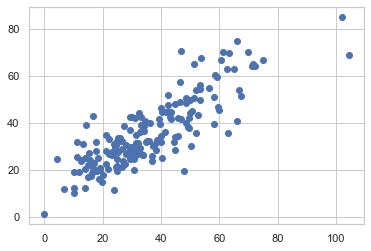

In [207]:
plt.scatter(y.values,predictions)

In [208]:
from sklearn.metrics import r2_score

In [209]:
r2_score(y.values, predictions)

0.7085602386002157

In [210]:
actual = pd.Series(y.values)
predicted = pd.Series(predictions.reshape(173))

In [211]:
result = pd.concat([actual,predicted],axis=1)

In [212]:
result.columns=['actual','predicted']

In [220]:
result

,actual,predicted
0,36.300353,39.810616
1,63.129522,35.500221
2,34.998177,31.742329
3,17.735168,31.932167
4,23.407582,26.597549
...,...,...
168,45.763668,34.389465
169,40.173380,24.925629
170,50.427991,30.115379
171,19.632272,14.590762


In [221]:
result.to_csv('NN_results.csv')

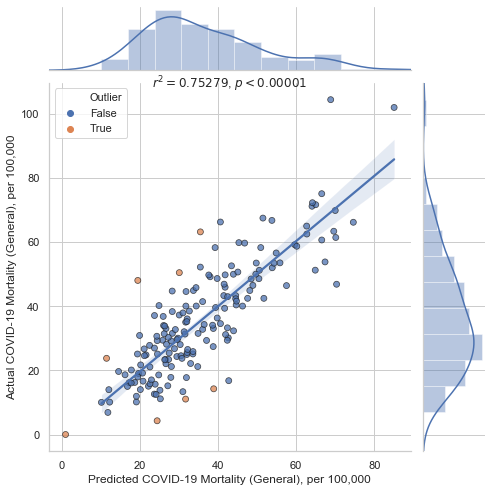

LinregressResult(slope=1.016720896520614, intercept=-0.7306785658940669, rvalue=0.8676373637360028, pvalue=2.4558718719471336e-51, stderr=0.04563506594420356)

In [222]:
corrfit(result, X="predicted", Y="actual",
        xlabel="Predicted COVID-19 Mortality (General), per 100,000",
        ylabel="Actual COVID-19 Mortality (General), per 100,000", log=(False,False), size="population", save = 'RegularizedNN1(4pca_Sigmoid0_reglu0.025_100K).jpg')

In [223]:
loss = pd.DataFrame(model.history.history)

AttributeError: 'Sequential' object has no attribute 'history'

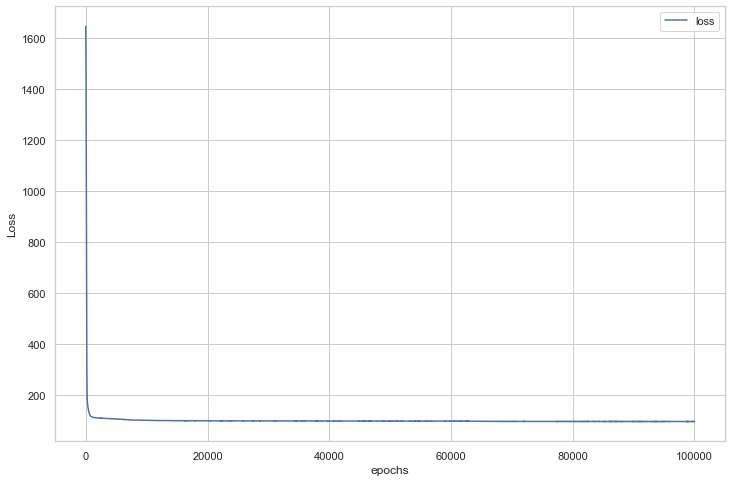

In [284]:
loss.plot(figsize=(12,8))
plt.ylabel('Loss')
plt.xlabel('epochs')
plt.savefig('RegularizedNN1(General)_4pca_reglu0.025_loss_100K.jpg')

In [246]:
def z_score(X):
    return (X - X.mean())/X.std()

In [247]:
dfz = pd.DataFrame()
mean = {}
std={}
for i in components:
    dfz[i]=z_score(df[i])
    mean[i] = df[i].mean()
    std[i] = df[i].std()

In [248]:
test = pd.DataFrame([mean])
xtest = test.to_numpy()

In [249]:
model = load_model('d_general_4pca_reglu0025_epochs100K.h5')

In [250]:
pred = model.predict(xtest).reshape(1)[0]
pred

37.72629

In [251]:
x_inc = xtest.copy()
x_inc

array([[ 7.95060870e-15, -6.65235368e-15, -8.82402693e-17,
         4.11344048e-15]])

In [252]:
def cal_range(pca):
    y={}
    centeroid = xtest.copy()
    for x in range(len(centeroid[0])):
        store=[]
        for i in np.arange(-1.0, 1.05, 0.05):
            centeroid = xtest.copy()
            centeroid[0][x] = centeroid[0][x]+std[pca[x]]*round(i,2)
            prediction = model.predict(centeroid).reshape(1)[0]
            store.append(prediction)
        y[pca[x]]= store
    return y

In [253]:
y = cal_range(components)

In [254]:
result = pd.DataFrame()

In [255]:
for i in range(4):
    result[components[i]] = y[components[i]]

In [256]:
final = (result-pred)/pred

In [257]:
ticks=[]
for i in np.arange(-1.0, 1.05, 0.05):
    ticks.append(round(i,2))

In [258]:
final['index'] = ticks

In [259]:
final = final.set_index('index')

In [260]:
final.to_csv('pca_change_d_general_4pca_reglu0025_epochs100K.csv')

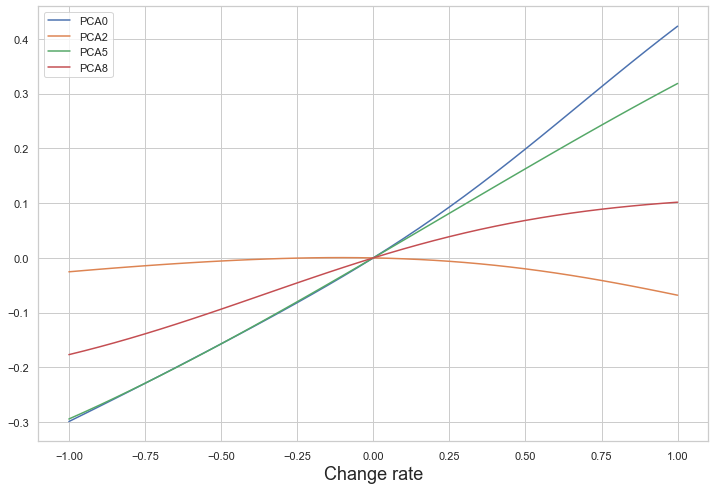

In [261]:
ax = final.plot(figsize=(12,8))
plt.xlabel('Change rate', fontsize=18)
plt.savefig('change_rate_d_general_4pca_reglu0025_epochs100K.png')